### Statistical analysis of leaderboards

- Crowdsourcing utility
- Score distribution

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import date
import ranky as rk

In [123]:
metadata = pd.read_csv('data/metadata.csv', sep='|')
df_old = pd.read_csv('data/competitions-old.csv', sep=';')
df_lisn = pd.read_csv('data/competitions-lisn.csv', sep=';')

In [125]:
metadata.head()

,title,description,participants,submissions,year,phases,reward,reward_USD,duration_day,challenge,...,ML task,dataset size,dataset details,score,metrics,multi-score,multi-task,results submission,code submission,remark
0,The Third Evaluation Workshop on Chinese Machi...,It is the sentence cloze-style machine reading...,46,248.0,2019,3.0,6500 USD,6500,87.0,https://competitions.codalab.org/competitions/...,...,machine reading comprehension,10000,NaN,QAC,"Question Accuracy (QAC),Passage Accuracy (PAC)...",True,False,True,False,https://github.com/ymcui/cmrc2019/tree/master/...
1,Pose-guided Human Rendering Benchmark Challenge,HUMBI is an ideal dataset to evaluate the abil...,12,65.0,2013,1.0,0,0,NaN,https://competitions.codalab.org/competitions/...,...,image generation,374352,"366300 train images, 7674 validation images, 3...",Mrmse,"RMSE, MRMSE, SSIM, MSSIM, ranking is based on ...",False,False,True,False,https://github.com/Gorokke/humanrender_class
2,MICCAI Multimodal Brain Tumor Segmentation (BR...,The BRaTS challenge is designed to gauge the c...,141,50.0,2013,2.0,0,0,22.0,https://competitions.codalab.org/competitions/1,...,image recognition,NaN,772 distinctive subjects,Overall Rank,"Dice score, Hausdorff distance, Sensitivity, S...",True,False,True,False,NaN
3,ChaLearn LAP 2014 - Track 1: Human Pose Recovery,"More than 8,000 frames of continuous RGB seque...",100,25.0,2014,2.0,1000 USD,1000,108.0,https://competitions.codalab.org/competitions/971,...,image recognition,8234,"4,000 dev labelled frames, 2,000 validation la...",Overlap,Jaccard Index (overlapping),False,False,True,True,NaN
4,ChaLearn LAP 2014 - Track 2: Action Recognition,Recognizing actions/interactions using 235 per...,108,36.0,2014,2.0,1000 USD,1000,108.0,https://competitions.codalab.org/competitions/981,...,image recognition,NaN,235 action samples performed by 17 actors,Overlap,Jaccard Index (overlapping),False,False,True,True,NaN


In [90]:
def is_ordered(df, col):
    # Check if the column is in ascending order
    ascending = (df[col] == df[col].sort_values().values).all()
    # Check if the column is in descending order
    descending = (df[col] == df[col].sort_values(ascending=False).values).all()
    return ascending or descending

def select_main_column(df):
    for col in df.columns:
        if col != '<Rank>' and is_ordered(df, col):
            return col
    return None

def utility(df):
    col = df[select_main_column(df)]
    # Lower is better?
    first = col.iloc[0]
    last = col.iloc[-1]
    desc = first >= last
    # Computation
    if desc:
        u = col.max() / col.mean()
    else:
        #u = (1 - col.max()) / (1 - col.mean())
        u = 0 # not taken into account for now
    return u

In [99]:
def compute_utilities(df, base_path):
    nrows = df.shape[0]
    res = []
    for i in range(nrows): # loop on rows
        row = df.iloc[i]
        cid = row[' id']
        phases_id = row[' phases_id'].split(',')
        max_n = 0
        u = 0 # if 0, no utility computed
        for phase in phases_id:
            phase = int(phase)
            path = os.path.join(base_path, str(cid) + '_' + str(phase) + '.csv')
            try:
                leaderboard = rk.read_codalab_csv(path)
                n = df.shape[0] # nb participants of the phase
                if n >= max_n: # max or last phase
                    u = utility(leaderboard)
                    max_n = n
            except Exception as e:
                pass
                #print('Error: {}'.format(path))
                #print(e)
        res.append(u)
        if u < 1:
            u = 0 # not taken into account for now
    return res

In [101]:
df_lisn['utility'] = compute_utilities(df_lisn, 'data/leaderboard_data_lisn')
df_old['utility'] = compute_utilities(df_old, 'data/leaderboard_data_old')

/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: divide by zero encountered in double_scal

/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()
/var/folders/48/4n4hcp112zbdf81wrzbqmc3c0000gn/T/ipykernel_14593/1779719616.py:22: RuntimeWarning: invalid value encountered in double_scalars
  u = col.max() / col.mean()


In [102]:
df_old.head()

,title,url,id,phases_id,utility
0,ChaLearn Looking at People 2014 - Track 2: Act...,https://competitions.codalab.org/competitions...,981,"1561,1571",2.079579
1,ChaLearn Looking at People 2014 - Track 1: Hum...,https://competitions.codalab.org/competitions...,971,"1541,1551",1.829352
2,ChaLearn Looking at People 2014 - Track 3: Ges...,https://competitions.codalab.org/competitions...,991,"1581,1591",1.360556
3,The MICCAI 2014 Machine Learning Challenge,https://competitions.codalab.org/competitions...,1471,2441,-0.098874
4,ChaLearn Looking at People 2015 - Track 2: Act...,https://competitions.codalab.org/competitions...,2241,"4151,4161",1.000000


In [103]:
df_lisn.head()

,title,url,id,phases_id,utility
0,The 1st Large-scale Video Object Segmentation ...,https://codalab.lisn.upsaclay.fr/competitions...,7685,"12647,12648",1.148835
1,The 2nd Large-scale Video Object Segmentation ...,https://codalab.lisn.upsaclay.fr/competitions...,7682,"12641,12642",1.788641
2,The 2nd Large-scale Video Object Segmentation ...,https://codalab.lisn.upsaclay.fr/competitions...,7683,"12644,12645",1.265194
3,The 2nd Large-scale Video Object Segmentation ...,https://codalab.lisn.upsaclay.fr/competitions...,6066,"9139,9141",1.118656
4,The 2nd Large-scale Video Object Segmentation ...,https://codalab.lisn.upsaclay.fr/competitions...,6064,"9134,9137",1.268448


In [112]:
#metadata.head()

In [117]:
def extract_id_and_get_utility(url, utility_df):
    # split the urls by semi-colon
    urls = url.split(';')
    # extract ids
    ids = [url.split('/')[-1] for url in urls]
    # convert 'id' column in utility_df to string
    utility_df[' id'] = utility_df[' id'].astype(str)
    # get utility values
    utilities = [utility_df.loc[utility_df[' id'] == id, 'utility'].values[0] for id in ids if id in utility_df[' id'].values]
    return utilities

# concatenate the two 'id'/'utility' dataframes
utility_df = pd.concat([df_old, df_lisn])

metadata['utility'] = metadata['challenge'].apply(lambda x: extract_id_and_get_utility(x, utility_df))


In [122]:
metadata['utility'].head()

0    [1.1760304486375888]
1     [1.192140697304481]
2                   [0.0]
3    [1.8293515358361774]
4     [2.079578859873935]
Name: utility, dtype: object

In [120]:
metadata.to_csv('data/metadata-utility.csv', sep='|', index=False)

### Aleksandra's work

In [14]:
def check_score(db):
    score_column = db.columns[0]
    cols_check=list(db.columns[::-1])
    for col in cols_check:
        '''
        if col=='<Rank>':
            #cols_check.remove(col)
            break
        '''
        db[col] = db[col].apply(lambda x: x.split(' ')[0]).astype(float)
        if (db[col].is_monotonic_increasing==True and db[col].is_monotonic_decreasing==False) or \
            (db[col].is_monotonic_increasing==False and db[col].is_monotonic_decreasing==True):
            score_column=col
        if db[score_column].is_monotonic_increasing==True:
            score_function="min"
        elif db[score_column].is_monotonic_decreasing==True:
            score_function="max"
        else:
            score_function = None
            
    return score_column, score_function

In [15]:
def score_db(folder):
    df = pd.DataFrame(columns = ['link', 'utility_mean', 'utility_median'])
    #df for competitions with score to maximise
    df_max = pd.DataFrame(columns = ['link', 'utility_mean', 'utility_median'])

    for f in os.listdir(folder):
        print("___________________")
        print(f)
        index_file = f.find("_")
        try:
            lb = pd.read_csv(folder + "/" + f, sep=',', index_col=False)
            if lb.shape[0] > 5 :
                lb = lb.drop(['submission_pk','User'],axis=1)
                print(lb.head(3))

                metric_column, score_function=check_score(lb)
                lb[metric_column].plot(kind = 'hist', grid = True, \
                                title = 'Hist for compet'+ '_' + f + '_' + metric_column + ', score to ' + score_function)
                plt.show()

                print("metric_column: ", metric_column, ", score_function: ",score_function)

                if score_function=="max":
                    u1 = lb[metric_column].max()/lb[metric_column].mean()
                    u2 = lb[metric_column].max()/lb[metric_column].median()
                    df_max.loc[f[:index_file]] = ['https://competitions.codalab.org/competitions/' + \
                                                  f[:index_file], u1, u2]
                elif score_function=="min":
                    u1 = lb[metric_column].mean()/lb[metric_column].min()
                    u2 = lb[metric_column].median()/lb[metric_column].min()


                print("Utility w/mean = ", u1)
                print("Utility w/median = ", u2)

                df.loc[f[:index_file]] = ['https://competitions.codalab.org/competitions/' + f[:index_file], \
                                          u1, u2]
        except:
            print('File cannot be opened:', f)
    
    today = date.today()
    df.to_csv('data/leaderboard_histograms_fixed_'+ str(today) +'.csv', index = True)
    df_max.to_csv('data/leaderboard_histograms_fixed_'+ str(today) +'_MAX'+'.csv', index = True)    
    
    return df, df_max


## check on few samples

___________________
10261_19961.csv
  Prediction consistency (CVGTCE), % Standard error (GTE), %
0                         3.4767 (1)              4.5623 (1)
1                         3.9700 (2)              5.8835 (2)
2                         4.9488 (3)              6.2071 (3)


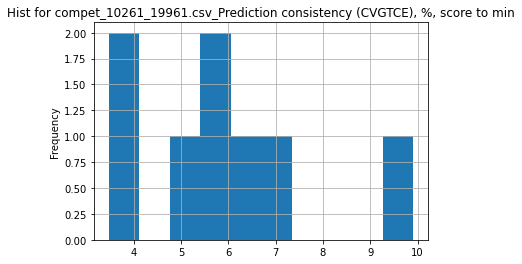

metric_column:  Prediction consistency (CVGTCE), % , score_function:  min
Utility w/mean =  1.6891700463082806
Utility w/median =  1.634998705669169
___________________
10261_26719.csv
File cannot be opened: 10261_26719.csv
___________________
10751_20801.csv
      <Rank>        AVG Extraversion Agreeableness Conscientiousness  \
0  2.00 (10)  0.915 (1)    0.919 (1)     0.914 (4)         0.914 (2)   
1   3.00 (8)  0.911 (4)    0.913 (2)     0.916 (2)         0.906 (4)   
2   2.50 (9)  0.914 (2)    0.913 (3)     0.917 (1)         0.916 (1)   

  Neuroticism   Openness Coopetition  
0   0.912 (1)  0.914 (1)   0.000 (3)  
1   0.909 (4)  0.912 (3)   1.000 (2)  
2   0.910 (2)  0.914 (2)   0.000 (3)  


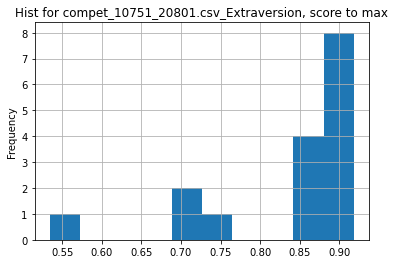

metric_column:  Extraversion , score_function:  max
Utility w/mean =  1.0938848385656894
Utility w/median =  1.044318181818182
___________________
10751_20811.csv
     <Rank>        AVG Extraversion Agreeableness Conscientiousness  \
0  1.50 (5)  0.913 (1)    0.918 (1)     0.907 (2)         0.915 (1)   
1  1.50 (5)  0.912 (2)    0.916 (2)     0.911 (1)         0.914 (2)   
2  2.00 (4)  0.903 (3)    0.904 (3)     0.905 (3)         0.901 (3)   

  Neuroticism   Openness Coopetition  
0   0.911 (1)  0.914 (1)   0.000 (2)  
1   0.910 (2)  0.911 (2)   1.000 (1)  
2   0.900 (3)  0.904 (3)   1.000 (1)  


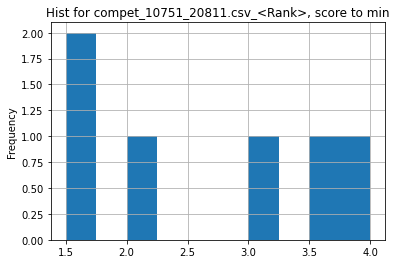

metric_column:  <Rank> , score_function:  min
Utility w/mean =  1.7222222222222223
Utility w/median =  1.6666666666666667
___________________
1471_2441.csv
  Mean Accuracy Std Accuracy Accuracy - Reported 5-fold CV    Mean AUC  \
0     0.680 (1)   0.047 (50)                    0.660 (29)   0.700 (2)   
1     0.670 (2)   0.047 (49)                     0.807 (3)   0.689 (5)   
2     0.660 (3)   0.047 (48)                    0.730 (12)  0.660 (13)   

      Std AUC AUC - Reported 5-fold CV  
0  0.053 (26)               0.729 (21)  
1  0.053 (25)                0.877 (3)  
2  0.055 (20)                0.810 (7)  
File cannot be opened: 1471_2441.csv
___________________
5181_10971.csv
          AP AP IoU=.50 AP IoU=.75   AP small  AP medium   AP large  \
0  0.525 (1)  0.717 (1)  0.578 (1)  0.352 (1)  0.550 (1)  0.642 (2)   
1  0.519 (2)  0.704 (3)  0.570 (2)  0.342 (2)  0.548 (2)  0.647 (1)   
2  0.514 (3)  0.694 (4)  0.563 (4)  0.336 (4)  0.540 (3)  0.639 (3)   

    AR max=1  AR max=10 AR

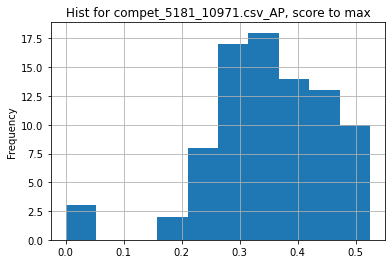

metric_column:  AP , score_function:  max
Utility w/mean =  1.501514131897712
Utility w/median =  1.5350877192982455
___________________
dump
File cannot be opened: dump
       utility_mean  utility_median
count      3.000000        3.000000
mean       1.637635        1.612251
std        0.119037        0.068676
min        1.501514        1.535088
25%        1.595342        1.585043
50%        1.689170        1.634999
75%        1.705696        1.650833
max        1.722222        1.666667
       utility_mean  utility_median
count      2.000000        2.000000
mean       1.297699        1.289703
std        0.288237        0.347026
min        1.093885        1.044318
25%        1.195792        1.167011
50%        1.297699        1.289703
75%        1.399607        1.412395
max        1.501514        1.535088


In [16]:
small_db, small_db_max = score_db("data/leaderboard_data - Copie")
print(small_db.describe())
print(small_db_max.describe())

## all leaderboard data

___________________
10261_19951.csv
___________________
10261_19961.csv
  Prediction consistency (CVGTCE), % Standard error (GTE), %
0                         3.4767 (1)              4.5623 (1)
1                         3.9700 (2)              5.8835 (2)
2                         4.9488 (3)              6.2071 (3)


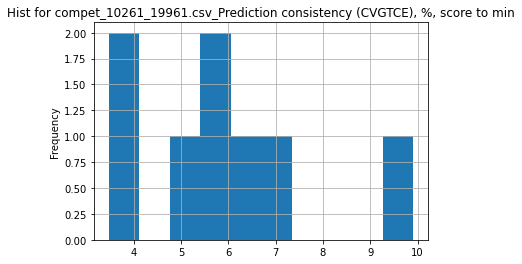

metric_column:  Prediction consistency (CVGTCE), % , score_function:  min
Utility w/mean =  1.6891700463082806
Utility w/median =  1.634998705669169
___________________
10261_26719.csv
File cannot be opened: 10261_26719.csv
___________________
10331_20051.csv
       Accuracy
0  0.436203 (1)
1  0.392289 (2)
2  0.329530 (3)


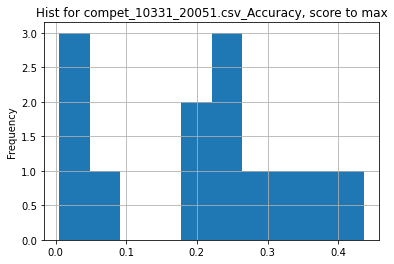

metric_column:  Accuracy , score_function:  max
Utility w/mean =  2.0899055668147133
Utility w/median =  1.8730483846034935
___________________
10331_20061.csv
___________________
10341_20071.csv
___________________
10341_20081.csv
___________________
10581_20521.csv
___________________
10581_20531.csv
___________________
10751_20801.csv
      <Rank>        AVG Extraversion Agreeableness Conscientiousness  \
0  2.00 (10)  0.915 (1)    0.919 (1)     0.914 (4)         0.914 (2)   
1   3.00 (8)  0.911 (4)    0.913 (2)     0.916 (2)         0.906 (4)   
2   2.50 (9)  0.914 (2)    0.913 (3)     0.917 (1)         0.916 (1)   

  Neuroticism   Openness Coopetition  
0   0.912 (1)  0.914 (1)   0.000 (3)  
1   0.909 (4)  0.912 (3)   1.000 (2)  
2   0.910 (2)  0.914 (2)   0.000 (3)  


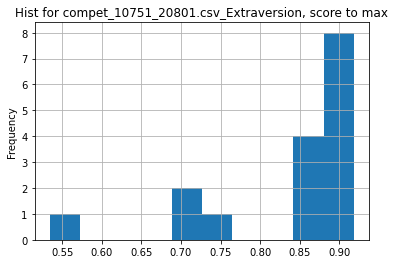

metric_column:  Extraversion , score_function:  max
Utility w/mean =  1.0938848385656894
Utility w/median =  1.044318181818182
___________________
10751_20811.csv
     <Rank>        AVG Extraversion Agreeableness Conscientiousness  \
0  1.50 (5)  0.913 (1)    0.918 (1)     0.907 (2)         0.915 (1)   
1  1.50 (5)  0.912 (2)    0.916 (2)     0.911 (1)         0.914 (2)   
2  2.00 (4)  0.903 (3)    0.904 (3)     0.905 (3)         0.901 (3)   

  Neuroticism   Openness Coopetition  
0   0.911 (1)  0.914 (1)   0.000 (2)  
1   0.910 (2)  0.911 (2)   1.000 (1)  
2   0.900 (3)  0.904 (3)   1.000 (1)  


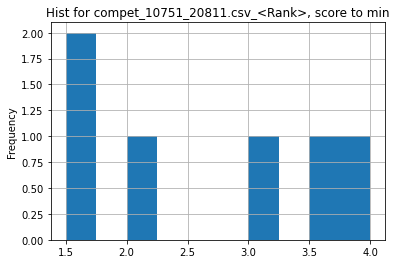

metric_column:  <Rank> , score_function:  min
Utility w/mean =  1.7222222222222223
Utility w/median =  1.6666666666666667
___________________
10851_20961.csv
File cannot be opened: 10851_20961.csv
___________________
10851_20971.csv
File cannot be opened: 10851_20971.csv
___________________
11161_21541.csv
  FinalNDCG (weighted average) SearchNDCG (query-full; textual queries)  \
0                   0.3878 (2)                               0.5357 (1)   
1                   0.3660 (3)                               0.4783 (2)   
2                   0.4016 (1)                               0.4381 (3)   

  CategoryNDCG (query-less; category facets)  
0                                 0.3509 (2)  
1                                 0.3380 (6)  
2                                 0.3924 (1)  


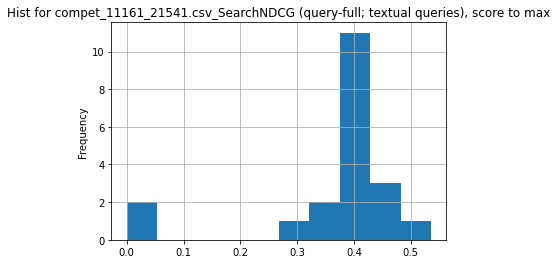

metric_column:  SearchNDCG (query-full; textual queries) , score_function:  max
Utility w/mean =  1.4863215137894674
Utility w/median =  1.395052083333333
___________________
11161_21551.csv
  FinalNDCG (weighted average) SearchNDCG (query-full; textual queries)  \
0                   0.4262 (1)                               0.5574 (1)   
1                  0.2907 (11)                               0.5360 (2)   
2                   0.4149 (2)                               0.5301 (3)   

  CategoryNDCG (query-less; category facets)  
0                                 0.3935 (1)  
1                                0.2293 (11)  
2                                 0.3861 (3)  


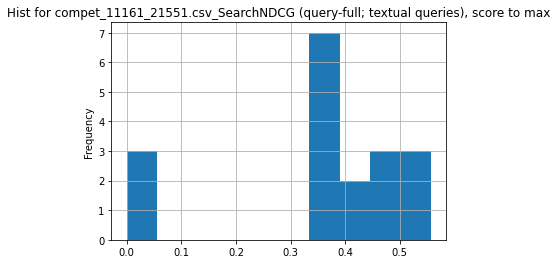

metric_column:  SearchNDCG (query-full; textual queries) , score_function:  max
Utility w/mean =  1.5603975178463116
Utility w/median =  1.458780423972782
___________________
11171_21561.csv
                 F1         Precision             Recall
0  0.2152353421 (9)  0.4685358255 (1)  0.1397068386 (20)
1  0.4182668356 (1)  0.3949296890 (2)   0.4445352704 (2)
2  0.4032624610 (3)  0.3903826087 (3)   0.4170211975 (5)


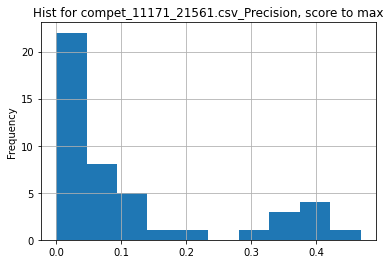

metric_column:  Precision , score_function:  max
Utility w/mean =  4.007052341949867
Utility w/median =  9.042987135445832
___________________
11171_21571.csv
                 F1         Precision             Recall
0  0.3851214625 (7)  0.4154971232 (1)  0.3588845643 (10)
1  0.4255321060 (3)  0.4119391304 (2)   0.4400527621 (6)
2  0.4149406605 (6)  0.4058167932 (3)   0.4244842225 (7)


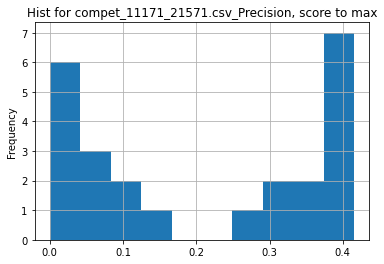

metric_column:  Precision , score_function:  max
Utility w/mean =  1.9930425199210162
Utility w/median =  2.041450865411873
___________________
11191_21611.csv
___________________
11191_21621.csv
___________________
11491_21761.csv
     ACCURACY
0  81.730 (1)
1  78.150 (2)
2  75.170 (3)


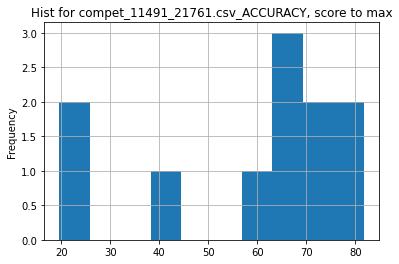

metric_column:  ACCURACY , score_function:  max
Utility w/mean =  1.4017556442559564
Utility w/median =  1.2556460285758182
___________________
11531_21821.csv
___________________
11691_21931.csv
___________________
11711_21941.csv
File cannot be opened: 11711_21941.csv
___________________
11711_21951.csv
___________________
12061_22541.csv
          AP AP OKS=.50 AP OKS=.75  AP medium   AP large         AR  \
0  0.811 (1)  0.950 (1)  0.882 (1)  0.778 (1)  0.860 (1)  0.856 (1)   
1  0.808 (2)  0.949 (2)  0.881 (2)  0.774 (2)  0.857 (2)  0.853 (2)   
2  0.800 (3)  0.942 (3)  0.871 (3)  0.767 (3)  0.854 (3)  0.848 (3)   

  AR OKS=.50 AR OKS=.75  AR medium   AR large  
0  0.973 (1)  0.918 (1)  0.822 (2)  0.903 (1)  
1  0.973 (1)  0.915 (2)  0.817 (3)  0.901 (2)  
2  0.970 (2)  0.910 (3)  0.811 (4)  0.899 (3)  


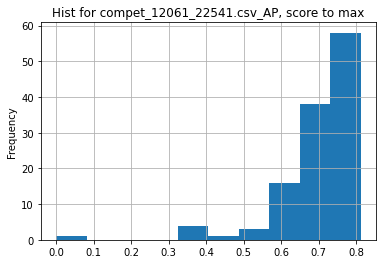

metric_column:  AP , score_function:  max
Utility w/mean =  1.168198376229137
Utility w/median =  1.1201657458563536
___________________
12061_23041.csv
File cannot be opened: 12061_23041.csv
___________________
12061_30196.csv
File cannot be opened: 12061_30196.csv
___________________
1381_2341.csv
___________________
1381_2351.csv
___________________
1381_2751.csv
___________________
1471_2441.csv
  Mean Accuracy Std Accuracy Accuracy - Reported 5-fold CV    Mean AUC  \
0     0.680 (1)   0.047 (50)                    0.660 (29)   0.700 (2)   
1     0.670 (2)   0.047 (49)                     0.807 (3)   0.689 (5)   
2     0.660 (3)   0.047 (48)                    0.730 (12)  0.660 (13)   

      Std AUC AUC - Reported 5-fold CV  
0  0.053 (26)               0.729 (21)  
1  0.053 (25)                0.877 (3)  
2  0.055 (20)                0.810 (7)  


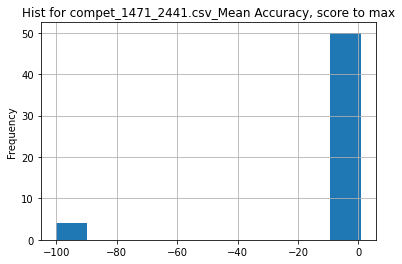

metric_column:  Mean Accuracy , score_function:  max
Utility w/mean =  -0.09887446819968766
Utility w/median =  1.192982456140351
___________________
15261_26571.csv
___________________
15333_26693.csv
  PercentageScore
0    0.656334 (1)
1    0.654730 (2)
2    0.629075 (3)


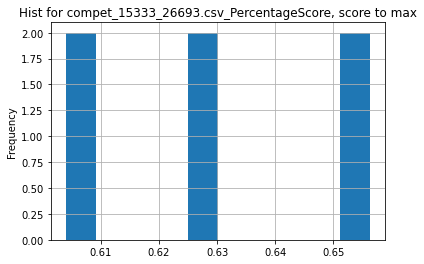

metric_column:  PercentageScore , score_function:  max
Utility w/mean =  1.0433313233285255
Utility w/median =  1.045552371288067
___________________
15333_26694.csv
  PercentageScore
0    0.934437 (1)
1    0.903246 (2)
2    0.856779 (3)
File cannot be opened: 15333_26694.csv
___________________
15333_26695.csv
  PercentageScore
0    0.866382 (1)
1    0.850267 (2)
2    0.776056 (3)


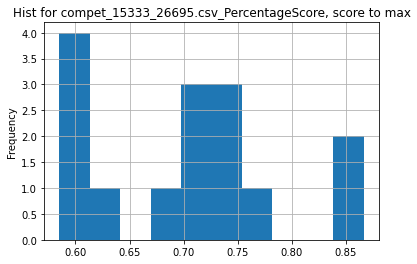

metric_column:  PercentageScore , score_function:  max
Utility w/mean =  1.2346496869989714
Utility w/median =  1.2087999787925423
___________________
15349_26715.csv
  Prediction score   Duration
0       1.0000 (1)  2.01 (12)
1       1.0000 (1)  2.01 (32)
2       1.0000 (1)   2.01 (5)


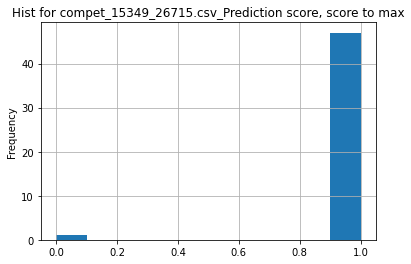

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.021276595744681
Utility w/median =  1.0
___________________
15349_26716.csv
  Prediction score   Duration
0       1.0000 (1)   4.01 (1)
1       1.0000 (1)  2.01 (10)
2       1.0000 (1)  2.01 (35)


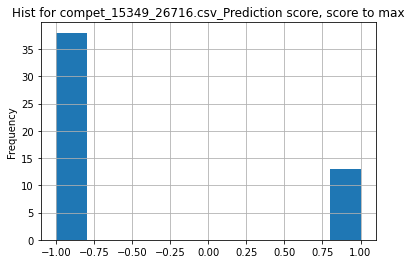

metric_column:  Prediction score , score_function:  max
Utility w/mean =  -2.0370910340034434
Utility w/median =  -1.0
___________________
15436_26859.csv
         BLEU
0  1.0000 (1)
1  0.2885 (2)
2  0.2034 (3)


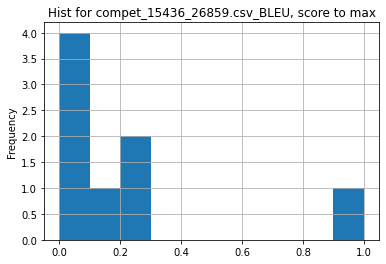

metric_column:  BLEU , score_function:  max
Utility w/mean =  4.618937644341801
Utility w/median =  9.920634920634921
___________________
15436_26860.csv
___________________
15437_26861.csv
   Bio Smatch Bio Precision  Bio Recall   NF Smatch NF Precision   NF Recall
0  0.8571 (3)    0.9558 (3)  0.7769 (3)  1.0000 (1)   1.0000 (1)  1.0000 (1)
1  0.9935 (2)    0.9937 (2)  0.9933 (2)  0.9986 (2)   0.9989 (2)  0.9984 (2)
2  0.5745 (4)    0.6723 (4)  0.5015 (4)  0.6239 (3)   0.6975 (3)  0.5643 (4)
File cannot be opened: 15437_26861.csv
___________________
15437_26862.csv
___________________
15475_26924.csv
___________________
15595_27074.csv
___________________
15595_27075.csv
___________________
15595_27076.csv
___________________
15595_27077.csv
___________________
15621_27114.csv
File cannot be opened: 15621_27114.csv
___________________
15621_27115.csv
File cannot be opened: 15621_27115.csv
___________________
15621_27116.csv
File cannot be opened: 15621_27116.csv
___________________
15

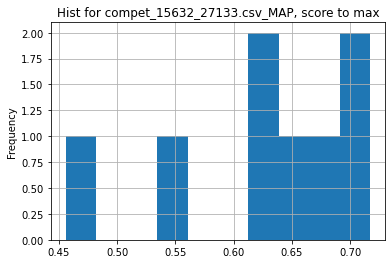

metric_column:  MAP , score_function:  max
Utility w/mean =  1.1419470435994423
Utility w/median =  1.112490302560124
___________________
15632_27134.csv
___________________
15635_27139.csv
         MAP     AvgRec         MRR
0  0.796 (1)  0.943 (1)  86.000 (1)
1  0.769 (2)  0.912 (2)  83.500 (2)
2  0.751 (3)  0.908 (3)  81.333 (3)


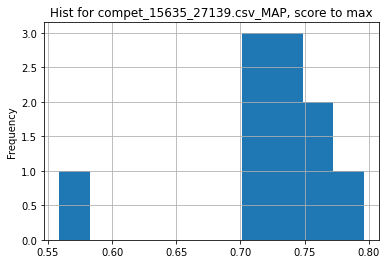

metric_column:  MAP , score_function:  max
Utility w/mean =  1.101272827891533
Utility w/median =  1.080787508486083
___________________
15635_27140.csv
___________________
15636_27141.csv
___________________
15636_27142.csv
___________________
15637_27143.csv
___________________
15637_27144.csv
___________________
15682_27233.csv
___________________
15682_27234.csv
___________________
15689_27253.csv
___________________
15689_27254.csv
___________________
15705_27275.csv
___________________
15705_27276.csv
___________________
15705_27277.csv
___________________
15706_27278.csv
___________________
15706_27279.csv
           F1      recall   precision    coverage
0  0.2775 (9)  0.2775 (9)  0.2775 (9)  1.0000 (1)
1  0.3348 (8)  0.3348 (8)  0.3348 (8)  1.0000 (1)
2  0.4462 (4)  0.4462 (4)  0.4462 (4)  1.0000 (1)


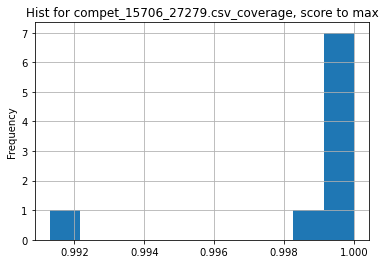

metric_column:  coverage , score_function:  max
Utility w/mean =  1.0011680293675955
Utility w/median =  1.0
___________________
15706_27280.csv
           F1      recall   precision    coverage
0  0.3792 (6)  0.3792 (6)  0.3792 (6)  1.0000 (1)
1  0.4280 (5)  0.4280 (5)  0.4280 (5)  1.0000 (1)
2  0.6845 (2)  0.6845 (2)  0.6845 (2)  1.0000 (1)


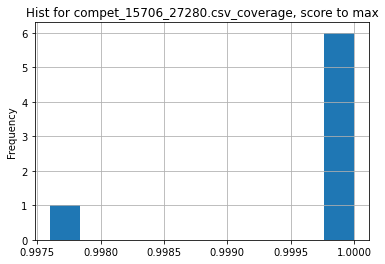

metric_column:  coverage , score_function:  max
Utility w/mean =  1.0003429747341945
Utility w/median =  1.0
___________________
15707_27281.csv
___________________
15707_27282.csv
___________________
15707_27283.csv
___________________
15885_27544.csv
     AverageF1     AverageR     Accuracy
0  1.00000 (1)  1.00000 (1)  1.00000 (1)
1  1.00000 (1)  1.00000 (1)  1.00000 (1)
2  1.00000 (1)  1.00000 (1)  1.00000 (1)


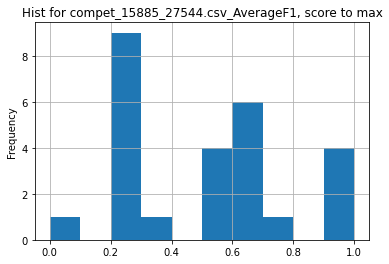

metric_column:  AverageF1 , score_function:  max
Utility w/mean =  1.9348117279357036
Utility w/median =  1.8115942028985506
___________________
15885_27545.csv
     AverageF1     AverageR     Accuracy
0  0.68500 (1)  0.68100 (1)  0.65800 (3)
1  0.67700 (2)  0.68100 (1)  0.65100 (5)
2  0.67400 (3)  0.67600 (2)  0.66100 (2)


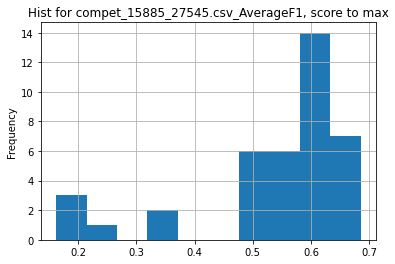

metric_column:  AverageF1 , score_function:  max
Utility w/mean =  1.2673751126713795
Utility w/median =  1.1669505962521296
___________________
15887_27548.csv
     AverageF1     AverageR     Accuracy
0  0.57100 (1)  0.60900 (1)  0.57500 (1)
1  0.54500 (2)  0.58400 (2)  0.56600 (2)
2  0.43400 (3)  0.45800 (3)  0.45300 (3)


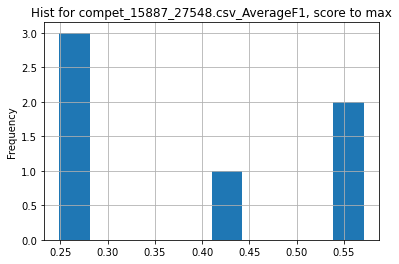

metric_column:  AverageF1 , score_function:  max
Utility w/mean =  1.4915106660861992
Utility w/median =  1.6720351390922399
___________________
15887_27549.csv
     AverageF1     AverageR     Accuracy
0  0.61000 (1)  0.58300 (1)  0.58100 (1)
1  0.57100 (2)  0.55000 (2)  0.56300 (2)
2  0.46900 (3)  0.43800 (5)  0.44500 (6)


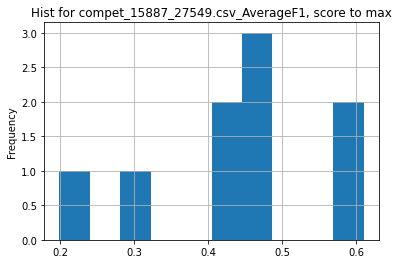

metric_column:  AverageF1 , score_function:  max
Utility w/mean =  1.3973021124968186
Utility w/median =  1.3406593406593406
___________________
15888_27550.csv
     AverageF1     AverageR     Accuracy
0  1.00000 (1)  1.00000 (1)  1.00000 (1)
1  0.82100 (2)  0.85900 (2)  0.86300 (2)
2  0.74900 (3)  0.73500 (3)  0.83700 (3)


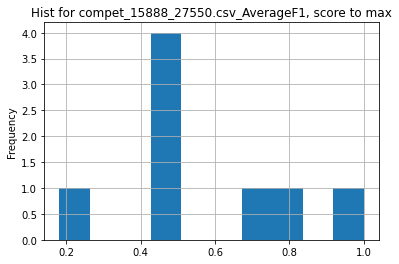

metric_column:  AverageF1 , score_function:  max
Utility w/mean =  1.76056338028169
Utility w/median =  2.1810250817884405
___________________
15888_27551.csv
     AverageF1     AverageR     Accuracy
0  0.89000 (1)  0.88200 (1)  0.89700 (1)
1  0.86100 (2)  0.85600 (2)  0.86900 (2)
2  0.85600 (3)  0.85400 (3)  0.86300 (3)


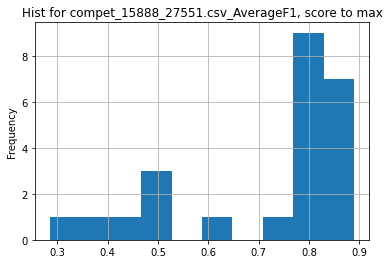

metric_column:  AverageF1 , score_function:  max
Utility w/mean =  1.2521983819908546
Utility w/median =  1.1209068010075567
___________________
15889_27552.csv
___________________
15889_27553.csv
___________________
15898_27570.csv
File cannot be opened: 15898_27570.csv
___________________
15898_27571.csv
File cannot be opened: 15898_27571.csv
___________________
15937_27630.csv
         MAE_M       MAE_mu
0  0.00000 (1)  0.00000 (1)
1  0.62100 (2)  0.57200 (4)
2  0.83900 (3)  0.47800 (2)


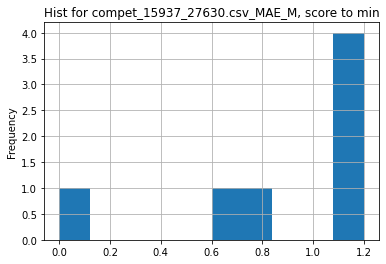

metric_column:  MAE_M , score_function:  min
File cannot be opened: 15937_27630.csv
___________________
15937_27631.csv
         MAE_M        MAE_mu
0  0.48100 (1)   0.55400 (6)
1  0.55500 (2)   0.54300 (4)
2  0.59900 (3)  0.58200 (10)


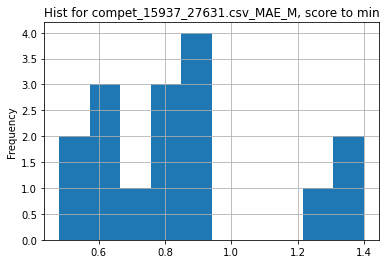

metric_column:  MAE_M , score_function:  min
Utility w/mean =  1.7797557172557175
Utility w/median =  1.7307692307692308
___________________
15938_27632.csv
           KLD           AE          RAE
0  0.02900 (1)  0.07000 (1)  0.64100 (3)
1  0.03100 (2)  0.07200 (2)  0.46600 (1)
2  0.06500 (3)  0.09400 (3)  0.49700 (2)


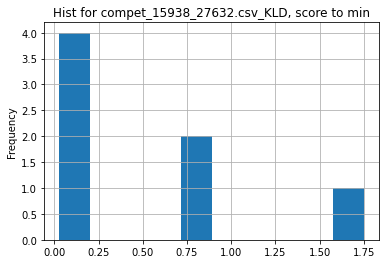

metric_column:  KLD , score_function:  min
Utility w/mean =  18.837438423645317
Utility w/median =  6.034482758620689
___________________
15938_27633.csv
           KLD           AE          RAE
0  0.03600 (1)  0.08000 (1)  0.59800 (1)
1  0.04800 (2)  0.09500 (2)  0.84800 (2)
2  0.05000 (3)  0.09600 (3)  1.05700 (5)


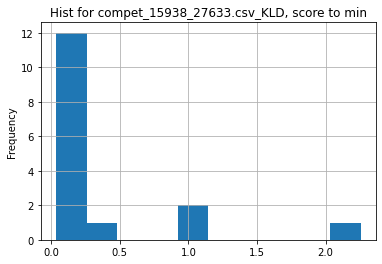

metric_column:  KLD , score_function:  min
Utility w/mean =  10.197916666666668
Utility w/median =  2.361111111111111
___________________
15939_27634.csv
___________________
15939_27635.csv
           EMD
0  0.24500 (1)
1  0.26900 (2)
2  0.27300 (3)


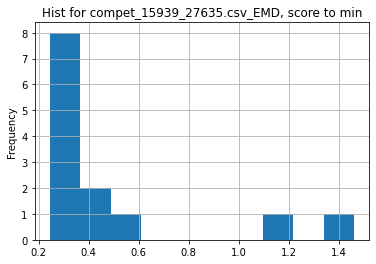

metric_column:  EMD , score_function:  min
Utility w/mean =  2.034850863422292
Utility w/median =  1.4285714285714286
___________________
15940_27636.csv
___________________
15940_27637.csv
___________________
15961_27667.csv
___________________
15962_27668.csv
___________________
15967_27672.csv
___________________
15967_27673.csv
___________________
15968_27674.csv
___________________
15968_27675.csv
___________________
15971_27680.csv
  Misclassification
0     76.071429 (1)
1     79.600000 (2)
2     79.885714 (3)


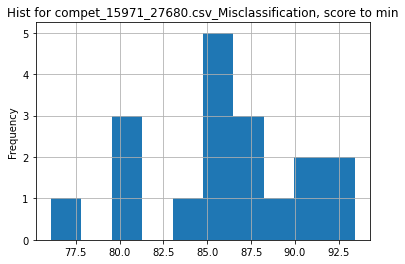

metric_column:  Misclassification , score_function:  min
Utility w/mean =  1.1319666086461977
Utility w/median =  1.1344600875053894
___________________
15971_27681.csv
___________________
15972_27682.csv
___________________
15972_27683.csv
___________________
15975_27688.csv
      interview agreeableness conscientiousness  extraversion   neuroticism  \
0  0.919782 (1)  0.916108 (2)      0.916633 (2)  0.920557 (1)  0.914871 (1)   
1  0.918974 (2)  0.916589 (1)      0.916639 (1)  0.917503 (2)  0.912992 (2)   
2  0.916360 (3)  0.913778 (5)      0.913487 (3)  0.909268 (5)  0.909370 (4)   

       openness  
0  0.916935 (1)  
1  0.913846 (2)  
2  0.901004 (7)  


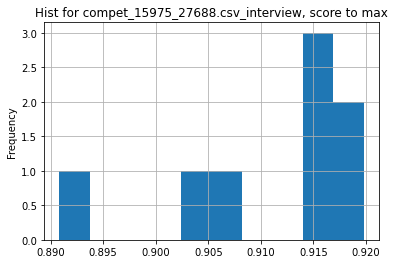

metric_column:  interview , score_function:  max
Utility w/mean =  1.00989076595587
Utility w/median =  1.0044928948046672
___________________
15975_27689.csv
___________________
15975_28090.csv
___________________
15975_28092.csv
___________________
15984_27698.csv
___________________
16051_27789.csv
___________________
16051_28006.csv
File cannot be opened: 16051_28006.csv
___________________
16051_28084.csv
___________________
16171_27929.csv
___________________
16171_27930.csv
___________________
16173_27933.csv
___________________
16173_27934.csv
___________________
16194_27965.csv
___________________
16194_27966.csv
___________________
16194_27967.csv
___________________
16194_27968.csv
   FMEASURE  ACCURACY MATHEWSCC          R2   VARSCORE
0  0.57 (1)  0.99 (1)  0.58 (1)   -2.77 (2)  -0.97 (5)
1  0.45 (2)  0.99 (3)  0.47 (3)  -15.07 (5)  -3.75 (7)
2  0.42 (3)  0.99 (4)  0.44 (4)   -5.38 (3)   0.09 (2)


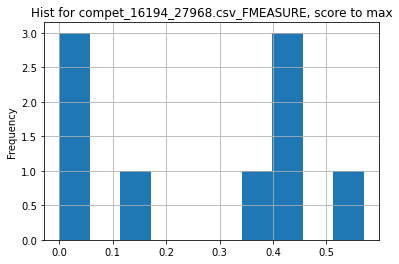

metric_column:  FMEASURE , score_function:  max
Utility w/mean =  2.164556962025316
Utility w/median =  1.6285714285714286
___________________
16283_28099.csv
  Prediction score
0       0.7200 (1)
1       0.7018 (2)
2       0.6909 (3)


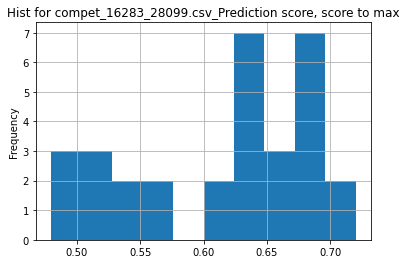

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.1647141701672452
Utility w/median =  1.1187072715972655
___________________
16283_28100.csv
___________________
16303_28137.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  34.955 (1)  0.9400 (1)           17.290 (26)           0.0 (2)   
1  34.750 (2)  0.9384 (2)             1.300 (9)           0.0 (2)   
2  34.491 (3)  0.9363 (4)            5.590 (18)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            1.0 (1)  
2                            0.0 (2)  


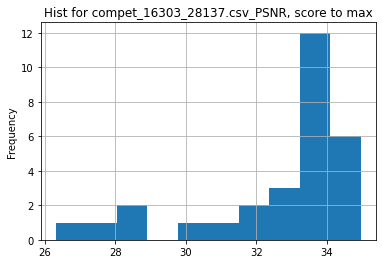

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0700547855551918
Utility w/median =  1.0395539033457248
___________________
16303_28138.csv
___________________
16304_28139.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  31.257 (1)  0.8788 (1)            8.670 (15)           0.0 (2)   
1  31.020 (2)  0.8744 (2)             0.500 (7)           0.0 (2)   
2  30.977 (3)  0.8742 (3)           97.980 (18)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


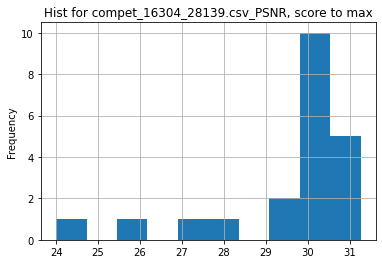

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0550411233249701
Utility w/median =  1.0312778382658616
___________________
16304_28140.csv
___________________
16305_28141.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  29.269 (1)  0.8255 (1)            5.780 (15)           0.0 (2)   
1  29.164 (2)  0.8231 (2)            1.500 (10)           0.0 (2)   
2  28.989 (3)  0.8187 (4)            5.040 (14)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            1.0 (1)  
2                            0.0 (2)  


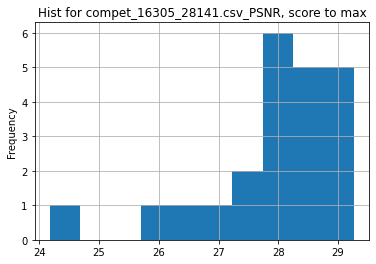

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0460091456233402
Utility w/median =  1.0372089726779827
___________________
16305_28142.csv
___________________
16306_28143.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  33.956 (1)  0.9244 (1)             1.300 (6)           0.0 (2)   
1  33.799 (2)  0.9232 (2)            5.490 (13)           0.0 (2)   
2  33.623 (3)  0.9209 (3)             0.360 (4)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            0.0 (2)  


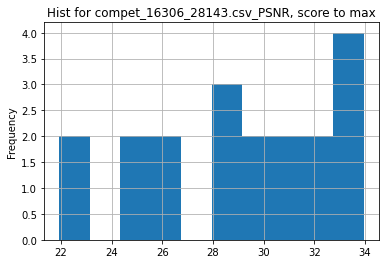

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1626692425107994
Utility w/median =  1.1388898205601208
___________________
16306_28144.csv
___________________
16307_28145.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  30.597 (1)  0.8649 (1)             0.500 (7)           0.0 (2)   
1  30.530 (2)  0.8636 (3)            1.600 (10)           0.0 (2)   
2  30.520 (3)  0.8638 (2)             0.140 (2)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (1)  
1                            0.0 (1)  
2                            0.0 (1)  


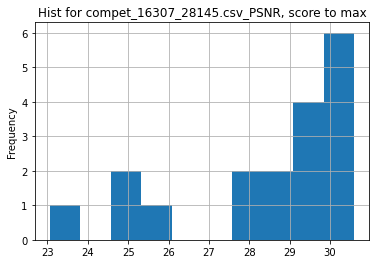

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0779348126053234
Utility w/median =  1.0508655035032286
___________________
16307_28146.csv
___________________
16308_28147.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  28.856 (1)  0.8114 (1)            3.000 (12)           0.0 (2)   
1  28.581 (2)  0.8043 (3)             0.150 (2)           0.0 (2)   
2  28.570 (3)  0.8057 (2)            4.170 (13)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            0.0 (2)  


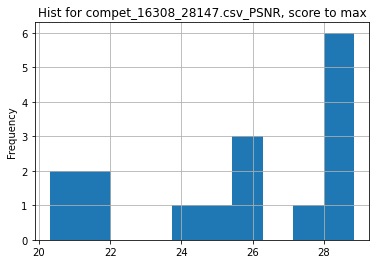

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1261152711041733
Utility w/median =  1.1098674974518743
___________________
16308_28148.csv
___________________
16380_28264.csv
  avg_pearson avg_spearman anger_pearson anger_spearman fear_pearson  \
0   0.652 (1)    0.645 (1)     0.613 (3)      0.570 (4)    0.638 (1)   
1   0.640 (2)    0.643 (2)     0.586 (6)      0.584 (1)    0.625 (2)   
2   0.626 (3)    0.606 (3)     0.631 (1)      0.570 (3)    0.603 (3)   

  fear_spearman joy_pearson joy_spearman sadness_pearson sadness_spearman  
0     0.593 (2)   0.780 (1)    0.783 (1)       0.580 (2)        0.636 (2)  
1     0.619 (1)   0.737 (2)    0.730 (2)       0.613 (1)        0.640 (1)  
2     0.570 (3)   0.699 (5)    0.691 (4)       0.570 (3)        0.593 (4)  
File cannot be opened: 16380_28264.csv
___________________
16380_28265.csv
  avg_pearson avg_spearman anger_pearson anger_spearman fear_pearson  \
0   0.747 (1)    0.735 (1)     0.732 (1)      0.710 (1)    0.762 (1)

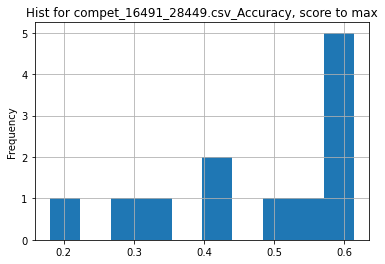

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.3113400740643832
Utility w/median =  1.1860395703918498
___________________
16491_28450.csv
___________________
16499_28457.csv
       Accuracy
0  0.514451 (1)
1  0.398779 (2)
2  0.370675 (3)


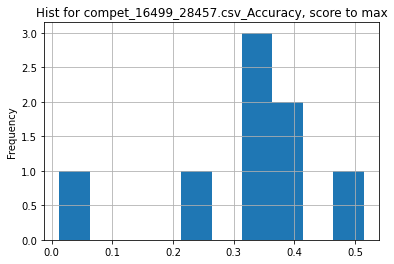

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.5804782362087646
Utility w/median =  1.4282152826650343
___________________
16499_28458.csv
___________________
16526_28502.csv
File cannot be opened: 16526_28502.csv
___________________
16526_28503.csv
File cannot be opened: 16526_28503.csv
___________________
16526_31467.csv
File cannot be opened: 16526_31467.csv
___________________
16611_28589.csv
  Perfomance rate
0      76.000 (1)
1      71.000 (2)
2      63.000 (3)


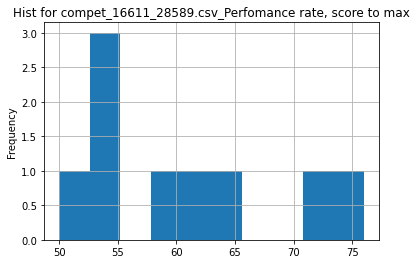

metric_column:  Perfomance rate , score_function:  max
Utility w/mean =  1.2713754646840147
Utility w/median =  1.3103448275862069
___________________
16611_28590.csv
___________________
16652_28642.csv
        Overall       Clarity   Conciseness
0  0.264026 (1)  0.212186 (1)  0.315867 (1)
1  0.264472 (2)  0.212836 (2)  0.316108 (2)
2  0.265301 (3)  0.213269 (5)  0.317332 (3)


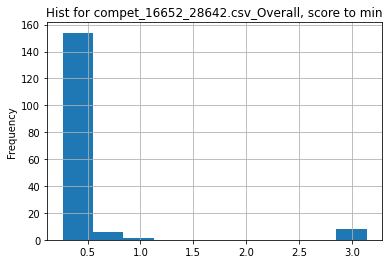

metric_column:  Overall , score_function:  min
Utility w/mean =  1.746425457381663
Utility w/median =  1.1457773098103974
___________________
16652_28643.csv
        Overall       Clarity   Conciseness
0  0.285328 (1)  0.242106 (3)  0.328551 (2)
1  0.285568 (2)  0.241735 (2)  0.329402 (3)
2  0.285625 (3)  0.242844 (6)  0.328406 (1)


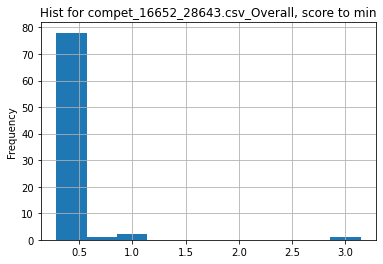

metric_column:  Overall , score_function:  min
Utility w/mean =  1.2747611905442497
Utility w/median =  1.065128553804744
___________________
16816_28877.csv
    satisfied   imprediff      revenue  interscore  intrascore
0  169.00 (1)  0.0000 (1)  66.7340 (1)  3.8950 (5)  6.8120 (3)
1  169.00 (1)  0.0010 (2)  66.4980 (2)  4.4080 (6)  8.5800 (7)
2  168.00 (2)  0.0010 (2)  65.8740 (3)  3.1270 (4)  7.1620 (4)


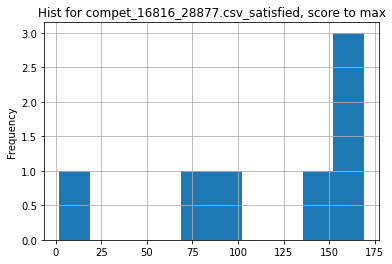

metric_column:  satisfied , score_function:  max
Utility w/mean =  1.4391727493917275
Utility w/median =  1.119205298013245
___________________
16816_28878.csv
    satisfied   imprediff      revenue   interscore   intrascore
0  260.00 (1)  0.0000 (1)  73.2620 (1)   3.2920 (4)   8.1090 (8)
1  257.00 (2)  0.0000 (1)  71.7180 (2)   4.4750 (9)  8.9610 (10)
2  243.00 (3)  0.0010 (2)  67.6150 (3)  5.3320 (10)   8.8430 (9)


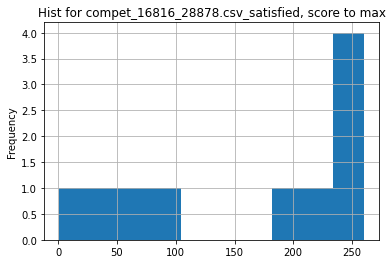

metric_column:  satisfied , score_function:  max
Utility w/mean =  1.609907120743034
Utility w/median =  1.1926605504587156
___________________
16843_28907.csv
           score
0  22563.250 (1)
1  22563.250 (1)
2  22563.250 (1)


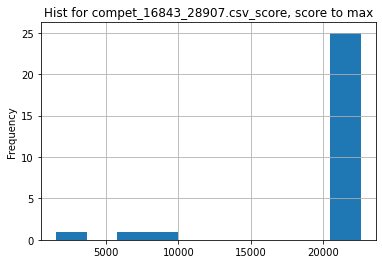

metric_column:  score , score_function:  max
Utility w/mean =  1.095238363533372
Utility w/median =  1.0
___________________
16843_28908.csv
          score
0  9556.500 (1)
1  9550.750 (2)
2  9521.500 (3)


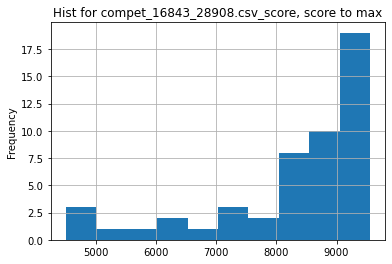

metric_column:  score , score_function:  max
Utility w/mean =  1.1568604189465326
Utility w/median =  1.0853800505409013
___________________
16929_29078.csv
         Score
0  0.77345 (1)
1  0.10144 (2)
2  0.08646 (3)
File cannot be opened: 16929_29078.csv
___________________
16929_29079.csv
         Score
0  0.04248 (1)
1  0.01651 (2)
2  0.00030 (3)
File cannot be opened: 16929_29079.csv
___________________
16931_29080.csv
File cannot be opened: 16931_29080.csv
___________________
16931_29081.csv
File cannot be opened: 16931_29081.csv
___________________
16932_29082.csv
          mAP
0  0.3641 (1)
1  0.3039 (2)
2  0.2966 (3)
File cannot be opened: 16932_29082.csv
___________________
16932_29083.csv
          mAP
0  0.3950 (1)
1  0.3441 (2)
2  0.2974 (3)
File cannot be opened: 16932_29083.csv
___________________
17001_29255.csv
___________________
17001_29256.csv
         total    aircraft    cifar100 daimlerpedcls         dtd       gtsrb  \
0  4028.32 (1)  301.12 (5)  456.08 (1)    902

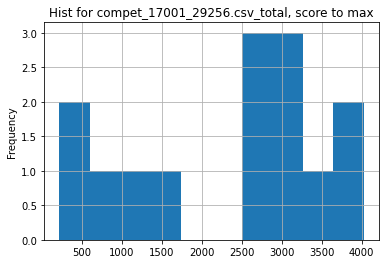

metric_column:  total , score_function:  max
Utility w/mean =  1.7037779101678387
Utility w/median =  1.4161039143655636
___________________
17052_29361.csv
File cannot be opened: 17052_29361.csv
___________________
17052_29362.csv
File cannot be opened: 17052_29362.csv
___________________
17054_29365.csv
File cannot be opened: 17054_29365.csv
___________________
17054_29366.csv
File cannot be opened: 17054_29366.csv
___________________
17094_29430.csv
   Dice per case  Dice global        VOE         RVD       ASSD         MSD  \
0            NaN          NaN        NaN         NaN        NaN         NaN   
1  Dice per case  Dice global        VOE         RVD       ASSD        MSSD   
2     0.9630 (1)   0.9670 (2)  0.071 (2)  -0.010 (9)  1.104 (1)  23.847 (1)   

        RMSD  Precision at 50% overlap  Recall at 50% overlap  \
0        NaN                       NaN                    NaN   
1       MSSD                       NaN                    NaN   
2  2.303 (1)                   

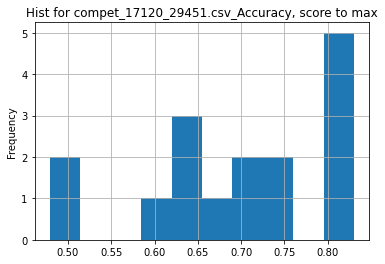

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1939697770111226
Utility w/median =  1.1664092121892993
___________________
17120_29452.csv
     Accuracy      Recall   Precision        F1
0  0.8444 (1)  0.8472 (4)  0.8404 (2)  0.84 (1)
1  0.8384 (2)  0.8266 (7)  0.8564 (1)  0.84 (2)
2  0.8340 (3)  0.8688 (1)  0.7868 (6)  0.83 (5)


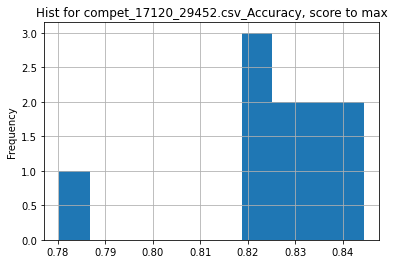

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0220780478357703
Utility w/median =  1.0180853629129494
___________________
17136_29476.csv
        SAUC           IG         NSS          CC         AUC         SIM  \
0  0.767 (1)  -0.129 (64)  1.073 (66)  0.559 (52)  0.810 (25)  0.505 (53)   
1  0.750 (2)   0.788 (26)  1.950 (25)  0.894 (14)   0.869 (1)  0.752 (35)   
2  0.748 (3)    0.911 (2)   2.036 (6)   0.907 (5)   0.869 (1)   0.793 (9)   

           KL  
0  0.776 (63)  
1  0.262 (17)  
2   0.201 (6)  


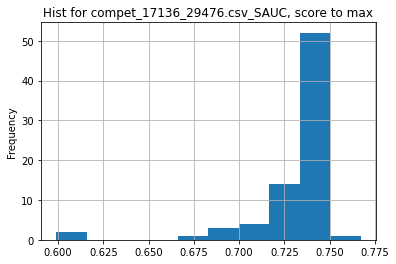

metric_column:  SAUC , score_function:  max
Utility w/mean =  1.048632812500001
Utility w/median =  1.0378890392422193
___________________
17184_29567.csv
      correct
0  0.7845 (1)
1  0.7768 (2)
2  0.7675 (3)


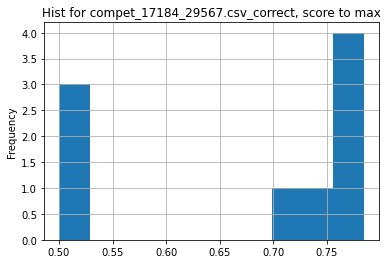

metric_column:  correct , score_function:  max
Utility w/mean =  1.1626049728305614
Utility w/median =  1.0582760016187778
___________________
17184_29568.csv
      correct
0  0.8413 (1)
1  0.8395 (2)
2  0.8227 (3)


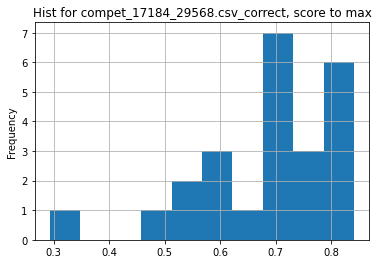

metric_column:  correct , score_function:  max
Utility w/mean =  1.227547968191435
Utility w/median =  1.1663662830999584
___________________
17184_29569.csv
File cannot be opened: 17184_29569.csv
___________________
17208_29638.csv
     full-em    full-f1 verified-em verified-f1
0  81.00 (1)  84.83 (1)   88.70 (2)   91.42 (2)
1  80.86 (2)  84.50 (2)   90.07 (1)   92.39 (1)
2  80.09 (3)  84.36 (3)   87.33 (3)   90.27 (3)


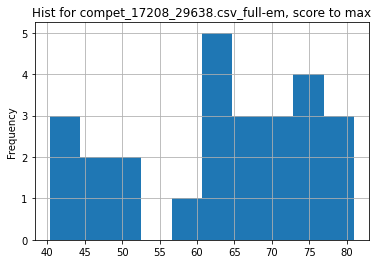

metric_column:  full-em , score_function:  max
Utility w/mean =  1.2675522278464253
Utility w/median =  1.2351326623970722
___________________
17208_29639.csv
     full-em    full-f1 verified-em verified-f1
0  82.99 (1)  87.18 (1)   90.38 (1)   92.96 (1)
1  72.17 (2)  77.36 (2)   84.40 (2)   87.11 (2)
2  69.64 (3)  73.80 (3)   83.36 (3)   85.66 (4)


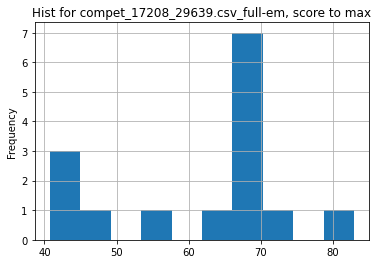

metric_column:  full-em , score_function:  max
Utility w/mean =  1.359318184299894
Utility w/median =  1.2504143438300435
___________________
17262_29821.csv
   SubTask1  SubTask2 SubTask2-relaxed  SubTask3  SubTask4
0  0.52 (1)  0.23 (1)         0.37 (1)  0.00 (4)  0.00 (3)
1  0.52 (2)  0.23 (2)         0.23 (6)  0.82 (1)  0.51 (1)
2  0.52 (2)  0.15 (8)         0.20 (8)  0.82 (1)  0.51 (1)


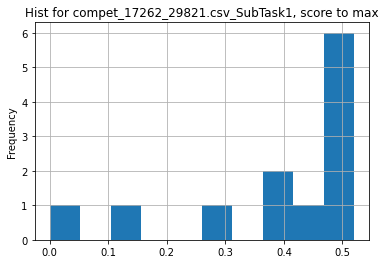

metric_column:  SubTask1 , score_function:  max
Utility w/mean =  1.3136842105263158
Utility w/median =  1.1304347826086958
___________________
17262_29822.csv
   SubTask1  SubTask2 SubTask2-relaxed  SubTask3  SubTask4
0  0.57 (1)  0.23 (5)         0.31 (7)  0.86 (1)  0.35 (1)
1  0.57 (2)  0.28 (2)         0.36 (4)  0.00 (4)  0.00 (5)
2  0.52 (3)  0.29 (1)         0.39 (1)  0.00 (4)  0.00 (5)


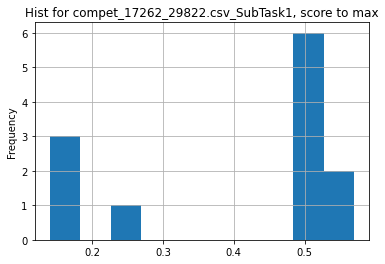

metric_column:  SubTask1 , score_function:  max
Utility w/mean =  1.3902439024390243
Utility w/median =  1.1287128712871286
___________________
17262_29823.csv
___________________
17285_29864.csv
___________________
17285_29865.csv
___________________
17285_29866.csv
___________________
17286_29867.csv
File cannot be opened: 17286_29867.csv
___________________
17286_29868.csv
File cannot be opened: 17286_29868.csv
___________________
17286_29869.csv
File cannot be opened: 17286_29869.csv
___________________
17310_29976.csv
___________________
17310_30898.csv
File cannot be opened: 17310_30898.csv
___________________
17326_30012.csv
___________________
17326_30013.csv
    correct
0  0.75 (1)
1  0.73 (2)
2  0.73 (3)


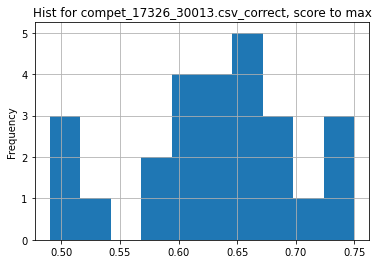

metric_column:  correct , score_function:  max
Utility w/mean =  1.1868533171028606
Utility w/median =  1.1904761904761905
___________________
17326_30014.csv
    correct
0  0.76 (1)
1  0.74 (2)
2  0.73 (3)


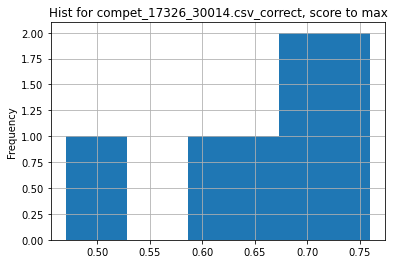

metric_column:  correct , score_function:  max
Utility w/mean =  1.1595006934812762
Utility w/median =  1.1014492753623188
___________________
17327_30015.csv
    Accuracy
0  0.703 (1)
1  0.690 (2)
2  0.684 (3)


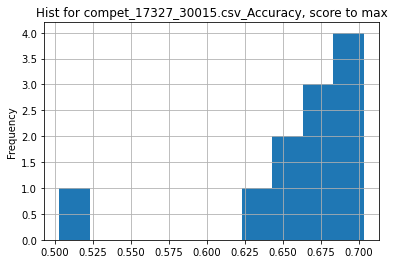

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0697191866094893
Utility w/median =  1.0430267062314538
___________________
17327_30016.csv
___________________
17327_30017.csv
___________________
17332_30036.csv
            mAP
0  0.884750 (1)
1  0.820535 (2)
2  0.814425 (3)


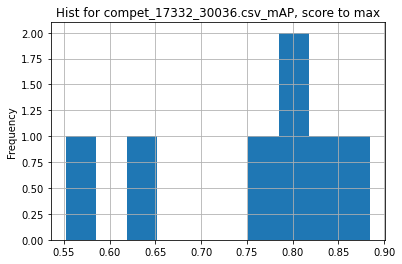

metric_column:  mAP , score_function:  max
Utility w/mean =  1.1727976466974666
Utility w/median =  1.1049761707314638
___________________
17332_30037.csv
            mAP
0  0.874122 (1)
1  0.870463 (2)
2  0.852795 (3)


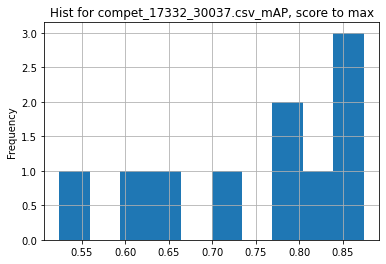

metric_column:  mAP , score_function:  max
Utility w/mean =  1.1657352088648592
Utility w/median =  1.1073904830918486
___________________
17344_30062.csv
      english     spanish
0  64.457 (1)   0.000 (5)
1  63.185 (2)  81.381 (2)
2  61.224 (3)   0.000 (5)


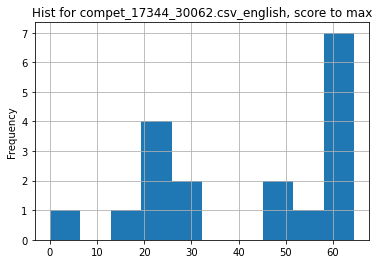

metric_column:  english , score_function:  max
Utility w/mean =  1.5617757161567876
Utility w/median =  1.3775659589019136
___________________
17344_30063.csv
___________________
17344_30064.csv
      english    spanish
0  26.839 (1)  0.000 (2)
1  24.797 (2)  0.000 (2)
2  19.595 (3)  0.000 (2)


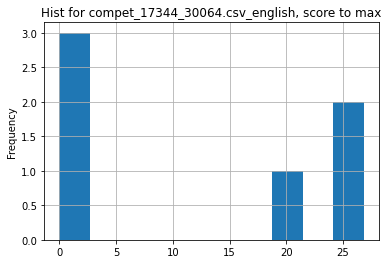

metric_column:  english , score_function:  max
Utility w/mean =  2.196856838831137
Utility w/median =  2.4775223853041632
___________________
17356_30088.csv
        AVG      SEEN     UNSEEN
0  6.80 (1)  4.64 (1)   8.59 (1)
1  6.97 (2)  4.87 (2)   8.73 (2)
2  8.11 (3)  5.67 (3)  10.14 (9)


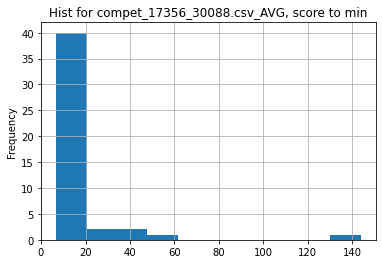

metric_column:  AVG , score_function:  min
Utility w/mean =  2.406170076726343
Utility w/median =  1.5029411764705884
___________________
17356_30089.csv
         AVG       SEEN     UNSEEN
0  10.48 (1)   8.28 (2)  12.26 (1)
1  10.51 (2)   8.21 (1)  12.37 (2)
2  13.65 (3)  11.02 (3)  15.79 (3)


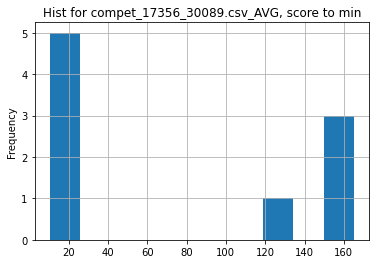

metric_column:  AVG , score_function:  min
Utility w/mean =  7.458015267175573
Utility w/median =  2.3053435114503817
___________________
17356_30299.csv
File cannot be opened: 17356_30299.csv
___________________
17401_30176.csv
  Prediction score
0       0.7500 (1)
1       0.6889 (2)
2       0.6731 (3)


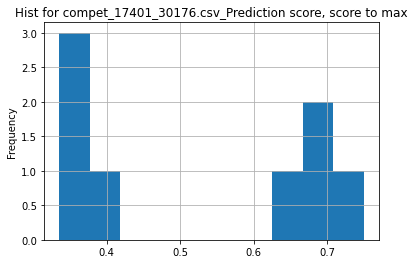

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.4245690678569731
Utility w/median =  1.4682850430696948
___________________
17401_30177.csv
___________________
17422_30229.csv
File cannot be opened: 17422_30229.csv
___________________
17422_30231.csv
___________________
17422_30232.csv
File cannot be opened: 17422_30232.csv
___________________
17422_30547.csv
File cannot be opened: 17422_30547.csv
___________________
17422_30569.csv
File cannot be opened: 17422_30569.csv
___________________
17422_30570.csv
File cannot be opened: 17422_30570.csv
___________________
17422_30838.csv
File cannot be opened: 17422_30838.csv
___________________
17449_30294.csv
  Overall Accuracy Overall F1-Score
0       0.8383 (1)       0.8383 (1)
1       0.8333 (2)       0.8333 (2)
2       0.8264 (3)       0.8264 (3)


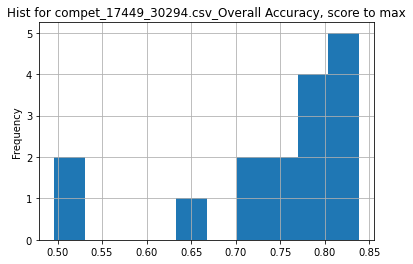

metric_column:  Overall Accuracy , score_function:  max
Utility w/mean =  1.1293372738218528
Utility w/median =  1.078962610206577
___________________
17449_30295.csv
  Overall Accuracy Overall F1-Score
0       0.7747 (1)       0.7744 (1)
1       0.7733 (2)       0.7733 (2)
2       0.7689 (3)       0.7659 (3)


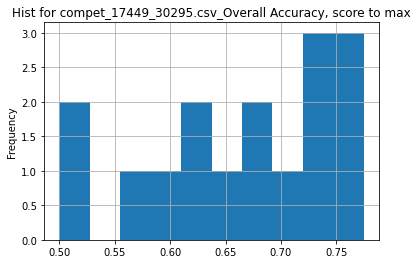

metric_column:  Overall Accuracy , score_function:  max
Utility w/mean =  1.1601430149192264
Utility w/median =  1.1376753065570162
___________________
17452_30301.csv
         AVG       SEEN    UNSEEN
0  24.98 (1)  24.98 (1)  0.00 (1)
1  29.19 (2)  29.19 (2)  0.00 (1)
2  31.26 (3)  31.26 (3)  0.00 (1)


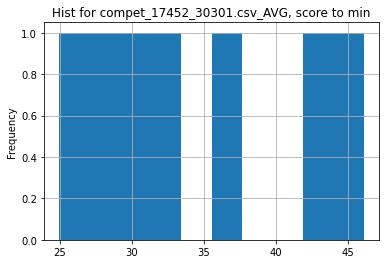

metric_column:  AVG , score_function:  min
Utility w/mean =  1.3979183346677342
Utility w/median =  1.298638911128903
___________________
17468_30351.csv
___________________
17468_30352.csv
___________________
17468_30353.csv
     Accuracy   Precision      Recall    F1-score
0  0.9844 (1)  0.9774 (1)  0.9693 (1)  0.9733 (1)
1  0.7285 (2)  0.7738 (2)  0.4844 (2)  0.5016 (2)
2  0.5488 (5)  0.3668 (5)  0.4773 (3)  0.4039 (3)


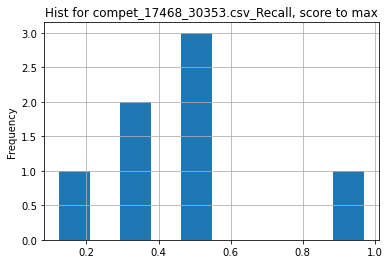

metric_column:  Recall , score_function:  max
Utility w/mean =  2.081957655722614
Utility w/median =  2.030798240100566
___________________
17468_30354.csv
      Accuracy    Precision       Recall    F1-score
0   0.7347 (1)   0.6304 (4)   0.8006 (4)  0.7054 (1)
1   0.7321 (2)   0.6535 (2)  0.6913 (13)  0.6719 (2)
2  0.6429 (15)  0.5317 (20)   0.8360 (2)  0.6500 (3)


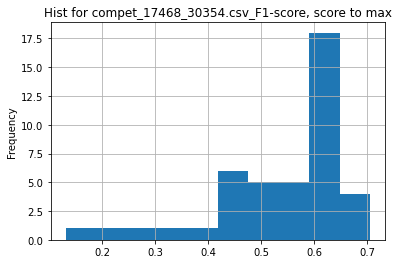

metric_column:  F1-score , score_function:  max
Utility w/mean =  1.305610316715593
Utility w/median =  1.1927629354075076
___________________
17468_30355.csv
     Accuracy   Precision      Recall    F1-score
0  0.7321 (1)  0.5768 (1)  0.5044 (4)  0.5074 (1)
1  0.6518 (4)  0.4959 (4)  0.5124 (2)  0.4959 (2)
2  0.6046 (9)  0.4860 (6)  0.5414 (1)  0.4947 (3)


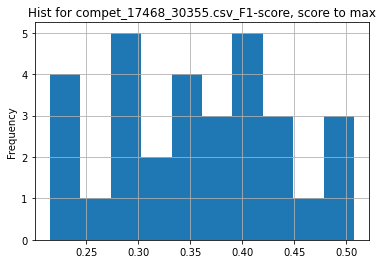

metric_column:  F1-score , score_function:  max
Utility w/mean =  1.4215839561849848
Utility w/median =  1.4398410896708285
___________________
17545_30517.csv
  Average BLEU
0   1.0000 (1)
1   0.5314 (2)
2   0.5088 (3)


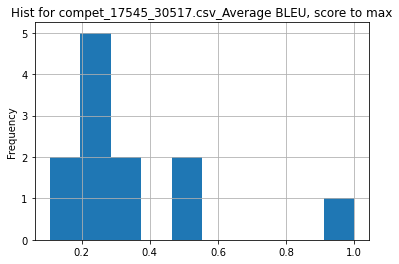

metric_column:  Average BLEU , score_function:  max
Utility w/mean =  2.940888148220762
Utility w/median =  4.363001745200698
___________________
17545_30518.csv
  Average BLEU
0   1.0000 (1)
1   0.3212 (2)
2   0.2831 (3)


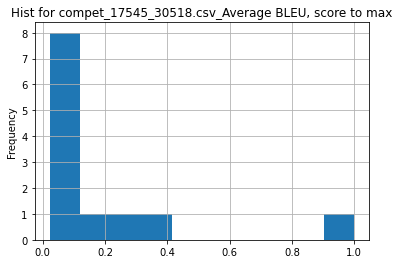

metric_column:  Average BLEU , score_function:  max
Utility w/mean =  5.62139879139926
Utility w/median =  16.038492381716118
___________________
17557_30544.csv
___________________
17581_30568.csv
      F1  MAP
0  - (-)  NaN
1  - (-)  NaN
2  - (-)  NaN
File cannot be opened: 17581_30568.csv
___________________
17751_30763.csv
File cannot be opened: 17751_30763.csv
___________________
17751_30764.csv
File cannot be opened: 17751_30764.csv
___________________
17751_30765.csv
File cannot be opened: 17751_30765.csv
___________________
17767_30782.csv
       <Rank>        Set 1       Set 2       Set 3       Set 4       Set 5  \
0  4.4000 (1)   0.8263 (3)  0.7725 (9)  0.9822 (3)  0.8181 (2)  0.4547 (5)   
1  4.4000 (1)  0.8158 (10)  0.8235 (4)  0.9830 (2)  0.8159 (4)  0.5767 (2)   
2  4.8000 (2)   0.8310 (1)  0.8316 (2)  0.9773 (8)  0.7830 (9)  0.4603 (4)   

       Duration  
0  3786.92 (49)  
1  3237.51 (47)  
2    98.14 (17)  


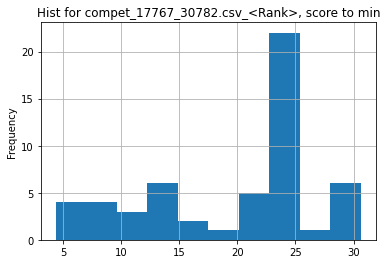

metric_column:  <Rank> , score_function:  min
Utility w/mean =  4.459595959595958
Utility w/median =  5.3181818181818175
___________________
17767_30783.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.8000 (1)  0.5533 (3)  0.2839 (4)  0.3932 (1)  0.2635 (1)  0.6766 (5)   
1  3.8000 (2)  0.5418 (5)  0.2894 (2)  0.3665 (2)  0.2005 (9)  0.6922 (1)   
2  5.4000 (3)  0.5085 (7)  0.2297 (7)  0.2670 (6)  0.2413 (5)  0.6853 (2)   

       Duration  
0  5980.43 (44)  
1  4776.17 (40)  
2  3463.49 (39)  


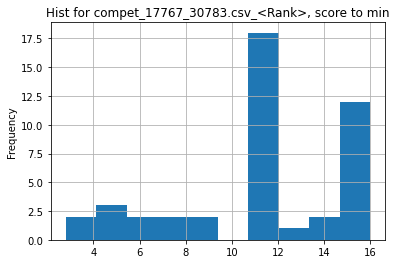

metric_column:  <Rank> , score_function:  min
Utility w/mean =  4.055194805194805
Utility w/median =  3.928571428571429
___________________
17805_30935.csv
File cannot be opened: 17805_30935.csv
___________________
17805_30936.csv
File cannot be opened: 17805_30936.csv
___________________
17806_30828.csv
  ARI (public) ARI (private)
0   0.2643 (1)    0.2477 (1)
1   0.2361 (4)    0.2270 (2)
2   0.2324 (5)    0.2222 (3)


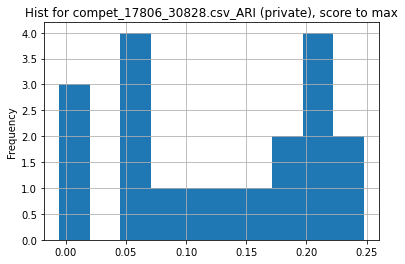

metric_column:  ARI (private) , score_function:  max
Utility w/mean =  1.9287324289988115
Utility w/median =  1.765502494654312
___________________
17806_31193.csv
File cannot be opened: 17806_31193.csv
___________________
17807_30829.csv
File cannot be opened: 17807_30829.csv
___________________
17809_30831.csv
  ARI (public) ARI (private)
0   0.3508 (1)    0.3384 (1)
1   0.2812 (2)    0.2818 (2)
2   0.2477 (5)    0.2579 (3)


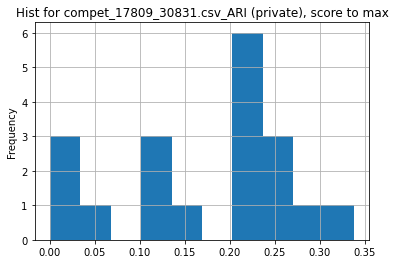

metric_column:  ARI (private) , score_function:  max
Utility w/mean =  1.9900337367297039
Utility w/median =  1.5872420262664164
___________________
17809_31192.csv
File cannot be opened: 17809_31192.csv
___________________
17810_30832.csv
  ARI (public) ARI (private)
0   1.0000 (1)    0.9625 (1)
1   0.9823 (2)    0.7096 (2)
2   1.0000 (1)    0.6586 (3)


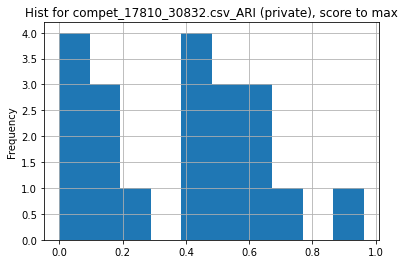

metric_column:  ARI (private) , score_function:  max
Utility w/mean =  2.563624498927939
Utility w/median =  2.386265030370646
___________________
17810_31191.csv
File cannot be opened: 17810_31191.csv
___________________
18015_30964.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  25.775 (1)  0.7028 (2)            2.920 (16)           0.0 (2)   
1  25.729 (2)  0.7011 (3)            20.000 (3)           0.0 (2)   
2  25.714 (3)  0.7005 (4)            1.000 (23)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


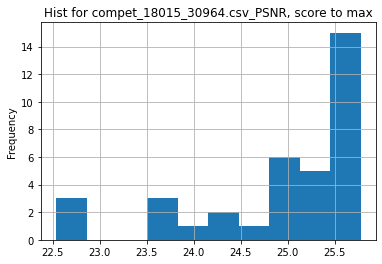

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.034430862360161
Utility w/median =  1.0198429184719173
___________________
18015_30965.csv
___________________
18024_30980.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  22.49 (16)  0.49 (19)             1.03 (12)          0.00 (2)   
1  22.40 (19)  0.49 (18)             0.34 (17)          0.00 (2)   
2  22.47 (17)  0.50 (16)              1.56 (7)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


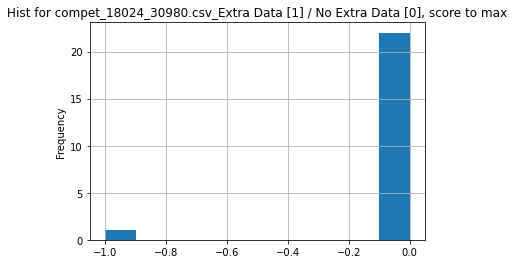

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 18024_30980.csv
___________________
18024_30982.csv
       PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  0.00 (1)  0.00 (1)             1.08 (14)          0.00 (2)   
1  0.00 (1)  0.00 (1)              4.68 (5)          0.00 (2)   
2  0.00 (1)  0.00 (1)             13.84 (3)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           0.00 (2)  
2                           0.00 (2)  


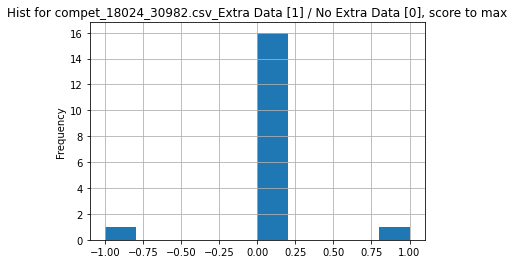

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 18024_30982.csv
___________________
18025_30981.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  21.90 (11)  0.47 (10)             0.97 (10)          1.00 (1)   
1  21.79 (13)  0.46 (13)             0.17 (13)          0.00 (2)   
2   22.88 (3)   0.51 (3)              1.00 (9)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


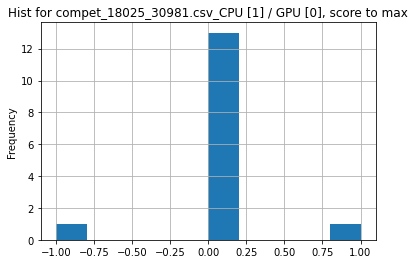

metric_column:  CPU [1] / GPU [0] , score_function:  max
File cannot be opened: 18025_30981.csv
___________________
18025_30983.csv
       PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  0.00 (1)  0.00 (1)             1.08 (14)          0.00 (2)   
1  0.00 (1)  0.00 (1)             0.72 (15)          0.00 (2)   
2  0.00 (1)  0.00 (1)              4.51 (6)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           0.00 (2)  
2                           0.00 (2)  


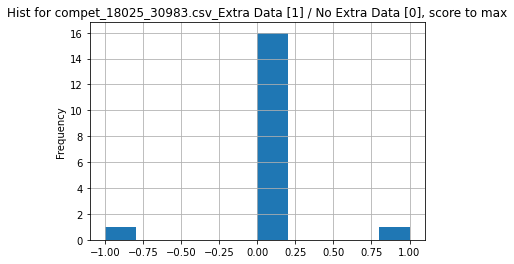

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 18025_30983.csv
___________________
18026_30984.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0   22.57 (9)   0.49 (9)              0.97 (8)          1.00 (1)   
1  22.37 (13)  0.49 (11)              0.34 (9)          0.00 (2)   
2   23.87 (4)   0.56 (3)              3.40 (4)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


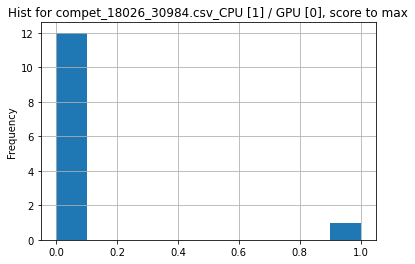

metric_column:  CPU [1] / GPU [0] , score_function:  max
File cannot be opened: 18026_30984.csv
___________________
18026_30985.csv
       PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  0.00 (1)  0.00 (1)             1.08 (10)          0.00 (2)   
1  0.00 (1)  0.00 (1)             0.72 (11)          0.00 (2)   
2  0.00 (1)  0.00 (1)              1.60 (8)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           0.00 (2)  
2                           0.00 (2)  


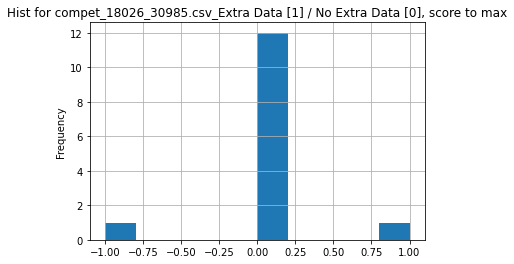

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 18026_30985.csv
___________________
18033_30986.csv
         MRAE         RMSE
0  0.0312 (1)  23.8845 (1)
1  0.0320 (2)  24.3857 (2)
2  0.0329 (3)  24.9745 (3)


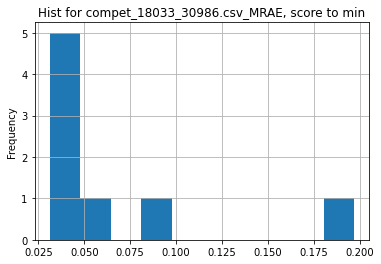

metric_column:  MRAE , score_function:  min
Utility w/mean =  2.106570512820513
Utility w/median =  1.4262820512820513
___________________
18033_30987.csv
___________________
18034_30988.csv
         MRAE         RMSE
0  0.0144 (1)  14.2147 (1)
1  0.0154 (2)  15.2766 (2)
2  0.0160 (3)  16.6866 (3)


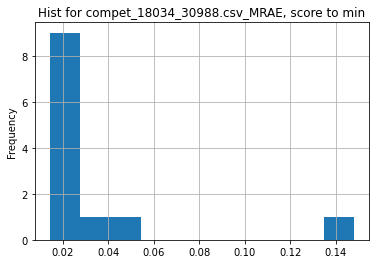

metric_column:  MRAE , score_function:  min
Utility w/mean =  2.3645833333333335
Utility w/median =  1.53125
___________________
18034_30989.csv
___________________
18046_31008.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  13.80 (34)  0.74 (23)            19.00 (11)          0.00 (2)   
1  15.71 (20)  0.77 (13)             1.30 (26)          0.00 (2)   
2  15.37 (24)  0.77 (12)             22.86 (7)          1.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


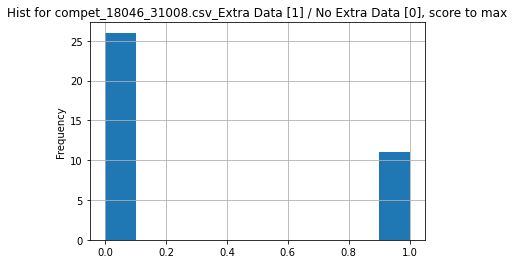

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 18046_31008.csv
___________________
18046_31009.csv
       PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  0.00 (1)  0.00 (1)             9.15 (10)          0.00 (2)   
1  0.00 (1)  0.00 (1)             0.32 (17)          0.00 (2)   
2  0.00 (1)  0.00 (1)             0.97 (16)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


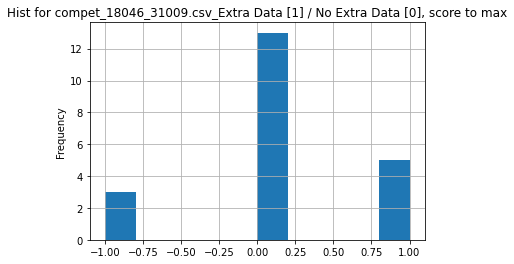

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 18046_31009.csv
___________________
18047_31010.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  22.82 (1)  0.74 (1)             9.11 (12)          0.00 (2)   
1  22.44 (2)  0.72 (2)             5.00 (15)          0.00 (2)   
2  22.39 (3)  0.72 (3)             5.00 (15)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           0.00 (2)  
2                           0.00 (2)  


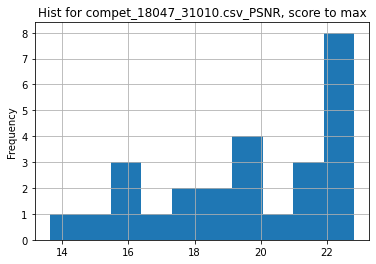

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.16903434279747
Utility w/median =  1.1424280350438047
___________________
18047_31011.csv
       PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  0.00 (1)  0.00 (1)            120.53 (2)          1.00 (1)   
1  0.00 (1)  0.00 (1)             10.85 (9)          0.00 (2)   
2  0.00 (1)  0.00 (1)            10.00 (11)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                           0.00 (2)  
2                           0.00 (2)  


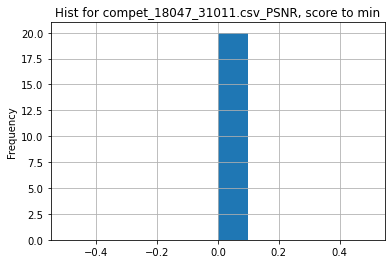

metric_column:  PSNR , score_function:  min
File cannot be opened: 18047_31011.csv
___________________
18053_31024.csv
___________________
18053_31025.csv
___________________
18113_31069.csv
___________________
18113_31070.csv
___________________
18188_31211.csv
File cannot be opened: 18188_31211.csv
___________________
18188_31212.csv
File cannot be opened: 18188_31212.csv
___________________
18188_31213.csv
  Score (Average F1)
0          0.464 (1)
1          0.461 (2)
2          0.446 (3)


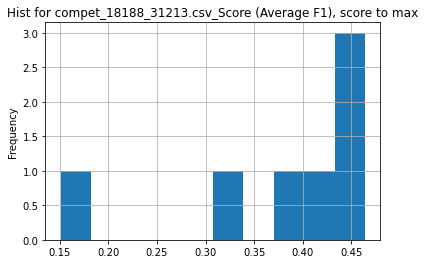

metric_column:  Score (Average F1) , score_function:  max
Utility w/mean =  1.2210526315789476
Utility w/median =  1.1127098321342928
___________________
18188_31213init.csv
File cannot be opened: 18188_31213init.csv
___________________
18362_31490.csv
  AUC performance  Duration
0      0.5000 (5)  0.00 (1)
1      0.5314 (1)  0.00 (1)
2      0.4932 (6)  0.00 (1)
File cannot be opened: 18362_31490.csv
___________________
18362_31491.csv
___________________
18405_31538.csv
   bestDice absDiffFG     diffFG   FgBgDice
0  0.86 (1)  1.19 (1)  -0.56 (1)   0.95 (1)
1  bestDice  FgBgDice     diffFG  absDiffFG
2  0.88 (1)  0.94 (1)  -1.53 (1)   1.77 (1)
File cannot be opened: 18405_31538.csv
___________________
18405_31539.csv
    bestDice  absDiffFG     diffFG  FgBgDice
0  0.41 (15)  9.82 (17)  -9.80 (6)  1.00 (1)
1  0.41 (17)  9.79 (14)  -9.78 (7)  1.00 (2)
2  0.42 (14)  9.86 (18)  -9.86 (5)  1.00 (3)
File cannot be opened: 18405_31539.csv
___________________
18421_31557.csv
       <Rank>     

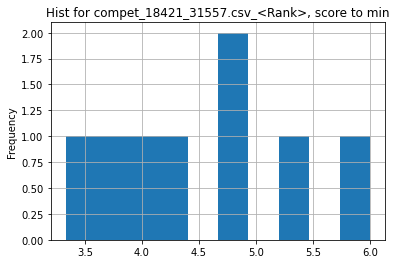

metric_column:  <Rank> , score_function:  min
Utility w/mean =  1.3500135001350013
Utility w/median =  1.3500135001350013
___________________
18421_31558.csv
       <Rank>         MSE         PSNR       DSSIM
0  2.6667 (1)  0.0011 (1)  33.3527 (1)  0.0404 (6)
1  3.3333 (3)  0.0011 (2)  33.0052 (3)  0.0410 (5)
2  3.0000 (2)  0.0012 (3)  33.0228 (2)  0.0424 (4)


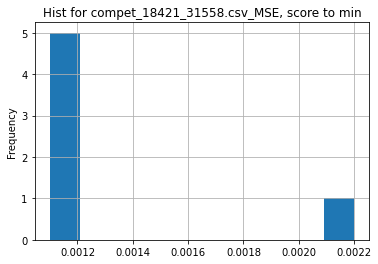

metric_column:  MSE , score_function:  min
Utility w/mean =  1.212121212121212
Utility w/median =  1.0909090909090908
___________________
18423_31561.csv
___________________
18423_31562.csv
___________________
18426_31567.csv
       <Rank>         MSE         PSNR        SSIM
0  1.0000 (1)  0.0191 (1)  17.6640 (1)  0.8426 (1)
1  2.3333 (2)  0.0239 (2)  16.8363 (2)  0.8069 (3)
2  3.3333 (3)  0.0241 (3)  16.6062 (3)  0.8031 (4)


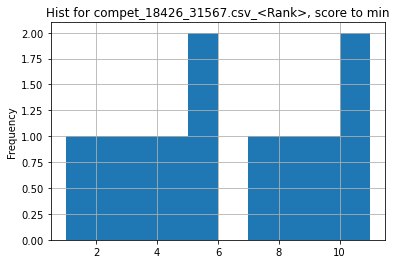

metric_column:  <Rank> , score_function:  min
Utility w/mean =  5.999990909090909
Utility w/median =  5.3333
___________________
18426_31568.csv
___________________
18467_31633.csv
  Prediction score    Duration
0       0.6577 (1)  0.0000 (1)
1       0.6567 (2)  0.0000 (1)
2       0.6560 (3)  0.0000 (1)


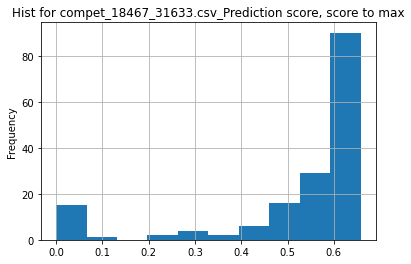

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.2553777279063438
Utility w/median =  1.0925249169435216
___________________
18467_32229.csv
File cannot be opened: 18467_32229.csv
___________________
18467_32231.csv
File cannot be opened: 18467_32231.csv
___________________
18467_33606.csv
File cannot be opened: 18467_33606.csv
___________________
18468_31635.csv
  Prediction score   Duration
0       0.6005 (1)  0.00 (60)
1       0.5915 (2)  0.00 (54)
2       0.5620 (3)  0.00 (63)
File cannot be opened: 18468_31635.csv
___________________
18468_32233.csv
File cannot be opened: 18468_32233.csv
___________________
18491_31656.csv
        AUROC          F1  Avg. log loss
0  0.7894 (1)  0.2568 (1)     0.3393 (2)
1  0.7757 (2)  0.1730 (2)     0.3460 (1)
2       AUROC          F1  Avg. log loss
File cannot be opened: 18491_31656.csv
___________________
18491_31657.csv
        AUROC          F1 Avg. log loss
0  0.8613 (1)  0.5608 (1)   0.2974 (14)
1  0.8606 (2)  0.5

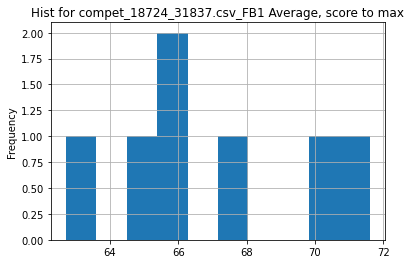

metric_column:  FB1 Average , score_function:  max
Utility w/mean =  1.0699158764252519
Utility w/median =  1.0844081706818491
___________________
18724_32204.csv
File cannot be opened: 18724_32204.csv
___________________
18725_31838.csv
   FB1 Average   FB1 Entity  FB1 Surface
0  63.7628 (1)  63.7628 (1)  63.7628 (1)
1  62.7608 (2)  62.7608 (2)  62.7608 (2)
2  62.6671 (3)  62.6671 (3)  62.6671 (3)


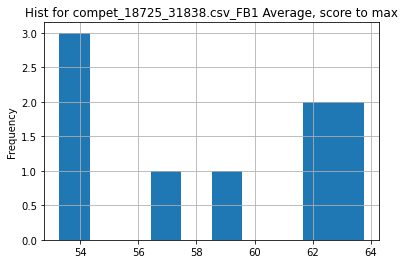

metric_column:  FB1 Average , score_function:  max
Utility w/mean =  1.086074391239112
Utility w/median =  1.0761635845340345
___________________
18725_32205.csv
File cannot be opened: 18725_32205.csv
___________________
18751_31872.csv
     Accuracy
0  0.8925 (1)
1  0.8900 (2)
2  0.8850 (3)


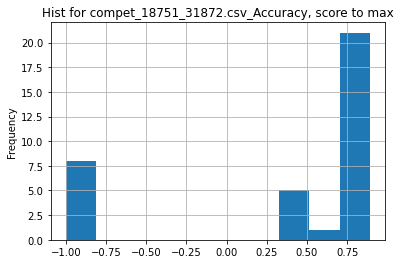

metric_column:  Accuracy , score_function:  max
Utility w/mean =  2.441383352872216
Utility w/median =  1.0562130177514792
___________________
18814_31973.csv
  Evidence F1 Label Accuracy FEVER Score
0  0.5939 (1)     0.5095 (3)  0.4242 (1)
1  0.3217 (2)     0.5061 (4)  0.3778 (2)
2  0.1718 (4)     0.5137 (2)  0.3127 (3)


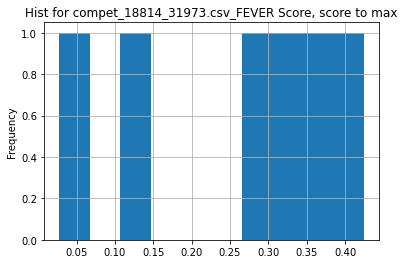

metric_column:  FEVER Score , score_function:  max
Utility w/mean =  1.6320615581917282
Utility w/median =  1.4147073536768386
___________________
18814_31974.csv
   Evidence F1 Label Accuracy FEVER Score
0   0.5296 (3)     0.6821 (1)  0.6421 (1)
1  0.3497 (12)     0.6762 (2)  0.6252 (2)
2   0.3697 (9)     0.6546 (3)  0.6158 (3)


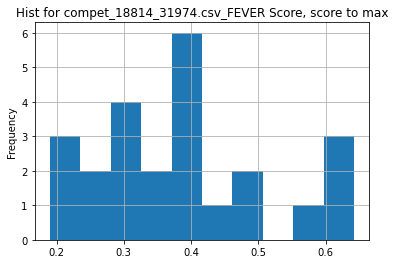

metric_column:  FEVER Score , score_function:  max
Utility w/mean =  1.6666198020872764
Utility w/median =  1.7018287834614367
___________________
18814_31975.csv
   Evidence F1 Label Accuracy FEVER Score
0  0.4005 (26)     0.7939 (2)  0.7689 (1)
1  0.4003 (27)     0.7947 (1)  0.7682 (2)
2  0.4003 (27)     0.7916 (5)  0.7678 (3)


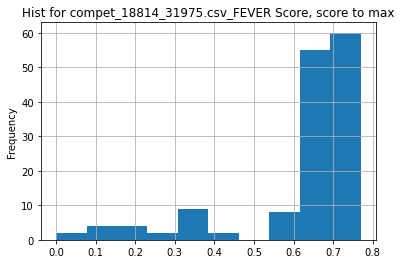

metric_column:  FEVER Score , score_function:  max
Utility w/mean =  1.2479215092527436
Utility w/median =  1.1387736966824644
___________________
18892_32149.csv
File cannot be opened: 18892_32149.csv
___________________
18892_32150.csv
File cannot be opened: 18892_32150.csv
___________________
18905_32181.csv
___________________
18905_32182.csv
___________________
18905_32183.csv
___________________
18905_32184.csv
___________________
18905_32185.csv
___________________
18905_32186.csv
___________________
18905_32187.csv
___________________
18905_32188.csv
___________________
18905_32189.csv
___________________
18905_32190.csv
___________________
18905_32191.csv
___________________
18905_32192.csv
___________________
18905_32193.csv
___________________
18905_32194.csv
___________________
18905_32195.csv
___________________
18905_32196.csv
___________________
18905_32197.csv
___________________
18905_32198.csv
___________________
18905_32199.csv
___________________
19024_32384.csv
___

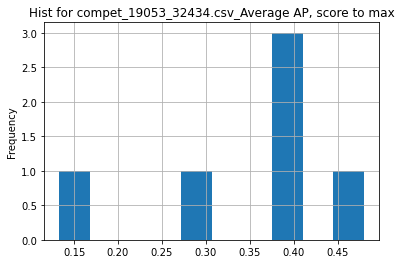

metric_column:  Average AP , score_function:  max
Utility w/mean =  1.3679155572461013
Utility w/median =  1.1898263027295284
___________________
19053_32435.csv
   Average AP
0  0.5582 (1)
1  0.5332 (2)
2  0.5030 (3)


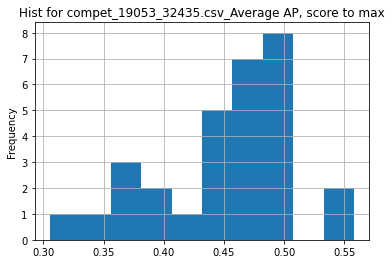

metric_column:  Average AP , score_function:  max
Utility w/mean =  1.2331097251165288
Utility w/median =  1.200042996882726
___________________
19055_32438.csv
___________________
19055_32439.csv
          mAP
0  0.7671 (1)
1  0.7466 (2)
2  0.7402 (3)


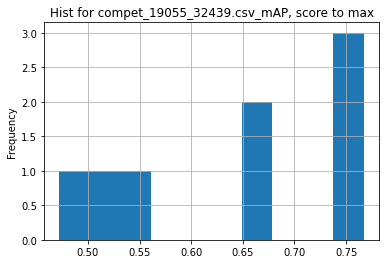

metric_column:  mAP , score_function:  max
Utility w/mean =  1.1968639076334986
Utility w/median =  1.1528403967538323
___________________
19090_32479.csv
       Score
0  0.949 (1)
1  0.981 (2)
2  0.990 (3)


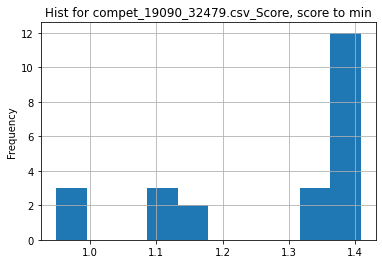

metric_column:  Score , score_function:  min
Utility w/mean =  1.3434736793879145
Utility w/median =  1.4615384615384617
___________________
19090_32480.csv
       Score
0  0.928 (1)
1  0.943 (2)
2  0.962 (3)


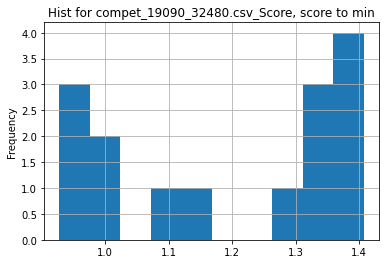

metric_column:  Score , score_function:  min
Utility w/mean =  1.2876436781609195
Utility w/median =  1.3653017241379308
___________________
19113_32497.csv
File cannot be opened: 19113_32497.csv
___________________
19113_32498.csv
File cannot be opened: 19113_32498.csv
___________________
19113_32498_extended.csv
File cannot be opened: 19113_32498_extended.csv
___________________
19118_32505.csv
___________________
19118_32506.csv
   Average AP
0  0.6968 (1)
1  0.6440 (2)
2  0.6281 (3)


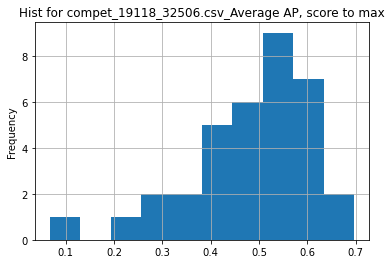

metric_column:  Average AP , score_function:  max
Utility w/mean =  1.4313298549771984
Utility w/median =  1.3516973811833173
___________________
19214_32650.csv
  Micro Precision Micro Recall Micro F1-Score Macro Precision Macro Recall  \
0       0.675 (1)    0.675 (1)      0.675 (1)       0.674 (1)    0.673 (1)   
1       0.674 (2)    0.674 (2)      0.674 (2)       0.673 (2)    0.671 (2)   
2       0.668 (3)    0.668 (3)      0.668 (3)       0.673 (3)    0.667 (3)   

  Macro F1-Score  
0      0.673 (1)  
1      0.672 (2)  
2      0.668 (3)  


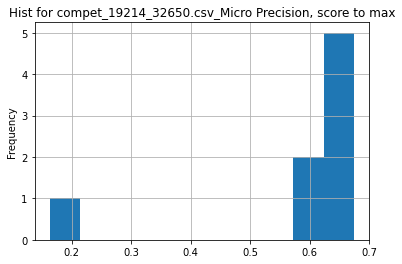

metric_column:  Micro Precision , score_function:  max
Utility w/mean =  1.148691767708998
Utility w/median =  1.0266159695817492
___________________
19214_32651.csv
___________________
19214_32652.csv
  Micro Precision Micro Recall Micro F1-Score Macro Precision Macro Recall  \
0       0.694 (1)    0.694 (1)      0.694 (1)       0.693 (1)    0.692 (1)   
1       0.682 (2)    0.682 (2)      0.682 (2)       0.681 (2)    0.680 (2)   
2       0.663 (5)    0.663 (5)      0.663 (5)       0.661 (3)    0.661 (3)   

  Macro F1-Score  
0      0.692 (1)  
1      0.680 (2)  
2      0.661 (3)  


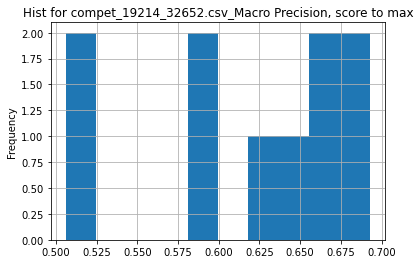

metric_column:  Macro Precision , score_function:  max
Utility w/mean =  1.1281132996907048
Utility w/median =  1.0896226415094339
___________________
19226_32672.csv
___________________
19226_32673.csv
       MRAE    MOS        SID     APPSA             MSE       PSNR      SSIM
0  0.11 (2)  - (-)  49.25 (1)  0.07 (1)  1579892.50 (1)  36.69 (2)  0.91 (1)
1  0.10 (1)  - (-)  51.11 (3)  0.07 (2)  1683137.28 (3)  36.61 (3)  0.90 (2)
2  0.12 (3)  - (-)  55.81 (4)  0.07 (3)  1754620.81 (4)  36.16 (4)  0.90 (4)
File cannot be opened: 19226_32673.csv
___________________
19226_32674.csv
       MRAE    MOS         SID     APPSA             MSE       PSNR      SSIM
0  0.07 (1)  - (-)   40.35 (1)  0.06 (1)  1246673.39 (1)  36.70 (1)  0.94 (1)
1  0.12 (3)  - (-)   98.00 (2)  0.08 (2)  3061024.14 (2)  32.83 (2)  0.86 (2)
2  0.11 (2)  - (-)  110.89 (3)  0.08 (3)  3414849.14 (3)  32.26 (3)  0.85 (3)
File cannot be opened: 19226_32674.csv
___________________
19227_32675.csv
___________________
19227_3

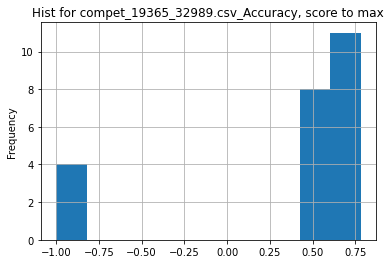

metric_column:  Accuracy , score_function:  max
Utility w/mean =  2.093348891481914
Utility w/median =  1.3220338983050848
___________________
19472_33230.csv
___________________
19472_33231.csv
___________________
19472_33232.csv
         FIOU       FIOUS        MACC       MACCS        MIOU       MIOUS  \
0  0.6062 (1)  0.7256 (1)  0.4512 (1)  0.7152 (1)  0.3387 (1)  0.6012 (1)   
1  0.5693 (2)  0.6959 (2)  0.4284 (2)  0.7089 (2)  0.2944 (2)  0.5642 (2)   
2  0.5378 (3)  0.6554 (4)  0.3421 (5)  0.6140 (5)  0.2606 (4)  0.5150 (4)   

         PACC       PACCS  
0  0.7419 (1)  0.8369 (1)  
1  0.7004 (3)  0.8102 (2)  
2  0.7006 (2)  0.7921 (3)  


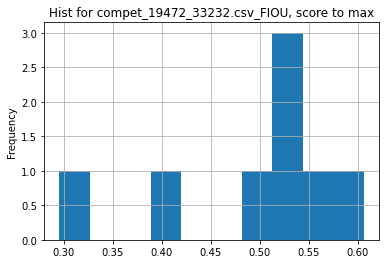

metric_column:  FIOU , score_function:  max
Utility w/mean =  1.2285866288348999
Utility w/median =  1.152581043825459
___________________
19507_33278.csv
___________________
19507_33279.csv
          PQ         SQ         RQ  PQ Things  SQ Things  RQ Things  \
0  0.494 (1)  0.813 (3)  0.596 (1)  0.573 (1)  0.830 (4)  0.684 (1)   
1  0.473 (2)  0.819 (2)  0.568 (3)  0.541 (4)  0.837 (2)  0.640 (5)   
2  0.472 (3)  0.820 (1)  0.564 (5)  0.547 (3)  0.840 (1)  0.644 (3)   

    PQ Stuff   SQ Stuff   RQ Stuff  
0  0.375 (1)  0.788 (4)  0.463 (1)  
1  0.372 (3)  0.790 (3)  0.458 (2)  
2  0.358 (4)  0.791 (2)  0.441 (4)  


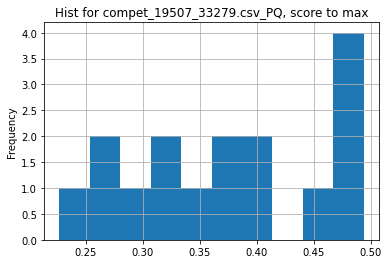

metric_column:  PQ , score_function:  max
Utility w/mean =  1.3166749958354154
Utility w/median =  1.2797927461139895
___________________
19507_33280.csv
          PQ         SQ         RQ  PQ Things  SQ Things  RQ Things  \
0  0.595 (1)  0.849 (1)  0.695 (1)  0.675 (1)  0.861 (1)  0.781 (1)   
1  0.583 (2)  0.841 (2)  0.686 (2)  0.651 (2)  0.854 (2)  0.758 (2)   
2  0.562 (3)  0.828 (6)  0.671 (3)  0.623 (3)  0.842 (8)  0.736 (3)   

    PQ Stuff   SQ Stuff   RQ Stuff  
0  0.475 (2)  0.830 (1)  0.565 (4)  
1  0.481 (1)  0.821 (2)  0.578 (1)  
2  0.470 (3)  0.808 (6)  0.573 (2)  


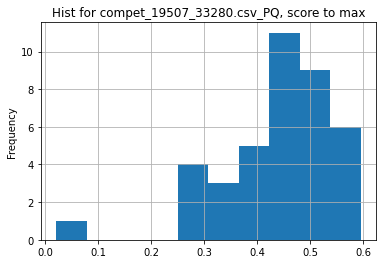

metric_column:  PQ , score_function:  max
Utility w/mean =  1.3529034514925369
Utility w/median =  1.2659574468085106
___________________
19507_33281.csv
___________________
19529_33324.csv
       MaxGM         GM        TPR        TNR
0  0.829 (1)  0.829 (1)  0.784 (5)  0.876 (2)
1  0.826 (2)  0.826 (2)  0.789 (4)  0.864 (3)
2  0.804 (3)  0.804 (3)  0.791 (3)  0.816 (5)


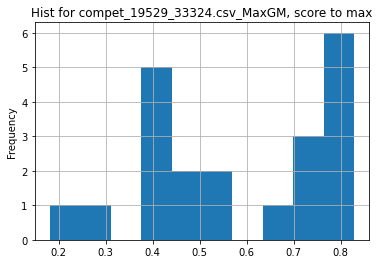

metric_column:  MaxGM , score_function:  max
Utility w/mean =  1.4090651558073652
Utility w/median =  1.5911708253358923
___________________
19529_33325.csv
       MaxGM         GM         TPR        TNR
0  0.814 (1)  0.814 (1)   0.806 (8)  0.821 (5)
1  0.812 (2)  0.812 (2)  0.796 (12)  0.828 (4)
2  0.809 (3)  0.809 (3)   0.806 (9)  0.812 (6)


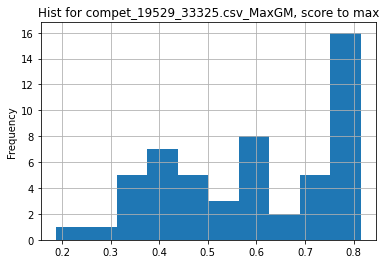

metric_column:  MaxGM , score_function:  max
Utility w/mean =  1.376711235919201
Utility w/median =  1.3612040133779264
___________________
19544_33352.csv
     Overall     J_seen   J_unseen     F_seen   F_unseen
0  0.882 (1)  0.871 (1)  0.823 (1)  0.922 (1)  0.911 (1)
1  0.871 (2)  0.861 (3)  0.814 (4)  0.912 (3)  0.897 (5)
2  0.870 (3)  0.861 (2)  0.811 (6)  0.912 (2)  0.897 (6)


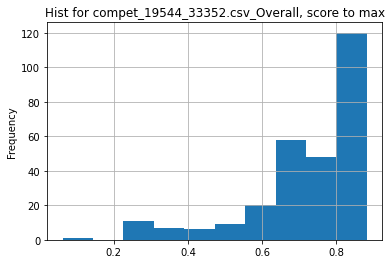

metric_column:  Overall , score_function:  max
Utility w/mean =  1.2318374309784976
Utility w/median =  1.125717932354818
___________________
19544_33353.csv
     Overall     J_seen   J_unseen     F_seen   F_unseen
0  0.722 (1)  0.737 (1)  0.648 (2)  0.778 (1)  0.725 (2)
1  0.720 (2)  0.725 (3)  0.663 (1)  0.752 (3)  0.741 (1)
2  0.699 (3)  0.736 (2)  0.621 (4)  0.755 (2)  0.684 (4)


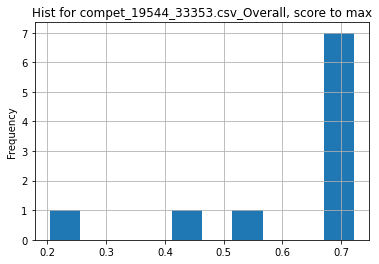

metric_column:  Overall , score_function:  max
Utility w/mean =  1.196949602122016
Utility w/median =  1.0744047619047619
___________________
19636_33467.csv
___________________
19636_33468.csv
         AP      AP50      AP75       APm       APl
0  0.64 (1)  0.92 (1)  0.75 (1)  0.57 (1)  0.67 (1)
1  0.58 (2)  0.89 (2)  0.66 (3)  0.50 (4)  0.61 (2)
2  0.57 (3)  0.89 (3)  0.64 (4)  0.51 (3)  0.59 (4)


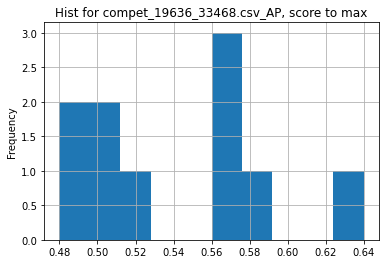

metric_column:  AP , score_function:  max
Utility w/mean =  1.1808118081180812
Utility w/median =  1.1851851851851851
___________________
19650_33493.csv
___________________
19650_33494.csv
         AP      AP50      AP75       APm       APl
0  0.30 (1)  0.64 (1)  0.25 (2)  0.12 (1)  0.32 (1)
1  0.29 (2)  0.63 (2)  0.23 (3)  0.12 (2)  0.31 (3)
2  0.29 (3)  0.57 (3)  0.26 (1)  0.02 (6)  0.32 (2)


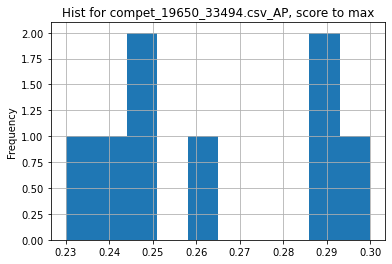

metric_column:  AP , score_function:  max
Utility w/mean =  1.1374407582938388
Utility w/median =  1.1764705882352942
___________________
19711_33581.csv
       Accuracy
0  0.994929 (1)
1  0.990872 (2)
2  0.990872 (2)


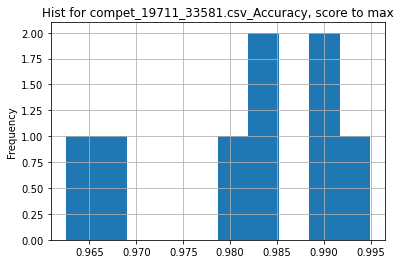

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.013429665254045
Utility w/median =  1.0118614901766154
___________________
19790_33700.csv
      F1Score
0  0.7214 (1)
1  0.7093 (2)
2  0.6859 (3)
File cannot be opened: 19790_33700.csv
___________________
19790_33701.csv
___________________
19818_33736.csv
  Accuracy (80% percentile) Accuracy (median) Accuracy (mean)   Duration
0                0.9804 (1)        0.9186 (1)      0.8958 (1)  0.00 (10)
1                0.9626 (2)        0.8820 (3)      0.8516 (2)  0.00 (13)
2                0.9604 (3)        0.8864 (2)      0.8499 (3)   0.00 (3)


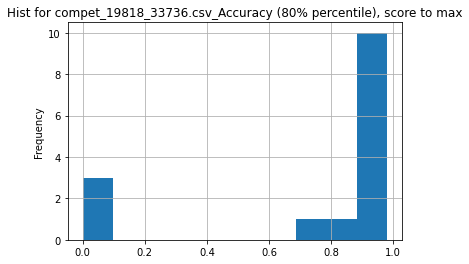

metric_column:  Accuracy (80% percentile) , score_function:  max
Utility w/mean =  1.3312934530706837
Utility w/median =  1.0504660880745742
___________________
19818_33737.csv
  Accuracy (80% percentile) Accuracy (median) Accuracy (mean)   Duration
0                0.9736 (1)        0.9106 (1)      0.8919 (1)  0.00 (12)
1                0.9622 (2)        0.8809 (3)      0.8439 (3)   0.00 (7)
2                0.9598 (3)        0.8847 (2)      0.8454 (2)  0.00 (14)


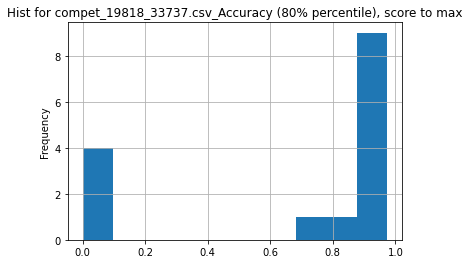

metric_column:  Accuracy (80% percentile) , score_function:  max
Utility w/mean =  1.4447247366078055
Utility w/median =  1.0403932464201753
___________________
19818_33738.csv
  Accuracy (80% percentile) Accuracy (median) Accuracy (mean)   Duration
0                0.9365 (1)        0.8946 (1)      0.8821 (1)   0.00 (5)
1                0.9192 (2)        0.8773 (2)      0.8666 (2)  0.00 (11)
2                0.9185 (3)        0.8511 (5)      0.8188 (7)   0.00 (8)


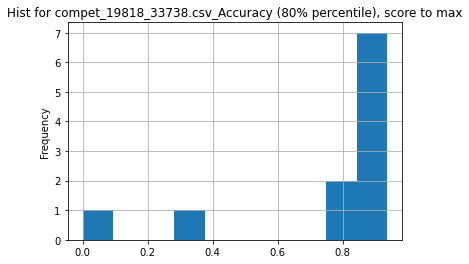

metric_column:  Accuracy (80% percentile) , score_function:  max
Utility w/mean =  1.2461140209752146
Utility w/median =  1.0448510543344862
___________________
19818_33739.csv
  Accuracy (80% percentile) Accuracy (median) Accuracy (mean)  Duration
0                0.9348 (1)        0.8918 (1)      0.8812 (1)  0.00 (4)
1                0.9187 (2)        0.8756 (2)      0.8664 (2)  0.00 (1)
2                0.9167 (3)        0.8497 (6)      0.8184 (7)  0.00 (2)


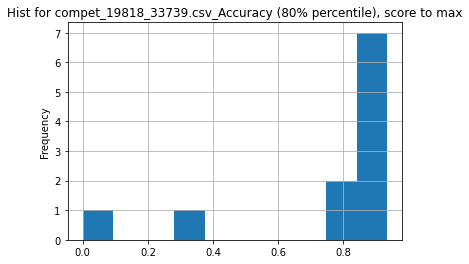

metric_column:  Accuracy (80% percentile) , score_function:  max
Utility w/mean =  1.243942271633016
Utility w/median =  1.045053102291783
___________________
19818_33740.csv
___________________
19818_33741.csv
___________________
19836_33760.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.2000 (1)  0.3941 (3)  0.2064 (3)  0.4988 (3)  0.4233 (1)  0.5664 (1)   
1  2.2000 (1)  0.3945 (2)  0.2087 (1)  0.4795 (4)  0.4216 (2)  0.5627 (2)   
2  2.8000 (2)  0.3880 (4)  0.2073 (2)  0.5218 (1)  0.3886 (3)  0.5480 (4)   

       Duration  
0  5594.59 (31)  
1  7104.85 (41)  
2  6362.88 (40)  


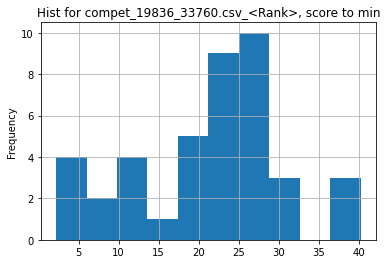

metric_column:  <Rank> , score_function:  min
Utility w/mean =  9.545454545454547
Utility w/median =  10.545454545454545
___________________
19836_33761.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.4000 (1)  0.4576 (1)  0.3399 (1)  0.3132 (1)  0.6136 (2)  0.4559 (7)   
1  3.2000 (2)  0.3674 (7)  0.3075 (2)  0.2891 (2)  0.5961 (3)  0.5099 (2)   
2  3.6000 (3)  0.4493 (3)  0.2716 (3)  0.2800 (5)  0.5704 (6)  0.5156 (1)   

      Duration  
0  5586.46 (7)  
1  4501.96 (4)  
2  4410.72 (2)  


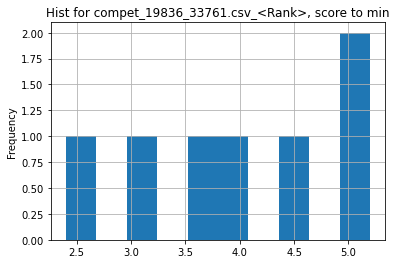

metric_column:  <Rank> , score_function:  min
Utility w/mean =  1.6666666666666665
Utility w/median =  1.6666666666666667
___________________
19917_33835.csv
      Meteor       BLEU
0  57.26 (1)  39.50 (1)
1  56.60 (2)  38.54 (2)
2  52.26 (5)  32.53 (3)


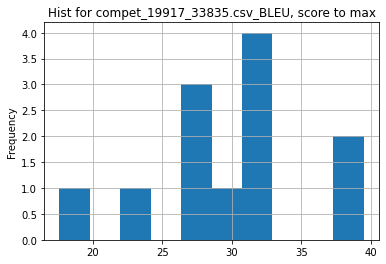

metric_column:  BLEU , score_function:  max
Utility w/mean =  1.3175816539263376
Utility w/median =  1.2805965310423084
___________________
19917_33836.csv
      Meteor       BLEU
0  64.29 (1)  44.11 (1)
1  60.95 (2)  40.63 (2)
2  60.54 (3)  40.09 (3)


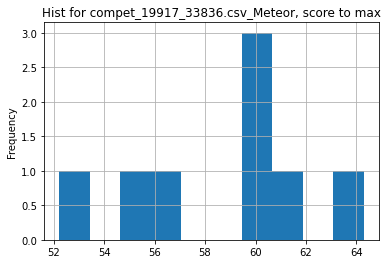

metric_column:  Meteor , score_function:  max
Utility w/mean =  1.0969585803864694
Utility w/median =  1.077064834980734
___________________
19917_33837.csv
___________________
19917_33838.csv
___________________
19935_33911.csv
___________________
19935_33912.csv
___________________
19935_33913.csv
___________________
19935_33914.csv
___________________
19935_33915.csv
___________________
19935_33916.csv
___________________
19935_33917.csv
___________________
19935_33918.csv
___________________
19935_33919.csv
___________________
19948_33976.csv
File cannot be opened: 19948_33976.csv
___________________
19948_33977.csv
___________________
19948_33978.csv
File cannot be opened: 19948_33978.csv
___________________
19948_33979.csv
File cannot be opened: 19948_33979.csv
___________________
19948_33980.csv
___________________
19948_33981.csv
File cannot be opened: 19948_33981.csv
___________________
19948_33982.csv
File cannot be opened: 19948_33982.csv
___________________
19948_33983.csv


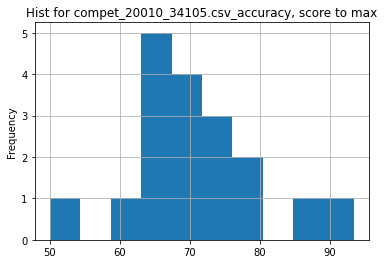

metric_column:  accuracy , score_function:  max
Utility w/mean =  1.3225593356296892
Utility w/median =  1.363245057270008
___________________
20013_34113.csv
___________________
20013_34114.csv
___________________
20013_34115.csv
___________________
20013_34116.csv
___________________
20071_34188.csv
File cannot be opened: 20071_34188.csv
___________________
20111_34247.csv
File cannot be opened: 20111_34247.csv
___________________
20115_34253.csv
File cannot be opened: 20115_34253.csv
___________________
20127_34262.csv
     Overall     J_seen   J_unseen     F_seen   F_unseen
0  0.900 (1)  0.885 (1)  0.855 (1)  0.930 (1)  0.931 (1)
1  0.886 (2)  0.871 (3)  0.832 (3)  0.919 (3)  0.920 (2)
2  0.883 (3)  0.869 (4)  0.829 (4)  0.917 (4)  0.916 (3)


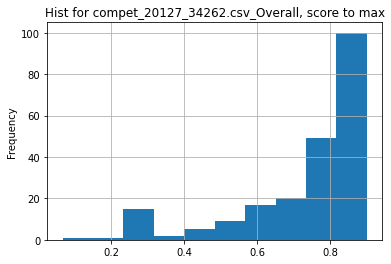

metric_column:  Overall , score_function:  max
Utility w/mean =  1.2347535191414998
Utility w/median =  1.1097410604192355
___________________
20127_34264.csv
     Overall     J_seen   J_unseen     F_seen   F_unseen
0  0.818 (1)  0.807 (1)  0.773 (2)  0.847 (1)  0.847 (2)
1  0.817 (2)  0.800 (2)  0.779 (1)  0.833 (2)  0.855 (1)
2  0.804 (3)  0.794 (3)  0.759 (4)  0.833 (3)  0.831 (4)


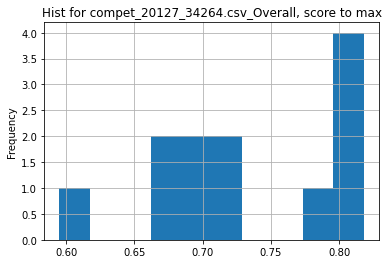

metric_column:  Overall , score_function:  max
Utility w/mean =  1.119780971937029
Utility w/median =  1.148876404494382
___________________
20128_34265.csv
         mAP       AP50       AP75        AR1       AR10
0  0.638 (1)  0.850 (5)  0.708 (1)  0.554 (4)  0.685 (3)
1  0.635 (2)  0.874 (1)  0.693 (4)  0.562 (1)  0.690 (1)
2  0.631 (3)  0.853 (3)  0.700 (3)  0.560 (2)  0.689 (2)


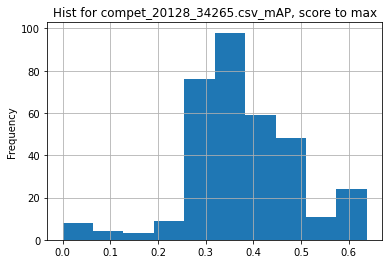

metric_column:  mAP , score_function:  max
Utility w/mean =  1.7107255520504756
Utility w/median =  1.7722222222222224
___________________
20128_34266.csv
         mAP       AP50       AP75        AR1       AR10
0  0.467 (1)  0.697 (1)  0.509 (1)  0.462 (1)  0.537 (2)
1  0.457 (2)  0.674 (3)  0.490 (3)  0.435 (5)  0.507 (4)
2  0.450 (3)  0.636 (5)  0.502 (2)  0.447 (3)  0.503 (5)


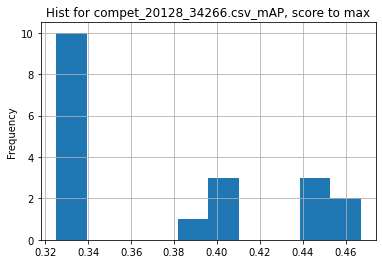

metric_column:  mAP , score_function:  max
Utility w/mean =  1.2394189132560414
Utility w/median =  1.3775811209439528
___________________
20130_34270.csv
         MAP
0  0.950 (1)
1  0.950 (1)
2  0.940 (2)


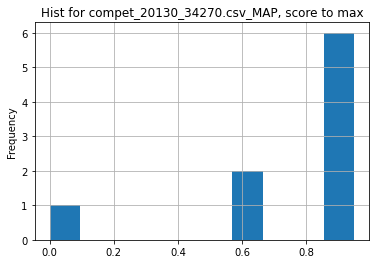

metric_column:  MAP , score_function:  max
Utility w/mean =  1.2518301610541727
Utility w/median =  1.0326086956521738
___________________
20131_34271.csv
___________________
20131_34272.csv
            QAC           PAC
0  81.95218 (1)  31.00000 (1)
1  80.28169 (2)  25.00000 (2)
2  80.05241 (3)  20.33333 (4)


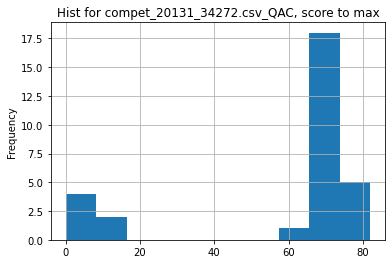

metric_column:  QAC , score_function:  max
Utility w/mean =  1.403987907145948
Utility w/median =  1.1658899964035492
___________________
20131_34273.csv
            QAC           PAC
0  85.67211 (1)  43.60000 (1)
1  83.84176 (2)  36.60000 (2)
2  83.42846 (3)  36.40000 (3)


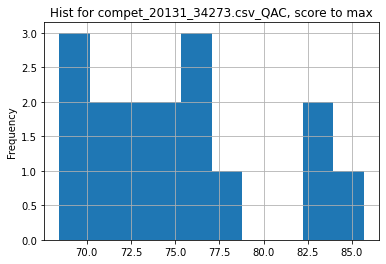

metric_column:  QAC , score_function:  max
Utility w/mean =  1.1381321858590046
Utility w/median =  1.145978586365157
___________________
20131_34274.csv
            QAC           PAC
0  89.70675 (1)  56.40000 (1)
1  87.62055 (2)  49.80000 (2)
2  83.84176 (3)  36.60000 (3)


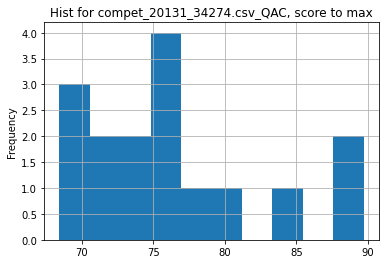

metric_column:  QAC , score_function:  max
Utility w/mean =  1.1760304486375888
Utility w/median =  1.192569296921628
___________________
20132_34275.csv
   Average AP
0  0.7060 (1)
1  0.7025 (2)
2  0.6915 (3)


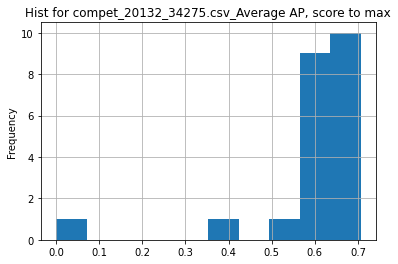

metric_column:  Average AP , score_function:  max
Utility w/mean =  1.1863642960258478
Utility w/median =  1.1278856138669222
___________________
20132_34276.csv
   Average AP
0  0.6725 (1)
1  0.6569 (2)
2  0.6362 (3)


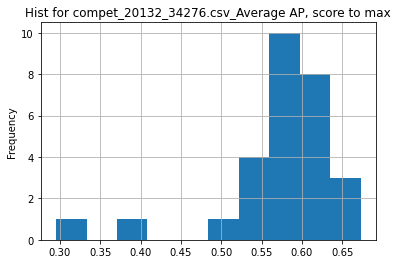

metric_column:  Average AP , score_function:  max
Utility w/mean =  1.1721351783724563
Utility w/median =  1.1532195832976078
___________________
20139_34287.csv
___________________
20139_34288.csv
     < Rank > subtask1_f1_score subtask2_f1_score Correct Submission
0  6.0000 (3)        0.8268 (7)        0.6184 (5)            1.0 (1)
1  6.0000 (3)        0.8390 (6)        0.6144 (6)            1.0 (1)
2  3.0000 (4)        0.8555 (3)        0.6522 (3)            1.0 (1)
File cannot be opened: 20139_34288.csv
___________________
20139_34289.csv
  < Rank > subtask1_f1_score subtask2_f1_score Correct Submission
0    - (1)             - (-)             - (-)            1.0 (1)
1    - (1)             - (-)             - (-)            1.0 (1)
2    - (1)             - (-)             - (-)            1.0 (1)
File cannot be opened: 20139_34289.csv
___________________
20139_34290.csv
     < Rank > subtask1_f1_score subtask2_f1_score Correct Submission
0  4.5000 (2)        0.8334 (4)        0.00

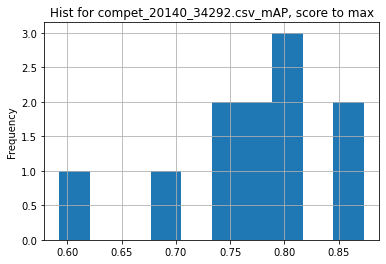

metric_column:  mAP , score_function:  max
Utility w/mean =  1.134368909101648
Utility w/median =  1.1166538756715272
___________________
20142_34295.csv
___________________
20142_34296.csv
        top-1
0  0.2307 (1)
1  0.1618 (2)
2  0.1314 (3)


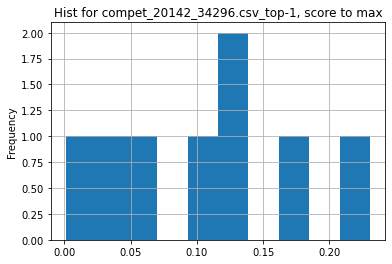

metric_column:  top-1 , score_function:  max
Utility w/mean =  2.174363807728558
Utility w/median =  1.9468354430379746
___________________
20146_34306.csv
   Average AP    FPS
0  0.5759 (1)  - (-)
1  0.5756 (2)  - (-)
2  0.5635 (3)  - (-)
File cannot be opened: 20146_34306.csv
___________________
20146_34307.csv
   Average AP    FPS
0  0.5713 (1)  - (-)
1  0.5666 (2)  - (-)
2  0.5634 (3)  - (-)
File cannot be opened: 20146_34307.csv
___________________
20146_34308.csv
___________________
20150_34315.csv
___________________
20150_34316.csv
          MAP
0  0.5625 (1)
1  0.5622 (2)
2  0.4945 (3)


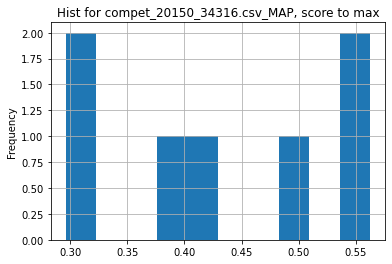

metric_column:  MAP , score_function:  max
Utility w/mean =  1.304412641621944
Utility w/median =  1.3619854721549638
___________________
20152_34319.csv
___________________
20152_34320.csv
___________________
20156_34321.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  24.28 (1)  0.87 (3)              0.52 (6)          0.00 (1)   
1  24.26 (2)  0.87 (4)              0.40 (8)          0.00 (1)   
2  24.17 (3)  0.87 (2)             0.25 (10)          0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                           0.00 (2)  
2                           0.00 (2)  


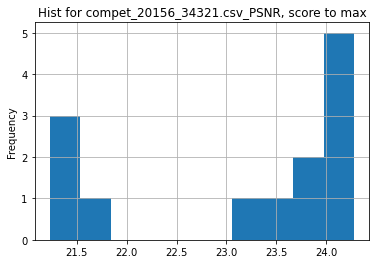

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.048324421269388
Utility w/median =  1.024905023216547
___________________
20156_34322.csv
___________________
20157_34323.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  25.02 (1)  0.89 (2)              0.53 (6)          0.00 (2)   
1  24.74 (2)  0.89 (1)             10.00 (3)          0.00 (2)   
2  24.45 (3)  0.88 (4)              0.43 (7)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                           0.00 (2)  
2                           0.00 (2)  


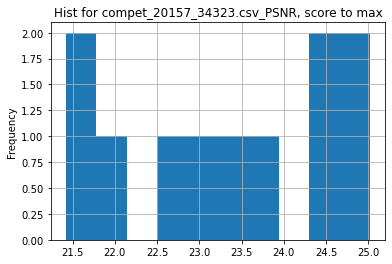

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0715203426124198
Utility w/median =  1.0664961636828645
___________________
20157_34324.csv
___________________
20158_34325.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  23.34 (1)  0.82 (1)              0.70 (4)          0.00 (2)   
1  23.05 (2)  0.81 (3)             10.43 (2)          0.00 (2)   
2  23.00 (3)  0.82 (2)              0.02 (7)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                           0.00 (2)  
2                           0.00 (2)  


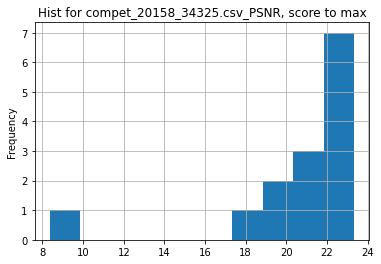

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1314796218705634
Utility w/median =  1.0750806080147397
___________________
20158_34326.csv
___________________
20159_34327.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  23.69 (1)  0.83 (1)             10.43 (1)          0.00 (1)   
1  23.34 (2)  0.82 (2)              0.70 (4)          0.00 (1)   
2  22.38 (3)  0.81 (3)              0.75 (3)          0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


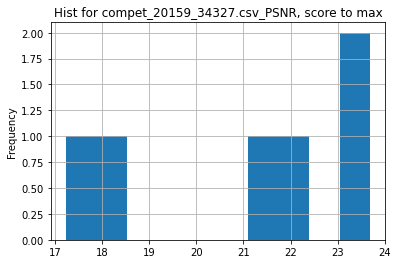

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.125326577468134
Utility w/median =  1.0837145471180238
___________________
20159_34328.csv
___________________
20162_34329.csv
___________________
20162_34330.csv
___________________
20163_34331.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  26.29 (1)  0.65 (1)             12.95 (2)          0.00 (1)   
1  25.65 (2)  0.63 (3)             10.26 (3)          0.00 (1)   
2  25.63 (3)  0.62 (5)              0.96 (8)          0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           0.00 (2)  
2                           0.00 (2)  


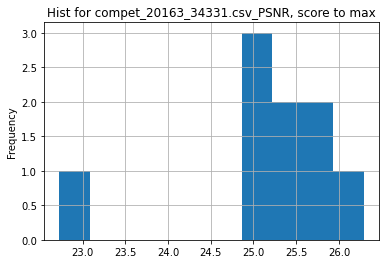

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0452818519173
Utility w/median =  1.0350393700787401
___________________
20163_34332.csv
___________________
20164_34333.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  23.26 (1)  0.66 (3)              0.00 (8)          0.00 (2)   
1  23.09 (2)  0.66 (2)             12.95 (2)          0.00 (2)   
2  23.01 (3)  0.67 (1)             -1.00 (9)         -1.00 (3)   

  Extra Data [1] / No Extra Data [0]  
0                          -1.00 (3)  
1                           1.00 (1)  
2                          -1.00 (3)  


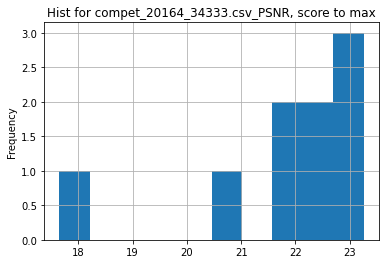

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0667549938850387
Utility w/median =  1.0491655390166892
___________________
20164_34334.csv
___________________
20165_34335.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  42.90 (1)  0.99 (1)              0.25 (4)          0.00 (1)   
1  41.91 (2)  0.99 (2)              0.08 (8)          0.00 (1)   
2  40.17 (3)  0.98 (7)              1.00 (2)          0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


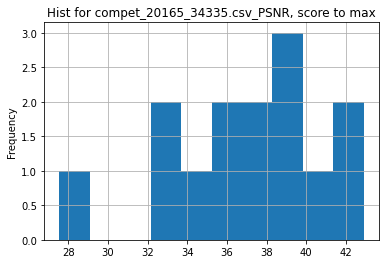

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1665307073767626
Utility w/median =  1.1414127976586406
___________________
20165_34336.csv
___________________
20166_34337.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  43.11 (1)  0.99 (1)              0.25 (3)          0.00 (1)   
1  41.62 (2)  0.99 (2)              0.36 (2)          0.00 (1)   
2  40.17 (3)  0.98 (4)              1.00 (1)          0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


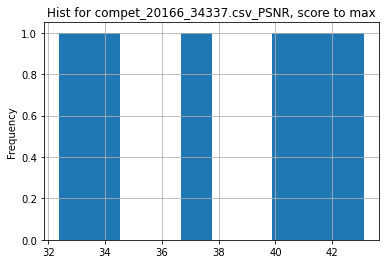

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.132734836873221
Utility w/median =  1.1175631885936486
___________________
20166_34338.csv
___________________
20167_34339.csv
        PSNR        SSIM Runtime per image [s]      Parameters  \
0  29.23 (1)  0.8254 (1)            1.580 (11)  2494593.0 (12)   
1  29.20 (2)  0.8246 (2)            1.581 (12)  2372539.0 (11)   
2  29.20 (3)  0.8237 (3)            1.296 (10)   1387258.0 (8)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            0.0 (2)  


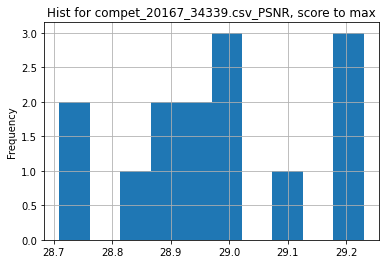

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.008651499839787
Utility w/median =  1.0086266390614216
___________________
20167_34340.csv
___________________
20168_34341.csv
        PSNR        SSIM Runtime per image [s]      Parameters  \
0  29.20 (1)  0.8246 (1)            1.581 (12)  2372539.0 (12)   
1  29.11 (2)  0.8219 (2)             0.162 (7)   1387258.0 (9)   
2  29.10 (3)  0.8216 (3)             0.100 (5)    893936.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            1.0 (1)  


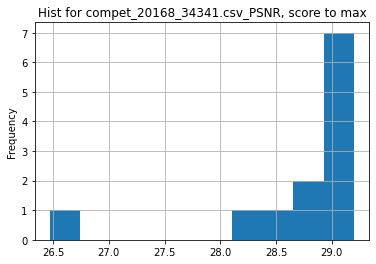

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.016949152542373
Utility w/median =  1.0079392474974112
___________________
20168_34342.csv
___________________
20169_34343.csv
        PSNR        SSIM Runtime per image [s]     Parameters  \
0  29.33 (1)  0.8266 (1)            10.598 (9)  2494593.0 (8)   
1  29.20 (2)  0.8237 (2)             1.296 (8)  1387258.0 (4)   
2  29.10 (3)  0.8216 (3)             0.100 (4)   893936.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            1.0 (1)  


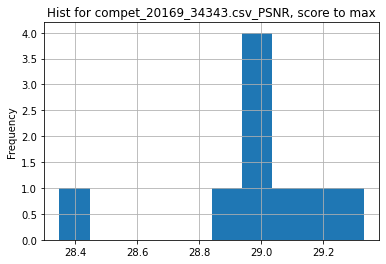

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0119221038104729
Utility w/median =  1.0110306790761805
___________________
20169_34344.csv
___________________
20199_34383.csv
          EER
0  0.0126 (1)
1  0.0149 (2)
2  0.0169 (3)


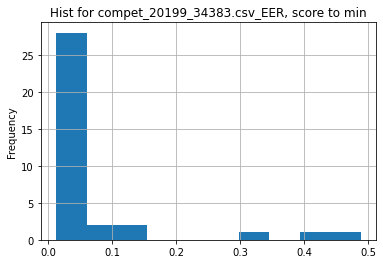

metric_column:  EER , score_function:  min
Utility w/mean =  5.328344671201814
Utility w/median =  2.198412698412698
___________________
20199_34384.csv
          EER
0  0.0087 (1)
1  0.0092 (2)
2  0.0095 (3)


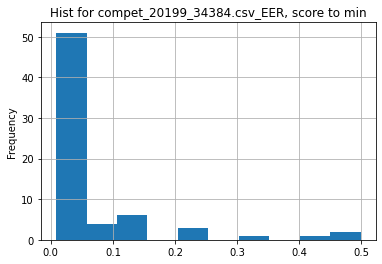

metric_column:  EER , score_function:  min
Utility w/mean =  7.875422582826236
Utility w/median =  2.9137931034482762
___________________
20200_34385.csv
          EER
0  0.0142 (1)
1  0.0154 (2)
2  0.0171 (3)


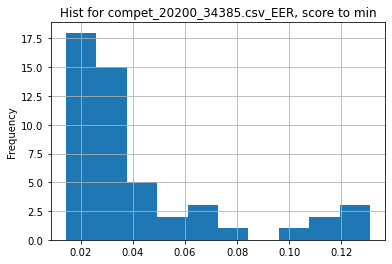

metric_column:  EER , score_function:  min
Utility w/mean =  3.0990140845070417
Utility w/median =  2.3380281690140845
___________________
20200_34386.csv
          EER
0  0.0069 (1)
1  0.0075 (2)
2  0.0084 (3)


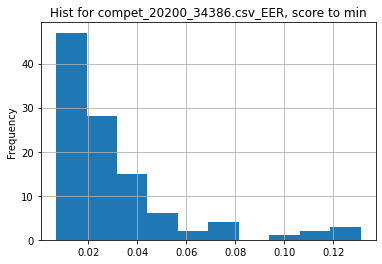

metric_column:  EER , score_function:  min
Utility w/mean =  4.275496511003756
Utility w/median =  3.239130434782609
___________________
20208_34395.csv
___________________
20208_34396.csv
___________________
20208_34397.csv
   Prediction
0  0.5340 (1)
1  0.4952 (2)
2  0.4713 (3)


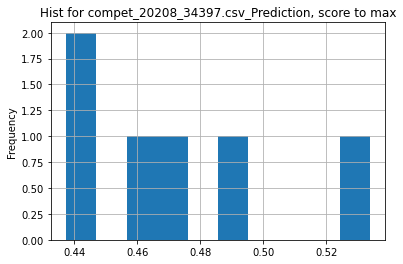

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.129083412622899
Utility w/median =  1.1507380670186405
___________________
20212_34398.csv
___________________
20212_34399.csv
___________________
20212_34400.csv
   Prediction
0  0.7821 (1)
1  0.7688 (2)
2  0.7446 (3)


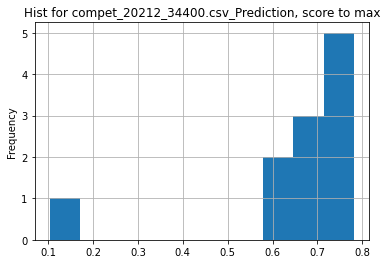

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.2063351842503787
Utility w/median =  1.1131511528608027
___________________
20216_34410.csv
___________________
20216_34411.csv
___________________
20216_34412.csv
___________________
20217_34413.csv
___________________
20217_34414.csv
___________________
20217_34415.csv
   Prediction
0  0.9235 (1)
1  0.9219 (2)
2  0.9202 (3)


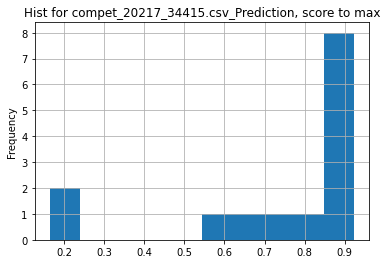

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.2454244210688552
Utility w/median =  1.0644919601175724
___________________
20224_34438.csv
___________________
20224_34440.csv
___________________
20224_36506.csv
File cannot be opened: 20224_36506.csv
___________________
20228_34447.csv
___________________
20228_34448.csv
___________________
20228_34449.csv
       F_0.5           P           R           TP          FP           FN
0  78.79 (1)  84.35 (10)   62.36 (8)  3368.0 (11)  625.0 (43)  2033.0 (46)
1  77.93 (2)   86.43 (1)  55.93 (23)  2917.0 (29)  458.0 (50)  2298.0 (34)
2  77.26 (3)   85.95 (2)  55.01 (29)  2960.0 (26)  484.0 (49)  2421.0 (23)


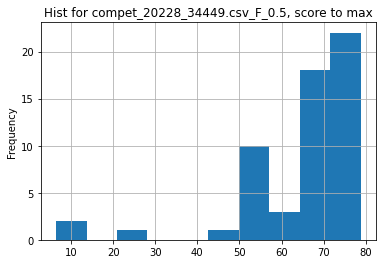

metric_column:  F_0.5 , score_function:  max
Utility w/mean =  1.214428646371341
Utility w/median =  1.1284732168433116
___________________
20229_34450.csv
___________________
20229_34451.csv
___________________
20229_34452.csv
       F_0.5          P           R           TP           FP           FN
0  76.05 (1)  84.44 (1)  54.42 (14)  2953.0 (14)   544.0 (15)   2473.0 (3)
1  75.05 (2)  82.51 (2)   55.11 (9)  3019.0 (10)   640.0 (14)   2459.0 (5)
2  74.86 (3)  77.68 (4)   65.39 (2)   3490.0 (5)  1003.0 (11)  1847.0 (14)


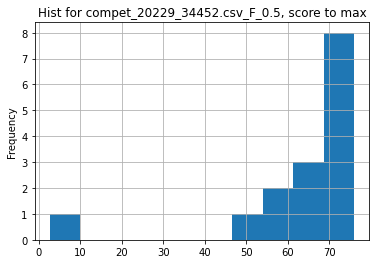

metric_column:  F_0.5 , score_function:  max
Utility w/mean =  1.196632749396832
Utility w/median =  1.0802556818181817
___________________
20230_34453.csv
___________________
20230_34454.csv
___________________
20230_34455.csv
___________________
20235_34475.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  27.07 (1)  0.69 (1)             2.85 (11)         0.00 (2)   
1  27.01 (2)  0.69 (2)             21.79 (8)         0.00 (2)   
2  26.99 (3)  0.69 (3)             80.00 (3)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                           0.00 (2)  
2                           0.00 (2)  


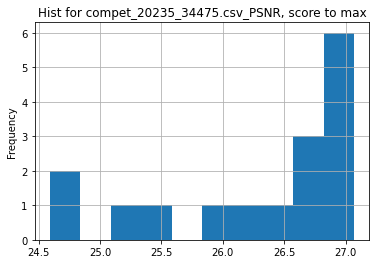

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.029913920197841
Utility w/median =  1.0144275810380363
___________________
20235_34476.csv
___________________
20236_34477.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  27.07 (1)  0.69 (1)              2.85 (4)         0.00 (1)   
1  27.06 (2)  0.69 (2)             80.00 (1)         0.00 (1)   
2  26.82 (3)  0.68 (3)             25.85 (3)         0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


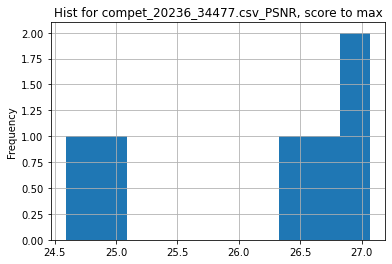

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0348518636508444
Utility w/median =  1.0161411411411412
___________________
20236_34478.csv
___________________
20244_34486.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  23.80 (1)  0.67 (1)             1.03 (10)         0.00 (2)   
1  23.17 (2)  0.66 (2)              0.83 (9)         0.00 (2)   
2  23.13 (3)  0.65 (4)              0.50 (6)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (3)  
1                           0.00 (2)  
2                           0.00 (2)  


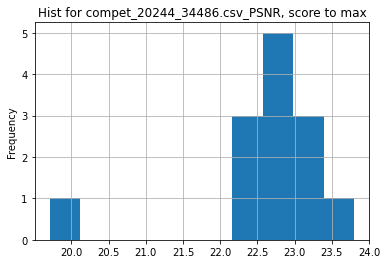

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.052345158327948
Utility w/median =  1.0452349582784366
___________________
20244_34487.csv
___________________
20247_34491.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  31.84 (1)  0.90 (1)             10.00 (2)         1.00 (1)   
1  31.59 (2)  0.89 (3)             -1.00 (5)        -1.00 (3)   
2  31.59 (3)  0.89 (2)             -1.00 (5)        -1.00 (3)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                          -1.00 (2)  
2                          -1.00 (2)  


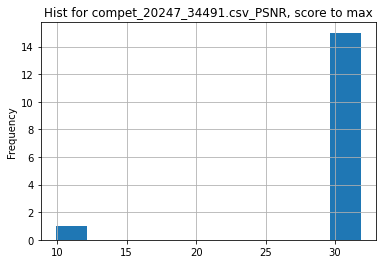

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.07433729095932
Utility w/median =  1.02775984506133
___________________
20247_34492.csv
___________________
20248_34493.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  21.54 (1)  0.60 (1)              0.50 (4)         0.00 (2)   
1  21.52 (2)  0.60 (2)             -1.00 (6)        -1.00 (3)   
2  21.46 (3)  0.60 (3)              0.51 (3)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                          -1.00 (3)  
2                           0.00 (2)  


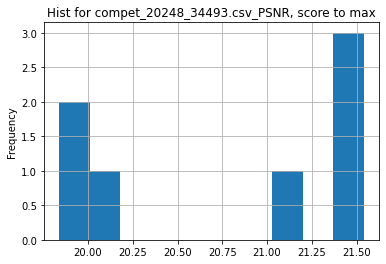

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.036858753954064
Utility w/median =  1.0174775625885686
___________________
20248_34494.csv
___________________
20249_34495.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  21.66 (1)  0.61 (1)              0.42 (3)         0.00 (2)   
1  21.50 (2)  0.60 (2)             -1.00 (6)        -1.00 (3)   
2  21.46 (3)  0.60 (3)              0.89 (2)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                          -1.00 (3)  
2                           0.00 (2)  


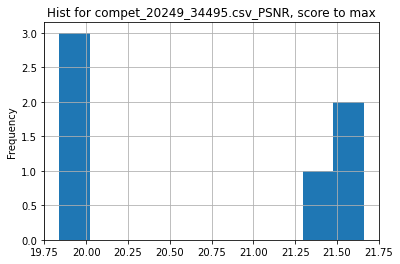

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0462083400418611
Utility w/median =  1.0468825519574674
___________________
20249_34496.csv
___________________
20256_34497.csv
  mean_acc_all mean_acc_classes
0    0.607 (1)        0.618 (1)
1    0.577 (2)        0.595 (2)
2    0.542 (3)        0.551 (3)


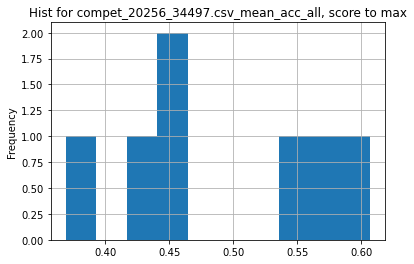

metric_column:  mean_acc_all , score_function:  max
Utility w/mean =  1.236972343522562
Utility w/median =  1.316702819956616
___________________
20256_34498.csv
  mean_acc_all mean_acc_classes
0    0.760 (1)            - (-)
1    0.716 (2)            - (-)
2    0.696 (3)            - (-)
File cannot be opened: 20256_34498.csv
___________________
20257_34499.csv
___________________
20257_34500.csv
  mean_acc_all mean_acc_classes
0    0.720 (1)            - (-)
1    0.714 (2)            - (-)
2    0.713 (3)            - (-)
File cannot be opened: 20257_34500.csv
___________________
20288_34565.csv
File cannot be opened: 20288_34565.csv
___________________
20288_34566.csv
File cannot be opened: 20288_34566.csv
___________________
20288_34567.csv
File cannot be opened: 20288_34567.csv
___________________
20288_34568.csv
File cannot be opened: 20288_34568.csv
___________________
20307_34590.csv
     BLEU-1    METEOR   ROUGE-L
0  0.75 (1)  0.71 (1)  0.76 (1)
1  0.73 (2)  0.70 (2)  0.75 (2)


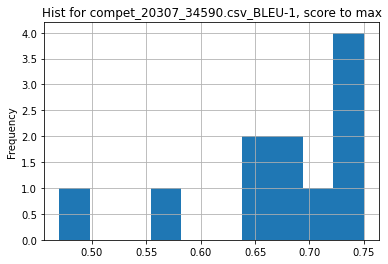

metric_column:  BLEU-1 , score_function:  max
Utility w/mean =  1.1194029850746272
Utility w/median =  1.0869565217391306
___________________
20318_34595.csv
___________________
20318_34596.csv
   Task1   Task2  AVG 1  Duration
0  - (-)   - (-)  - (-)  0.00 (1)
1  - (-)   - (-)  - (-)  0.00 (1)
2  Task1  Task 2  AVG 2       NaN
File cannot be opened: 20318_34596.csv
___________________
20318_34597.csv
   Task1   Task2  AVG 1  Duration
0  - (-)   - (-)  - (-)  0.00 (1)
1  - (-)   - (-)  - (-)  0.00 (1)
2  Task1  Task 2  AVG 2       NaN
File cannot be opened: 20318_34597.csv
___________________
20318_34598.csv
___________________
20331_34612.csv
        mIoU    accuracy         road     sidewalk     parking other-ground  \
0  0.734 (1)   0.925 (4)   0.921 (25)   0.785 (14)   0.725 (5)    0.426 (3)   
1  0.732 (2)  0.917 (24)  0.897 (197)  0.746 (111)  0.674 (35)    0.400 (5)   
2  0.729 (3)   0.924 (6)   0.923 (19)   0.786 (13)  0.670 (42)   0.344 (17)   

     building         car car (

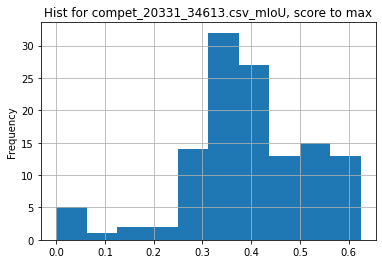

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.5854763026863108
Utility w/median =  1.6103225806451613
___________________
20369_34632.csv
___________________
20388_34669.csv
  recognition rate
0     0.964000 (1)
1     0.958700 (2)
2     0.957300 (3)


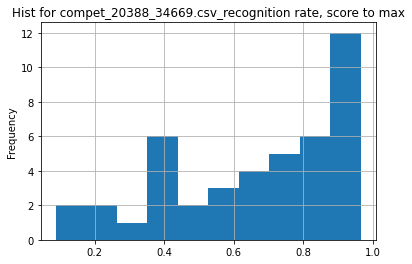

metric_column:  recognition rate , score_function:  max
Utility w/mean =  1.4489653243847869
Utility w/median =  1.2910137940270523
___________________
20388_34670.csv
  recognition rate
0     0.906300 (1)
1     0.903000 (2)
2     0.893500 (3)


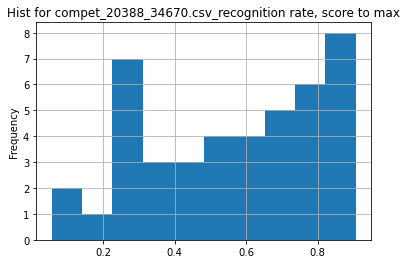

metric_column:  recognition rate , score_function:  max
Utility w/mean =  1.6158965385699835
Utility w/median =  1.5545454545454547
___________________
20395_34689.csv
___________________
20395_34690.csv
___________________
20395_34691.csv
  Prediction score  Duration
0       0.9526 (1)  0.00 (1)
1       0.9494 (2)  0.00 (1)
2       0.9486 (3)  0.00 (1)


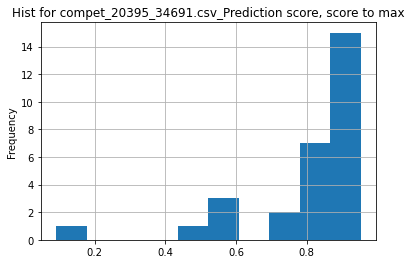

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.1839068144903813
Utility w/median =  1.099111572631822
___________________
20414_34703.csv
File cannot be opened: 20414_34703.csv
___________________
20415_34704.csv
File cannot be opened: 20415_34704.csv
___________________
20449_34734.csv
     EXTRAP.    INTERP.     OBJECT      SHAPE
0  33.66 (1)  17.45 (1)  27.76 (1)  23.39 (1)
1  36.43 (2)  18.30 (2)  29.86 (2)  24.51 (2)
2  38.12 (3)  19.35 (3)  29.88 (3)  26.16 (3)


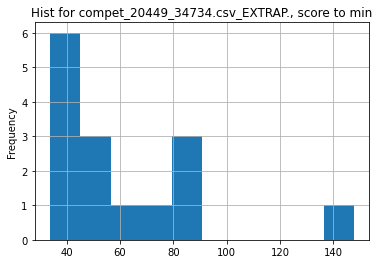

metric_column:  EXTRAP. , score_function:  min
Utility w/mean =  1.8074272133095663
Utility w/median =  1.4016636957813429
___________________
20468_34763.csv
  Relation Extraction (all) F-score Entity Mentions F-score  \
0                        100.00 (1)              100.00 (1)   
1                         86.01 (2)               77.86 (4)   
2                         86.01 (2)               77.86 (4)   

  Relation Extraction (all) Precision Relation Extraction (all) Recall  \
0                          100.00 (1)                       100.00 (1)   
1                           75.84 (2)                        99.32 (2)   
2                           75.84 (2)                        99.32 (2)   

  Entity Mentions Precision Entity Mentions Recall ExecutionTime  
0                100.00 (1)             100.00 (1)      0.00 (1)  
1                 87.78 (3)              69.95 (4)      0.00 (1)  
2                 87.78 (3)              69.95 (4)      0.00 (1)  


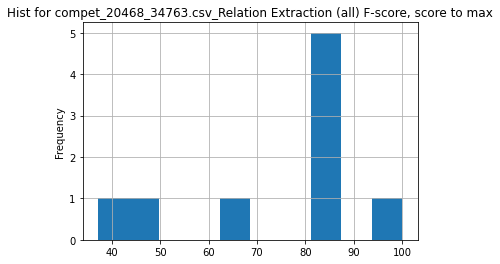

metric_column:  Relation Extraction (all) F-score , score_function:  max
Utility w/mean =  1.3209457971907888
Utility w/median =  1.162655505173817
___________________
20468_34764.csv
  Relation Extraction (all) F-score Entity Mentions F-score  \
0                         67.09 (1)               87.35 (1)   
1                         62.18 (2)               82.76 (2)   
2                         50.15 (3)               73.56 (5)   

  Relation Extraction (all) Precision Relation Extraction (all) Recall  \
0                           67.32 (1)                        66.85 (1)   
1                           62.27 (2)                        62.10 (2)   
2                           53.22 (3)                        47.41 (4)   

  Entity Mentions Precision Entity Mentions Recall ExecutionTime  
0                 88.25 (1)              86.48 (1)      0.00 (1)  
1                 84.77 (5)              80.84 (2)      0.00 (1)  
2                 87.68 (2)              63.35 (5)      0.00 (1) 

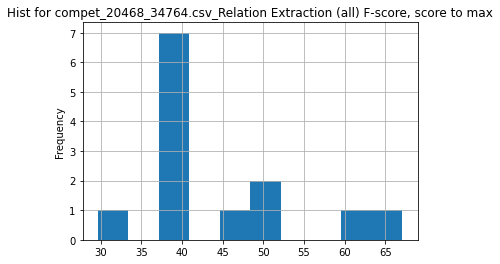

metric_column:  Relation Extraction (all) F-score , score_function:  max
Utility w/mean =  1.5016701101928374
Utility w/median =  1.7158567774936062
___________________
20515_34808.csv
  Global Mean     J-Mean   J-Recall      J-Decay     F-Mean   F-Recall  \
0   0.619 (1)  0.577 (1)  0.671 (1)    0.100 (6)  0.660 (2)  0.711 (2)   
1   0.612 (2)  0.561 (2)  0.635 (3)  -0.002 (16)  0.664 (1)  0.719 (1)   
2   0.598 (3)  0.560 (3)  0.651 (2)    0.078 (7)  0.637 (4)  0.684 (5)   

      F-Decay  
0   0.134 (6)  
1  0.005 (16)  
2   0.110 (7)  


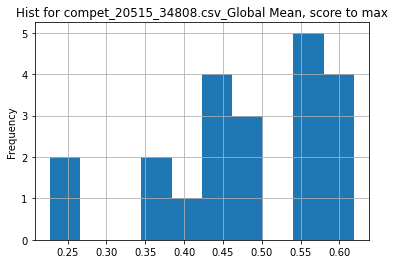

metric_column:  Global Mean , score_function:  max
Utility w/mean =  1.2951081000298896
Utility w/median =  1.2736625514403292
___________________
20515_34811.csv
File cannot be opened: 20515_34811.csv
___________________
20516_34812.csv
  Global Mean     J-Mean   J-Recall      J-Decay     F-Mean   F-Recall  \
0   0.851 (1)  0.818 (1)  0.904 (2)  0.073 (136)  0.884 (2)  0.947 (2)   
1   0.847 (2)  0.809 (2)  0.906 (1)  0.062 (138)  0.885 (1)  0.948 (1)   
2   0.841 (3)  0.805 (3)  0.893 (3)  0.078 (132)  0.877 (3)  0.939 (4)   

       F-Decay  
0  0.074 (133)  
1  0.056 (138)  
2  0.077 (132)  


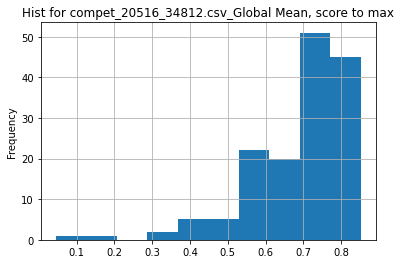

metric_column:  Global Mean , score_function:  max
Utility w/mean =  1.2334627010842099
Utility w/median =  1.1786703601108033
___________________
20516_34813.csv
  Global Mean     J-Mean   J-Recall     J-Decay     F-Mean   F-Recall  \
0   0.841 (1)  0.815 (1)  0.891 (1)  0.142 (10)  0.867 (1)  0.929 (2)   
1   0.838 (2)  0.811 (2)  0.884 (2)   0.181 (7)  0.865 (2)  0.933 (1)   
2   0.795 (3)  0.770 (3)  0.857 (3)   0.149 (9)  0.821 (4)  0.896 (4)   

      F-Decay  
0  0.161 (10)  
1   0.178 (8)  
2   0.171 (9)  


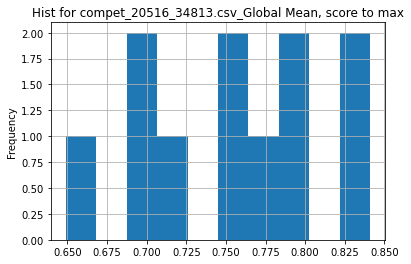

metric_column:  Global Mean , score_function:  max
Utility w/mean =  1.1117654128109604
Utility w/median =  1.106578947368421
___________________
20537_34852.csv
File cannot be opened: 20537_34852.csv
___________________
20537_34853.csv
___________________
20594_34928.csv
___________________
20595_34929.csv
___________________
20595_34930.csv
___________________
20597_34932.csv
___________________
20612_34955.csv
___________________
20654_34975.csv
     correct
0  1.000 (1)
1  1.000 (1)
2  1.000 (1)


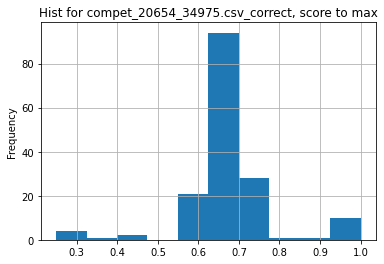

metric_column:  correct , score_function:  max
Utility w/mean =  1.4785473728403626
Utility w/median =  1.4914243102162563
___________________
20660_34987.csv
___________________
20660_34988.csv
         AP      AP50      AP75       APm       APl
0  0.72 (1)  0.94 (1)  0.85 (1)  0.65 (1)  0.74 (1)
1  0.67 (2)  0.92 (3)  0.80 (2)  0.60 (2)  0.70 (2)
2  0.66 (3)  0.92 (6)  0.79 (3)  0.58 (3)  0.69 (3)


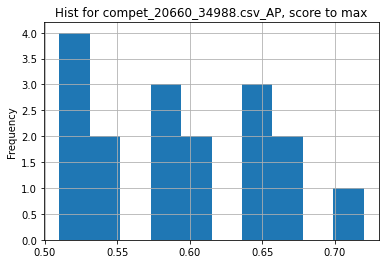

metric_column:  AP , score_function:  max
Utility w/mean =  1.2106824925816022
Utility w/median =  1.2203389830508475
___________________
20693_35045.csv
   F1-score Precision True Positive Rate False Positives Count
0  0.92 (1)  1.00 (1)           0.85 (1)              0.00 (1)
1  0.92 (1)  1.00 (1)           0.85 (1)              0.00 (1)
2  0.87 (2)  0.89 (4)           0.85 (1)              2.00 (3)
File cannot be opened: 20693_35045.csv
___________________
20693_35046.csv
  F1-score Precision True Positive Rate False Positives Count
0    - (-)       NaN                NaN                   NaN
1    - (-)       NaN                NaN                   NaN
2    - (-)       NaN                NaN                   NaN
File cannot be opened: 20693_35046.csv
___________________
20696_35048.csv
___________________
20696_35049.csv
___________________
20696_35050.csv
       CIDEr     Bleu-1     Bleu-2     Bleu-3     Bleu-4     METEOR    ROUGE-L
0  0.824 (1)  0.835 (1)  0.687 (1)  0.542 (1)

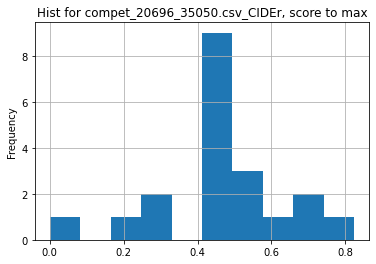

metric_column:  CIDEr , score_function:  max
Utility w/mean =  1.773377811255784
Utility w/median =  1.807017543859649
___________________
20696_35051.csv
       CIDEr     Bleu-1     Bleu-2     Bleu-3     Bleu-4     METEOR    ROUGE-L
0  0.644 (1)  0.830 (1)  0.651 (1)  0.469 (1)  0.326 (1)  0.325 (1)  0.567 (1)
1  0.568 (2)  0.820 (2)  0.639 (2)  0.461 (2)  0.322 (2)  0.321 (2)  0.562 (2)
2  0.545 (3)  0.819 (3)  0.628 (4)  0.451 (5)  0.319 (4)  0.316 (3)  0.557 (3)


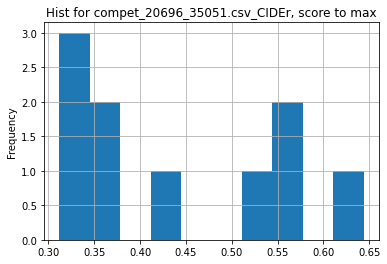

metric_column:  CIDEr , score_function:  max
Utility w/mean =  1.4686431014823262
Utility w/median =  1.6140350877192982
___________________
20717_35063.csv
  RE_ignore_annotated_F1 RE_ignore_distant_F1      RE_F1      Evi_F1
0              0.658 (1)            0.616 (1)  0.675 (2)  0.000 (30)
1              0.658 (2)            0.610 (2)  0.678 (1)  0.000 (30)
2              0.652 (3)            0.602 (4)  0.673 (3)  0.000 (30)


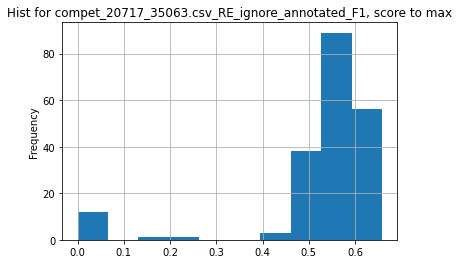

metric_column:  RE_ignore_annotated_F1 , score_function:  max
Utility w/mean =  1.2472633185165507
Utility w/median =  1.154385964912281
___________________
20767_35102.csv
___________________
20767_35104.csv
___________________
20771_35109.csv
  O1 occluded relative O1 occluded absolute O1 visible relative  \
0           0.1241 (1)           0.2398 (1)          0.0065 (1)   
1           0.1861 (2)           0.3527 (2)          0.1574 (4)   
2           0.1870 (3)           0.4403 (5)          0.0491 (3)   

  O1 visible absolute O1 all relative O1 all absolute O2 occluded relative  \
0          0.0611 (1)      0.0653 (1)      0.1505 (1)           0.2917 (2)   
1          0.1948 (3)      0.1718 (4)      0.2701 (3)           0.5028 (6)   
2          0.3703 (5)      0.1181 (3)      0.4185 (5)           0.3167 (3)   

  O2 occluded absolute O2 visible relative O2 visible absolute  \
0           0.3296 (2)          0.0759 (2)          0.1194 (1)   
1           0.5098 (5)          0.3519 (4

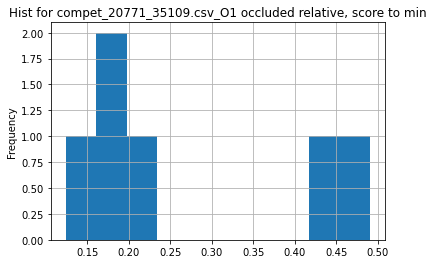

metric_column:  O1 occluded relative , score_function:  min
Utility w/mean =  2.1786193929626645
Utility w/median =  1.5668815471394038
___________________
20789_35157.csv
     correct
0  0.806 (1)
1  0.806 (1)
2  0.755 (2)


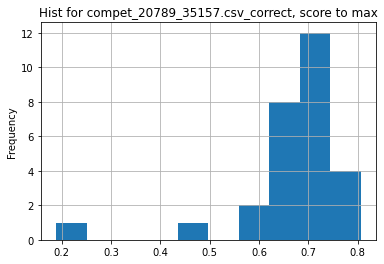

metric_column:  correct , score_function:  max
Utility w/mean =  1.1995960240259396
Utility w/median =  1.1481481481481484
___________________
20794_35160.csv
         AP AP IoU=.50 AP IoU=.75  AP large AP medium  AP small  AR large  \
0  0.58 (1)   0.76 (1)   0.64 (1)  0.72 (1)  0.62 (1)  0.43 (1)  0.87 (1)   
1  0.56 (2)   0.74 (3)   0.61 (2)  0.70 (2)  0.60 (2)  0.40 (3)  0.85 (2)   
2  0.54 (3)   0.74 (3)   0.58 (4)  0.68 (6)  0.58 (4)  0.40 (2)  0.82 (7)   

   AR max=1 AR max=10 AR max=100 AR medium  AR small  
0  0.41 (1)  0.69 (1)   0.74 (1)  0.78 (1)  0.61 (1)  
1  0.40 (2)  0.67 (2)   0.72 (2)  0.76 (2)  0.57 (2)  
2  0.40 (3)  0.65 (4)   0.69 (5)  0.72 (5)  0.55 (3)  


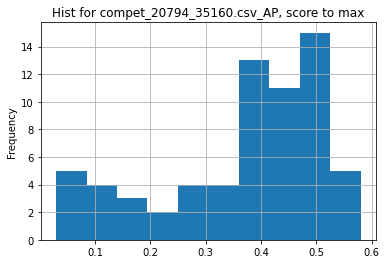

metric_column:  AP , score_function:  max
Utility w/mean =  1.5837815473727763
Utility w/median =  1.487179487179487
___________________
20794_35161.csv
         AP AP IoU=.50 AP IoU=.75  AP large AP medium  AP small  AR large  \
0  0.63 (1)   0.81 (1)   0.70 (1)  0.76 (1)  0.66 (1)  0.47 (1)  0.92 (1)   
1  0.62 (2)   0.80 (2)   0.68 (3)  0.75 (2)  0.65 (2)  0.45 (2)  0.89 (3)   
2  0.61 (3)   0.79 (5)   0.68 (2)  0.74 (5)  0.64 (3)  0.44 (3)  0.89 (4)   

   AR max=1 AR max=10 AR max=100 AR medium  AR small  
0  0.44 (1)  0.74 (1)   0.79 (1)  0.83 (1)  0.66 (1)  
1  0.43 (2)  0.72 (3)   0.77 (3)  0.80 (3)  0.63 (3)  
2  0.43 (4)  0.72 (4)   0.77 (4)  0.80 (4)  0.62 (5)  


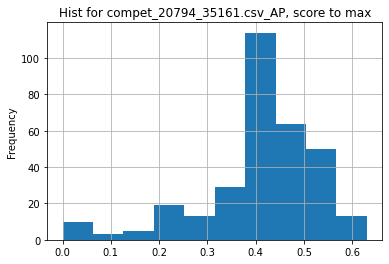

metric_column:  AP , score_function:  max
Utility w/mean =  1.5308679474523494
Utility w/median =  1.4318181818181819
___________________
20794_35213.csv
File cannot be opened: 20794_35213.csv
___________________
20796_35164.csv
         AP AP IoU=.50 AP IoU=.75  AP large AP medium  AP small  AR large  \
0  0.47 (1)   0.70 (1)   0.51 (1)  0.61 (5)  0.50 (1)  0.31 (1)  0.75 (1)   
1  0.45 (2)   0.69 (3)   0.50 (2)  0.65 (1)  0.49 (2)  0.25 (4)  0.74 (2)   
2  0.45 (3)   0.69 (2)   0.49 (3)  0.62 (3)  0.48 (3)  0.27 (3)  0.70 (7)   

   AR max=1 AR max=10 AR max=100 AR medium  AR small  
0  0.36 (1)  0.57 (1)   0.60 (1)  0.64 (1)  0.44 (1)  
1  0.35 (2)  0.56 (2)   0.59 (2)  0.63 (2)  0.41 (3)  
2  0.34 (3)  0.54 (5)   0.56 (5)  0.59 (6)  0.41 (4)  


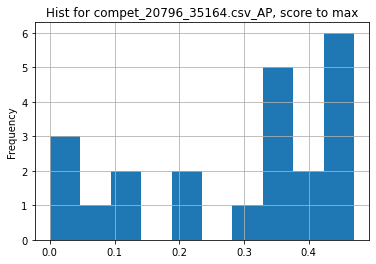

metric_column:  AP , score_function:  max
Utility w/mean =  1.657051282051282
Utility w/median =  1.323943661971831
___________________
20796_35165.csv
         AP AP IoU=.50 AP IoU=.75  AP large AP medium  AP small  AR large  \
0  0.55 (1)   0.80 (1)   0.60 (1)  0.69 (4)  0.57 (4)  0.38 (1)  0.84 (1)   
1  0.54 (2)   0.78 (2)   0.59 (2)  0.68 (7)  0.56 (6)  0.37 (2)  0.81 (2)   
2  0.54 (3)   0.76 (3)   0.59 (2)  0.68 (6)  0.57 (5)  0.37 (3)  0.81 (3)   

   AR max=1 AR max=10 AR max=100 AR medium  AR small  
0  0.40 (1)  0.65 (1)   0.69 (1)  0.72 (1)  0.54 (1)  
1  0.39 (2)  0.63 (2)   0.67 (3)  0.69 (3)  0.53 (3)  
2  0.39 (3)  0.63 (3)   0.67 (2)  0.70 (2)  0.53 (2)  


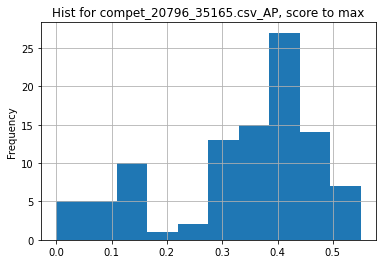

metric_column:  AP , score_function:  max
Utility w/mean =  1.642533936651585
Utility w/median =  1.4473684210526316
___________________
20796_35166.csv
         AP AP IoU=.50 AP IoU=.75  AP large AP medium  AP small  AR large  \
0  0.53 (1)   0.77 (1)   0.58 (1)  0.67 (1)  0.56 (1)  0.36 (1)  0.80 (1)   
1  0.51 (2)   0.74 (2)   0.56 (2)  0.65 (3)  0.54 (2)  0.36 (2)  0.78 (2)   
2  0.48 (3)   0.71 (5)   0.52 (3)  0.60 (7)  0.50 (3)  0.32 (3)  0.74 (6)   

   AR max=1 AR max=10 AR max=100 AR medium  AR small  
0  0.38 (1)  0.62 (1)   0.66 (1)  0.69 (1)  0.51 (2)  
1  0.38 (2)  0.61 (2)   0.65 (2)  0.68 (2)  0.51 (1)  
2  0.36 (5)  0.58 (5)   0.61 (4)  0.64 (6)  0.47 (3)  


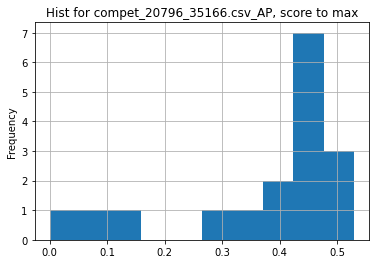

metric_column:  AP , score_function:  max
Utility w/mean =  1.3968992248062018
Utility w/median =  1.1521739130434783
___________________
20798_35179.csv
File cannot be opened: 20798_35179.csv
___________________
20798_35180.csv
___________________
20798_35181.csv
File cannot be opened: 20798_35181.csv
___________________
20798_35182.csv
File cannot be opened: 20798_35182.csv
___________________
20798_35183.csv
___________________
20798_35184.csv
File cannot be opened: 20798_35184.csv
___________________
20798_35185.csv
File cannot be opened: 20798_35185.csv
___________________
20798_35186.csv
___________________
20798_35187.csv
File cannot be opened: 20798_35187.csv
___________________
20798_35188.csv
File cannot be opened: 20798_35188.csv
___________________
20798_35189.csv
___________________
20798_35190.csv
File cannot be opened: 20798_35190.csv
___________________
20815_35233.csv
___________________
20815_35234.csv
        Rank    Score 1    Score 2    Score 3    Score 4
0  0.799 

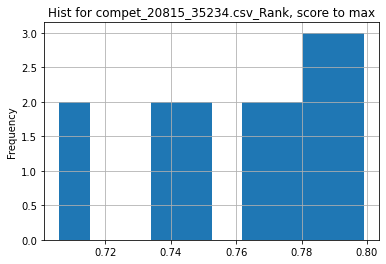

metric_column:  Rank , score_function:  max
Utility w/mean =  1.0464963981663395
Utility w/median =  1.0396877033181524
___________________
20815_35235.csv
        Rank    Score 1    Score 2    Score 3    Score 4
0  0.823 (1)  0.724 (1)  0.819 (1)  0.862 (1)  0.887 (1)
1  0.814 (2)  0.715 (2)  0.811 (3)  0.851 (6)  0.880 (3)
2  0.810 (3)  0.694 (5)  0.812 (2)  0.854 (3)  0.879 (4)


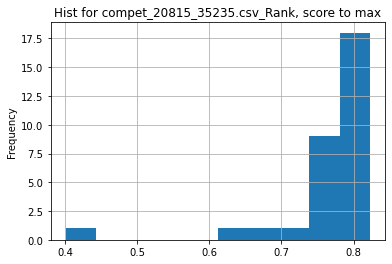

metric_column:  Rank , score_function:  max
Utility w/mean =  1.083584625185814
Utility w/median =  1.053777208706786
___________________
20815_35236.csv
        Rank    Score 1    Score 2    Score 3    Score 4
0  0.823 (1)  0.724 (1)  0.819 (1)  0.862 (1)  0.887 (1)
1  0.814 (2)  0.715 (2)  0.811 (3)  0.851 (7)  0.880 (4)
2  0.810 (3)  0.694 (5)  0.812 (2)  0.854 (3)  0.879 (5)


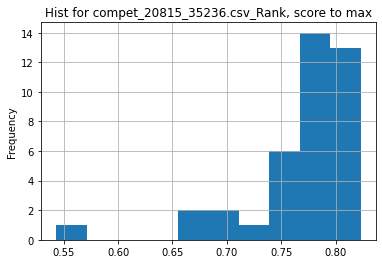

metric_column:  Rank , score_function:  max
Utility w/mean =  1.0751683247914785
Utility w/median =  1.053777208706786
___________________
20865_35304.csv
___________________
20865_35305.csv
___________________
20865_35306.csv
___________________
20900_35374.csv
___________________
20900_35375.csv
___________________
20900_38840.csv
File cannot be opened: 20900_38840.csv
___________________
20900_38841.csv
File cannot be opened: 20900_38841.csv
___________________
20900_38842.csv
File cannot be opened: 20900_38842.csv
___________________
20900_38843.csv
File cannot be opened: 20900_38843.csv
___________________
20905_35399.csv
___________________
20905_35400.csv
___________________
20905_35401.csv
       score         EN       ET          HR         FI          SL
0  0.774 (1)  0.774 (1)  0.0 (1)   0.634 (4)  0.745 (2)   0.605 (5)
1  0.768 (2)  0.768 (2)  0.0 (1)   0.594 (6)  0.772 (1)   0.583 (7)
2  0.760 (3)  0.760 (3)  0.0 (1)  0.000 (12)  0.428 (8)  0.000 (12)
File cannot be opened

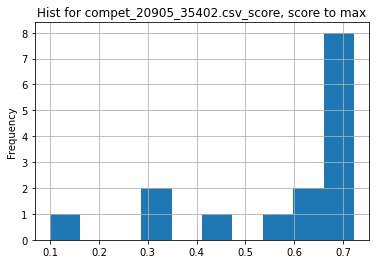

metric_column:  score , score_function:  max
Utility w/mean =  1.2402790484903932
Utility w/median =  1.0524017467248907
___________________
20905_35403.csv
___________________
20905_35404.csv
       score         EN       ET         HR         FI         SL
0  0.766 (1)  0.766 (1)  0.0 (1)  0.565 (2)  0.354 (2)  0.483 (3)
1  0.746 (2)  0.746 (2)  0.0 (1)  0.402 (4)  0.289 (3)  0.516 (1)
2  0.723 (3)  0.723 (3)  0.0 (1)  0.000 (5)  0.000 (4)  0.000 (4)


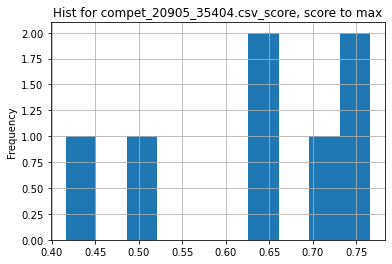

metric_column:  score , score_function:  max
Utility w/mean =  1.215873015873016
Utility w/median =  1.2101105845181674
___________________
20913_35417.csv
     EXTRAP.   INTERP.     SHAPE    ARTIC.    VIEWP.
0  10.65 (1)  3.98 (4)  9.31 (1)  3.50 (2)  5.92 (1)
1  11.90 (2)  5.14 (9)  9.64 (3)  4.98 (9)  7.81 (6)
2  12.11 (3)  3.37 (1)  9.44 (2)  3.74 (4)  6.22 (2)


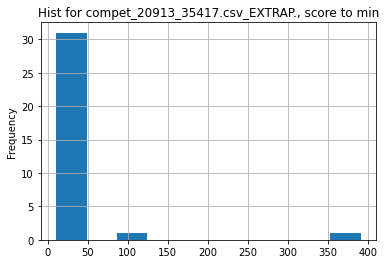

metric_column:  EXTRAP. , score_function:  min
Utility w/mean =  3.1500640204865555
Utility w/median =  1.5183098591549298
___________________
20948_35505.csv
File cannot be opened: 20948_35505.csv
___________________
20948_35506.csv
___________________
20948_35507.csv
File cannot be opened: 20948_35507.csv
___________________
20970_35531.csv
          RMSE       RMSE@10       RMSE@20       RMSE@30       RMSE@40
0  0.51276 (1)  0.82813 (73)  0.70144 (76)  0.61743 (79)  0.55947 (81)
1  0.51387 (2)  0.82040 (78)  0.69825 (79)  0.61579 (80)  0.55936 (82)
2  0.51622 (3)  0.81504 (80)  0.69178 (81)  0.61260 (82)  0.55965 (80)
File cannot be opened: 20970_35531.csv
___________________
20970_35532.csv
    RMSE RMSE@10  RMSE@20  RMSE@30  RMSE@40
0  - (-)     NaN      NaN      NaN      NaN
1  - (-)     NaN      NaN      NaN      NaN
2  - (-)     NaN      NaN      NaN      NaN
File cannot be opened: 20970_35532.csv
___________________
20970_35533.csv
          RMSE       RMSE@10       RMSE@20   

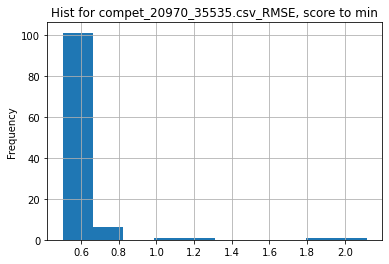

metric_column:  RMSE , score_function:  min
Utility w/mean =  1.2100537645127638
Utility w/median =  1.1431106326135934
___________________
20970_35536.csv
    RMSE RMSE@10  RMSE@20  RMSE@30  RMSE@40
0  - (-)     NaN      NaN      NaN      NaN
1  - (-)     NaN      NaN      NaN      NaN
2  - (-)     NaN      NaN      NaN      NaN
File cannot be opened: 20970_35536.csv
___________________
20972_35538.csv
___________________
20972_35540.csv
___________________
20972_35542.csv
___________________
21080_35720.csv
  Subtask A Accuracy Subtask B Accuracy Subtask C BLEU
0          100.0 (1)          100.0 (1)      100.0 (1)
1          100.0 (1)           96.3 (3)      100.0 (1)
2          100.0 (1)           0.0 (13)        0.0 (8)


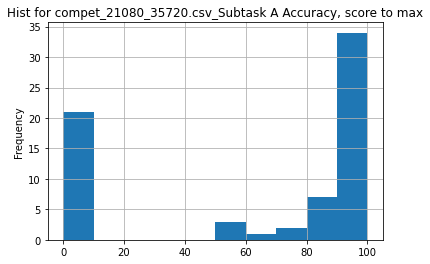

metric_column:  Subtask A Accuracy , score_function:  max
Utility w/mean =  1.609162762080553
Utility w/median =  1.1117287381878822
___________________
21080_35721.csv
  Subtask A Accuracy Subtask B Accuracy Subtask C BLEU
0           97.0 (1)            0.0 (1)        0.0 (1)
1           96.7 (2)            0.0 (1)        0.0 (1)
2           96.4 (3)            0.0 (1)        0.0 (1)


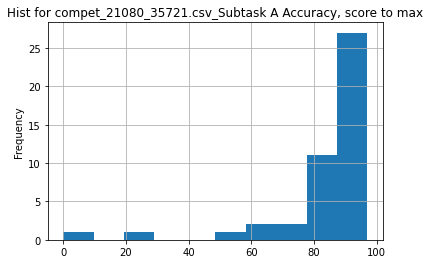

metric_column:  Subtask A Accuracy , score_function:  max
Utility w/mean =  1.1655540720961284
Utility w/median =  1.0935738444193912
___________________
21080_35722.csv
  Subtask A Accuracy Subtask B Accuracy Subtask C BLEU
0            0.0 (1)            0.0 (1)       5.5 (17)
1            0.0 (1)            0.0 (1)       18.5 (3)
2            0.0 (1)            0.0 (1)       0.6 (22)


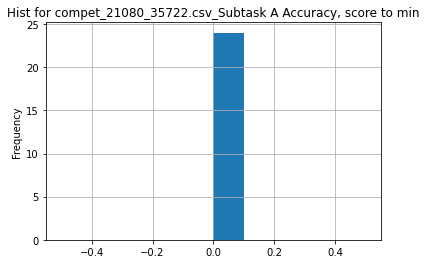

metric_column:  Subtask A Accuracy , score_function:  min
File cannot be opened: 21080_35722.csv
___________________
21080_35723.csv
  Subtask A Accuracy Subtask B Accuracy Subtask C BLEU
0            0.0 (1)          80.5 (18)        0.0 (1)
1            0.0 (1)          75.8 (20)        0.0 (1)
2            0.0 (1)           94.3 (3)        0.0 (1)


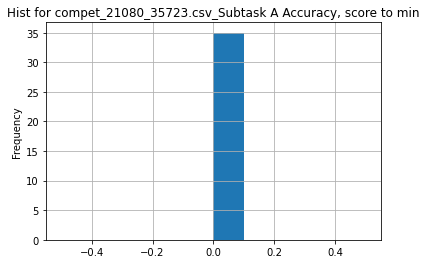

metric_column:  Subtask A Accuracy , score_function:  min
File cannot be opened: 21080_35723.csv
___________________
21080_35724.csv
  Subtask A Accuracy Subtask B Accuracy Subtask C BLEU
0          100.0 (1)           0.0 (22)       0.0 (15)
1          100.0 (1)           0.0 (22)       0.0 (15)
2           96.2 (2)           0.0 (22)       0.0 (15)


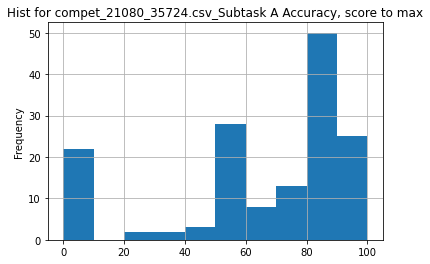

metric_column:  Subtask A Accuracy , score_function:  max
Utility w/mean =  1.5443002200375473
Utility w/median =  1.272264631043257
___________________
21116_35787.csv
     EXTRAP.    INTERP.     OBJECT      SHAPE
0  19.06 (1)   4.23 (2)  21.12 (3)  14.52 (1)
1  23.63 (2)  16.48 (6)  20.59 (2)  20.59 (4)
2  28.81 (3)   6.61 (4)  22.88 (4)  20.76 (5)


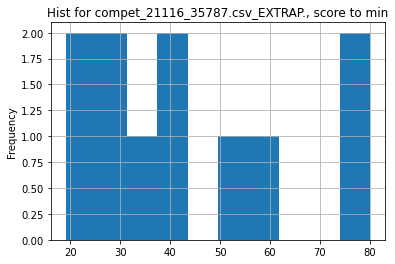

metric_column:  EXTRAP. , score_function:  min
Utility w/mean =  2.2877039015548983
Utility w/median =  2.0157397691500525
___________________
21122_35793.csv
File cannot be opened: 21122_35793.csv
___________________
21145_35815.csv
___________________
21145_35816.csv
File cannot be opened: 21145_35816.csv
___________________
21163_35837.csv
___________________
21169_35847.csv
  Prediction score
0       0.8220 (1)
1       0.7972 (2)
2       0.7935 (3)


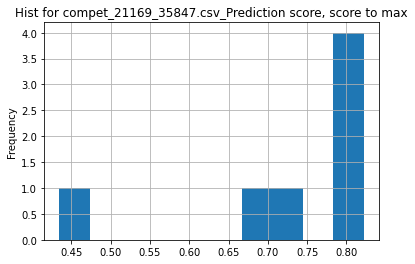

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.1401283981929142
Utility w/median =  1.0476676013255162
___________________
21169_35848.csv
___________________
21172_35849.csv
___________________
21172_35850.csv
___________________
21175_35853.csv
___________________
21175_35854.csv
___________________
21238_35910.csv
  KP mean error (aligned) KP AUC (aligned) Mesh error (aligned)  \
0                0.38 (1)        0.924 (1)             0.39 (1)   
1                0.40 (2)        0.920 (2)             0.42 (2)   
2                0.46 (3)        0.907 (3)             0.48 (3)   

  Mesh AUC (aligned) F-score@5mm (aligned) F-score@15mm (aligned)  
0          0.921 (1)             0.900 (1)              0.999 (1)  
1          0.917 (2)             0.881 (2)              0.998 (2)  
2          0.905 (3)             0.841 (3)              0.996 (3)  
File cannot be opened: 21238_35910.csv
___________________
21342_35982.csv
___________________
21504_36151.csv


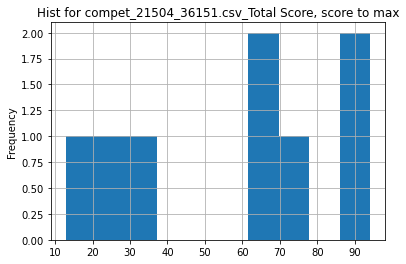

metric_column:  Total Score , score_function:  max
Utility w/mean =  1.6111398775263925
Utility w/median =  1.4152708026343488
___________________
21505_36152.csv
  Total Score Correct Rate % Reloc Score C-ATE RMSE Input (CDFFI.O)  \
0  85.201 (1)      88.10 (2)  10.512 (1)   1.64 (4)     10001.0 (4)   
1  79.296 (2)      87.93 (3)   8.626 (2)   1.45 (7)     10001.0 (4)   
2  76.624 (3)      88.12 (1)   7.719 (4)   1.17 (8)       101.1 (6)   

  office CR1&30 office reloc  
0     48.94 (3)    3.718 (2)  
1     50.01 (2)    1.994 (4)  
2     27.79 (8)    0.998 (7)  


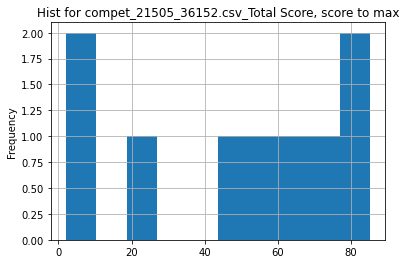

metric_column:  Total Score , score_function:  max
Utility w/mean =  1.7443930070407312
Utility w/median =  1.5893929783979404
___________________
21522_36181.csv
           F1
0  0.9632 (1)
1  0.9616 (2)
2  0.9613 (3)


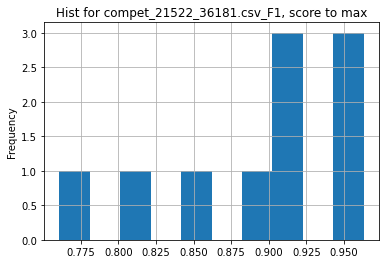

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0785027264889315
Utility w/median =  1.0578802855573861
___________________
21523_36182.csv
             MAE
0  2346.1862 (1)
1  2518.8192 (2)
2  3008.9799 (3)


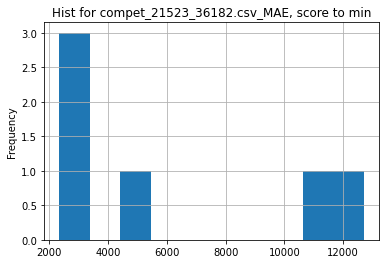

metric_column:  MAE , score_function:  min
Utility w/mean =  2.5895978616985587
Utility w/median =  1.705900217979289
___________________
21546_36209.csv
  CTR (q0.500), % CTR (q0.025), % CTR (q0.975), % Time (seconds)
0       2.249 (1)       2.174 (1)       2.326 (1)      97.4 (15)
1       2.249 (1)       2.174 (1)       2.326 (1)     276.3 (20)
2       2.249 (2)       2.174 (2)       2.326 (2)     654.8 (25)


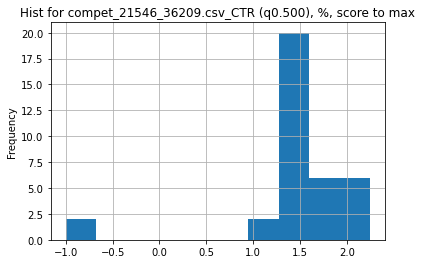

metric_column:  CTR (q0.500), % , score_function:  max
Utility w/mean =  1.5497281984534113
Utility w/median =  1.561263450190906
___________________
21546_36210.csv
  CTR (q0.500), % CTR (q0.025), % CTR (q0.975), % Time (seconds)
0       2.249 (1)       2.174 (1)       2.326 (1)      92.6 (19)
1       1.935 (2)       1.866 (2)       2.006 (2)     227.0 (22)
2       1.649 (3)       1.585 (3)       1.715 (3)     673.6 (25)


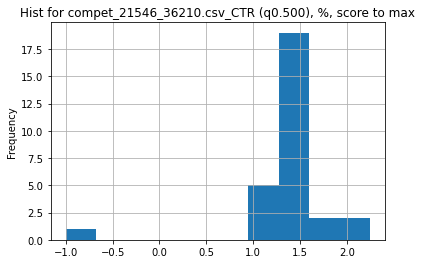

metric_column:  CTR (q0.500), % , score_function:  max
Utility w/mean =  1.6921620008821319
Utility w/median =  1.596167494677076
___________________
21600_36280.csv
     Accuracy
0  0.9959 (1)
1  0.9956 (2)
2  0.9956 (2)


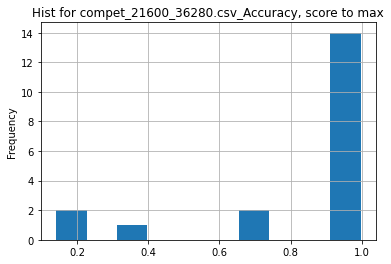

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.192867544617247
Utility w/median =  1.003021452311411
___________________
21600_36281.csv
___________________
21600_36282.csv
     Accuracy
0  0.7800 (1)
1  0.7733 (2)
2  0.7667 (3)


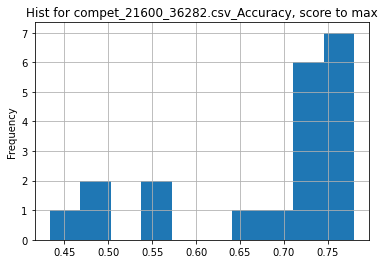

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1431335048033588
Utility w/median =  1.0588474852372225
___________________
21600_36283.csv
___________________
21600_36284.csv
       Accuracy
0  -58.7109 (1)
1  -60.6581 (2)
2  -60.8406 (3)


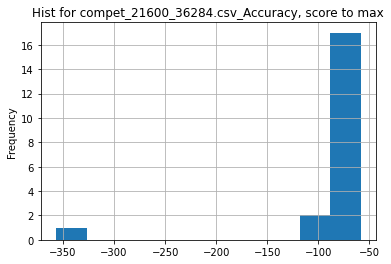

metric_column:  Accuracy , score_function:  max
Utility w/mean =  0.7210968315274767
Utility w/median =  0.9041007292289854
___________________
21600_36285.csv
___________________
21600_36286.csv
     Accuracy
0  5.0000 (1)
1  5.0000 (1)
2  5.0000 (1)


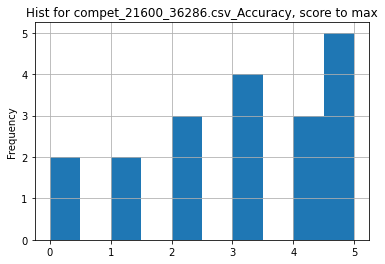

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.6666666666666667
Utility w/median =  1.6666666666666667
___________________
21600_36287.csv
___________________
21600_36288.csv
     Accuracy
0  0.7333 (1)
1  0.7067 (2)
2  0.7067 (2)


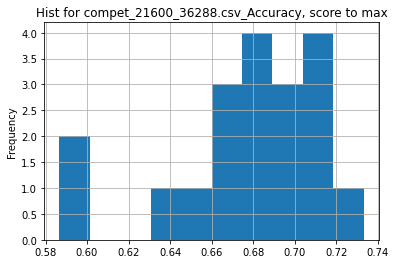

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0822775468986676
Utility w/median =  1.0678607834571137
___________________
21600_36289.csv
___________________
21600_36290.csv
     Accuracy
0  0.9720 (1)
1  0.9680 (2)
2  0.9680 (2)


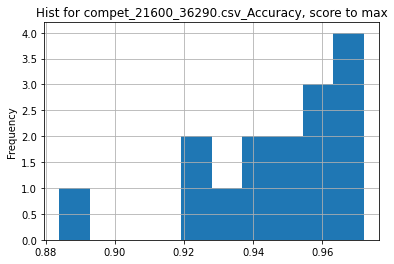

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0270498732037194
Utility w/median =  1.0210084033613445
___________________
21600_36291.csv
___________________
21611_36309.csv
   Accuracy
0  0.78 (1)
1  0.77 (2)
2  0.74 (3)


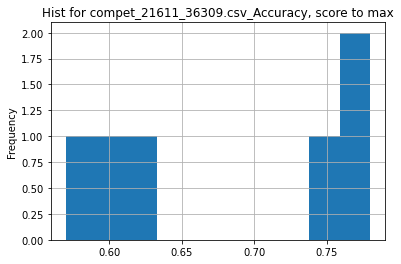

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1414634146341465
Utility w/median =  1.1386861313868613
___________________
21639_36352.csv
___________________
21639_36353.csv
          <Rank> 1 Lane, No Vehicles 1 Lane, 10 Vehicles  \
0  141305.05 (1)        38985.64 (1)        14615.76 (2)   
1  126677.37 (2)        26502.04 (2)        14520.74 (8)   
2  118022.00 (3)        24043.21 (5)        14610.49 (3)   

  2 Lane, Sharp, Backwards, 10 Vehicles 3 Lane, Backwards, 10 Vehicles  \
0                          14422.28 (2)                   21156.29 (1)   
1                          14788.07 (1)                   18869.50 (5)   
2                          13359.39 (4)                   19571.78 (3)   

  3 Lane, Sharp, Variant B, 10 Vehicles 3 Lane, Sharp, Variant B, 25 Vehicles  \
0                          19960.34 (3)                          15858.39 (2)   
1                          20975.94 (1)                          15056.29 (5)   
2                      

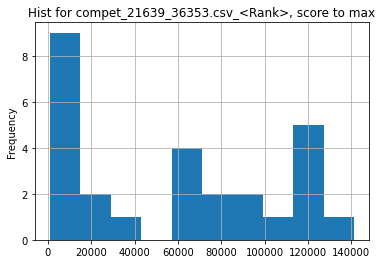

metric_column:  <Rank> , score_function:  max
Utility w/mean =  2.4365842395630475
Utility w/median =  2.101399068338684
___________________
21639_36608.csv
File cannot be opened: 21639_36608.csv
___________________
21691_36405.csv
           F1      Recall   Precision Exact_match(only for subtask2)
0  1.0000 (1)  1.0000 (1)  0.9990 (1)                    -1.0000 (1)
1  1.0000 (1)  1.0000 (1)  0.9990 (1)                    -1.0000 (1)
2  1.0000 (1)  1.0000 (1)  0.9990 (1)                    -1.0000 (1)


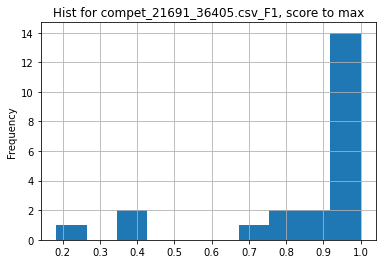

metric_column:  F1 , score_function:  max
Utility w/mean =  1.172170540157497
Utility w/median =  1.0465724751439036
___________________
21691_36406.csv
           F1      Recall   Precision Exact_match(only for subtask2)
0  1.0000 (1)  1.0000 (1)  1.0000 (1)                     1.0000 (1)
1  1.0000 (1)  1.0000 (1)  1.0000 (1)                     1.0000 (1)
2  1.0000 (1)  1.0000 (1)  1.0000 (1)                     1.0000 (1)


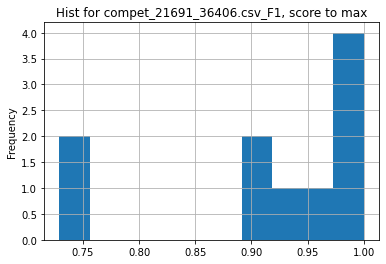

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0870746820306556
Utility w/median =  1.05318588730911
___________________
21691_36407.csv
           F1       Recall   Precision Exact_match(only for subtask2)
0  0.9090 (1)   0.9190 (4)  0.9000 (2)                    -1.0000 (1)
1  0.9030 (2)   0.9070 (6)  0.9000 (2)                    -1.0000 (1)
2  0.9000 (3)  0.8860 (10)  0.9150 (1)                    -1.0000 (1)


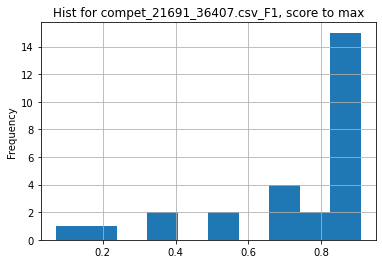

metric_column:  F1 , score_function:  max
Utility w/mean =  1.27017068096426
Utility w/median =  1.0965018094089265
___________________
21691_36408.csv
           F1      Recall   Precision Exact_match(only for subtask2)
0  0.8820 (1)  0.8930 (2)  0.9000 (2)                     0.5750 (1)
1  0.8780 (2)  0.8750 (4)  0.9130 (1)                     0.4970 (3)
2  0.8750 (3)  0.9080 (1)  0.8750 (3)                     0.5460 (2)


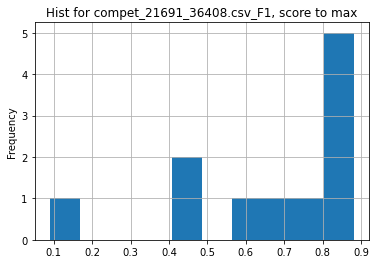

metric_column:  F1 , score_function:  max
Utility w/mean =  1.3037869218157874
Utility w/median =  1.125
___________________
21691_36409.csv
           F1      Recall   Precision Exact_match(only for subtask2)
0  0.9090 (1)  0.9150 (1)  0.9040 (1)                    -1.0000 (1)
1  0.8930 (2)  0.8820 (3)  0.9040 (1)                    -1.0000 (1)
2  0.8780 (3)  0.8900 (2)  0.8660 (4)                    -1.0000 (1)


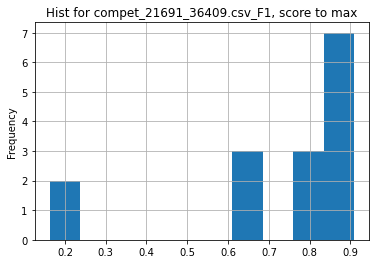

metric_column:  F1 , score_function:  max
Utility w/mean =  1.2497708524289641
Utility w/median =  1.0965018094089265
___________________
21691_36410.csv
           F1      Recall   Precision Exact_match(only for subtask2)
0  0.8790 (1)  0.8930 (2)  0.8970 (1)                     0.5640 (1)
1  0.8710 (2)  0.8780 (3)  0.8900 (3)                     0.5140 (3)
2  0.8660 (3)  0.9020 (1)  0.8670 (4)                     0.5190 (2)


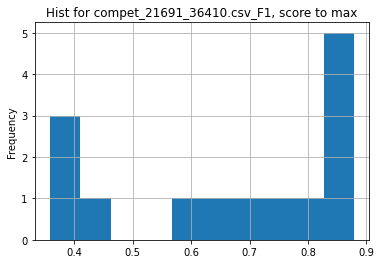

metric_column:  F1 , score_function:  max
Utility w/mean =  1.3085920884729902
Utility w/median =  1.2259414225941423
___________________
21694_36411.csv
___________________
21713_36432.csv
        Total      Test 1      Test 2      Test 3
0  100.00 (1)  100.00 (1)  100.00 (1)  100.00 (1)
1  100.00 (1)  100.00 (1)  100.00 (1)  100.00 (1)
2  100.00 (1)  100.00 (1)  100.00 (1)  100.00 (1)


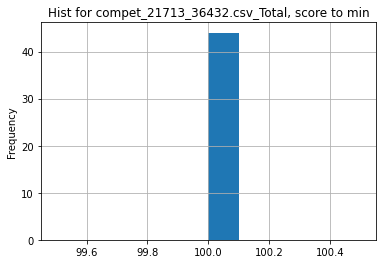

metric_column:  Total , score_function:  min
Utility w/mean =  1.0
Utility w/median =  1.0
___________________
21718_36437.csv
  AP at IoU=.50:.05:.95 AP at IoU=.50 AP at IoU=.75 AP for small objects  \
0             0.482 (1)     0.806 (2)     0.513 (1)            0.331 (2)   
1             0.482 (2)     0.808 (1)     0.510 (2)            0.333 (1)   
2             0.441 (3)     0.801 (3)     0.440 (6)            0.300 (3)   

  AP for medium objects AP for large objects  
0             0.640 (2)            0.937 (1)  
1             0.642 (1)           0.658 (12)  
2             0.589 (4)            0.861 (7)  


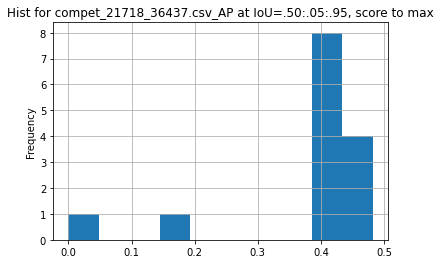

metric_column:  AP at IoU=.50:.05:.95 , score_function:  max
Utility w/mean =  1.255441860465116
Utility w/median =  1.1314553990610328
___________________
21719_36438.csv
___________________
21751_36489.csv
         score
0  0.83377 (1)
1  0.83169 (2)
2  0.81475 (3)


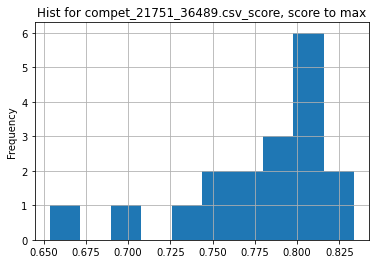

metric_column:  score , score_function:  max
Utility w/mean =  1.0709878613583004
Utility w/median =  1.0644800929442781
___________________
21751_36490.csv
         score
0  0.81221 (1)
1  0.80400 (2)
2  0.79125 (3)


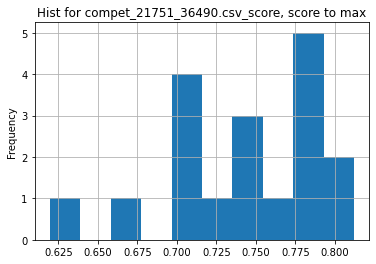

metric_column:  score , score_function:  max
Utility w/mean =  1.0930227168228597
Utility w/median =  1.0849936880915325
___________________
21751_36491.csv
         score
0  0.79358 (1)
1  0.78994 (2)
2  0.78243 (3)


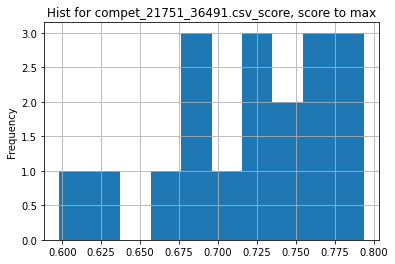

metric_column:  score , score_function:  max
Utility w/mean =  1.098832660879331
Utility w/median =  1.0915142804090532
___________________
21777_36513.csv
___________________
21777_36516.csv
___________________
21843_36624.csv
___________________
21843_36625.csv
    Average        BB      SIBS        SS        FD        FS        MD  \
0  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)   
1  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)   
2  0.99 (2)  0.99 (2)  0.99 (2)  0.99 (2)  0.99 (2)  0.99 (2)  0.99 (2)   

         MS      GFGD      GFGS      GMGD      GMGS  
0  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  
1  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  1.00 (1)  
2  0.99 (2)  0.98 (2)  0.98 (2)  0.99 (2)  0.98 (2)  
File cannot be opened: 21843_36625.csv
___________________
21843_36626.csv
    Average        BB      SIBS        SS        FD         FS        MD  \
0  0.80 (1)  0.82 (1)  0.80 (1)  0.84 (1)  0.75 (4)   0.82 (1)  0.80

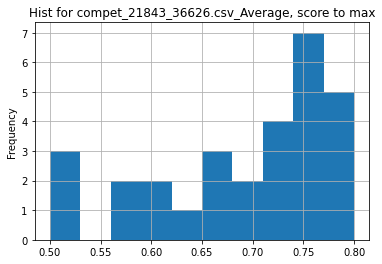

metric_column:  Average , score_function:  max
Utility w/mean =  1.1629072681704262
Utility w/median =  1.0958904109589043
___________________
21891_36759.csv
        Total      Test 1      Test 2      Test 3
0  100.00 (1)  100.00 (1)  100.00 (1)  100.00 (1)
1  100.00 (1)  100.00 (1)  100.00 (1)  100.00 (1)
2  100.00 (1)  100.00 (1)  100.00 (1)  100.00 (1)


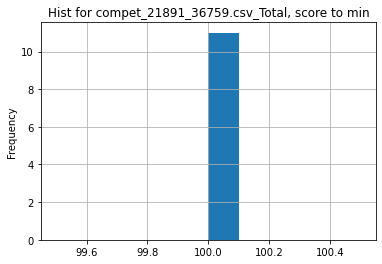

metric_column:  Total , score_function:  min
Utility w/mean =  1.0
Utility w/median =  1.0
___________________
21926_36827.csv
        AP@0.50       AP@0.25       AP@0.75
0  0.529007 (1)  0.627742 (1)  0.182625 (4)
1  0.529007 (1)  0.627742 (1)  0.182625 (4)
2  0.482543 (2)  0.587323 (3)  0.207424 (3)


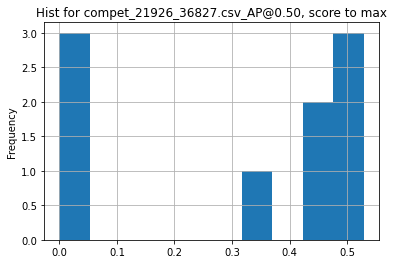

metric_column:  AP@0.50 , score_function:  max
Utility w/mean =  1.7199576753676131
Utility w/median =  1.189121814814149
___________________
21926_36828.csv
        AP@0.50       AP@0.25       AP@0.75
0  0.739548 (1)  0.799688 (1)  0.473172 (1)
1  0.649739 (2)  0.674606 (2)  0.389573 (3)
2  0.645304 (3)  0.673418 (3)  0.392534 (2)


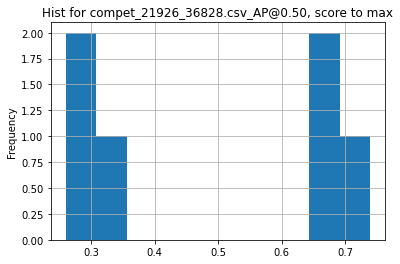

metric_column:  AP@0.50 , score_function:  max
Utility w/mean =  1.525681148178482
Utility w/median =  1.4962020783619117
___________________
21927_36829.csv
        AP@0.50       AP@0.25       AP@0.75
0  0.711765 (1)  0.806882 (1)  0.422582 (1)
1  0.646979 (2)  0.762855 (2)  0.246049 (6)
2  0.614664 (3)  0.746472 (3)  0.251044 (4)


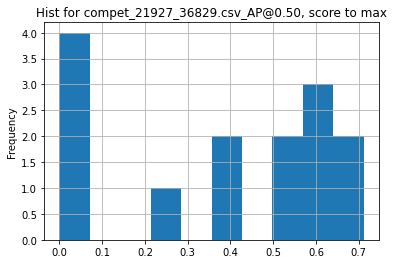

metric_column:  AP@0.50 , score_function:  max
Utility w/mean =  1.8694547899583438
Utility w/median =  1.4792550156962951
___________________
21927_36830.csv
        AP@0.50       AP@0.25       AP@0.75
0  0.850329 (1)  0.881716 (1)  0.614462 (1)
1  0.831631 (2)  0.874398 (2)  0.556199 (2)
2  0.763208 (3)  0.848619 (3)  0.376455 (4)


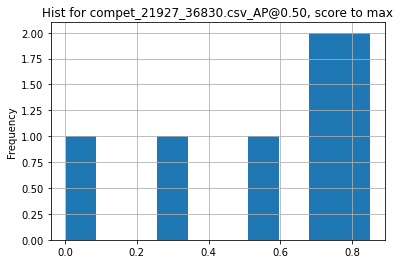

metric_column:  AP@0.50 , score_function:  max
Utility w/mean =  1.4922518167090602
Utility w/median =  1.1925922393686474
___________________
21928_36831.csv
___________________
21928_36832.csv
___________________
21949_36861.csv
          MAE       MAE 1       MAE 2 Data Type
0  0.1010 (1)  0.0469 (1)  0.0541 (1)   1.0 (1)
1  0.1093 (2)  0.0540 (3)  0.0554 (2)   2.0 (2)
2  0.1110 (3)  0.0511 (2)  0.0599 (3)   1.0 (1)


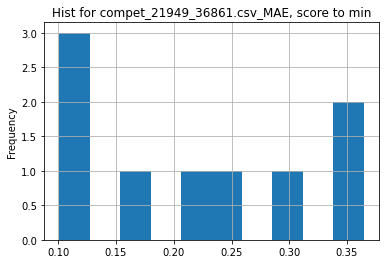

metric_column:  MAE , score_function:  min
Utility w/mean =  2.1596259625962593
Utility w/median =  2.28019801980198
___________________
21949_36862.csv
          MAE       MAE 1        MAE 2 Data Type
0  0.0198 (1)  0.0198 (1)  -1.0000 (1)   2.0 (2)
1  0.0371 (2)  0.0371 (2)  -1.0000 (1)   2.0 (2)
2  0.0675 (3)  0.0675 (3)  -1.0000 (1)   1.0 (1)


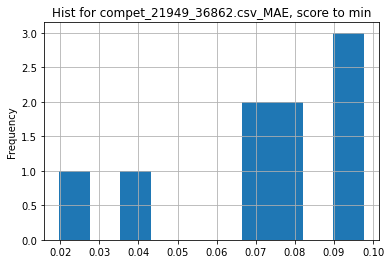

metric_column:  MAE , score_function:  min
Utility w/mean =  3.585297418630752
Utility w/median =  3.934343434343434
___________________
21949_36863.csv
          MAE       MAE 1        MAE 2 Data Type
0  0.0304 (1)  0.0304 (1)  -1.0000 (1)   2.0 (2)
1  0.0379 (2)  0.0379 (2)  -1.0000 (1)   1.0 (1)
2  0.0734 (3)  0.0734 (3)  -1.0000 (1)   1.0 (1)


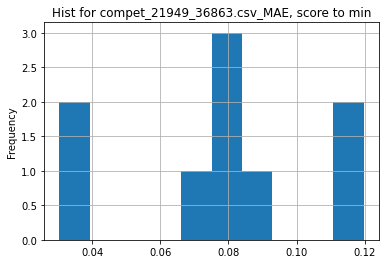

metric_column:  MAE , score_function:  min
Utility w/mean =  2.5285087719298245
Utility w/median =  2.5460526315789473
___________________
22006_36905.csv
___________________
22006_36906.csv
___________________
22006_36907.csv
___________________
22018_36914.csv
         CIDEr
0  0.20298 (1)
1  0.19771 (2)
2  0.17234 (3)


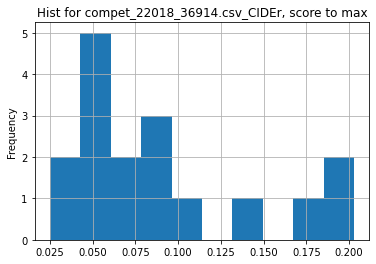

metric_column:  CIDEr , score_function:  max
Utility w/mean =  2.244419294411489
Utility w/median =  3.2908560311284045
___________________
22036_36929.csv
        APCER       BPCER  RANK<ACER>
0  0.0000 (1)  0.0000 (1)  0.0000 (1)
1  0.0000 (1)  0.0000 (1)  0.0000 (1)
2  0.0000 (1)  0.0000 (1)  0.0000 (1)


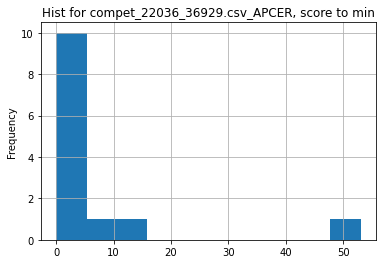

metric_column:  APCER , score_function:  min
File cannot be opened: 22036_36929.csv
___________________
22036_37000.csv
File cannot be opened: 22036_37000.csv
___________________
22037_36931.csv
        mIoU  completion        road    sidewalk     parking other-ground  \
0  0.341 (1)  0.425 (17)  0.181 (19)  0.123 (19)  0.119 (19)   0.078 (12)   
1  0.295 (2)  0.456 (14)  0.420 (17)  0.225 (18)  0.170 (18)   0.079 (11)   
2  0.238 (3)   0.566 (6)   0.647 (5)   0.399 (4)   0.349 (4)    0.141 (2)   

    building         car      truck    bicycle  ... other-vehicle  vegetation  \
0  0.625 (1)   0.468 (1)  0.254 (1)  0.410 (2)  ...     0.325 (1)   0.531 (1)   
1  0.522 (2)  0.312 (10)  0.067 (5)  0.415 (1)  ...     0.161 (2)  0.395 (13)   
2  0.394 (7)   0.333 (7)  0.072 (4)  0.144 (4)  ...     0.127 (3)   0.431 (5)   

        trunk     terrain     person  bicyclist motorcyclist      fence  \
0   0.434 (1)  0.152 (19)  0.513 (1)  0.504 (1)    0.236 (1)  0.415 (1)   
1   0.340 (2)  0.212 

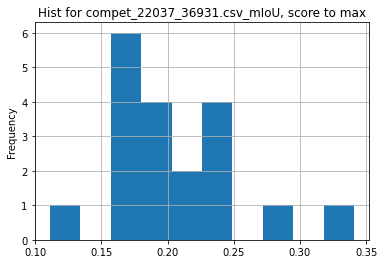

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.6668381785438644
Utility w/median =  1.7853403141361257
___________________
22117_37028.csv
___________________
22117_37029.csv
___________________
22117_37030.csv
    Average       FMD       FMS
0  0.84 (1)  0.82 (1)  0.86 (1)
1  0.79 (2)  0.78 (2)  0.80 (2)
2  0.78 (3)  0.76 (5)  0.80 (3)


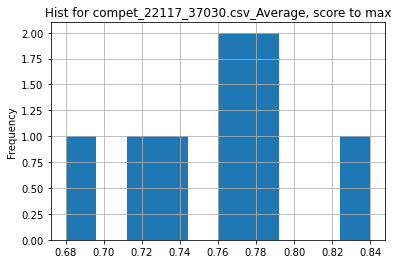

metric_column:  Average , score_function:  max
Utility w/mean =  1.105263157894737
Utility w/median =  1.0909090909090908
___________________
22151_37095.csv
        APCER       BPCER  RANK<ACER>
0  0.0000 (1)  0.0000 (1)  0.0000 (1)
1  0.0000 (1)  0.0000 (1)  0.0000 (1)
2  0.0000 (1)  0.0000 (1)  0.0000 (1)


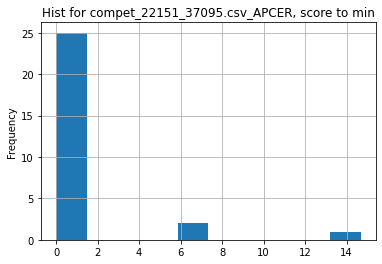

metric_column:  APCER , score_function:  min
File cannot be opened: 22151_37095.csv
___________________
22151_37096.csv
        APCER         BPCER  RANK<ACER>
0  0.0185 (1)    3.2500 (6)  1.6343 (1)
1  0.0926 (2)  13.1667 (25)  6.6296 (6)
2  0.4630 (3)    3.5833 (7)  2.0231 (2)
File cannot be opened: 22151_37096.csv
___________________
22152_37097.csv
___________________
22152_37098.csv
___________________
22152_37099.csv
    Average       MAP    RANK_K
0  0.40 (1)  0.21 (1)  0.59 (2)
1  0.39 (2)  0.18 (2)  0.60 (1)
2  0.28 (3)  0.11 (3)  0.45 (3)


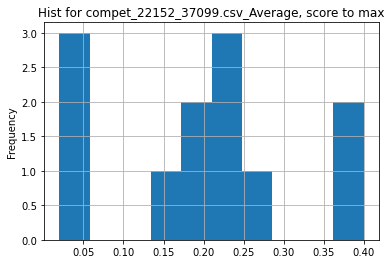

metric_column:  Average , score_function:  max
Utility w/mean =  2.033898305084746
Utility w/median =  1.9047619047619047
___________________
22163_37118.csv
  5-Class Accuracy 2-Class Precision 2-Class Recall 2-Class F-Measure
0        0.844 (1)         0.611 (2)      0.642 (2)         0.594 (1)
1        0.822 (2)         0.755 (1)      0.383 (3)         0.478 (3)
2        0.769 (3)         0.194 (5)      0.048 (5)         0.073 (5)
File cannot be opened: 22163_37118.csv
___________________
22168_37143.csv
          MAP         MRR
0  0.5810 (1)  0.6256 (1)
1  0.5590 (2)  0.6045 (2)
2  0.5204 (3)  0.5613 (3)


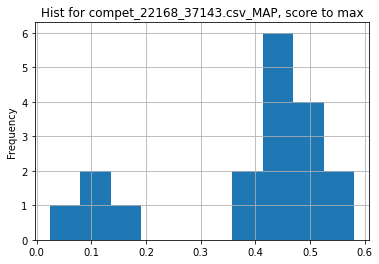

metric_column:  MAP , score_function:  max
Utility w/mean =  1.4961159353943434
Utility w/median =  1.3344051446945338
___________________
22168_37144.csv
          MAP         MRR
0  0.4033 (1)  0.4432 (2)
1  0.4032 (2)  0.4596 (1)
2  0.3798 (3)  0.4240 (3)


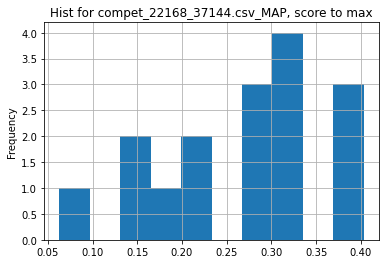

metric_column:  MAP , score_function:  max
Utility w/mean =  1.5093915931791069
Utility w/median =  1.4625566636446057
___________________
22168_37145.csv
          MAP         MRR
0  0.5522 (1)  0.5940 (1)
1  0.5054 (2)  0.5433 (2)
2  0.4976 (3)  0.5332 (3)


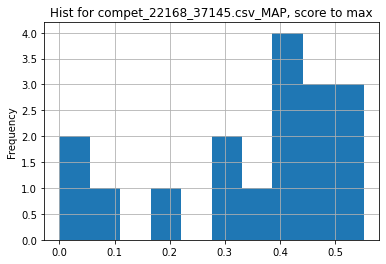

metric_column:  MAP , score_function:  max
Utility w/mean =  1.5870498732037195
Utility w/median =  1.3116389548693588
___________________
22168_37146.csv
          MAP         MRR
0  0.4483 (1)  0.5049 (2)
1  0.4355 (2)  0.5135 (1)
2  0.3890 (3)  0.4419 (3)


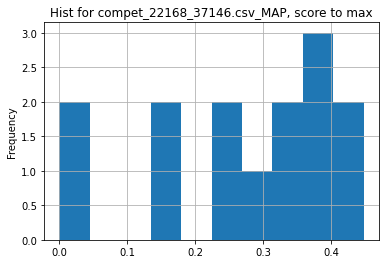

metric_column:  MAP , score_function:  max
Utility w/mean =  1.6453963926174497
Utility w/median =  1.4048887496082731
___________________
22168_37147.csv
          MAP         MRR
0  0.5858 (1)  0.6241 (1)
1  0.5163 (2)  0.5506 (2)
2  0.4901 (3)  0.5301 (3)


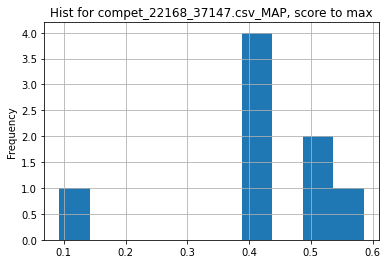

metric_column:  MAP , score_function:  max
Utility w/mean =  1.3881105417493558
Utility w/median =  1.3794889909337102
___________________
22168_37148.csv
          MAP         MRR
0  0.4263 (1)  0.4789 (1)
1  0.4007 (2)  0.4467 (2)
2  0.3874 (3)  0.4384 (3)


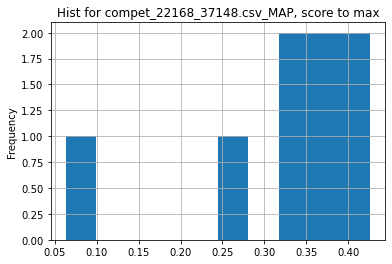

metric_column:  MAP , score_function:  max
Utility w/mean =  1.3336461755044577
Utility w/median =  1.2361896476729013
___________________
22173_37152.csv
___________________
22188_37187.csv
   f-measure
0  0.804 (1)
1  0.775 (2)
2  0.771 (3)


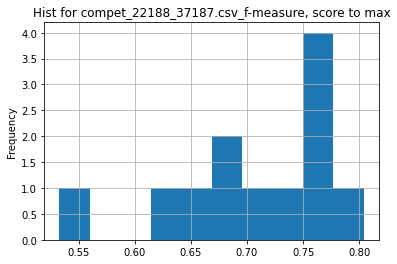

metric_column:  f-measure , score_function:  max
Utility w/mean =  1.1355932203389834
Utility w/median =  1.1112646855563235
___________________
22188_37188.csv
   f-measure
0  0.769 (1)
1  0.734 (2)
2  0.730 (3)


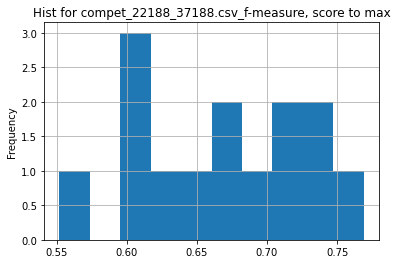

metric_column:  f-measure , score_function:  max
Utility w/mean =  1.1507054296707995
Utility w/median =  1.1392592592592592
___________________
22188_37189.csv
   f-measure
0  0.749 (1)
1  0.728 (2)
2  0.719 (3)


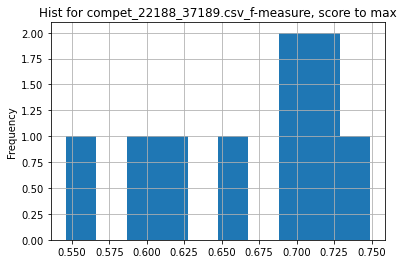

metric_column:  f-measure , score_function:  max
Utility w/mean =  1.123312781203133
Utility w/median =  1.0746054519368724
___________________
22188_37190.csv
   f-measure
0  0.715 (1)
1  0.707 (2)
2  0.703 (3)


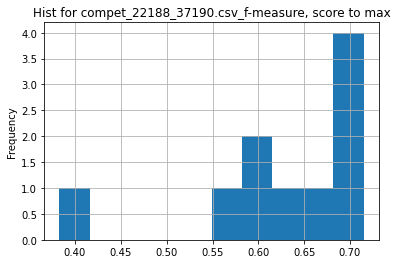

metric_column:  f-measure , score_function:  max
Utility w/mean =  1.144549383704178
Utility w/median =  1.1093871217998448
___________________
22217_37236.csv
         PSNR       SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0   27.19 (1)   0.69 (2)            14.30 (11)         0.00 (2)   
1  24.62 (38)  0.65 (31)             1.20 (20)         0.00 (2)   
2  23.66 (45)  0.62 (42)             60.00 (2)         1.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


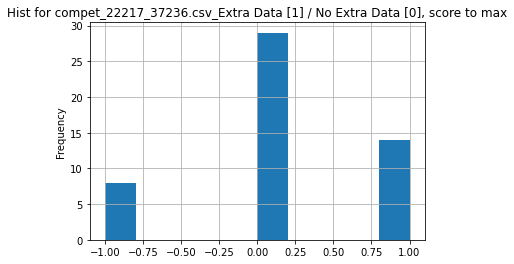

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 22217_37236.csv
___________________
22217_37238.csv
___________________
22220_37242.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  27.48 (1)  0.76 (3)             1.00 (12)           0.0 (2)   
1  27.36 (2)  0.76 (1)             1.00 (12)           0.0 (2)   
2  27.33 (3)  0.76 (4)             0.17 (21)           1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            1.0 (1)  
2                            0.0 (2)  


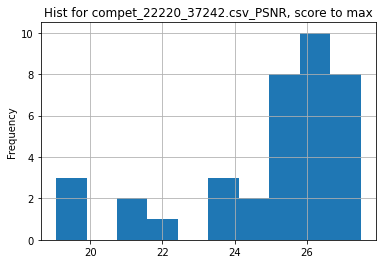

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0978588319134464
Utility w/median =  1.0663562281722934
___________________
22220_37243.csv
___________________
22221_37244.csv
       PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  0.00 (1)  0.00 (1)             20.00 (1)          1.00 (1)   
1  0.00 (1)  0.00 (1)             10.43 (2)          1.00 (1)   
2  0.00 (1)  0.00 (1)              0.30 (5)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


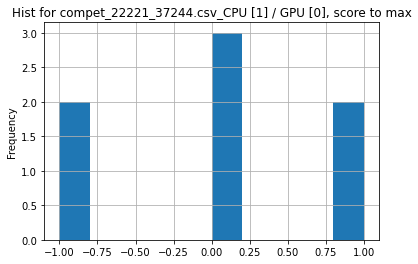

metric_column:  CPU [1] / GPU [0] , score_function:  max
File cannot be opened: 22221_37244.csv
___________________
22221_37245.csv
___________________
22223_37248.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  21.62 (50)  0.86 (47)             10.43 (1)          1.00 (1)   
1  36.90 (38)  0.98 (37)             0.03 (17)          0.00 (2)   
2  36.85 (39)  0.98 (39)              5.43 (2)          1.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


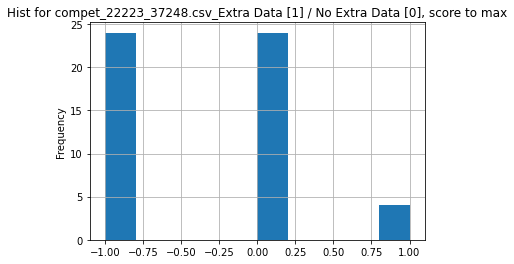

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 22223_37248.csv
___________________
22223_37249.csv
___________________
22224_37250.csv
        PSNR      SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  38.11 (7)  0.99 (7)              0.13 (3)          0.00 (1)   
1  39.41 (5)  0.99 (5)              0.20 (2)          0.00 (1)   
2  39.21 (6)  0.99 (6)              0.13 (4)          0.00 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (1)  
1                           0.00 (1)  
2                           0.00 (1)  


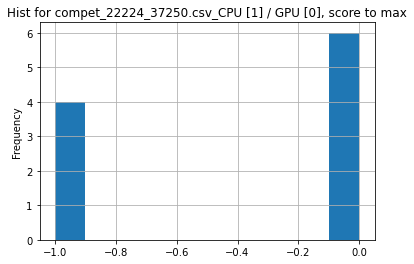

metric_column:  CPU [1] / GPU [0] , score_function:  max
File cannot be opened: 22224_37250.csv
___________________
22224_37251.csv
___________________
22225_37252.csv
       MRAE   RMSE
0  0.03 (1)  - (-)
1  0.04 (2)  - (-)
2  0.04 (3)  - (-)
File cannot be opened: 22225_37252.csv
___________________
22225_37253.csv
___________________
22226_37254.csv
       MRAE   RMSE
0  0.07 (1)  - (-)
1  0.07 (2)  - (-)
2  0.07 (3)  - (-)
File cannot be opened: 22226_37254.csv
___________________
22226_37255.csv
___________________
22230_37262.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  52.61 (13)   1.00 (5)              1.22 (3)          0.00 (2)   
1  52.60 (15)  1.00 (11)              1.22 (3)          0.00 (2)   
2  52.09 (35)  1.00 (29)             0.17 (13)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


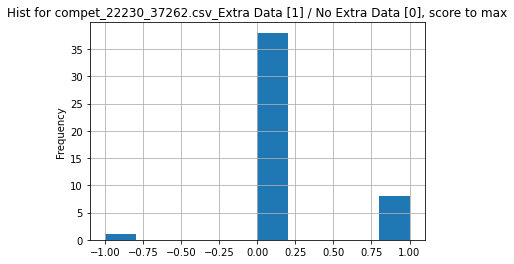

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 22230_37262.csv
___________________
22230_37263.csv
___________________
22231_37264.csv
         PSNR       SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  36.38 (52)  0.95 (56)             0.67 (11)          0.00 (2)   
1  31.43 (74)  0.93 (73)             0.00 (23)          0.00 (2)   
2  36.52 (48)  0.95 (50)             0.00 (23)          0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           0.00 (2)  
2                           0.00 (2)  


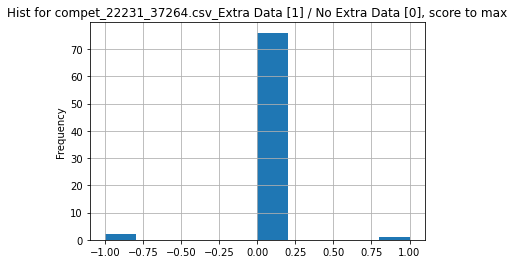

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 22231_37264.csv
___________________
22231_37265.csv
___________________
22233_37268.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  33.13 (2)  0.93 (1)             -1.00 (1)        -1.00 (3)   
1  32.67 (5)  0.92 (5)             -1.00 (1)        -1.00 (3)   
2  32.57 (6)  0.91 (6)             -1.00 (1)        -1.00 (3)   

  Extra Data [1] / No Extra Data [0]  
0                          -1.00 (1)  
1                          -1.00 (1)  
2                          -1.00 (1)  


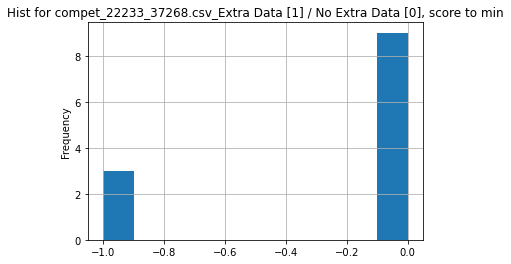

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  min
Utility w/mean =  0.25
Utility w/median =  -0.0
___________________
22233_37269.csv
___________________
22234_37270.csv
___________________
22234_37271.csv
___________________
22235_37272.csv
        PSNR      SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  34.65 (3)  0.94 (3)             -1.00 (1)        -1.00 (3)   
1  32.91 (4)  0.91 (4)             -1.00 (1)        -1.00 (3)   
2  29.66 (5)  0.84 (5)              1.40 (5)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                          -1.00 (1)  
1                          -1.00 (1)  
2                           0.00 (2)  


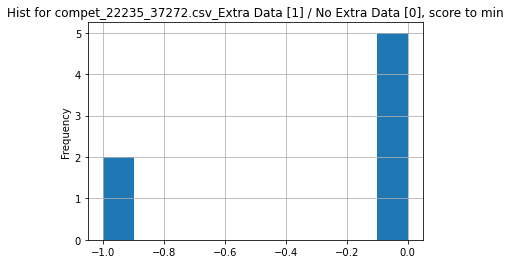

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  min
Utility w/mean =  0.2857142857142857
Utility w/median =  -0.0
___________________
22235_37273.csv
___________________
22236_37274.csv
         PSNR       SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  15.92 (62)  0.59 (51)             0.03 (31)         0.00 (2)   
1  18.25 (26)  0.65 (13)             3.00 (12)         0.00 (2)   
2  16.63 (46)  0.61 (47)             1.10 (16)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


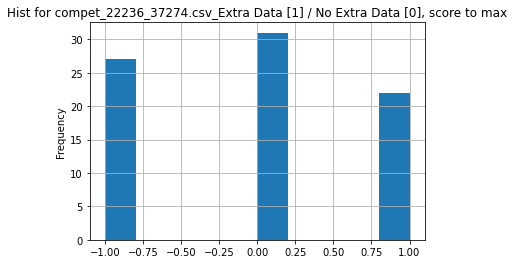

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 22236_37274.csv
___________________
22236_37275.csv
___________________
22247_37277.csv
   f-measure
0  0.834 (1)
1  0.750 (2)
2  0.749 (3)


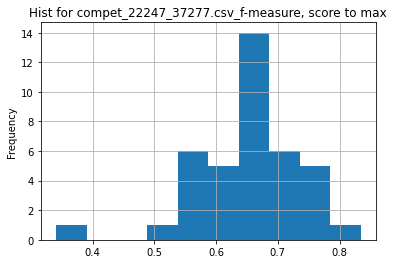

metric_column:  f-measure , score_function:  max
Utility w/mean =  1.2785377358490566
Utility w/median =  1.250374812593703
___________________
22247_37278.csv
   f-measure
0  0.931 (1)
1  0.791 (2)
2  0.790 (3)


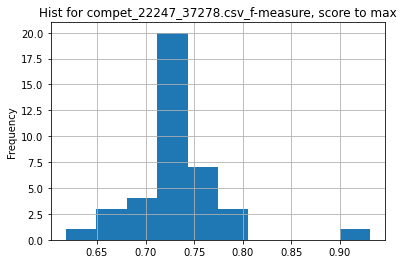

metric_column:  f-measure , score_function:  max
Utility w/mean =  1.266755050064543
Utility w/median =  1.2666666666666668
___________________
22266_37291.csv
  recognition rate
0     0.702200 (1)
1     0.624200 (2)
2     0.572800 (3)


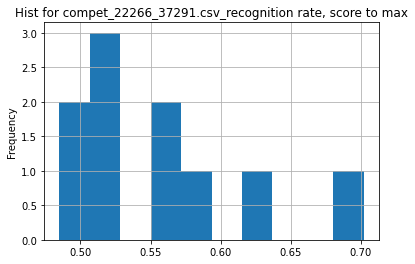

metric_column:  recognition rate , score_function:  max
Utility w/mean =  1.2654988465974626
Utility w/median =  1.3121554704288518
___________________
22266_37292.csv
  recognition rate
0     0.711300 (1)
1     0.628700 (2)
2     0.570200 (3)


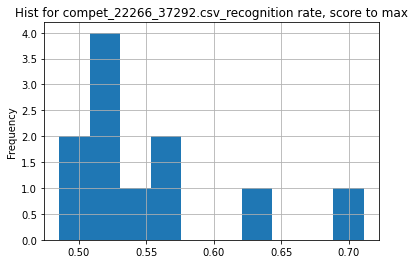

metric_column:  recognition rate , score_function:  max
Utility w/mean =  1.2870607974733517
Utility w/median =  1.3556317895940537
___________________
22287_37553.csv
           MAE          RMSE            R
0  6.94289 (1)  10.68021 (1)  0.75493 (1)
1  7.92115 (2)  14.37509 (3)  0.58891 (2)
2  8.94626 (3)  14.16263 (2)  0.53531 (3)


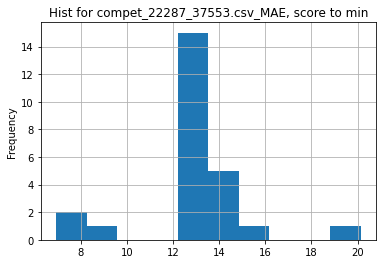

metric_column:  MAE , score_function:  min
Utility w/mean =  1.8586771214868738
Utility w/median =  1.860121649630053
___________________
22289_37557.csv
   Prediction
0  0.7073 (1)
1  0.7043 (2)
2  0.7021 (3)


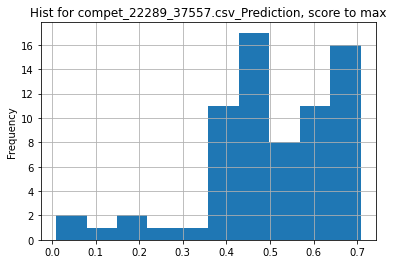

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.4043960594877787
Utility w/median =  1.4214228295819937
___________________
22289_37558.csv
   Prediction
0  0.5749 (1)
1  0.5696 (2)
2  0.5688 (3)


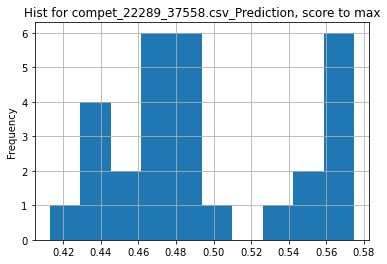

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.1645374218559001
Utility w/median =  1.1819490131578947
___________________
22289_37559.csv
   Prediction
0  0.6142 (1)
1  0.6136 (2)
2  0.6095 (3)


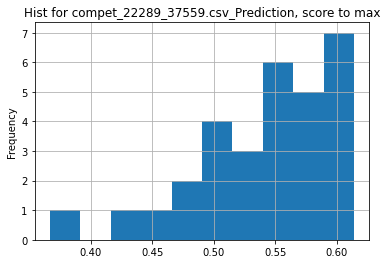

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.1289334378982452
Utility w/median =  1.0992393736017898
___________________
22289_37560.csv
___________________
2231_4131.csv
___________________
2231_4141.csv
___________________
22393_37668.csv
       MinDCF       EER
0  0.0408 (1)  1.41 (1)
1  0.0450 (2)  1.45 (2)
2  0.0469 (3)  1.62 (4)


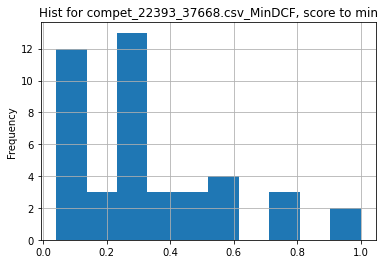

metric_column:  MinDCF , score_function:  min
Utility w/mean =  8.03419972640219
Utility w/median =  6.828431372549019
___________________
22393_37670.csv
       MinDCF       EER
0  0.0409 (1)  1.48 (1)
1  0.0456 (2)  1.52 (2)
2  0.0470 (3)  1.69 (4)


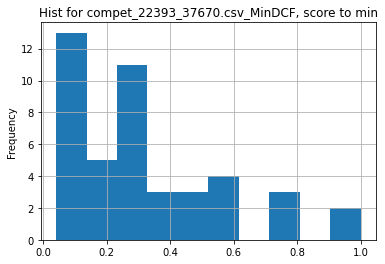

metric_column:  MinDCF , score_function:  min
Utility w/mean =  7.784563236274729
Utility w/median =  6.740831295843521
___________________
2241_4151.csv
___________________
2241_4161.csv
___________________
22472_37709.csv
       MinDCF       EER
0  0.0654 (1)  1.45 (1)
1  0.0745 (2)  1.51 (2)
2  0.0769 (3)  1.77 (3)


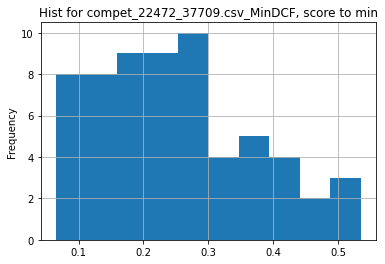

metric_column:  MinDCF , score_function:  min
Utility w/mean =  3.8480072999901354
Utility w/median =  3.6529051987767582
___________________
22472_37710.csv
       MinDCF       EER
0  0.0651 (1)  1.45 (1)
1  0.0740 (2)  1.50 (2)
2  0.0763 (3)  1.71 (3)


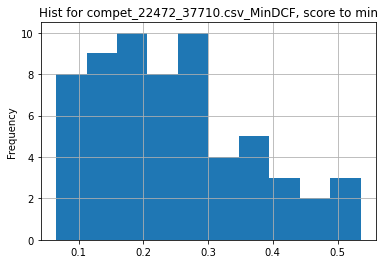

metric_column:  MinDCF , score_function:  min
Utility w/mean =  3.7651008374213375
Utility w/median =  3.489247311827957
___________________
22485_37732.csv
  Mean joint error (procrustes alignment)  \
0                                0.81 (1)   
1                                0.86 (2)   
2                                0.91 (3)   

  Mean joint error (scale and trans alignment)  \
0                                   15.31 (40)   
1                                   15.18 (38)   
2                                     2.40 (5)   

  Mean joint AUC (procrustes alignment)  \
0                             0.838 (1)   
1                             0.829 (2)   
2                             0.819 (3)   

  Mean joint AUC (scale and trans alignment)  \
0                                 0.069 (38)   
1                                 0.072 (36)   
2                                  0.557 (7)   

  Mesh error (procrustes alignment) Mesh error AUC (procrustes alignment)  \
0                 

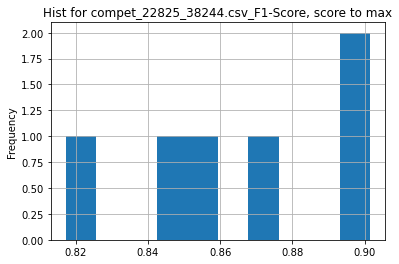

metric_column:  F1-Score , score_function:  max
Utility w/mean =  1.0417323071210618
Utility w/median =  1.0471162836617478
___________________
22825_38245.csv
___________________
22826_38246.csv
       F1-Score      Accuracy     Precision        Recall
0  0.682353 (1)  0.973000 (1)  0.707317 (2)  0.659091 (2)
1  0.579710 (2)  0.971000 (2)  0.800000 (1)  0.454545 (3)
2  0.480000 (3)  0.961000 (3)  0.580645 (3)  0.409091 (4)


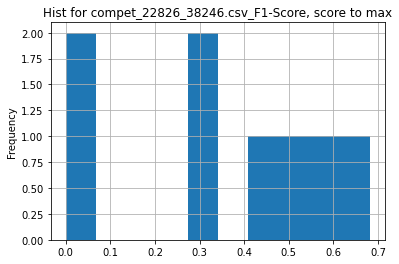

metric_column:  F1-Score , score_function:  max
Utility w/mean =  1.92404924089422
Utility w/median =  1.8607681924162474
___________________
22826_38247.csv
___________________
22873_38272.csv
  Balanced accuracy
0          0.77 (1)
1          0.77 (2)
2          0.76 (3)


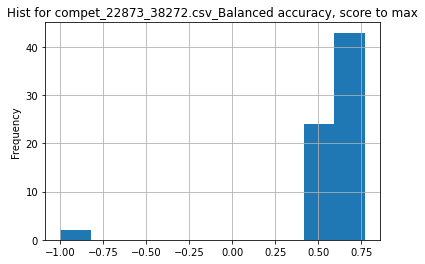

metric_column:  Balanced accuracy , score_function:  max
Utility w/mean =  1.3839541547277927
Utility w/median =  1.2833333333333334
___________________
22892_38293.csv
   < Rank > Classification (AUC ROC) Feature Selection (AUC ROC)
0  1.00 (1)                 0.92 (1)                    0.96 (1)
1  4.50 (3)                 0.92 (2)                    0.91 (7)
2  3.00 (2)                 0.92 (3)                    0.95 (3)


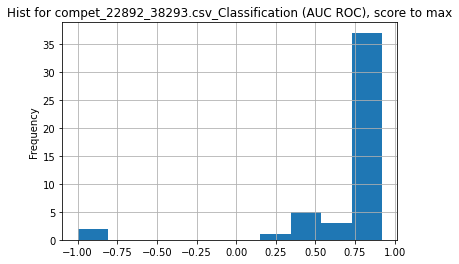

metric_column:  Classification (AUC ROC) , score_function:  max
Utility w/mean =  1.2751949177014148
Utility w/median =  1.0887573964497042
___________________
22902_38297.csv
___________________
22902_38298.csv
  Overall quality
0     0.91609 (1)
1     0.90762 (2)
2     0.90411 (3)


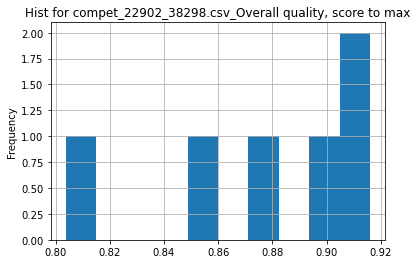

metric_column:  Overall quality , score_function:  max
Utility w/mean =  1.0445188103233016
Utility w/median =  1.0276922386569516
___________________
22917_38320.csv
     F1 Macro
0  0.8266 (1)
1  0.8076 (2)
2  0.8033 (3)


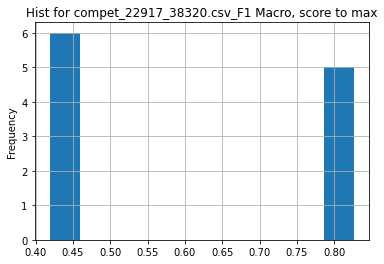

metric_column:  F1 Macro , score_function:  max
Utility w/mean =  1.3907949278798357
Utility w/median =  1.956449704142012
___________________
22917_38321.csv
___________________
22917_38322.csv
___________________
22946_38357.csv
        Avg Shirt R@10 Dress R@10 Toptee R@10 Shirt R@50 Dress R@50  \
0  0.47 (1)   0.29 (1)   0.35 (1)    0.38 (1)   0.53 (2)   0.60 (1)   
1  0.46 (2)   0.28 (2)   0.33 (2)    0.38 (2)   0.53 (1)   0.60 (2)   
2  0.44 (3)   0.28 (3)   0.32 (3)    0.34 (3)   0.51 (4)   0.58 (3)   

  Toptee R@50  
0    0.65 (2)  
1    0.66 (1)  
2    0.62 (4)  


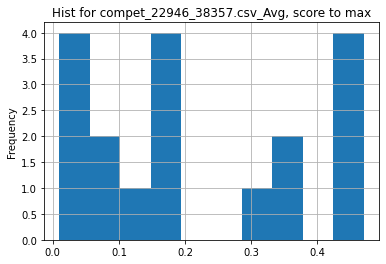

metric_column:  Avg , score_function:  max
Utility w/mean =  2.2204724409448824
Utility w/median =  2.9374999999999996
___________________
22946_38358.csv
        Avg Shirt R@10 Dress R@10 Toptee R@10 Shirt R@50 Dress R@50  \
0  0.52 (1)   0.34 (1)   0.43 (1)    0.42 (1)   0.58 (1)   0.67 (1)   
1  0.50 (2)   0.33 (2)   0.41 (2)    0.41 (2)   0.58 (2)   0.66 (2)   
2  0.50 (3)   0.33 (2)   0.41 (2)    0.40 (3)   0.58 (2)   0.66 (2)   

  Toptee R@50  
0    0.67 (1)  
1    0.64 (2)  
2    0.64 (3)  


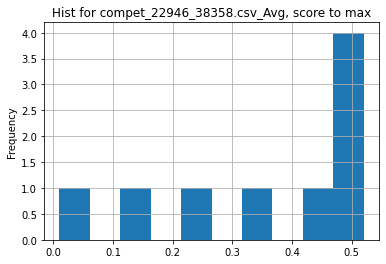

metric_column:  Avg , score_function:  max
Utility w/mean =  1.4952076677316295
Utility w/median =  1.2093023255813955
___________________
22966_38382.csv
             AP
0  0.579356 (1)
1  0.579296 (2)
2  0.564441 (3)


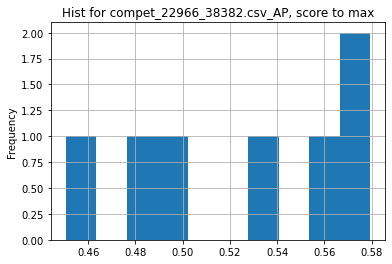

metric_column:  AP , score_function:  max
Utility w/mean =  1.104889968489255
Utility w/median =  1.0962623206422912
___________________
22966_38383.csv
             AP
0  0.589984 (1)
1  0.582274 (2)
2  0.577601 (3)


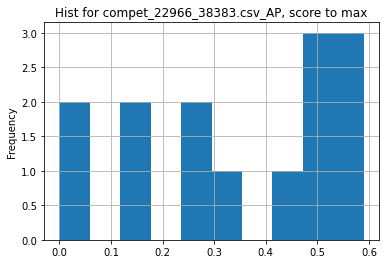

metric_column:  AP , score_function:  max
Utility w/mean =  1.6559573176452846
Utility w/median =  1.5217401957939507
___________________
22967_38384.csv
         Top-10
0  0.907490 (1)
1  0.905631 (2)
2  0.901188 (3)


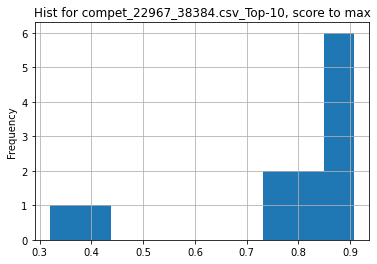

metric_column:  Top-10 , score_function:  max
Utility w/mean =  1.175715601950349
Utility w/median =  1.0594235154919778
___________________
22967_38385.csv
         Top-10
0  0.872082 (1)
1  0.854168 (2)
2  0.848012 (3)


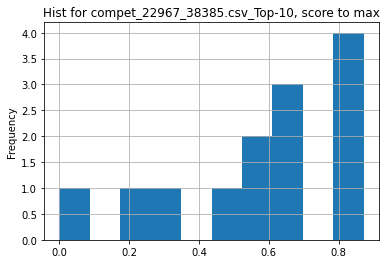

metric_column:  Top-10 , score_function:  max
Utility w/mean =  1.534251903289508
Utility w/median =  1.3925438841614624
___________________
22998_38475.csv
___________________
22999_38476.csv
___________________
23011_38492.csv
___________________
23020_38506.csv
___________________
23021_38507.csv
___________________
23109_38582.csv
File cannot be opened: 23109_38582.csv
___________________
23178_38718.csv
___________________
2321_4961.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4        Set 5  \
0  1.20 (1)  0.8265 (1)  0.8187 (2)  0.9630 (1)  0.9038 (1)   0.6046 (1)   
1  4.20 (2)  0.8192 (4)  0.7947 (3)  0.9420 (5)  0.8502 (6)   0.4520 (3)   
2  6.40 (3)  0.8258 (2)  0.8211 (1)  0.9557 (2)  0.8366 (8)  0.3483 (19)   

    Duration  
0  2.99 (61)  
1  3.01 (57)  
2  3.04 (42)  


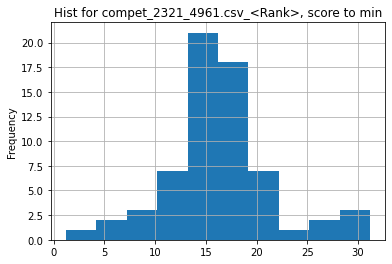

metric_column:  <Rank> , score_function:  min
Utility w/mean =  13.469230769230766
Utility w/median =  13.333333333333334
___________________
2321_4971.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.40 (1)  0.8262 (1)  0.8132 (2)  0.9632 (2)  0.8877 (1)  0.5894 (1)   
1  3.60 (2)  0.8178 (4)  0.7924 (4)  0.9394 (5)  0.8716 (2)  0.4608 (3)   
2  4.00 (3)  0.8172 (6)  0.8107 (3)  0.9751 (1)  0.8580 (5)  0.3958 (5)   

    Duration  
0  3.00 (63)  
1  3.04 (46)  
2  6.62 (22)  


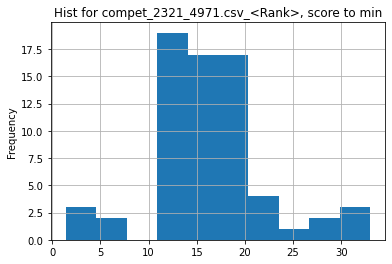

metric_column:  <Rank> , score_function:  min
Utility w/mean =  11.771008403361343
Utility w/median =  11.428571428571429
___________________
2321_4981.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.80 (1)  0.5096 (1)  0.6059 (4)  0.6270 (3)  0.5802 (1)  0.8778 (5)   
1  3.80 (2)  0.4856 (2)  0.6276 (1)  0.5993 (5)  0.5292 (3)  0.8711 (8)   
2  4.20 (3)  0.4309 (9)  0.6207 (3)  0.7468 (1)  0.5549 (2)  0.8749 (6)   

       Duration  
0   5988.07 (3)  
1   5986.54 (4)  
2  2727.99 (61)  


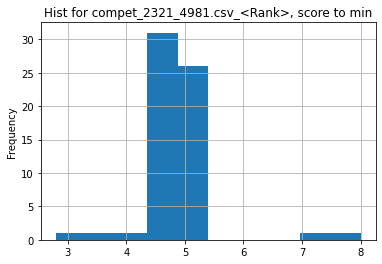

metric_column:  <Rank> , score_function:  min
Utility w/mean =  1.782258064516128
Utility w/median =  1.7142857142857144
___________________
2321_4991.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.40 (1)  0.5588 (1)  0.6958 (1)  0.8593 (1)  0.7067 (4)  0.9192 (5)   
1  2.60 (2)  0.5564 (2)  0.6844 (2)  0.8453 (5)  0.7376 (2)  0.9254 (2)   
2  3.20 (3)  0.5276 (5)  0.6768 (3)  0.8553 (4)  0.8182 (1)  0.9251 (3)   

     Duration  
0  1.01 (124)  
1  2.02 (118)  
2   4.04 (55)  


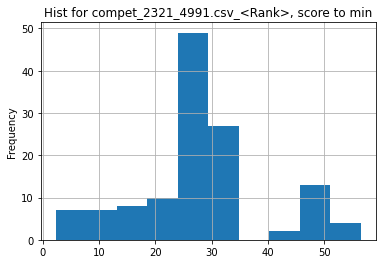

metric_column:  <Rank> , score_function:  min
Utility w/mean =  11.692913385826776
Utility w/median =  11.333333333333334
___________________
2321_5001.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.20 (1)  0.5269 (4)  0.6378 (2)  0.8457 (2)  0.7925 (1)  0.9364 (2)   
1  3.20 (2)  0.5537 (1)  0.6458 (1)  0.8130 (8)  0.7153 (3)  0.9344 (3)   
2  4.60 (3)  0.5441 (2)  0.6310 (3)  0.8191 (6)  0.6569 (7)  0.9280 (5)   

       Duration  
0     5.05 (53)  
1    1.01 (126)  
2  2357.87 (25)  


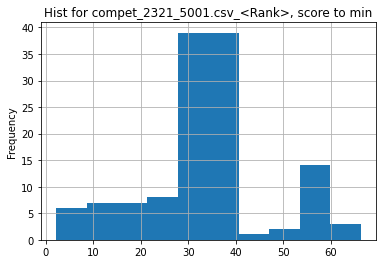

metric_column:  <Rank> , score_function:  min
Utility w/mean =  14.978354978354972
Utility w/median =  14.818181818181818
___________________
2321_5011.csv
     <Rank>         Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.80 (1)    0.3193 (3)  0.9198 (1)  0.3361 (1)  0.3495 (2)  0.2351 (2)   
1  3.80 (2)    0.3304 (2)  0.6662 (4)  0.2647 (5)  0.3440 (3)  0.2194 (5)   
2  3.80 (2)  -1.0000 (10)  0.8688 (2)  0.3214 (2)  0.3357 (4)  0.2386 (1)   

      Duration  
0  5954.71 (2)  
1   711.28 (9)  
2  5987.17 (1)  


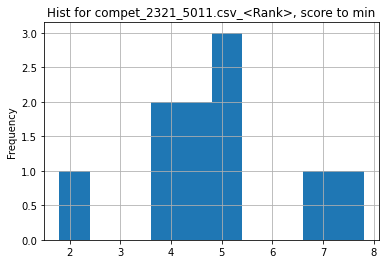

metric_column:  <Rank> , score_function:  min
Utility w/mean =  2.6333333333333333
Utility w/median =  2.6111111111111107
___________________
2321_5021.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.40 (1)  0.4028 (2)  0.9826 (1)  0.3869 (1)  0.5258 (1)  0.3709 (2)   
1  2.20 (2)  0.3979 (3)  0.9742 (2)  0.3781 (3)  0.5048 (2)  0.3711 (1)   
2  3.00 (3)  0.4040 (1)  0.9722 (3)  0.3533 (4)  0.4990 (3)  0.3406 (4)   

     Duration  
0  1.02 (124)  
1  1.01 (164)  
2   2.02 (66)  


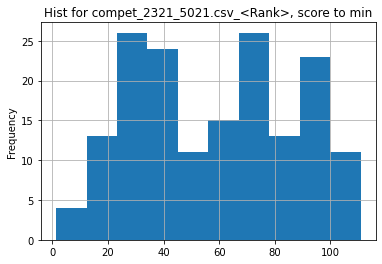

metric_column:  <Rank> , score_function:  min
Utility w/mean =  41.817555938037856
Utility w/median =  43.214285714285715
___________________
2321_5031.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.00 (1)  0.3745 (4)  0.9804 (1)  0.3516 (2)  0.5136 (1)  0.3697 (2)   
1  2.20 (2)  0.3911 (2)  0.9779 (2)  0.3351 (4)  0.4928 (2)  0.3740 (1)   
2  3.20 (3)  0.3836 (3)  0.9561 (4)  0.3714 (1)  0.4368 (4)  0.3405 (4)   

     Duration  
0  2.01 (139)  
1  2.01 (148)  
2  11.05 (26)  


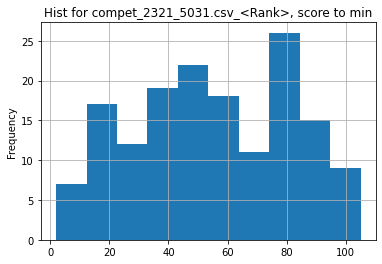

metric_column:  <Rank> , score_function:  min
Utility w/mean =  27.342948717948712
Utility w/median =  26.9
___________________
2321_5041.csv
     <Rank>       Set 1        Set 2        Set 3       Set 4       Set 5  \
0  2.40 (1)  0.0000 (3)   0.0000 (2)   0.0000 (2)  0.1422 (4)  0.3081 (1)   
1  2.80 (2)  0.1377 (2)   0.0000 (2)   0.0521 (1)  0.0306 (6)  0.2199 (3)   
2  2.80 (2)  0.7090 (1)  -1.0000 (3)  -1.0000 (3)  0.0904 (5)  0.2658 (2)   

      Duration  
0  5576.12 (3)  
1  5991.44 (2)  
2  8483.42 (1)  


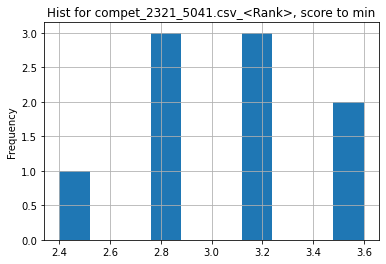

metric_column:  <Rank> , score_function:  min
Utility w/mean =  1.277777777777778
Utility w/median =  1.3333333333333335
___________________
2321_5051.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.80 (1)  0.8961 (1)  0.9145 (3)  0.9795 (1)  0.5108 (2)  0.7337 (2)   
1  2.00 (2)  0.8034 (2)  0.8987 (4)  0.9767 (2)  0.5491 (1)  0.7524 (1)   
2  3.80 (3)  0.7529 (3)  0.9191 (2)  0.9654 (4)  0.4378 (5)  0.7030 (5)   

    Duration  
0   5.03 (6)  
1  1.01 (13)  
2   2.03 (9)  


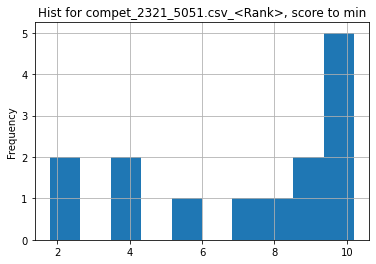

metric_column:  <Rank> , score_function:  min
Utility w/mean =  3.9761904761904767
Utility w/median =  4.722222222222222
___________________
2321_5061.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.80 (1)  0.8966 (1)  0.9160 (3)  0.9804 (1)  0.5027 (2)  0.7396 (2)   
1  2.00 (2)  0.7996 (2)  0.9101 (4)  0.9787 (2)  0.5132 (1)  0.7543 (1)   
2  3.80 (3)  0.7552 (3)  0.9260 (2)  0.9686 (3)  0.4166 (6)  0.7071 (5)   

    Duration  
0   5.05 (5)  
1  1.01 (13)  
2  2.02 (10)  


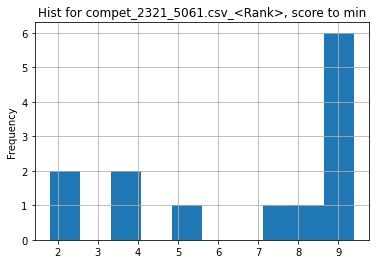

metric_column:  <Rank> , score_function:  min
Utility w/mean =  3.743589743589744
Utility w/median =  4.555555555555555
___________________
2321_5071.csv
___________________
2321_5081.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.80 (1)  0.6396 (2)  0.5233 (2)  0.2828 (1)  0.7824 (1)  0.3820 (3)   
1  2.80 (2)  0.6485 (1)  0.5288 (1)  0.2526 (4)  0.7249 (7)  0.3908 (1)   
2  5.00 (3)  0.5802 (6)  0.5143 (4)  0.2416 (7)  0.7589 (3)  0.3731 (5)   

    Duration  
0   5.05 (8)  
1  2.02 (18)  
2  2.03 (13)  


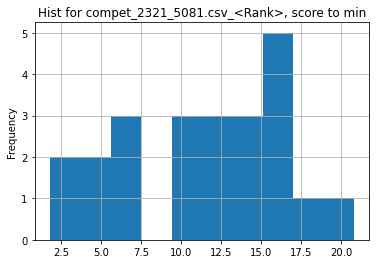

metric_column:  <Rank> , score_function:  min
Utility w/mean =  6.357487922705315
Utility w/median =  6.888888888888889
___________________
2321_5091.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.60 (1)  0.6530 (1)  0.5175 (2)  0.2843 (1)  0.7821 (1)  0.3823 (3)   
1  3.60 (2)  0.6137 (3)  0.5263 (1)  0.2455 (5)  0.7271 (7)  0.3863 (2)   
2  5.40 (3)  0.5946 (6)  0.5064 (6)  0.2251 (7)  0.7574 (3)  0.3720 (5)   

    Duration  
0   5.06 (7)  
1  2.02 (19)  
2  2.01 (21)  


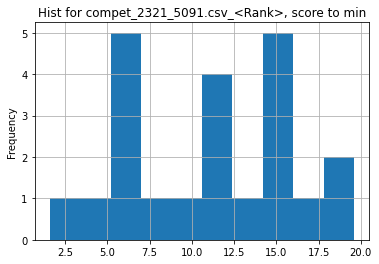

metric_column:  <Rank> , score_function:  min
Utility w/mean =  6.835227272727272
Utility w/median =  7.1875
___________________
2321_5101.csv
     <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.60 (1)  0.7947 (1)  0.4061 (1)  0.5543 (3)  0.2957 (2)  0.5900 (1)   
1  3.00 (2)  0.7531 (5)  0.3905 (2)  0.6875 (1)  0.3067 (1)  0.5517 (6)   
2  4.00 (3)  0.7062 (6)  0.3708 (3)  0.5384 (4)  0.2856 (3)  0.5580 (4)   

      Duration  
0  5942.22 (1)  
1  5842.12 (3)  
2  5879.88 (2)  


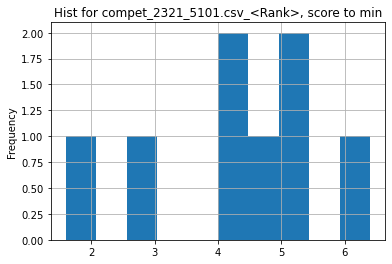

metric_column:  <Rank> , score_function:  min
Utility w/mean =  2.6874999999999996
Utility w/median =  2.8125
___________________
23258_38802.csv
___________________
23285_38829.csv
___________________
23285_38830.csv
___________________
23285_38831.csv
___________________
23317_38837.csv
     <Rank> nc_test_acc nc_val_acc   nc_disk         nc_mem      nc_time  \
0  0.94 (1)    0.99 (1)   0.55 (3)  0.00 (1)    2700.29 (2)   15.90 (11)   
1  0.93 (2)    0.95 (8)  0.54 (11)  0.00 (1)  25871.73 (15)  100.55 (22)   
2  0.92 (3)    0.97 (5)   0.55 (5)  0.00 (1)   16081.78 (5)   40.60 (18)   

  ni_test_acc ni_val_acc   ni_disk         ni_mem      ni_time nic_test_acc  \
0    0.95 (1)   0.92 (2)  0.00 (1)    2766.35 (2)   67.52 (16)     0.90 (1)   
1    0.94 (2)   0.93 (1)  0.00 (1)  26268.43 (18)   88.78 (18)     0.89 (2)   
2    0.90 (4)   0.91 (3)  0.00 (1)   10427.34 (3)  121.96 (22)     0.88 (4)   

  nic_val_acc  nic_disk        nic_mem     nic_time  
0    0.56 (2)  0.00 (1)    2767.43

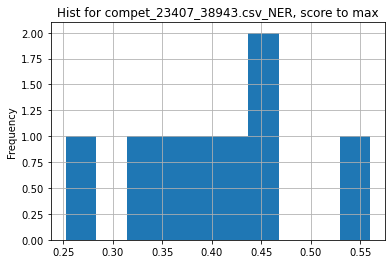

metric_column:  NER , score_function:  max
Utility w/mean =  1.3791336849332363
Utility w/median =  1.3707815655792888
___________________
23407_38944.csv
___________________
23428_38960.csv
   Dose score    DVH score
0  2.2957 (1)  1.8780 (18)
1  2.3090 (2)   1.5522 (2)
2  2.4171 (3)   1.5720 (4)


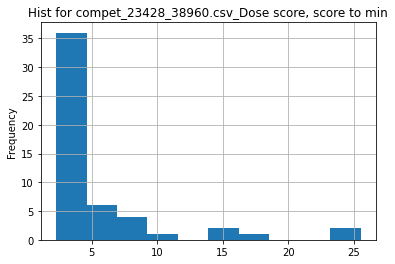

metric_column:  Dose score , score_function:  min
Utility w/mean =  2.415658371336378
Utility w/median =  1.5077971860434727
___________________
23428_38961.csv
   Dose score    DVH score
0  2.0404 (1)  1.6519 (13)
1  2.3575 (2)   1.4655 (1)
2  2.4294 (3)   1.4776 (2)


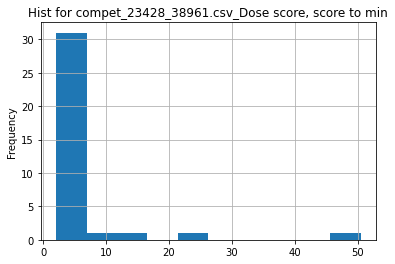

metric_column:  Dose score , score_function:  min
Utility w/mean =  2.7753647744139807
Utility w/median =  1.484561850617526
___________________
23431_38964.csv
        Rank   Mean IOU   Mean APr
0  63.43 (2)  69.08 (1)  57.79 (2)
1  66.69 (1)  68.76 (2)  64.63 (1)
2  62.55 (3)  68.69 (3)  56.40 (4)


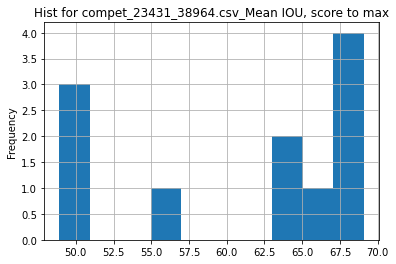

metric_column:  Mean IOU , score_function:  max
Utility w/mean =  1.1340138490926457
Utility w/median =  1.0700123915737298
___________________
23433_38966.csv
        rank parsing_mIoU  human_mAP inst_part_mAP
0  71.10 (1)    65.69 (1)  88.47 (2)     59.15 (2)
1  70.53 (2)    62.67 (2)  89.59 (1)     59.34 (1)
2  67.02 (3)    60.58 (3)  84.93 (3)     55.56 (3)


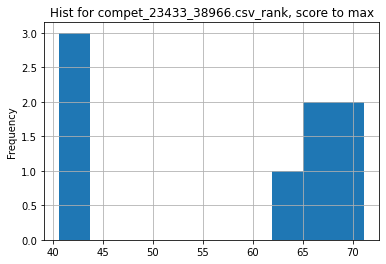

metric_column:  rank , score_function:  max
Utility w/mean =  1.2323691907702305
Utility w/median =  1.0872390855569998
___________________
23454_38997.csv
          F1  Precision     Recall
0  0.422 (1)  0.477 (1)  0.378 (1)
1         F1  Precision     Recall
2  0.577 (1)  0.520 (1)  0.648 (1)
File cannot be opened: 23454_38997.csv
___________________
23454_38998.csv
          F1  Precision     Recall
0  0.666 (1)  0.679 (2)  0.652 (1)
1  0.627 (2)  0.627 (5)  0.626 (2)
2  0.625 (3)  0.635 (4)  0.616 (3)
File cannot be opened: 23454_38998.csv
___________________
23471_39013.csv
    MeanSSIM
0  75.64 (1)
1  75.29 (2)
2  73.52 (3)


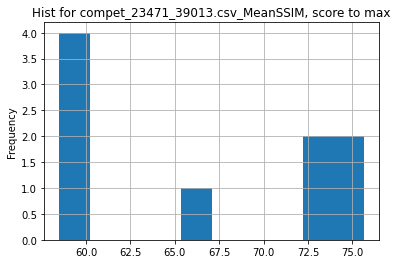

metric_column:  MeanSSIM , score_function:  max
Utility w/mean =  1.139957801667839
Utility w/median =  1.154280482221883
___________________
23472_39014.csv
___________________
23553_39179.csv
        UIoU Average UIoU        IoU
0  37.90 (1)    37.89 (1)  36.10 (1)
1  31.80 (2)    20.66 (4)  13.16 (5)
2  31.74 (3)    20.66 (4)  13.16 (5)


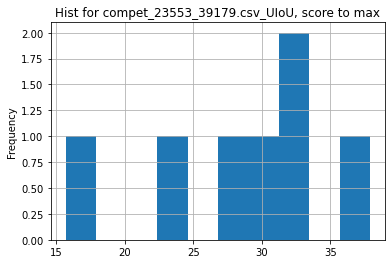

metric_column:  UIoU , score_function:  max
Utility w/mean =  1.3342385837859583
Utility w/median =  1.2341256919570172
___________________
23553_39180.csv
        UIoU  Average UIoU        IoU
0  54.21 (1)  -100.00 (52)  54.21 (2)
1  53.32 (2)  -100.00 (52)  53.32 (3)
2  49.48 (3)     49.48 (1)  49.48 (4)


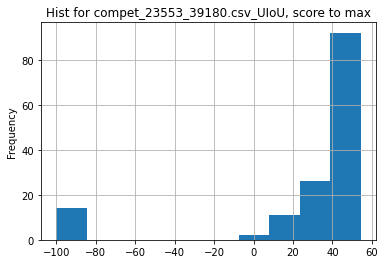

metric_column:  UIoU , score_function:  max
Utility w/mean =  2.1248709201299714
Utility w/median =  1.2648156789547365
___________________
23601_39224.csv
File cannot be opened: 23601_39224.csv
___________________
23601_39225.csv
File cannot be opened: 23601_39225.csv
___________________
23601_39226.csv
___________________
23615_39240.csv
___________________
23615_39241.csv
          MAP
0  0.6033 (1)
1  0.5843 (2)
2  0.5233 (3)


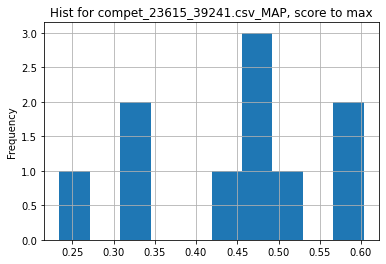

metric_column:  MAP , score_function:  max
Utility w/mean =  1.3350298738658994
Utility w/median =  1.244559051057246
___________________
23615_39242.csv
___________________
23643_39277.csv
  Weighted F1 Weighted Recall   Precision
0  0.5983 (1)      0.5529 (3)  0.7525 (2)
1  0.5754 (2)      0.5932 (1)  0.6600 (4)
2  0.5735 (3)      0.5542 (2)  0.6990 (3)
File cannot be opened: 23643_39277.csv
___________________
23643_39278.csv
  Weighted F1 Weighted Recall   Precision
0  0.5540 (1)      0.5528 (1)  0.6612 (3)
1  0.5508 (2)      0.4924 (2)  0.7553 (2)
2  0.4680 (3)      0.4924 (3)  0.5579 (4)
File cannot be opened: 23643_39278.csv
___________________
23660_39357.csv
   MAE (mean)    MAE (sd)         Time Data Type
0  0.0240 (1)  0.0046 (2)  1581.30 (6)   2.0 (2)
1  0.0370 (2)  0.0101 (4)   169.56 (3)   1.0 (3)
2  0.0569 (3)  0.0112 (6)    25.56 (2)   2.0 (2)


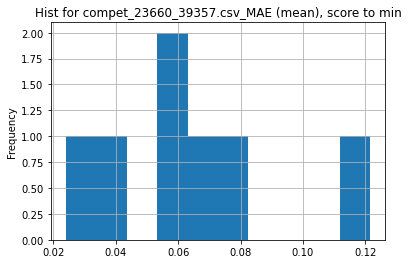

metric_column:  MAE (mean) , score_function:  min
Utility w/mean =  2.644642857142857
Utility w/median =  2.4208333333333334
___________________
23661_39358.csv
  AP @ 0.50:0.95  AP @ 0.50  AP @ 0.75 AP @ 0.50:0.95 (small)  \
0      0.523 (1)  0.715 (1)  0.579 (1)              0.317 (1)   
1      0.247 (2)  0.381 (2)  0.272 (2)              0.139 (2)   
2      0.203 (3)  0.345 (3)  0.218 (3)              0.098 (5)   

  AP @ 0.50:0.95 (medium) AP @ 0.50:0.95 (large) Execution time  
0               0.570 (1)              0.702 (1)       79.4 (8)  
1               0.259 (2)              0.318 (2)       71.6 (5)  
2               0.212 (3)              0.277 (3)      207.5 (9)  


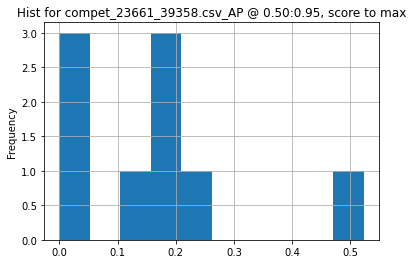

metric_column:  AP @ 0.50:0.95 , score_function:  max
Utility w/mean =  3.0
Utility w/median =  3.1696969696969695
___________________
23661_39359.csv
  AP @ 0.50:0.95  AP @ 0.50  AP @ 0.75 AP @ 0.50:0.95 (small)  \
0      0.394 (1)  0.563 (1)  0.427 (1)              0.162 (6)   
1      0.366 (2)  0.529 (3)  0.400 (2)              0.224 (2)   
2      0.359 (3)  0.523 (4)  0.391 (4)              0.219 (3)   

  AP @ 0.50:0.95 (medium) AP @ 0.50:0.95 (large) Execution time  
0               0.435 (1)              0.611 (1)       78.7 (5)  
1               0.387 (3)              0.456 (2)      246.7 (9)  
2               0.376 (4)              0.454 (3)      195.8 (8)  


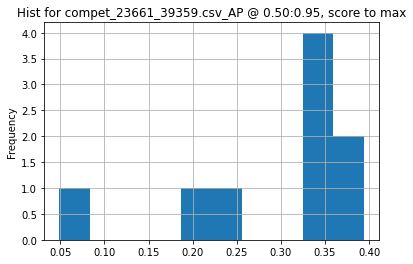

metric_column:  AP @ 0.50:0.95 , score_function:  max
Utility w/mean =  1.334085778781038
Utility w/median =  1.1225071225071226
___________________
23672_39365.csv
         wer
0  15.67 (1)
1  17.59 (2)
2  18.71 (3)


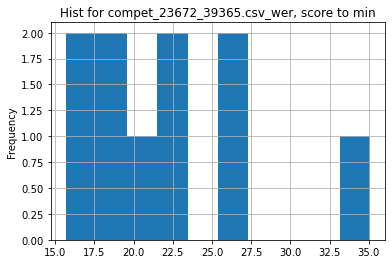

metric_column:  wer , score_function:  min
Utility w/mean =  1.4190172303765154
Utility w/median =  1.3168474792597318
___________________
23672_39366.csv
         wer
0  15.67 (1)
1  17.06 (2)
2  17.79 (3)


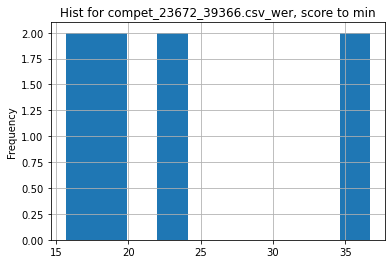

metric_column:  wer , score_function:  min
Utility w/mean =  1.4887523931078492
Utility w/median =  1.3098276962348436
___________________
23683_39382.csv
___________________
23683_39383.csv
___________________
23683_39384.csv
___________________
23705_39418.csv
File cannot be opened: 23705_39418.csv
___________________
23705_39419.csv
___________________
23705_39420.csv
File cannot be opened: 23705_39420.csv
___________________
23705_39421.csv
File cannot be opened: 23705_39421.csv
___________________
23705_39422.csv
___________________
23705_39423.csv
File cannot be opened: 23705_39423.csv
___________________
23705_39424.csv
File cannot be opened: 23705_39424.csv
___________________
23705_39425.csv
___________________
23705_39426.csv
File cannot be opened: 23705_39426.csv
___________________
23705_39427.csv
File cannot be opened: 23705_39427.csv
___________________
23705_39428.csv
___________________
23705_39429.csv
File cannot be opened: 23705_39429.csv
___________________
23705_394

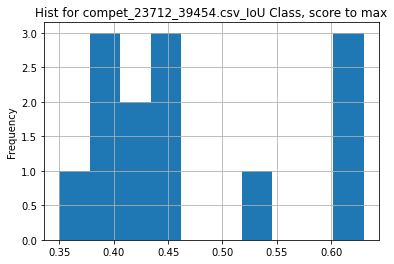

metric_column:  IoU Class , score_function:  max
Utility w/mean =  1.33605220228385
Utility w/median =  1.4318181818181819
___________________
23712_39455.csv
  IoU Class iIoU Class IoU Category iIoU Category  Accuracy
0  0.66 (1)   0.45 (1)     0.88 (2)      0.74 (1)  0.83 (3)
1  0.66 (2)   0.40 (3)     0.88 (1)      0.72 (2)  0.83 (1)
2  0.64 (3)   0.40 (2)     0.87 (3)      0.71 (3)  0.83 (2)


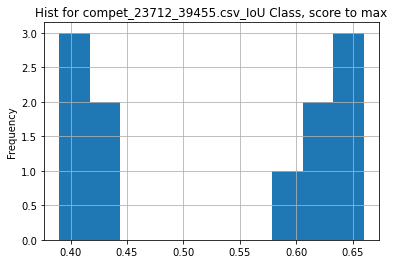

metric_column:  IoU Class , score_function:  max
Utility w/mean =  1.2538860103626945
Utility w/median =  1.1379310344827587
___________________
23713_39456.csv
___________________
23713_39457.csv
  Top1 accuracy
0      0.73 (1)
1      0.70 (2)
2      0.69 (3)


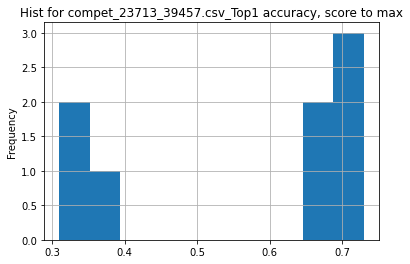

metric_column:  Top1 accuracy , score_function:  max
Utility w/mean =  1.3006681514476615
Utility w/median =  1.0977443609022555
___________________
23717_39461.csv
     Macro-F   Accuracy
0  0.607 (1)  0.848 (1)
1  0.593 (2)  0.831 (2)
2  0.550 (3)  0.798 (4)


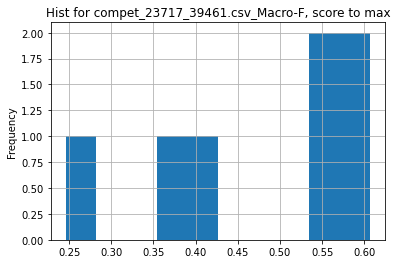

metric_column:  Macro-F , score_function:  max
Utility w/mean =  1.2910969310240046
Utility w/median =  1.132462686567164
___________________
23719_39463.csv
___________________
23748_39504.csv
___________________
23748_39505.csv
___________________
23748_39506.csv
___________________
23748_39507.csv
___________________
23748_39508.csv
             F1        Recall     Precision Exact match (Task 2 only)
0  0.977467 (1)  0.977660 (1)  0.977324 (1)             -1.000000 (1)
1  0.975516 (2)  0.975900 (2)  0.975301 (2)             -1.000000 (1)
2  0.972336 (3)  0.971974 (3)  0.972810 (3)             -1.000000 (1)


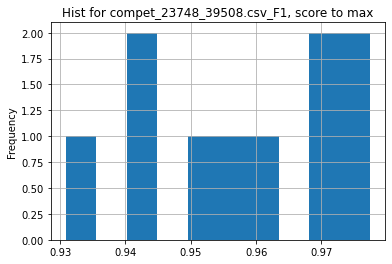

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0201625364257285
Utility w/median =  1.0187179457784048
___________________
23748_39509.csv
             F1        Recall     Precision Exact match (Task 2 only)
0  0.947154 (1)  0.947012 (1)  0.947870 (1)              0.824451 (1)
1  0.946622 (2)  0.946624 (2)  0.946659 (2)              0.736677 (2)
2  0.837098 (3)  0.836262 (3)  0.839150 (3)              0.703762 (4)


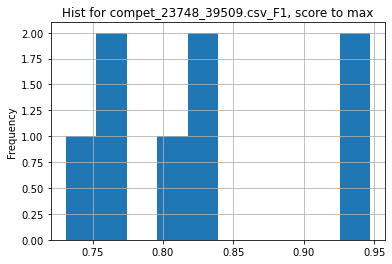

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1480525824407424
Utility w/median =  1.1678358538827311
___________________
23887_39724.csv
      correct
0  0.7073 (1)
1  0.7060 (2)
2  0.7007 (3)


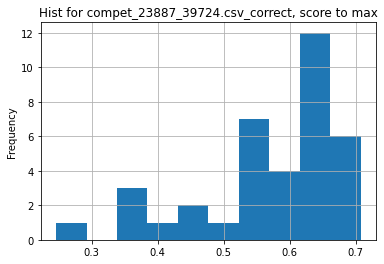

metric_column:  correct , score_function:  max
Utility w/mean =  1.2345376751909354
Utility w/median =  1.1547755102040815
___________________
23887_39725.csv
      correct
0  0.6444 (1)
1  0.6388 (2)
2  0.6380 (3)


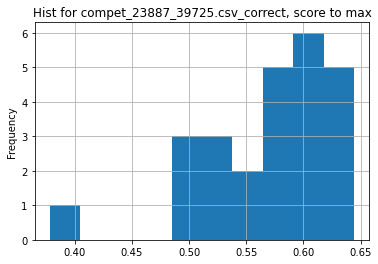

metric_column:  correct , score_function:  max
Utility w/mean =  1.1292346298619824
Utility w/median =  1.1064560439560438
___________________
23905_39745.csv
___________________
23905_39746.csv
___________________
23925_39797.csv
___________________
23925_39798.csv
___________________
23925_39799.csv
  overlapping F1 overlapping P overlapping R   strict F1    strict P  \
0     0.8440 (1)    0.8440 (2)    0.8440 (1)  0.7820 (2)  0.7820 (3)   
1     0.8300 (2)    0.8450 (1)    0.8160 (2)  0.7960 (1)  0.8100 (1)   
2     0.8040 (3)    0.8270 (4)    0.7820 (4)  0.7540 (3)  0.7810 (4)   

     strict R  
0  0.7820 (1)  
1  0.7820 (1)  
2  0.7280 (2)  


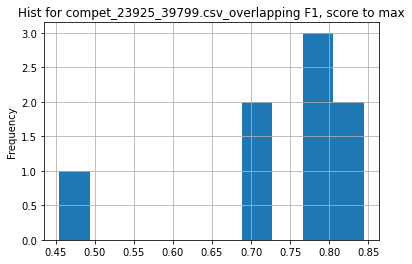

metric_column:  overlapping F1 , score_function:  max
Utility w/mean =  1.138617200674536
Utility w/median =  1.0785942492012779
___________________
24001_39901.csv
           F1    Accuracy   Precision      Recall
0  0.2903 (1)  0.4507 (2)  0.3470 (2)  0.2762 (1)
1  0.2716 (2)  0.4065 (3)  0.3332 (3)  0.2577 (2)
2  0.2534 (3)  0.4525 (1)  0.4318 (1)  0.2376 (6)


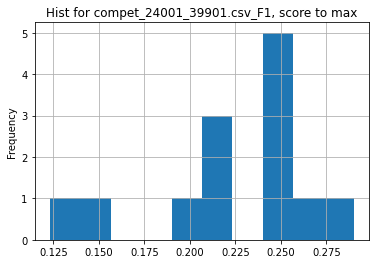

metric_column:  F1 , score_function:  max
Utility w/mean =  1.2991944367942714
Utility w/median =  1.2070686070686072
___________________
24001_39902.csv
           F1    Accuracy   Precision      Recall
0  0.2678 (1)  0.4286 (1)  0.3252 (1)  0.2519 (1)
1  0.2599 (2)  0.3966 (2)  0.3026 (2)  0.2485 (2)
2  0.2309 (3)  0.3770 (5)  0.2640 (5)  0.2304 (4)


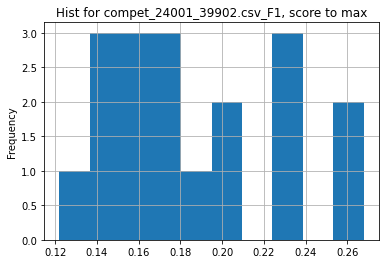

metric_column:  F1 , score_function:  max
Utility w/mean =  1.4225763612217792
Utility w/median =  1.4986010072747622
___________________
24001_39903.csv
           F1    Accuracy   Precision      Recall
0  0.2773 (1)  0.4090 (1)  0.3467 (2)  0.2618 (1)
1  0.2460 (2)  0.4078 (2)  0.3368 (3)  0.2362 (2)
2  0.2307 (3)  0.3844 (3)  0.2743 (4)  0.2244 (5)


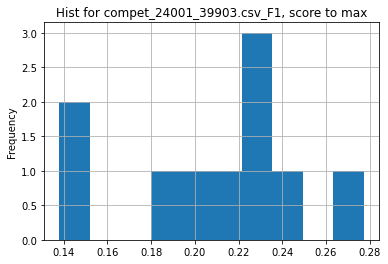

metric_column:  F1 , score_function:  max
Utility w/mean =  1.327874347555428
Utility w/median =  1.2570262919310968
___________________
24002_39904.csv
___________________
24002_39905.csv
___________________
24002_39906.csv
___________________
24025_39932.csv
          PQ        PQ+         RQ         SQ     PQ(Th)     RQ(Th)  \
0  0.634 (1)  0.697 (1)  0.736 (1)  0.852 (1)  0.667 (1)  0.743 (2)   
1  0.615 (2)  0.679 (3)  0.721 (4)  0.848 (2)  0.638 (3)  0.704 (3)   
2  0.615 (3)  0.675 (4)  0.721 (3)  0.845 (3)  0.614 (4)  0.693 (4)   

      SQ(Th)     PQ(st)     RQ(st)     SQ(st)       mIoU  
0  0.898 (2)  0.610 (2)  0.731 (7)  0.819 (1)  0.683 (2)  
1  0.907 (1)  0.599 (6)  0.733 (3)  0.805 (5)  0.660 (9)  
2  0.881 (6)  0.615 (1)  0.741 (2)  0.818 (2)  0.677 (6)  


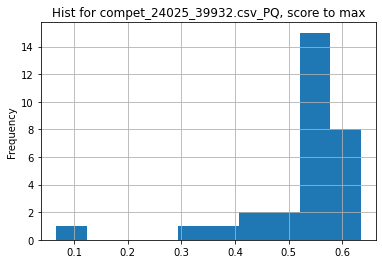

metric_column:  PQ , score_function:  max
Utility w/mean =  1.2072357981593145
Utility w/median =  1.1331546023235028
___________________
24108_40001.csv
___________________
24108_40002.csv
___________________
24108_40003.csv
___________________
24108_40004.csv
___________________
24122_40019.csv
          AUC         MRR      nDCG@5     nDCG@10
0  0.7304 (1)  0.3770 (1)  0.4180 (1)  0.4718 (1)
1  0.7275 (2)  0.3724 (3)  0.4102 (3)  0.4661 (3)
2  0.7268 (3)  0.3745 (2)  0.4151 (2)  0.4684 (2)


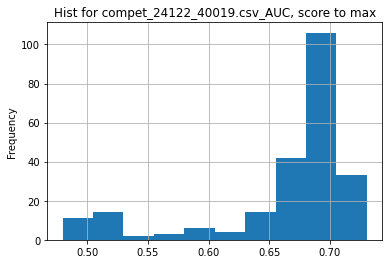

metric_column:  AUC , score_function:  max
Utility w/mean =  1.104116733630005
Utility w/median =  1.067056245434624
___________________
24122_45101.csv
File cannot be opened: 24122_45101.csv
___________________
24183_40136.csv
       Mean F (Junction) F (Wireframe)   F (Plane)
0  2.67 (2)   0.8910 (1)    0.7559 (3)  0.9659 (4)
1  1.33 (1)   0.8836 (2)    0.7652 (1)  0.9740 (1)
2  2.67 (2)   0.8762 (3)    0.7606 (2)  0.9709 (3)


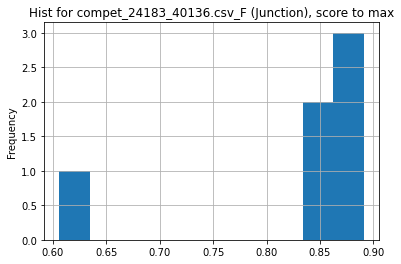

metric_column:  F (Junction) , score_function:  max
Utility w/mean =  1.0807204803202135
Utility w/median =  1.0329237189891027
___________________
24183_40137.csv
       Mean F (Junction) F (Wireframe)   F (Plane)
0  2.33 (2)   0.8781 (1)    0.7418 (3)  0.9651 (3)
1  2.67 (3)   0.8747 (2)    0.7531 (2)  0.9615 (4)
2  1.67 (1)   0.8727 (3)    0.7545 (1)  0.9686 (1)


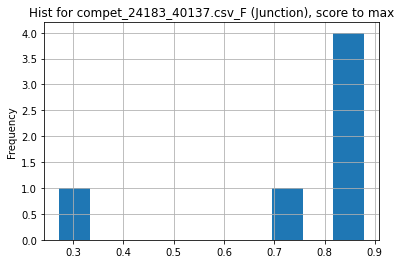

metric_column:  F (Junction) , score_function:  max
Utility w/mean =  1.1669361447651112
Utility w/median =  1.0124524386025597
___________________
24184_40139.csv
        Ranking Bias (positive pairs) Bias (negative pairs)      Accuracy
0  2.333333 (1)          0.000142 (1)          0.002956 (3)  0.999287 (3)
1  3.666667 (2)          0.000344 (3)          0.003781 (7)  0.999442 (1)
2  3.666667 (2)          0.000472 (5)          0.002334 (1)  0.998477 (5)


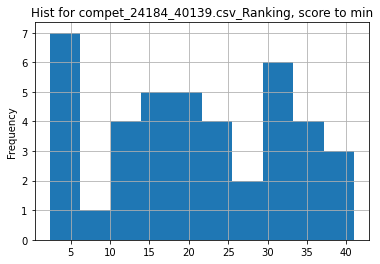

metric_column:  Ranking , score_function:  min
Utility w/mean =  9.000001296167431
Utility w/median =  8.428572775510396
___________________
24184_40140.csv
        Ranking Bias (positive pairs) Bias (negative pairs)      Accuracy
0  1.333333 (1)          0.000059 (2)          0.000012 (1)  0.999966 (1)
1  3.666667 (2)          0.000175 (4)          0.000172 (2)  0.999569 (5)
2  4.000000 (3)          0.000036 (1)          0.000405 (9)  0.999827 (2)


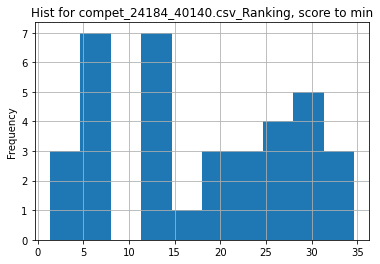

metric_column:  Ranking , score_function:  min
Utility w/mean =  13.20833663541749
Utility w/median =  12.500003000000747
___________________
24205_40178.csv
   F1_Score Precision    Recall
0  0.93 (1)  0.88 (1)  1.00 (1)
1  0.90 (2)  0.83 (5)  0.98 (2)
2  0.88 (3)  0.82 (6)  0.94 (4)


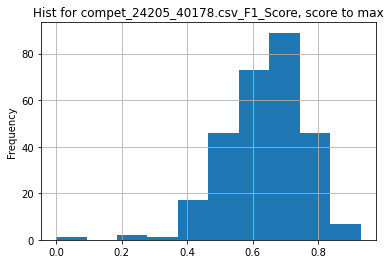

metric_column:  F1_Score , score_function:  max
Utility w/mean =  1.4443220619010877
Utility w/median =  1.4090909090909092
___________________
24205_40179.csv
   F1_Score Precision    Recall
0  0.95 (1)  0.91 (1)  1.00 (1)
1  0.90 (2)  0.86 (2)  0.94 (7)
2  0.89 (3)  0.84 (3)  0.94 (7)


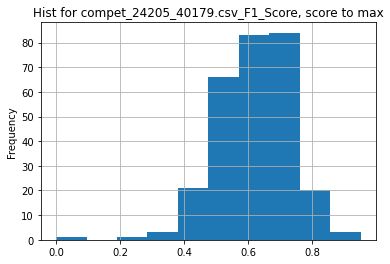

metric_column:  F1_Score , score_function:  max
Utility w/mean =  1.5352435530085944
Utility w/median =  1.507936507936508
___________________
24206_40180.csv
    Mean IOU
0  95.40 (1)
1  95.22 (2)
2  94.87 (3)


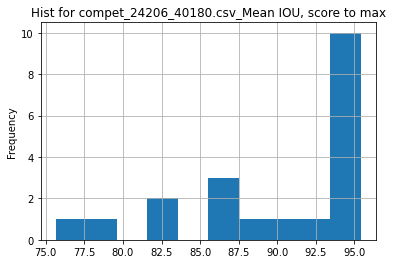

metric_column:  Mean IOU , score_function:  max
Utility w/mean =  1.062295739125109
Utility w/median =  1.0272423818240553
___________________
24275_40244.csv
       PSNR     SSIM Runtime per image CPU[0] / GPU[1]  \
0  38.9 (1)  1.0 (2)          23.1 (1)         0.0 (2)   
1  38.8 (2)  1.0 (3)           0.0 (4)         0.0 (2)   
2  38.7 (3)  1.0 (1)           0.0 (4)         0.0 (2)   

  Traditional[0] / Deep[1]  
0                  1.0 (1)  
1                  1.0 (1)  
2                  1.0 (1)  


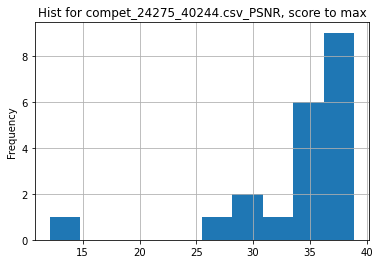

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1397597421623207
Utility w/median =  1.077562326869806
___________________
24275_40245.csv
___________________
24292_40280.csv
___________________
24292_40281.csv
         SCORE       MSVD     DiDeMo ActivityNet     MSRVTT   YouCook2
0  3071.96 (1)  95.39 (2)  45.44 (1)   78.64 (1)  88.46 (1)  36.22 (3)
1  3015.98 (2)  92.35 (4)  44.99 (2)   75.53 (2)  87.80 (2)  47.03 (1)
2  2925.65 (3)  95.67 (1)  42.20 (3)   75.32 (3)  85.74 (4)  31.37 (4)
File cannot be opened: 24292_40281.csv
___________________
24292_40282.csv
         SCORE       MSVD     DiDeMo ActivityNet     MSRVTT   YouCook2
0  2511.43 (1)  70.24 (2)  46.30 (1)   51.57 (2)  70.15 (1)  27.12 (1)
1  2448.56 (2)  75.33 (1)  45.88 (2)   51.76 (1)  66.32 (2)  13.76 (3)
2  1994.89 (3)  58.12 (4)  33.34 (4)   40.79 (3)  50.99 (3)  24.39 (2)


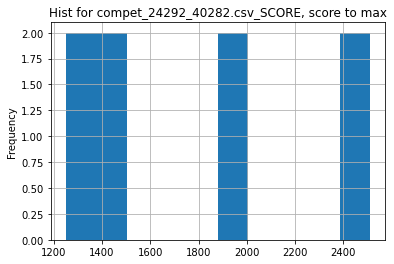

metric_column:  SCORE , score_function:  max
Utility w/mean =  1.4044016342736114
Utility w/median =  1.4808003561331253
___________________
24292_40283.csv
___________________
24293_40284.csv
       PSNR     SSIM Runtime per image CPU[0] / GPU[1]  \
0  33.8 (1)  1.0 (1)          16.1 (3)         1.0 (1)   
1  33.7 (2)  1.0 (2)          14.0 (4)         1.0 (1)   
2  33.6 (3)  1.0 (4)           0.0 (6)         0.0 (2)   

  Traditional[0] / Deep[1]  
0                  1.0 (1)  
1                  1.0 (1)  
2                  1.0 (1)  


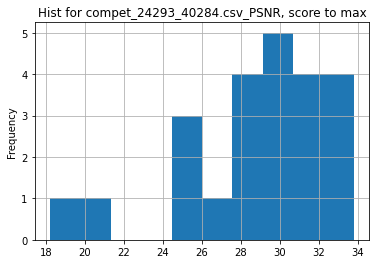

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1714888487040382
Utility w/median =  1.122923588039867
___________________
24293_40288.csv
___________________
24330_40342.csv
___________________
24330_40344.csv
___________________
24330_42927.csv
File cannot be opened: 24330_42927.csv
___________________
24334_40347.csv
File cannot be opened: 24334_40347.csv
___________________
24334_40348.csv
File cannot be opened: 24334_40348.csv
___________________
24336_40350.csv
File cannot be opened: 24336_40350.csv
___________________
24336_40351.csv
File cannot be opened: 24336_40351.csv
___________________
24360_40413.csv
      CIDEr    Bleu-1    Bleu-2    Bleu-3     Bleu-4     METEOR   ROUGE-L
0  0.86 (1)  0.83 (2)  0.68 (2)  0.54 (2)   0.41 (2)   0.27 (1)  0.54 (1)
1  0.82 (2)  0.83 (1)  0.69 (1)  0.54 (1)   0.41 (1)   0.26 (2)  0.54 (2)
2  0.55 (3)  0.74 (9)  0.56 (9)  0.40 (9)  0.27 (11)  0.21 (10)  0.47 (9)


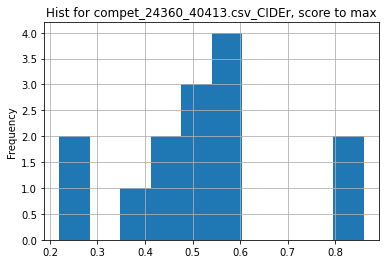

metric_column:  CIDEr , score_function:  max
Utility w/mean =  1.7078014184397163
Utility w/median =  1.702970297029703
___________________
24360_40414.csv
      CIDEr    Bleu-1    Bleu-2    Bleu-3    Bleu-4    METEOR   ROUGE-L
0  0.47 (1)  0.74 (4)  0.54 (3)  0.39 (3)  0.29 (3)  0.33 (1)  0.53 (3)
1  0.43 (2)  0.77 (1)  0.57 (1)  0.41 (1)  0.30 (1)  0.33 (3)  0.55 (1)
2  0.41 (3)  0.76 (2)  0.56 (2)  0.41 (2)  0.30 (2)  0.33 (2)  0.55 (2)


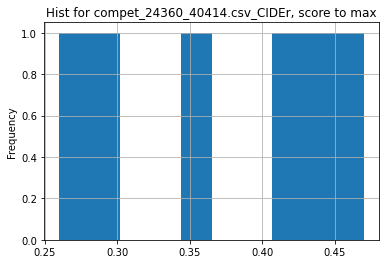

metric_column:  CIDEr , score_function:  max
Utility w/mean =  1.2702702702702704
Utility w/median =  1.2207792207792207
___________________
24360_40415.csv
      CIDEr    Bleu-1    Bleu-2    Bleu-3    Bleu-4    METEOR   ROUGE-L
0  0.94 (1)  0.85 (1)  0.70 (1)  0.56 (1)  0.42 (1)  0.28 (1)  0.56 (1)
1  0.87 (2)  0.83 (2)  0.69 (2)  0.54 (2)  0.41 (2)  0.27 (2)  0.55 (2)
2  0.81 (3)  0.83 (3)  0.68 (3)  0.54 (3)  0.41 (3)  0.26 (3)  0.54 (3)


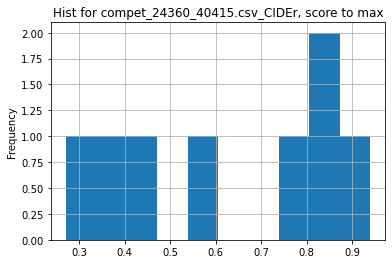

metric_column:  CIDEr , score_function:  max
Utility w/mean =  1.4920634920634916
Utility w/median =  1.4351145038167938
___________________
24360_40416.csv
___________________
24384_40450.csv
  Corpus Bleu-4     Bleu-1     Bleu-2     Bleu-3     Bleu-4
0     0.366 (1)  0.631 (8)  0.419 (2)  0.302 (1)  0.225 (1)
1     0.365 (2)  0.638 (2)  0.420 (1)  0.299 (2)  0.221 (2)
2     0.363 (3)  0.633 (5)  0.417 (4)  0.297 (3)  0.220 (4)


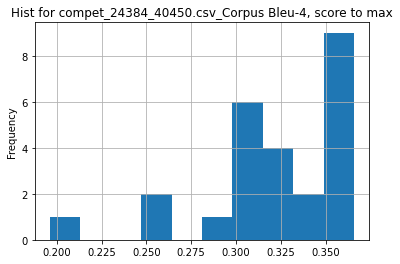

metric_column:  Corpus Bleu-4 , score_function:  max
Utility w/mean =  1.1394769613947697
Utility w/median =  1.1473354231974922
___________________
24414_40511.csv
___________________
24414_40512.csv
             EM       Bleu-2        chrTER       chr3-F
0  100.0000 (1)  91.2100 (1)  100.0000 (1)  99.2000 (1)
1    3.0200 (2)  16.3500 (3)   36.0200 (3)  42.8700 (3)
2    2.5600 (3)  19.7700 (2)   37.6500 (2)  44.4600 (2)
File cannot be opened: 24414_40512.csv
___________________
24420_40518.csv
          EM         F1
0  64.31 (1)  71.86 (1)
1  60.55 (2)  68.09 (2)
2  57.98 (3)  65.26 (4)


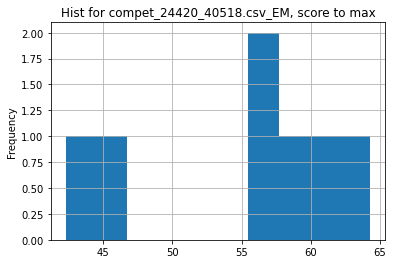

metric_column:  EM , score_function:  max
Utility w/mean =  1.1683623150791589
Utility w/median =  1.116880861410212
___________________
24433_40524.csv
  Mean Average Precision
0             0.4053 (1)
1             0.3933 (2)
2             0.3351 (3)


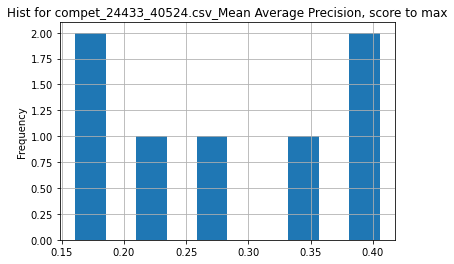

metric_column:  Mean Average Precision , score_function:  max
Utility w/mean =  1.4383269961977185
Utility w/median =  1.4506084466714388
___________________
24434_40525.csv
___________________
24447_40531.csv
    Pearson r         MAE        RMSE
0  0.7323 (1)  0.5294 (6)  0.6527 (5)
1  0.7218 (2)  0.4803 (4)  0.5956 (4)
2  0.7177 (3)  0.4077 (1)  0.5274 (1)


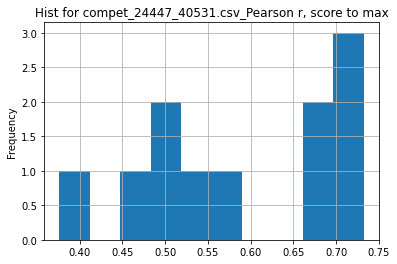

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2402309468822172
Utility w/median =  1.2556584362139915
___________________
24447_40532.csv
    Pearson r          MAE         RMSE
0  0.5621 (1)  0.5579 (11)   0.6760 (6)
1  0.5539 (2)  0.6126 (12)  0.7395 (12)
2  0.5443 (3)   0.4507 (1)   0.6162 (1)


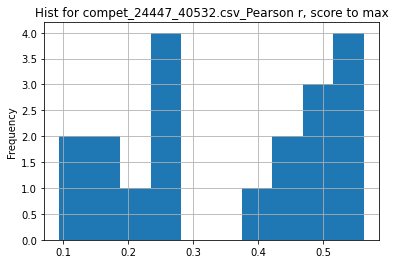

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.5914970345423656
Utility w/median =  1.4350268062292573
___________________
24447_40533.csv
    Pearson r         MAE        RMSE
0  0.5506 (1)  0.4987 (5)  0.6540 (5)
1  0.5373 (2)  0.6754 (8)  0.8309 (8)
2  0.5298 (3)  0.4518 (1)  0.5865 (1)


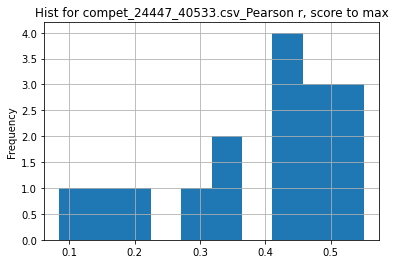

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.4155378806138024
Utility w/median =  1.2486676493933553
___________________
24447_40534.csv
    Pearson r          MAE         RMSE
0  0.9165 (1)  0.5825 (10)  0.6914 (10)
1  0.9082 (2)   0.3003 (3)   0.3920 (2)
2  0.9062 (3)   0.2808 (1)   0.3876 (1)


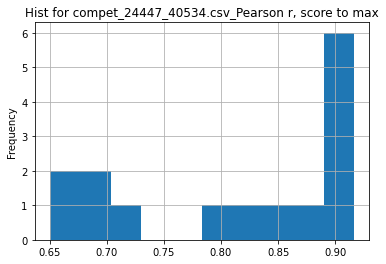

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1316398179169103
Utility w/median =  1.0834614020569808
___________________
24447_40535.csv
    Pearson r         MAE        RMSE
0  0.8331 (1)  0.5607 (6)  0.7159 (8)
1  0.8260 (2)  0.4272 (1)  0.5401 (1)
2  0.8240 (3)  0.4851 (2)  0.6035 (2)


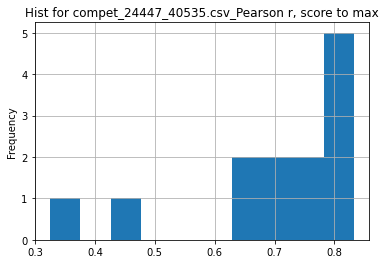

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.196229165976341
Utility w/median =  1.0900170090278687
___________________
24447_40536.csv
    Pearson r         MAE        RMSE
0  0.8299 (1)  0.4808 (7)  0.6290 (8)
1  0.8222 (2)  0.3722 (2)  0.4737 (1)
2  0.8139 (3)  0.3684 (1)  0.4748 (2)


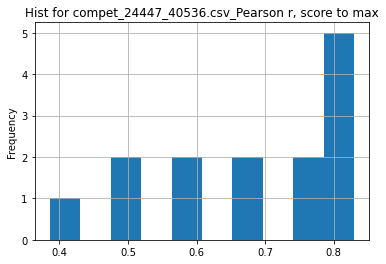

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2201079537101214
Utility w/median =  1.1333560942301126
___________________
24447_40537.csv
    Pearson r         MAE        RMSE
0  0.6982 (1)  0.4447 (3)  0.5428 (3)
1  0.6849 (2)  0.4358 (2)  0.5341 (1)
2  0.6818 (3)  0.4292 (1)  0.5394 (2)


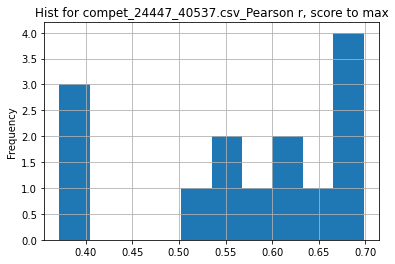

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.226880208856311
Utility w/median =  1.1650258635074255
___________________
24447_40538.csv
    Pearson r         MAE        RMSE
0  0.8159 (1)  0.5350 (6)  0.6868 (6)
1  0.8082 (2)  0.4018 (1)  0.5833 (1)
2  0.7960 (3)  0.4119 (2)  0.5842 (2)


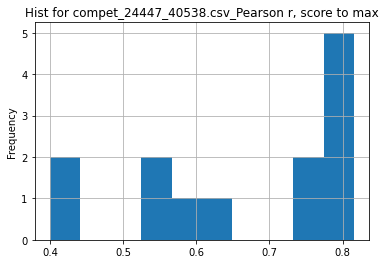

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2304185420630134
Utility w/median =  1.0785194976867152
___________________
24492_40601.csv
        MOTA       MOTP         Misses            FP       Switch  \
0  56.90 (1)  82.96 (1)  128761.00 (1)  52919.00 (1)  9172.00 (1)   
1       MOTA       MOTP         Misses            FP       Switch   
2  39.68 (1)  76.63 (1)   24194.00 (1)   9270.00 (1)  2493.00 (1)   

   Mostly Tracked  Mostly Lost  Partially Tracked  
0     8062.00 (1)  4048.00 (1)        5935.00 (1)  
1  Mostly Tracked  Mostly Lost  Partially Tracked  
2     1125.00 (1)   986.00 (1)        1528.00 (1)  
File cannot be opened: 24492_40601.csv
___________________
24492_40603.csv
        MOTA       MOTP         Misses             FP        Switch  \
0  58.27 (1)  82.90 (2)  224083.00 (1)  100868.00 (2)  16047.00 (2)   
1   0.13 (2)  86.26 (1)  815925.00 (2)     215.00 (1)     39.00 (1)   
2   0.13 (2)  86.26 (1)  815925.00 (2)     215.00 (1)     39.00 (1

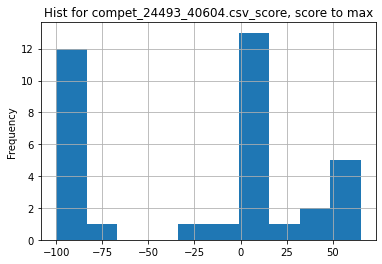

metric_column:  score , score_function:  max
File cannot be opened: 24493_40604.csv
___________________
24515_40633.csv
    Pearson r         MAE        RMSE
0  0.7583 (1)  0.0994 (1)  0.1325 (1)
1  0.7232 (2)  0.1071 (2)  0.1404 (2)
2  0.6492 (3)  0.1227 (3)  0.1541 (3)


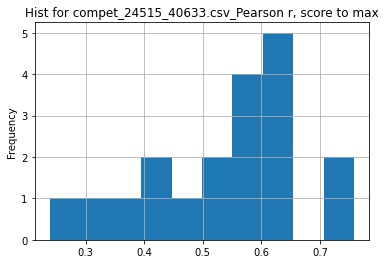

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.4109012211482905
Utility w/median =  1.3197006613296205
___________________
24515_40634.csv
    Pearson r         MAE         RMSE
0  0.6748 (1)  0.1250 (1)   0.1563 (1)
1  0.6641 (2)  0.1293 (3)   0.1596 (2)
2  0.6505 (3)  0.1353 (8)  0.1705 (10)


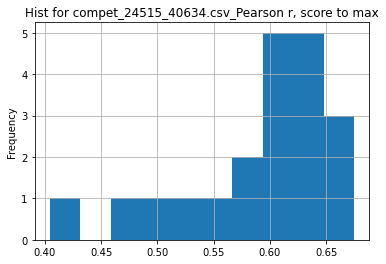

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1395087683747478
Utility w/median =  1.1033355134074558
___________________
24536_40646.csv
___________________
24536_40647.csv
___________________
24551_40663.csv
   AP50_tiny AP50_tiny1 AP50_tiny2 AP50_tiny3  AP25_tiny  AP75_tiny  mr50_tiny
0  72.33 (1)  58.87 (8)  76.06 (1)  80.23 (1)  87.28 (1)  14.87 (1)  74.23 (1)
1  71.53 (2)  59.21 (5)  75.22 (2)  79.68 (2)  85.27 (2)  14.84 (2)  74.69 (3)
2  71.36 (3)  59.91 (2)  74.70 (4)  78.63 (3)  84.74 (6)  14.38 (7)  74.51 (2)


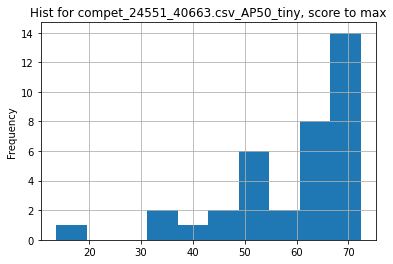

metric_column:  AP50_tiny , score_function:  max
Utility w/mean =  1.2212576156238124
Utility w/median =  1.1455495723788407
___________________
24584_40691.csv
        PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  23.98 (1)  0.6846 (1)             0.446 (4)          0.0 (2)   
1  23.84 (2)  0.6740 (3)             2.100 (8)          0.0 (2)   
2  23.82 (3)  0.6784 (2)             0.299 (3)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (3)  
1                            0.0 (2)  
2                            1.0 (3)  


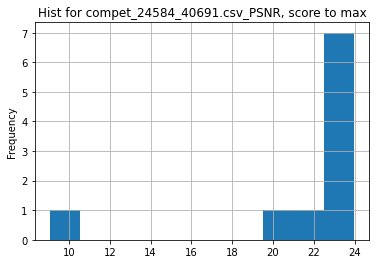

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.1163353661375168
Utility w/median =  1.0392199349945828
___________________
24584_40692.csv
___________________
24664_40790.csv
         mAP     Rank-1     Rank-5    Rank-10    Rank-20    Rank-50
0  82.39 (2)  89.66 (1)  93.63 (1)  94.69 (1)  96.02 (1)  98.41 (2)
1  81.20 (3)  89.39 (2)  92.57 (2)  94.69 (1)  96.02 (1)  97.61 (4)
2  77.27 (5)  86.74 (3)  91.25 (3)  93.37 (2)  96.02 (1)  97.88 (3)
File cannot be opened: 24664_40790.csv
___________________
24664_40791.csv
         mAP     Rank-1     Rank-5    Rank-10    Rank-20    Rank-50
0  76.56 (2)  84.25 (1)  89.58 (1)  92.35 (1)  94.40 (1)  96.97 (2)
1  72.39 (4)  83.85 (2)  89.52 (2)  91.83 (2)  94.33 (2)  96.44 (4)
2  79.05 (1)  83.26 (3)  88.79 (4)  91.36 (4)  93.94 (3)  94.59 (9)


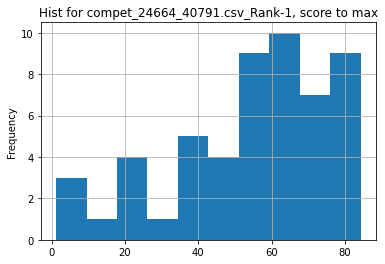

metric_column:  Rank-1 , score_function:  max
Utility w/mean =  1.5443477960122436
Utility w/median =  1.4200235968312827
___________________
24671_40798.csv
           PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0   17.6035 (1)   0.6198 (6)            0.8000 (5)          0.0 (2)   
1  17.0133 (11)  0.3874 (23)           10.4300 (1)          1.0 (1)   
2  13.4161 (24)  0.4982 (21)           0.0050 (11)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


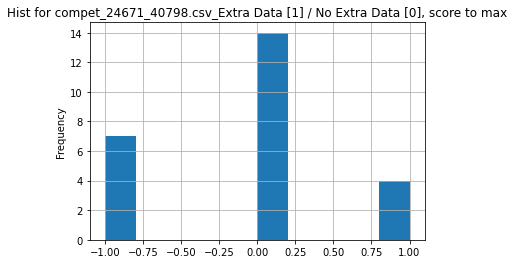

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24671_40798.csv
___________________
24671_40799.csv
___________________
24674_40803.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  16.5438 (5)  0.6105 (3)            0.0000 (6)          0.0 (2)   
1  17.8269 (4)  0.4453 (5)            0.4200 (3)          0.0 (2)   
2  10.1879 (8)  0.4270 (6)            0.0289 (5)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            0.0 (2)  


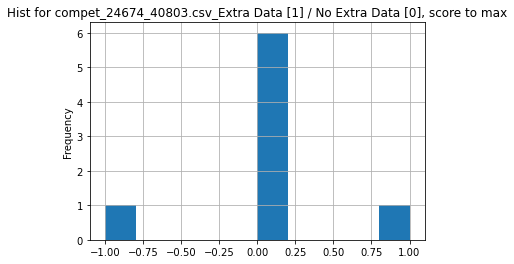

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24674_40803.csv
___________________
24674_40804.csv
___________________
24675_40805.csv
           PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  20.0529 (14)  0.6872 (14)            1.2300 (9)          0.0 (2)   
1   26.6520 (4)   0.8542 (8)           0.4606 (13)          0.0 (2)   
2   27.1693 (2)   0.8693 (4)            1.7635 (7)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


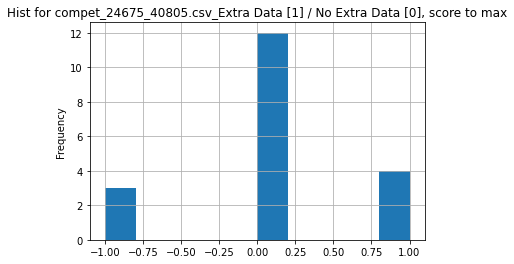

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24675_40805.csv
___________________
24675_40806.csv
___________________
24676_40807.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  27.6735 (1)  0.8698 (1)            0.3951 (2)          0.0 (1)   
1  26.1893 (4)  0.8610 (3)           -1.0000 (3)          0.0 (1)   
2  25.4529 (5)  0.8235 (5)           -1.0000 (3)          0.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


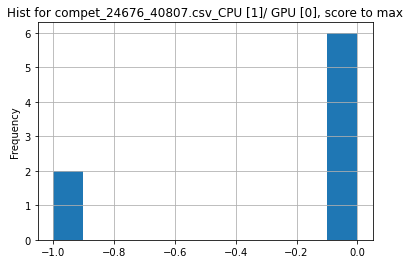

metric_column:  CPU [1]/ GPU [0] , score_function:  max
File cannot be opened: 24676_40807.csv
___________________
24676_40808.csv
___________________
24680_40813.csv
           PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  32.8704 (12)  0.9144 (8)            10.43 (20)         1.00 (1)   
1   33.0326 (2)  0.9151 (4)            10.43 (20)         0.00 (2)   
2   33.0238 (3)  0.9151 (5)            34.11 (10)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


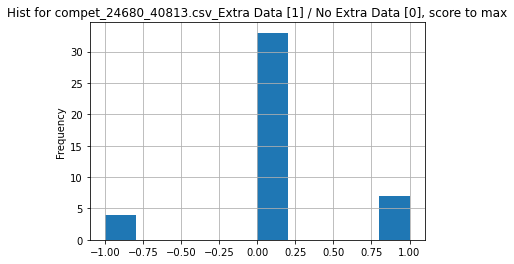

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24680_40813.csv
___________________
24680_40814.csv
___________________
24681_40815.csv
           PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0   32.2430 (7)   0.9143 (7)            500.00 (1)         0.00 (2)   
1  31.3044 (25)  0.9090 (22)             4.00 (16)         0.00 (2)   
2  31.6428 (17)  0.9124 (12)            12.40 (12)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


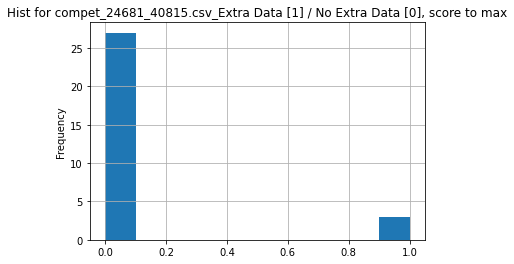

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24681_40815.csv
___________________
24681_40816.csv
___________________
24682_40817.csv
           PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  30.1973 (23)  0.8574 (24)            10.43 (27)         1.00 (1)   
1   30.6313 (8)  0.8616 (13)             67.60 (9)         0.00 (2)   
2  30.2003 (22)  0.8586 (21)             4.00 (33)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           1.00 (1)  
1                           1.00 (1)  
2                           1.00 (1)  


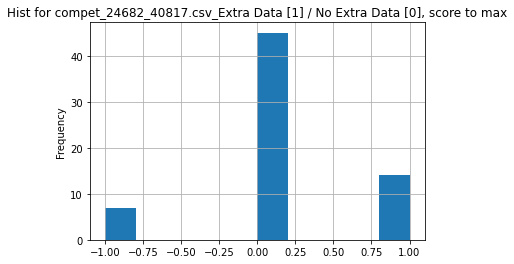

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24682_40817.csv
___________________
24682_40818.csv
___________________
24684_40821.csv
           PSNR         SSIM Runtime per image [s]      Parameters  \
0  28.9849 (21)  0.8190 (21)           0.0849 (16)  1289808.0 (32)   
1  28.9910 (20)  0.8192 (19)           0.0484 (10)   461947.0 (10)   
2  28.9766 (23)  0.8196 (14)           0.1685 (22)   558540.0 (15)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


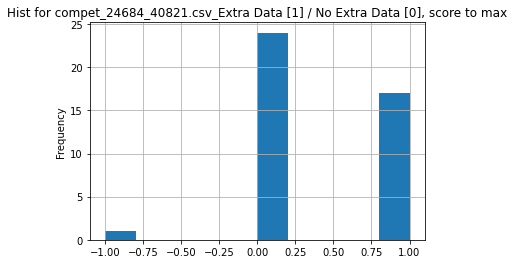

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24684_40821.csv
___________________
24684_40822.csv
           PSNR         SSIM Runtime per image [s]     Parameters  \
0  28.7128 (10)   0.8284 (8)           0.1640 (15)  558540.0 (11)   
1  28.6035 (18)  0.8251 (18)            0.0300 (3)        0.0 (2)   
2   28.7827 (3)   0.8291 (4)           2.6500 (21)  776968.0 (19)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


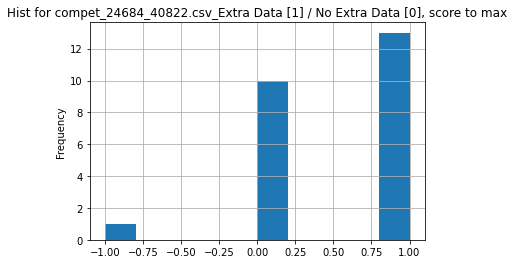

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
Utility w/mean =  2.0
Utility w/median =  1.0
___________________
24685_40823.csv
           PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0   21.9001 (1)   0.6122 (1)            6.0000 (1)          0.0 (2)   
1  20.9139 (11)  0.5743 (12)            0.0600 (7)          0.0 (2)   
2   21.4552 (4)   0.5975 (3)            0.0000 (9)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            0.0 (2)  


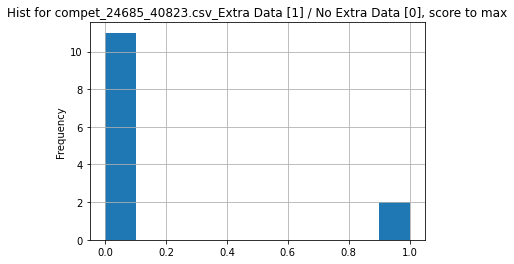

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24685_40823.csv
___________________
24685_40824.csv
___________________
24686_40825.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  20.9139 (7)  0.5743 (7)            0.0600 (4)          0.0 (2)   
1  21.8217 (1)  0.6153 (1)            3.0000 (1)          0.0 (2)   
2  21.2687 (4)  0.5928 (3)            0.0100 (5)          1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            0.0 (2)  


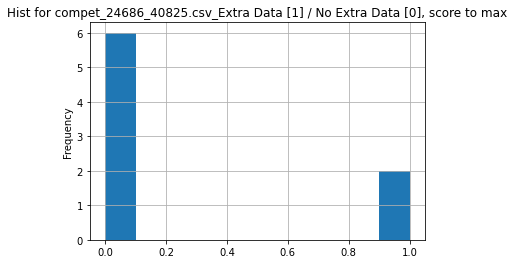

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24686_40825.csv
___________________
24686_40826.csv
___________________
24716_40861.csv
           PSNR         SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  23.4463 (15)  0.8412 (16)           10.4300 (1)           1.0 (1)   
1  23.6191 (13)  0.8650 (13)           10.4300 (1)           1.0 (1)   
2  23.5730 (14)  0.8647 (14)           10.4300 (1)           1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


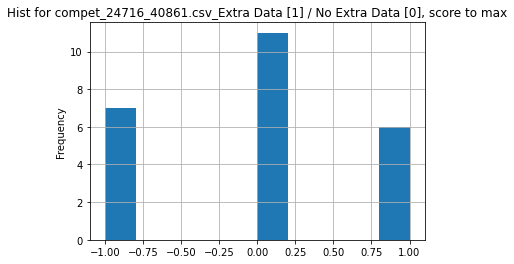

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24716_40861.csv
___________________
24716_40862.csv
___________________
24717_40863.csv
           PSNR         SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  23.6191 (10)   0.8650 (9)           10.4300 (1)           1.0 (1)   
1   23.7304 (9)  0.8452 (10)            0.4300 (4)           1.0 (1)   
2   24.1017 (6)   0.8657 (8)            0.8970 (2)           1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            0.0 (2)  


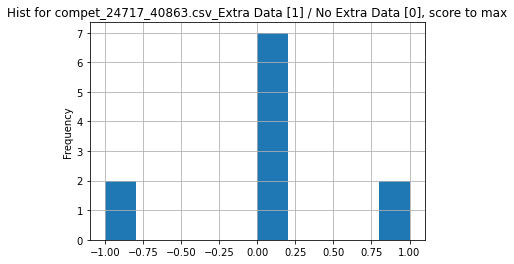

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24717_40863.csv
___________________
24717_40864.csv
___________________
24718_40865.csv
           PSNR         SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  21.2788 (13)  0.7741 (14)           10.4300 (2)           0.0 (2)   
1  20.7034 (19)  0.7649 (18)           10.4300 (2)           0.0 (2)   
2   22.0901 (2)   0.7818 (7)            1.3300 (5)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


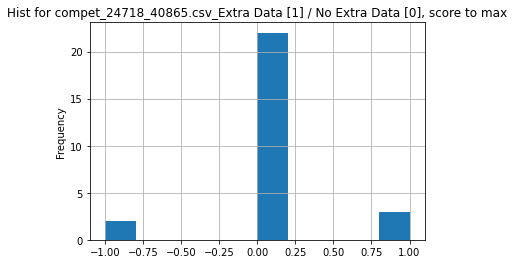

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 24718_40865.csv
___________________
24718_40866.csv
___________________
24719_40867.csv
         PSNR        SSIM Runtime per image [s] CPU [1] / GPU [0]  \
0  21.954 (3)  0.7788 (4)            0.0150 (7)           0.0 (2)   
1  22.247 (1)  0.7893 (1)            0.0100 (8)           1.0 (1)   
2  21.709 (4)  0.7868 (2)            0.1000 (3)           0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (1)  
1                            0.0 (1)  
2                            0.0 (1)  
File cannot be opened: 24719_40867.csv
___________________
24719_40868.csv
___________________
24762_40917.csv
___________________
24763_40918.csv
___________________
24773_40930.csv
         Loss AngLoss    TempLoss Runtime per image [s] CPU [1]/ GPU [0]  \
0  0.1875 (8)   - (-)  0.0389 (8)            0.0260 (6)          0.0 (2)   
1  0.0514 (1)   - (-)  0.0125 (1)            0.

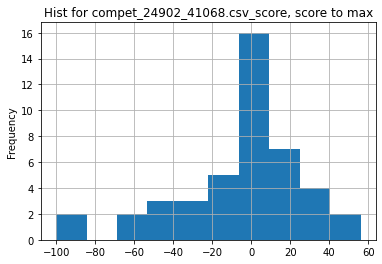

metric_column:  score , score_function:  max
File cannot be opened: 24902_41068.csv
___________________
24902_41069.csv
       score Computation time
0  75.72 (1)      812.49 (47)
1  66.21 (2)     1406.45 (50)
2  48.62 (3)     1797.60 (51)


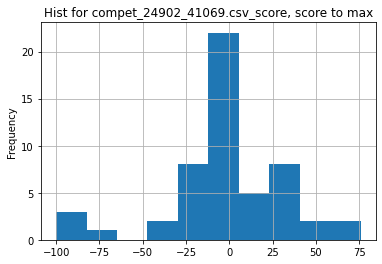

metric_column:  score , score_function:  max
File cannot be opened: 24902_41069.csv
___________________
24910_41080.csv
       mMOTA      mMOTP       MOTA       MOTP         Misses            FP  \
0  26.89 (1)  82.39 (1)  52.97 (2)  84.78 (1)  167148.00 (3)  27738.00 (2)   
1  23.12 (2)  75.96 (5)  43.14 (4)  79.70 (4)  191513.00 (5)  23658.00 (1)   
2  22.90 (3)  79.22 (3)  56.90 (1)  82.96 (3)  128761.00 (2)  52919.00 (3)   

         Switch Mostly Tracked  Mostly Lost Partially Tracked  
0  13366.00 (2)    4950.00 (4)  7481.00 (5)       5614.00 (5)  
1  36633.00 (4)    2664.00 (5)  6680.00 (4)       8701.00 (1)  
2   9172.00 (1)    8062.00 (2)  4048.00 (2)       5935.00 (4)  
File cannot be opened: 24910_41080.csv
___________________
24910_41081.csv
       mMOTA      mMOTP       MOTA       MOTP         Misses             FP  \
0  33.63 (1)  81.06 (2)  59.76 (1)  82.78 (3)  209339.00 (1)   76612.00 (2)   
1  31.64 (2)  82.38 (1)  56.85 (3)  84.76 (1)  292063.00 (3)   35401.00 (1)   

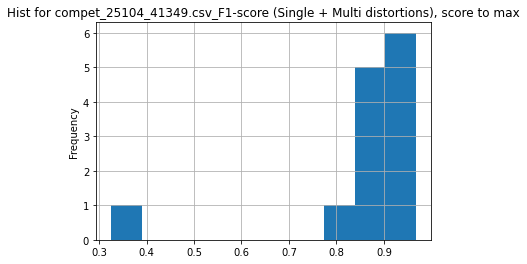

metric_column:  F1-score (Single + Multi distortions) , score_function:  max
Utility w/mean =  1.1237150263698936
Utility w/median =  1.0804469273743016
___________________
25104_41350.csv
___________________
25148_41406.csv
     Accuracy
0  0.9542 (1)
1  0.9341 (2)
2  0.9299 (3)


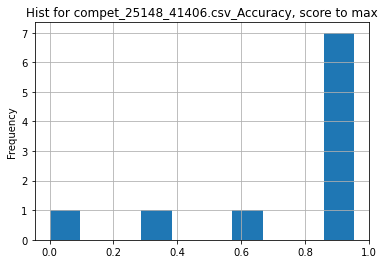

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.3011522465398513
Utility w/median =  1.0611064776202392
___________________
25148_41407.csv
     Accuracy
0  0.9511 (1)
1  0.9428 (2)
2  0.9336 (3)


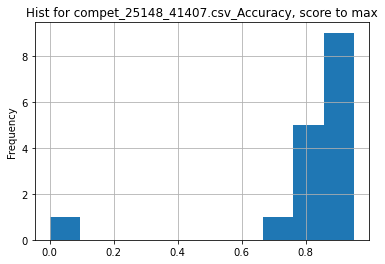

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1625096445459615
Utility w/median =  1.0759049773755656
___________________
25148_41408.csv
___________________
25174_41450.csv
      P (all) P1 (GIF w/ text) P2 (GIF only)
0  0.5752 (1)       0.5705 (1)    0.5783 (1)
1  0.5619 (2)       0.5479 (3)    0.5712 (3)
2  0.5614 (3)       0.5381 (4)    0.5768 (2)


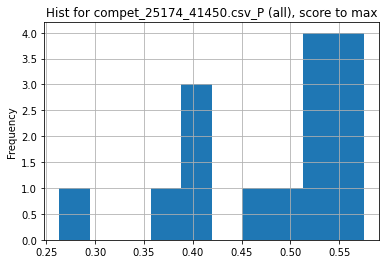

metric_column:  P (all) , score_function:  max
Utility w/mean =  1.2108793892272713
Utility w/median =  1.1084987473501637
___________________
25174_41451.csv
      P (all) P1 (GIF w/ text) P2 (GIF only)
0  0.6255 (1)       0.6169 (1)    0.6313 (1)
1  0.5824 (2)       0.5580 (2)    0.5986 (2)
2  0.5662 (3)       0.5282 (4)    0.5915 (3)


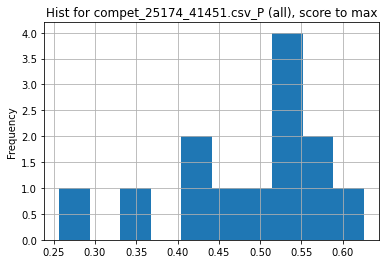

metric_column:  P (all) , score_function:  max
Utility w/mean =  1.2846580406654342
Utility w/median =  1.1702525724976613
___________________
25174_41452.csv
      P (all) P1 (GIF w/ text) P2 (GIF only)
0  0.6174 (1)       0.6044 (1)    0.6261 (1)
1  0.5824 (2)       0.5580 (2)    0.5986 (2)
2  0.5662 (3)       0.5282 (4)    0.5915 (3)


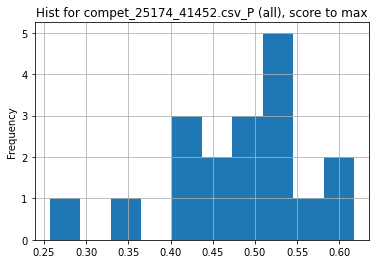

metric_column:  P (all) , score_function:  max
Utility w/mean =  1.2802045894387615
Utility w/median =  1.2471467528532472
___________________
25215_42419.csv
File cannot be opened: 25215_42419.csv
___________________
25224_41503.csv
      meanIoU    Accuracy     Clutter    Building        Road        Tree  \
0  0.7268 (1)  0.8866 (1)  0.7239 (2)  0.9045 (3)  0.8329 (3)  0.8220 (1)   
1  0.7238 (2)  0.8859 (2)  0.7211 (3)  0.9056 (2)  0.8363 (2)  0.8215 (2)   
2  0.7170 (3)  0.8858 (3)  0.7266 (1)  0.9066 (1)  0.8323 (5)  0.8188 (4)   

   Vegetation  Moving Car  Static Car       Human  
0  0.6693 (1)  0.7820 (2)  0.7640 (1)  0.3160 (6)  
1  0.6652 (3)  0.7768 (3)  0.7470 (2)  0.3169 (4)  
2  0.6642 (4)  0.7869 (1)  0.6836 (6)  0.3167 (5)  


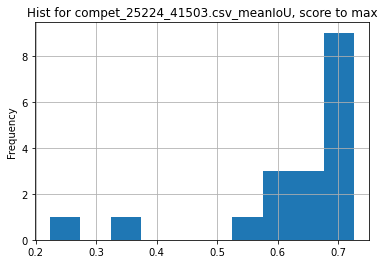

metric_column:  meanIoU , score_function:  max
Utility w/mean =  1.1573965125228913
Utility w/median =  1.0642846683262557
___________________
25224_41504.csv
___________________
25228_41508.csv
        BCELoss     ExecutionTime
0  0.275199 (1)   2799.047902 (6)
1  0.375520 (2)  4014.442332 (14)
2  0.417945 (3)  6998.520096 (22)


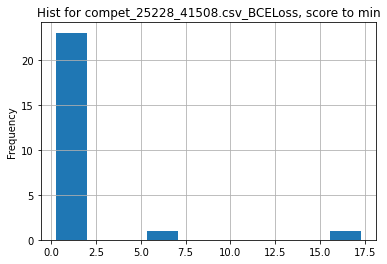

metric_column:  BCELoss , score_function:  min
Utility w/mean =  5.194814370691753
Utility w/median =  1.9779032627298792
___________________
25228_41509.csv
        BCELoss     ExecutionTime
0  0.267426 (1)   7690.136991 (2)
1  0.369907 (2)  11367.944871 (8)
2  0.406031 (3)  11012.356895 (6)


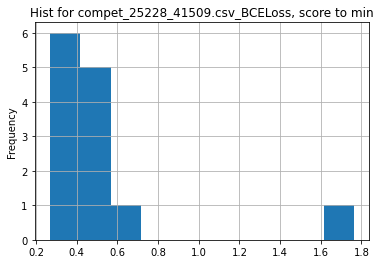

metric_column:  BCELoss , score_function:  min
Utility w/mean =  2.026837618343306
Utility w/median =  1.5836867021157255
___________________
25276_41568.csv
  Prediction score (MSLE)
0            0.124948 (1)
1            0.126781 (2)
2            0.143755 (3)


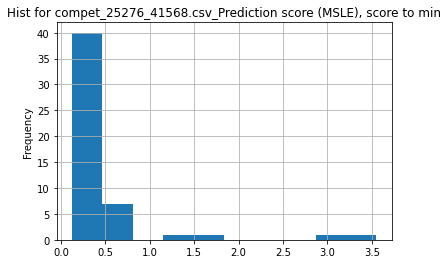

metric_column:  Prediction score (MSLE) , score_function:  min
Utility w/mean =  3.4621257345016305
Utility w/median =  1.7223164836572014
___________________
25276_41569.csv
  Prediction score (MSLE)
0            0.120551 (1)
1            0.121094 (2)
2            0.136239 (3)


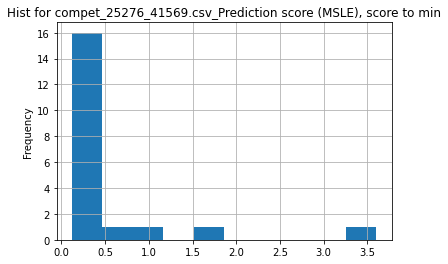

metric_column:  Prediction score (MSLE) , score_function:  min
Utility w/mean =  4.015088634685734
Utility w/median =  1.6077427810636162
___________________
25301_41577.csv
  Prediction score  Duration
0        41.79 (1)  0.00 (1)
1        38.80 (2)  0.00 (1)
2        34.85 (3)  0.00 (1)


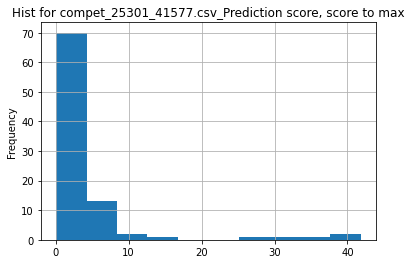

metric_column:  Prediction score , score_function:  max
Utility w/mean =  8.671706115747712
Utility w/median =  13.792079207920793
___________________
25301_41578.csv
  Prediction score  Duration
0        13.93 (1)  0.00 (1)
1         9.99 (2)  0.00 (1)
2         9.17 (3)  0.00 (1)


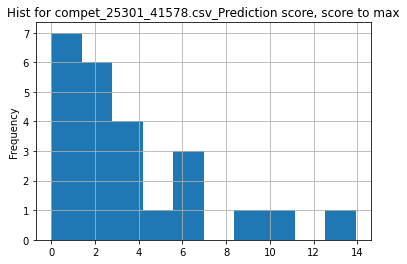

metric_column:  Prediction score , score_function:  max
Utility w/mean =  3.7350016757904134
Utility w/median =  5.296577946768061
___________________
25312_41603.csv
  Unnamed: 2
0   0.50 (1)
1   0.50 (2)
2   0.50 (2)
File cannot be opened: 25312_41603.csv
___________________
25312_41604.csv
___________________
25334_41624.csv
___________________
25334_41625.csv
___________________
25334_41626.csv
___________________
25340_41637.csv
___________________
25340_41638.csv
___________________
25340_41639.csv
___________________
25340_41640.csv
___________________
25340_41641.csv
___________________
25340_41642.csv
___________________
25363_41679.csv
      correct
0  9116.0 (1)
1  9074.0 (2)
2  8786.0 (3)


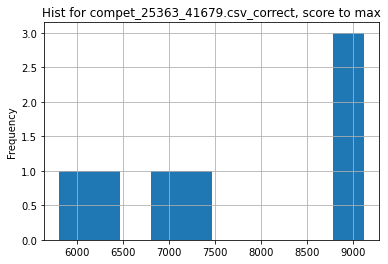

metric_column:  correct , score_function:  max
Utility w/mean =  1.194220908036082
Utility w/median =  1.254783207157605
___________________
25377_41707.csv
          MCC      F1 BAD       F1 OK
0  0.5974 (1)  0.6619 (1)  0.9346 (2)
1  0.5828 (2)  0.6441 (2)  0.9378 (1)
2  0.4998 (3)  0.5814 (3)  0.9160 (7)
File cannot be opened: 25377_41707.csv
___________________
25377_41708.csv
          MCC      F1 BAD       F1 OK
0  0.6104 (1)  0.7234 (1)  0.8869 (1)
1  0.5872 (2)  0.7137 (2)  0.8662 (6)
2  0.5872 (2)  0.7137 (2)  0.8662 (6)
File cannot be opened: 25377_41708.csv
___________________
25389_41716.csv
      ROC AUC
0  0.9954 (1)
1  0.9665 (2)
2  0.9623 (3)


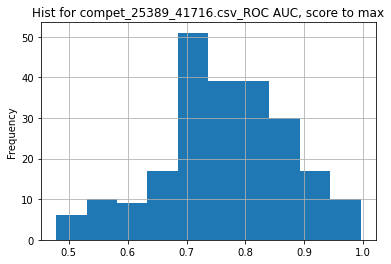

metric_column:  ROC AUC , score_function:  max
Utility w/mean =  1.2986182477357984
Utility w/median =  1.2876269322812237
___________________
25389_41717.csv
      ROC AUC
0  0.9108 (1)
1  0.9085 (2)
2  0.9029 (3)


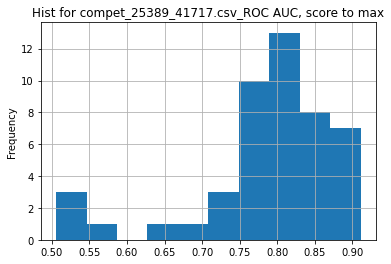

metric_column:  ROC AUC , score_function:  max
Utility w/mean =  1.160563044256233
Utility w/median =  1.1478260869565218
___________________
25426_41759.csv
       score Computation time
0  30.48 (1)       13.85 (11)
1  18.26 (2)      409.58 (25)
2  14.68 (3)      252.32 (19)


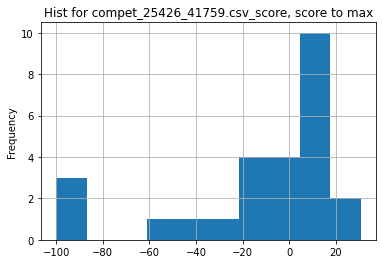

metric_column:  score , score_function:  max
Utility w/mean =  -2.45016077170418
Utility w/median =  124.40816326530613
___________________
25426_41760.csv
       score Computation time
0  61.05 (1)      515.76 (41)
1  52.42 (2)      556.57 (43)
2  45.00 (3)      929.49 (47)


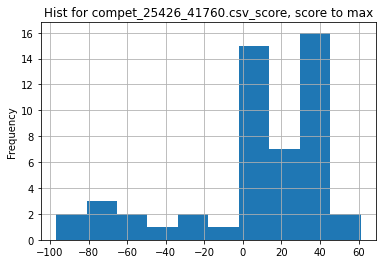

metric_column:  score , score_function:  max
Utility w/mean =  11.101583113456472
Utility w/median =  5.364674868189806
___________________
25426_41761.csv
       score Computation time
0  59.26 (1)      483.22 (41)
1  46.89 (2)      437.85 (40)
2  44.62 (3)      778.02 (44)


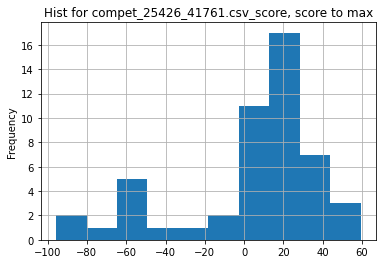

metric_column:  score , score_function:  max
Utility w/mean =  16.096262494567586
Utility w/median =  4.21479374110953
___________________
25426_41762.csv
       score Computation time
0  61.06 (1)      358.82 (19)
1  52.97 (2)      416.27 (25)
2  52.42 (3)      397.44 (22)


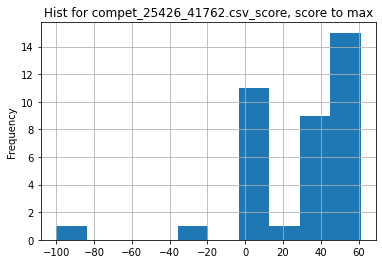

metric_column:  score , score_function:  max
Utility w/mean =  2.27456131751789
Utility w/median =  1.5305176087228975
___________________
25427_41763.csv
       Score Computation time
0  31.57 (1)      889.79 (11)
1   0.94 (2)         2.18 (7)
2   0.25 (3)       197.72 (9)


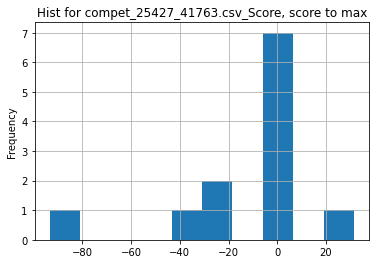

metric_column:  Score , score_function:  max
File cannot be opened: 25427_41763.csv
___________________
25427_41764.csv
       Score Computation time
0  34.74 (1)      686.65 (32)
1  33.38 (2)      660.96 (30)
2  30.82 (3)      388.64 (24)


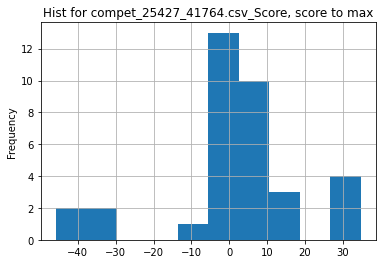

metric_column:  Score , score_function:  max
Utility w/mean =  19.423322683706083
Utility w/median =  248.14285714285714
___________________
25427_41765.csv
       Score Computation time
0  25.53 (1)      474.35 (27)
1  24.66 (2)      414.09 (26)
2  24.63 (3)      518.29 (29)


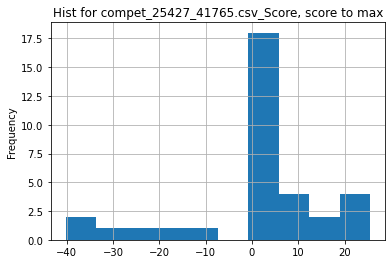

metric_column:  Score , score_function:  max
File cannot be opened: 25427_41765.csv
___________________
25427_41766.csv
       Score Computation time
0  33.49 (1)       574.03 (9)
1  33.38 (2)      637.85 (10)
2  31.24 (3)     1121.45 (13)


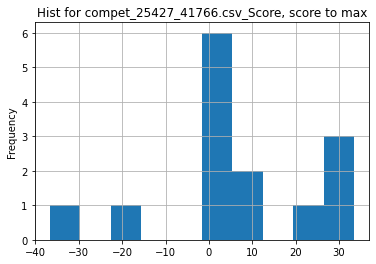

metric_column:  Score , score_function:  max
Utility w/mean =  6.059188420780563
Utility w/median =  19.58479532163743
___________________
25449_41814.csv
        score
0  0.7728 (1)
1  0.7701 (2)
2  0.7694 (3)


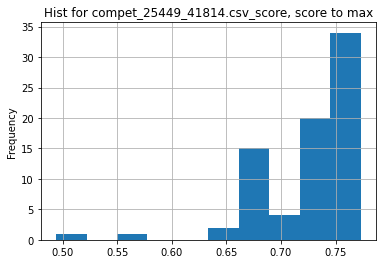

metric_column:  score , score_function:  max
Utility w/mean =  1.065335629706282
Utility w/median =  1.0453131340457191
___________________
25449_41815.csv
        score
0  0.7729 (1)
1  0.7706 (2)
2  0.7698 (3)


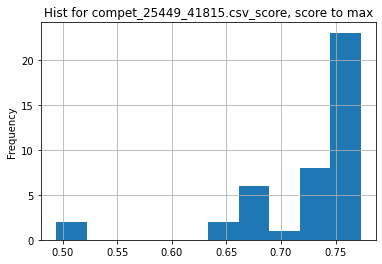

metric_column:  score , score_function:  max
Utility w/mean =  1.065523081770915
Utility w/median =  1.0325985303941216
___________________
25449_41816.csv
        score
0  0.6800 (1)
1  0.6763 (2)
2  0.6736 (3)


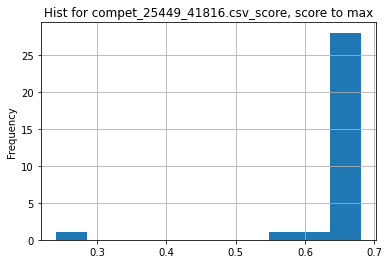

metric_column:  score , score_function:  max
Utility w/mean =  1.0633521824446004
Utility w/median =  1.0397553516819573
___________________
25449_41817.csv
        score
0  0.6803 (1)
1  0.6764 (2)
2  0.6738 (3)


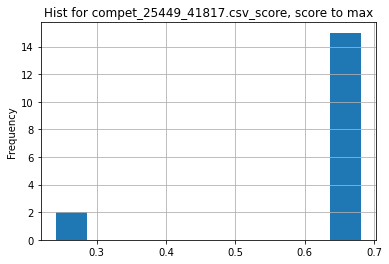

metric_column:  score , score_function:  max
Utility w/mean =  1.1137101200851285
Utility w/median =  1.037200792803781
___________________
25449_41818.csv
        score
0  0.9600 (1)
1  0.9200 (2)
2  0.9200 (2)


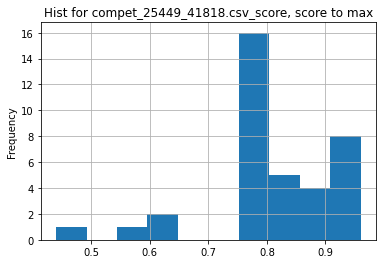

metric_column:  score , score_function:  max
Utility w/mean =  1.1935483870967731
Utility w/median =  1.2
___________________
25449_41819.csv
        score
0  0.8000 (1)
1  0.8000 (1)
2  0.8000 (1)


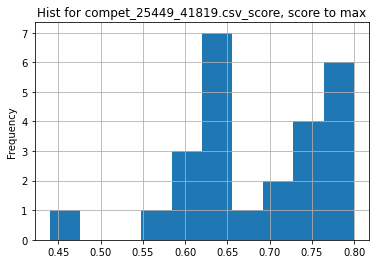

metric_column:  score , score_function:  max
Utility w/mean =  1.1600928074245938
Utility w/median =  1.1764705882352942
___________________
25449_41820.csv
        score
0  0.7296 (1)
1  0.7290 (2)
2  0.7267 (3)


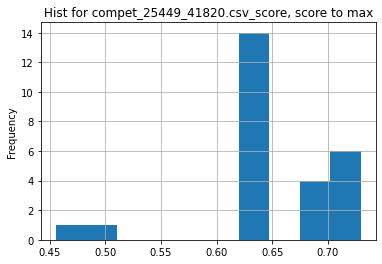

metric_column:  score , score_function:  max
Utility w/mean =  1.115235603633264
Utility w/median =  1.1420521249119513
___________________
25449_41821.csv
        score
0  0.7474 (1)
1  0.7396 (2)
2  0.7396 (2)


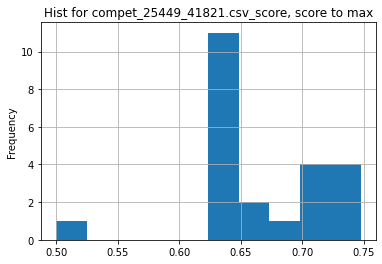

metric_column:  score , score_function:  max
Utility w/mean =  1.1171680541745468
Utility w/median =  1.154642360574695
___________________
25516_41901.csv
    Rouge1-F1 Rouge1-Recall   Rouge2-F1 Rouge2-Recall   RougeL-F1  \
0  0.4600 (1)    0.5013 (3)  0.2070 (2)    0.2223 (3)  0.2876 (2)   
1  0.4596 (2)    0.4810 (5)  0.2146 (1)    0.2237 (2)  0.2977 (1)   
2  0.4594 (3)    0.4911 (4)  0.1902 (4)    0.2026 (4)  0.2744 (4)   

  RougeL-Recall  
0    0.3104 (2)  
1    0.3105 (1)  
2    0.2923 (5)  


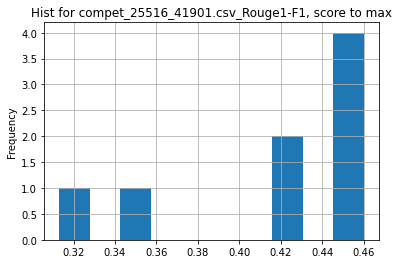

metric_column:  Rouge1-F1 , score_function:  max
Utility w/mean =  1.1018293960897032
Utility w/median =  1.0535959688502061
___________________
25567_41994.csv
___________________
25567_41995.csv
___________________
25567_41996.csv
___________________
25623_42115.csv
___________________
25623_42116.csv
___________________
25623_42117.csv
___________________
25680_42291.csv
File cannot be opened: 25680_42291.csv
___________________
25680_42292.csv
File cannot be opened: 25680_42292.csv
___________________
25680_42293.csv
File cannot be opened: 25680_42293.csv
___________________
25680_42294.csv
File cannot be opened: 25680_42294.csv
___________________
25680_42295.csv
File cannot be opened: 25680_42295.csv
___________________
25748_42413.csv
      Average  CIFAR10-IC  LabelMe-IC        PDIS  Gimpel-POS CrowthTruth-FD  \
0  0.7607 (1)  0.6251 (2)  0.8174 (1)  0.8931 (3)  0.7949 (1)          - (-)   
1  0.6155 (2)  0.6372 (1)  0.8044 (2)  0.8976 (2)  0.7384 (2)          - (-)   
2  0.180

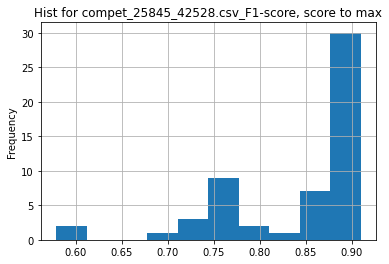

metric_column:  F1-score , score_function:  max
Utility w/mean =  1.081721569348195
Utility w/median =  1.0288428910756702
___________________
25848_42531.csv
File cannot be opened: 25848_42531.csv
___________________
25923_42610.csv
File cannot be opened: 25923_42610.csv
___________________
25925_42611.csv
File cannot be opened: 25925_42611.csv
___________________
25926_42612.csv
File cannot be opened: 25926_42612.csv
___________________
26027_42777.csv
  Subtask A F1 Macro average Subtask B F1 Macro average
0                    0.0 (1)                    0.0 (1)
1                    0.0 (1)                    0.0 (1)
2                    0.0 (1)                    0.0 (1)


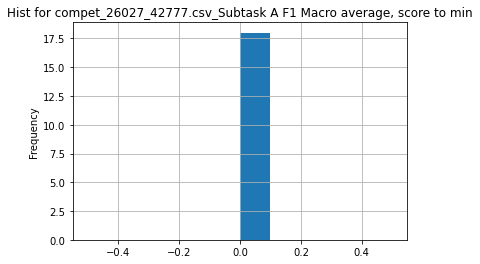

metric_column:  Subtask A F1 Macro average , score_function:  min
File cannot be opened: 26027_42777.csv
___________________
26027_42778.csv
  Subtask A F1 Macro average Subtask B F1 Macro average
0                    0.0 (1)                    0.0 (1)
1                    0.0 (1)                    0.0 (1)
2                    0.0 (1)                    0.0 (1)


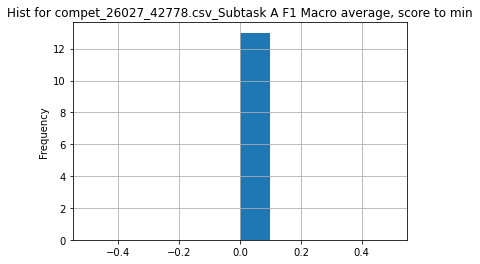

metric_column:  Subtask A F1 Macro average , score_function:  min
File cannot be opened: 26027_42778.csv
___________________
26027_42779.csv
  Subtask A F1 Macro average Subtask B F1 Macro average
0                    0.0 (1)                    0.0 (1)
1                    0.0 (1)                    0.0 (1)
2                    0.0 (1)                    0.0 (1)


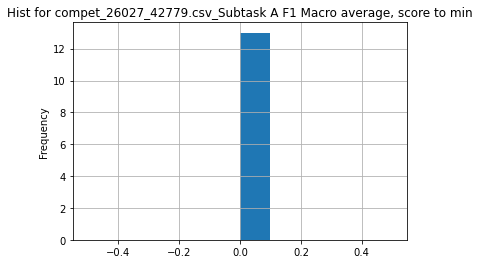

metric_column:  Subtask A F1 Macro average , score_function:  min
File cannot be opened: 26027_42779.csv
___________________
26027_42780.csv
  Subtask A F1 Macro average Subtask B F1 Macro average
0                    0.0 (1)                    0.0 (1)
1                    0.0 (1)                    0.0 (1)
2                    0.0 (1)                    0.0 (1)


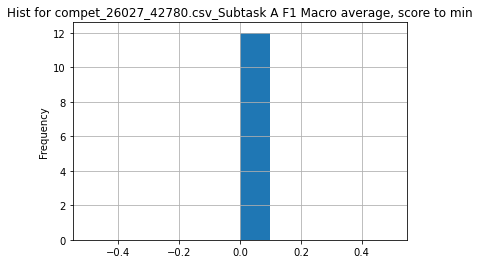

metric_column:  Subtask A F1 Macro average , score_function:  min
File cannot be opened: 26027_42780.csv
___________________
26027_42781.csv
  Subtask A F1 Macro average Subtask B F1 Macro average
0                    0.0 (1)                    0.0 (1)
1                    0.0 (1)                    0.0 (1)
2                    0.0 (1)                    0.0 (1)


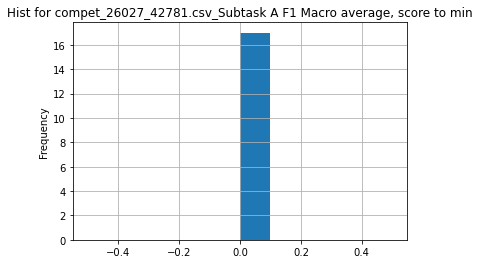

metric_column:  Subtask A F1 Macro average , score_function:  min
File cannot be opened: 26027_42781.csv
___________________
26027_42782.csv
  Subtask A F1 Macro average Subtask B F1 Macro average
0                    0.0 (1)                    0.0 (1)
1                    0.0 (1)                    0.0 (1)
2                    0.0 (1)                    0.0 (1)


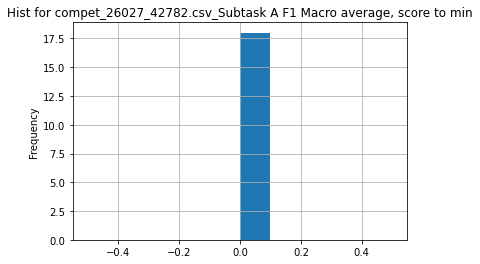

metric_column:  Subtask A F1 Macro average , score_function:  min
File cannot be opened: 26027_42782.csv
___________________
26085_42929.csv
    correct
0  56.7 (1)
1  54.3 (2)
2  52.8 (3)


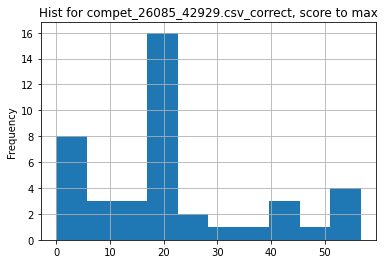

metric_column:  correct , score_function:  max
Utility w/mean =  2.64835409252669
Utility w/median =  3.098360655737705
___________________
26085_42930.csv
    correct
0  66.7 (1)
1  63.0 (2)
2  54.1 (3)


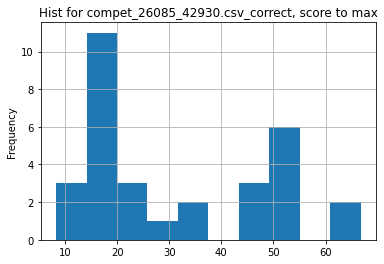

metric_column:  correct , score_function:  max
Utility w/mean =  2.1255139802631575
Utility w/median =  3.2696078431372553
___________________
26096_42939.csv
File cannot be opened: 26096_42939.csv
___________________
2611_5571.csv
___________________
2611_5581.csv
___________________
26120_42984.csv
          DCF         EER
0  0.1772 (1)  3.7270 (1)
1  0.1958 (2)  3.8080 (2)
2  0.2028 (3)  3.8200 (3)


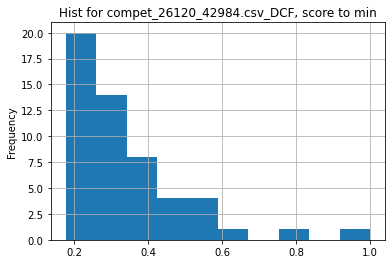

metric_column:  DCF , score_function:  min
Utility w/mean =  1.8986647642574213
Utility w/median =  1.5801354401805872
___________________
26120_42985.csv
          DCF         EER
0  0.1670 (1)  3.1870 (1)
1  0.1690 (2)  3.1990 (2)
2  0.1772 (3)  3.7270 (6)


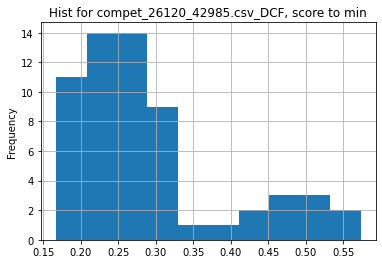

metric_column:  DCF , score_function:  min
Utility w/mean =  1.7377844311377242
Utility w/median =  1.5589820359281434
___________________
26138_43000.csv
File cannot be opened: 26138_43000.csv
___________________
26152_43037.csv
          F1  Precision     Recall
0  0.886 (1)  0.889 (4)  0.883 (1)
1  0.877 (2)  0.948 (1)  0.816 (5)
2  0.870 (3)  0.915 (3)  0.829 (3)
File cannot be opened: 26152_43037.csv
___________________
26152_43038.csv
          F1  Precision     Recall
0  0.822 (1)  0.902 (4)  0.756 (1)
1  0.767 (2)  0.880 (5)  0.680 (2)
2  0.736 (3)  0.913 (2)  0.616 (4)
File cannot be opened: 26152_43038.csv
___________________
26152_43039.csv
___________________
26153_43041.csv
___________________
26153_43042.csv
  Accuracy_task1
0     0.9511 (1)
1     0.9304 (2)
2     0.9047 (3)
File cannot be opened: 26153_43042.csv
___________________
26153_43043.csv
  Accuracy_task2
0     0.9529 (1)
1     0.9489 (2)
2     0.9341 (3)


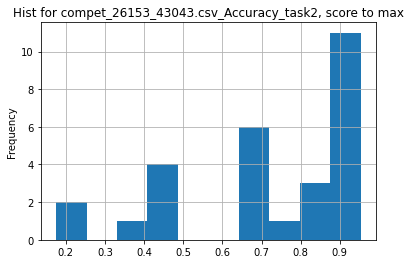

metric_column:  Accuracy_task2 , score_function:  max
Utility w/mean =  1.328354716492664
Utility w/median =  1.199748190116462
___________________
26183_43073.csv
     vpq_all  vpq_thing  vpq_stuff
0  55.83 (1)  43.49 (2)  63.69 (1)
1  55.92 (2)  38.64 (1)  66.91 (5)
2  56.44 (3)  44.42 (3)  64.09 (2)


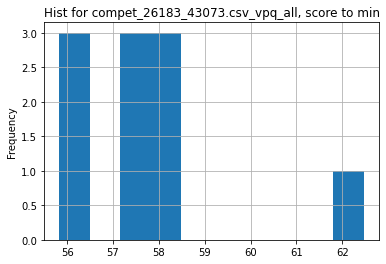

metric_column:  vpq_all , score_function:  min
Utility w/mean =  1.0355185384202044
Utility w/median =  1.031703385276733
___________________
26210_43097.csv
  TPR@FPR=5E-3 TPR@FPR=10E-4 TPR@FPR=10E-3
0  1.00000 (1)   1.00000 (1)   1.00000 (1)
1  1.00000 (1)   0.99991 (2)   1.00000 (1)
2  1.00000 (1)   0.99918 (3)   1.00000 (1)


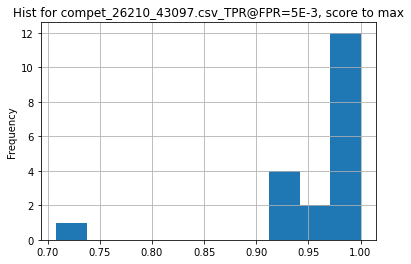

metric_column:  TPR@FPR=5E-3 , score_function:  max
Utility w/mean =  1.0377239981867137
Utility w/median =  1.013335495115723
___________________
26214_43104.csv
          DCF         EER
0  0.1737 (1)  3.5800 (1)
1  0.1942 (2)  3.7980 (2)
2  0.2042 (3)  3.8820 (3)


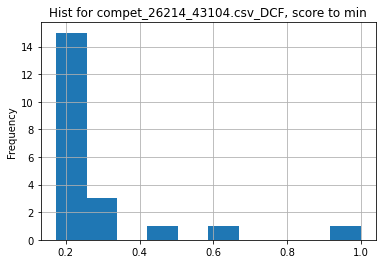

metric_column:  DCF , score_function:  min
Utility w/mean =  1.7331194999588782
Utility w/median =  1.328727691421992
___________________
26214_43105.csv
          DCF         EER
0  0.1667 (1)  3.1040 (1)
1  0.1847 (2)  3.6490 (3)
2  0.1942 (3)  4.0350 (8)


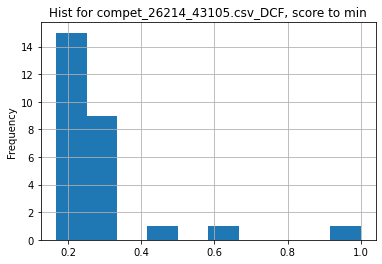

metric_column:  DCF , score_function:  min
Utility w/mean =  1.7234108733808793
Utility w/median =  1.384523095380924
___________________
26215_43106.csv
          DCF          EER
0  0.3447 (1)   7.2050 (1)
1  0.5976 (2)  12.4150 (2)
2  0.7514 (3)  14.7100 (3)


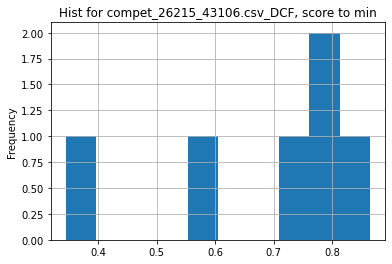

metric_column:  DCF , score_function:  min
Utility w/mean =  1.985156174451214
Utility w/median =  2.1946620249492312
___________________
26215_43107.csv
          DCF          EER
0  0.3447 (1)   7.2050 (1)
1  0.5976 (2)  12.4150 (2)
2  0.7514 (3)  14.7100 (3)


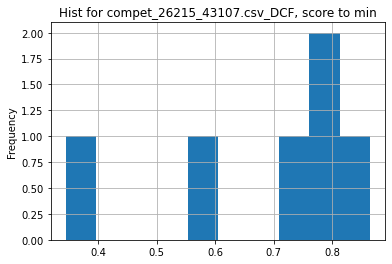

metric_column:  DCF , score_function:  min
Utility w/mean =  1.985156174451214
Utility w/median =  2.1946620249492312
___________________
26282_43200.csv
     F1-score
0  0.9770 (1)
1  0.9507 (2)
2  0.9386 (3)


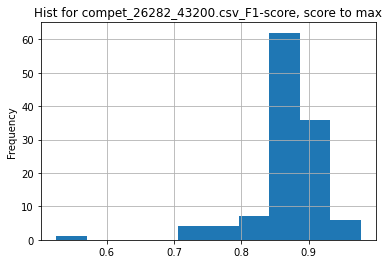

metric_column:  F1-score , score_function:  max
Utility w/mean =  1.1216090555294067
Utility w/median =  1.1136441354154794
___________________
26282_43201.csv
     F1-score
0  0.9581 (1)
1  0.9099 (2)
2  0.8895 (3)


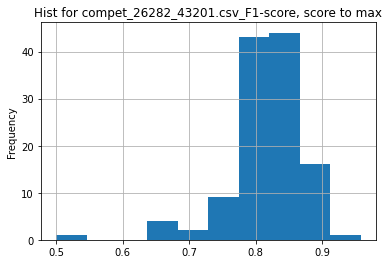

metric_column:  F1-score , score_function:  max
Utility w/mean =  1.1747936202367122
Utility w/median =  1.1663521821169882
___________________
26284_43202.csv
       correct
0  1.00000 (1)
1  1.00000 (1)
2  1.00000 (1)


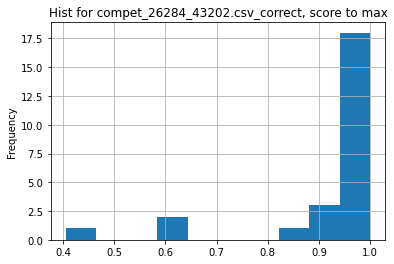

metric_column:  correct , score_function:  max
Utility w/mean =  1.0920154017852268
Utility w/median =  1.0278548668927947
___________________
26357_43280.csv
          DER          JER
0  6.2308 (1)  21.5206 (3)
1  8.1243 (2)  18.3487 (1)
2  9.7879 (3)  20.6747 (2)


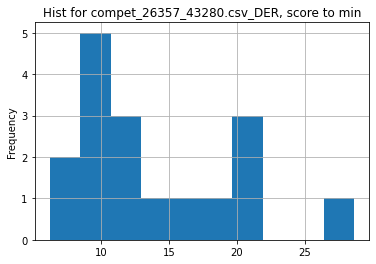

metric_column:  DER , score_function:  min
Utility w/mean =  2.289755068747663
Utility w/median =  1.9384348719265583
___________________
26357_43281.csv
          DER          JER
0  6.2308 (1)  21.5206 (9)
1  7.8009 (2)  18.6480 (2)
2  8.1243 (3)  18.3487 (1)


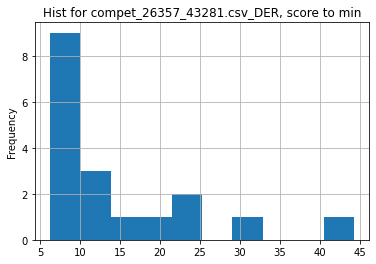

metric_column:  DER , score_function:  min
Utility w/mean =  2.3500718652143826
Utility w/median =  1.6247432111446363
___________________
26369_43297.csv
        PQ4D        mAQ       mIoU
0  0.637 (1)  0.676 (1)  0.600 (4)
1  0.631 (2)  0.657 (3)  0.606 (3)
2  0.623 (3)  0.658 (2)  0.589 (5)


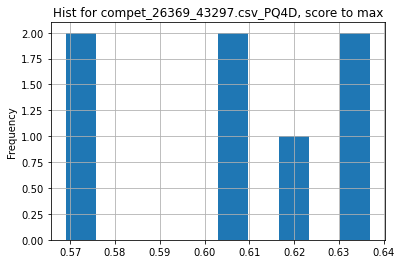

metric_column:  PQ4D , score_function:  max
Utility w/mean =  1.0499175888862728
Utility w/median =  1.0459770114942528
___________________
26537_43674.csv
          f1     recall       prec        acc
0  0.808 (1)  0.803 (1)  0.818 (1)  0.802 (1)
1  0.790 (2)  0.788 (2)  0.792 (2)  0.791 (2)
2  0.777 (3)  0.772 (3)  0.783 (3)  0.773 (3)


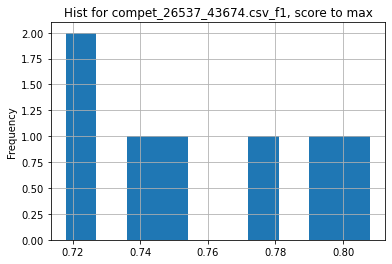

metric_column:  f1 , score_function:  max
Utility w/mean =  1.0669684965100925
Utility w/median =  1.0773333333333335
___________________
26537_43675.csv
          f1     recall       prec        acc
0  0.965 (1)  0.958 (1)  0.973 (1)  0.972 (1)
1  0.944 (2)  0.946 (2)  0.942 (3)  0.954 (2)
2  0.927 (3)  0.911 (3)  0.950 (2)  0.944 (3)


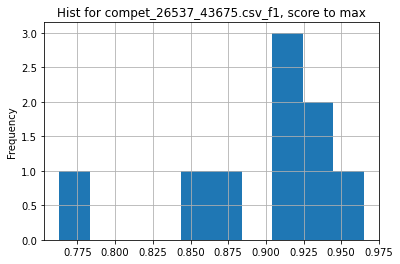

metric_column:  f1 , score_function:  max
Utility w/mean =  1.0766084046113797
Utility w/median =  1.0592755214050493
___________________
26537_43676.csv
___________________
26537_43677.csv
___________________
26537_43678.csv
___________________
26537_43679.csv
          f1     recall       prec        acc
0  0.968 (1)  0.973 (1)  0.965 (4)  0.000 (1)
1  0.966 (2)  0.969 (2)  0.964 (5)  0.000 (1)
2  0.962 (3)  0.968 (3)  0.957 (6)  0.000 (1)


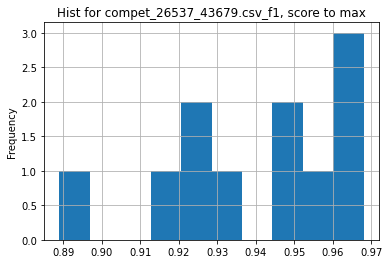

metric_column:  f1 , score_function:  max
Utility w/mean =  1.0304848543501406
Utility w/median =  1.0243386243386243
___________________
26537_43680.csv
___________________
26537_43681.csv
___________________
26537_43682.csv
          f1     recall       prec        acc
0  0.715 (1)  0.818 (1)  0.635 (4)  0.000 (1)
1  0.705 (2)  0.792 (2)  0.635 (3)  0.000 (1)
2  0.698 (3)  0.754 (5)  0.650 (1)  0.000 (1)


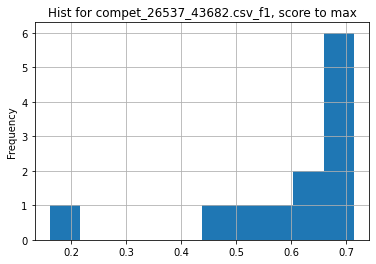

metric_column:  f1 , score_function:  max
Utility w/mean =  1.2070906021384356
Utility w/median =  1.0966257668711656
___________________
26537_43683.csv
          f1     recall       prec        acc
0  0.805 (1)  0.813 (2)  0.798 (1)  0.000 (1)
1  0.801 (2)  0.823 (1)  0.782 (2)  0.000 (1)
2  0.777 (3)  0.797 (3)  0.757 (3)  0.000 (1)


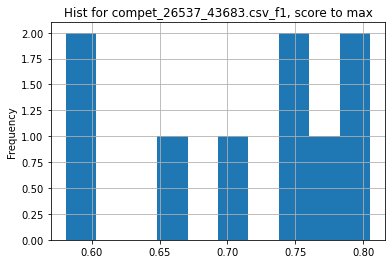

metric_column:  f1 , score_function:  max
Utility w/mean =  1.1248253376804842
Utility w/median =  1.0704787234042554
___________________
26537_43684.csv
          f1     recall       prec        acc
0  0.810 (1)  0.835 (1)  0.789 (2)  0.000 (1)
1  0.809 (2)  0.822 (2)  0.797 (1)  0.000 (1)
2  0.773 (3)  0.800 (3)  0.750 (5)  0.000 (1)


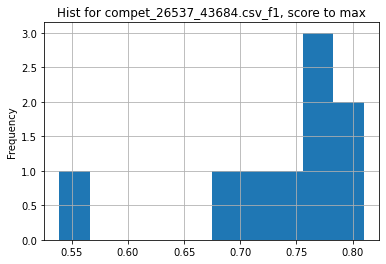

metric_column:  f1 , score_function:  max
Utility w/mean =  1.098222356131365
Utility w/median =  1.0602094240837696
___________________
26537_43685.csv
___________________
26609_43771.csv
___________________
26609_43772.csv
           F1   Precision      Recall
0  0.9330 (1)  0.9220 (3)  0.9443 (2)
1  0.9311 (2)  0.9349 (1)  0.9274 (8)
2  0.9281 (3)  0.9193 (6)  0.9370 (4)


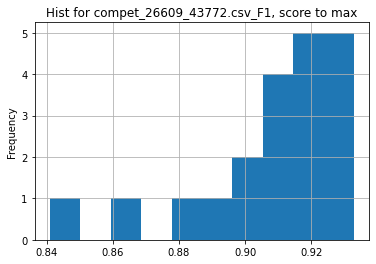

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0276745146633623
Utility w/median =  1.022353714661407
___________________
26611_43774.csv
___________________
26611_43775.csv
           F1   Precision      Recall
0  0.9405 (1)  0.9695 (1)  0.9132 (1)
1  0.9373 (2)  0.9694 (2)  0.9073 (2)
2  0.9319 (3)  0.9652 (3)  0.9009 (3)


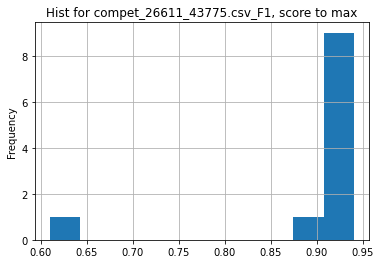

metric_column:  F1 , score_function:  max
Utility w/mean =  1.055264848985587
Utility w/median =  1.0228384991843393
___________________
26638_43874.csv
        score     Duration
0  0.6554 (1)  5663.86 (1)
1  0.5394 (2)  4990.18 (2)
2  0.4233 (3)  2710.85 (3)


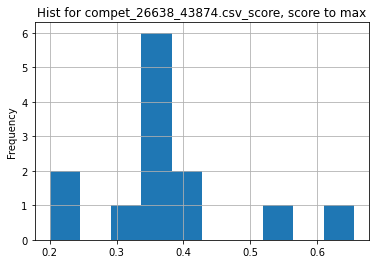

metric_column:  score , score_function:  max
Utility w/mean =  1.7556924725421912
Utility w/median =  1.8394611282626998
___________________
26638_43875.csv
___________________
26644_43881.csv
___________________
26644_43882.csv
___________________
26654_43904.csv
___________________
26654_43905.csv
___________________
26654_43906.csv
___________________
26655_43907.csv
  weighted_f1 weighted_precision weighted_recall  accuracy
0    1.00 (1)           1.00 (1)        1.00 (1)  1.00 (1)
1    1.00 (1)           1.00 (1)        1.00 (1)  1.00 (1)
2    1.00 (1)           1.00 (1)        1.00 (1)  1.00 (1)


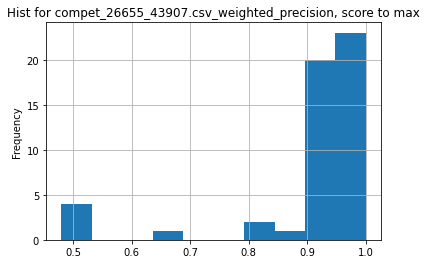

metric_column:  weighted_precision , score_function:  max
Utility w/mean =  1.1048526863084915
Utility w/median =  1.0638297872340425
___________________
26655_43908.csv
___________________
26655_43909.csv
___________________
26881_44249.csv
        test
0  73.62 (1)
1  72.04 (2)
2  70.59 (3)


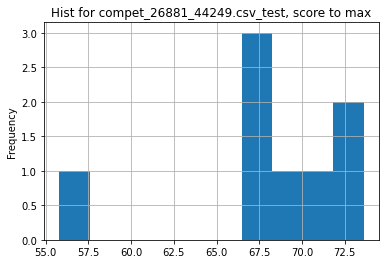

metric_column:  test , score_function:  max
Utility w/mean =  1.0839422103616454
Utility w/median =  1.0794721407624637
___________________
26953_44400.csv
  Graph Identity     Duration PyLint Score
0     1.0000 (1)  1.3121 (20)     0.87 (5)
1     0.9139 (2)  0.8296 (18)     0.99 (1)
2     0.7683 (3)  1.5270 (21)     0.94 (3)


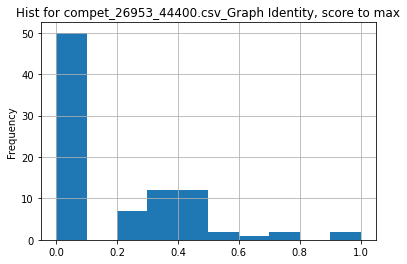

metric_column:  Graph Identity , score_function:  max
File cannot be opened: 26953_44400.csv
___________________
26953_44401.csv
___________________
26979_44457.csv
___________________
26979_44458.csv
___________________
26979_44459.csv
___________________
26979_44460.csv
___________________
26979_44461.csv
___________________
26979_44462.csv
___________________
27022_44529.csv
    Accuracy
0  99.04 (1)
1  98.83 (2)
2  98.76 (3)


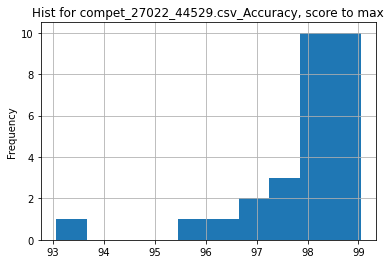

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0115301421479406
Utility w/median =  1.0078868366152751
___________________
27054_44622.csv
___________________
27054_44623.csv
___________________
27054_44624.csv
___________________
27071_44641.csv
File cannot be opened: 27071_44641.csv
___________________
27081_44659.csv
      F1    P    R
0  - (-)  NaN  NaN
1  - (-)  NaN  NaN
2  - (-)  NaN  NaN
File cannot be opened: 27081_44659.csv
___________________
27081_44660.csv
___________________
27082_44661.csv
___________________
27176_44862.csv
File cannot be opened: 27176_44862.csv
___________________
27176_44863.csv
File cannot be opened: 27176_44863.csv
___________________
27176_44972.csv
___________________
27232_44975.csv
___________________
27232_44976.csv
          ROC
0  0.9427 (1)
1  0.9418 (2)
2  0.9405 (3)


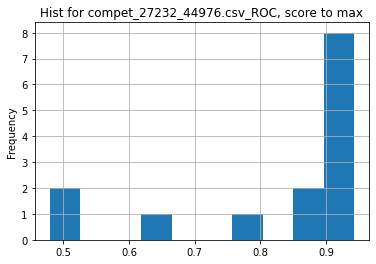

metric_column:  ROC , score_function:  max
Utility w/mean =  1.1345138829192813
Utility w/median =  1.0304421489861726
___________________
27232_44977.csv
          ROC
0  0.9523 (1)
1  0.9521 (2)
2  0.9513 (3)


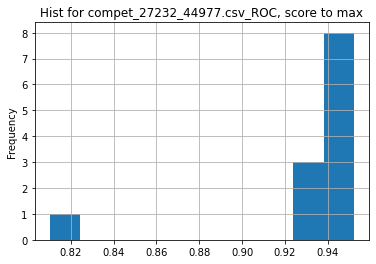

metric_column:  ROC , score_function:  max
Utility w/mean =  1.0203123186400123
Utility w/median =  1.0076715517697477
___________________
27295_45102.csv
     ERR(%) Execution time(ms)
0  2.89 (1)         4020.0 (1)
1  3.32 (2)           40.0 (3)
2  5.35 (3)           35.0 (4)
File cannot be opened: 27295_45102.csv
___________________
27295_45103.csv
     ERR(%) Execution time(ms)
0  3.33 (1)         2101.0 (3)
1  3.58 (2)         1926.0 (7)
2  4.08 (3)         2330.0 (1)
File cannot be opened: 27295_45103.csv
___________________
27320_45118.csv
    Micro_F1 Micro_Precision Micro_Recall    Macro_F1 Macro_Precision  \
0  70.35 (1)       70.20 (2)   70.50 (33)   61.37 (7)       65.51 (2)   
1  69.54 (2)      66.44 (22)    72.94 (7)  57.21 (43)      57.46 (49)   
2  69.54 (3)      67.23 (15)   72.01 (14)   62.77 (1)      61.94 (11)   

  Macro_Recall  
0   61.33 (27)  
1   59.95 (34)  
2    65.59 (5)  


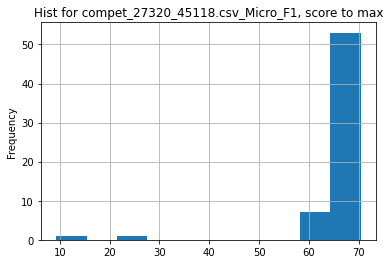

metric_column:  Micro_F1 , score_function:  max
Utility w/mean =  1.0712180601809553
Utility w/median =  1.032963805887967
___________________
27324_45120.csv
___________________
27329_45128.csv
___________________
27329_45129.csv
___________________
27331_45130.csv
          ARI
0  1.0000 (1)
1  1.0000 (1)
2  0.6520 (2)


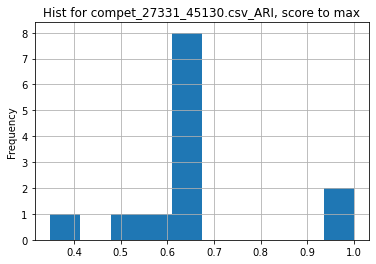

metric_column:  ARI , score_function:  max
Utility w/mean =  1.5153987830182079
Utility w/median =  1.5337423312883436
___________________
27331_45131.csv
          ARI
0  0.3262 (1)
1  0.3096 (2)
2  0.2714 (3)


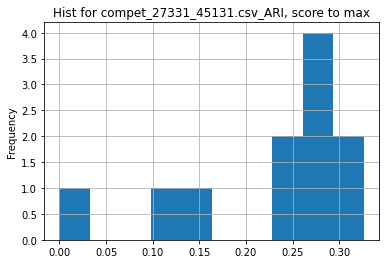

metric_column:  ARI , score_function:  max
Utility w/mean =  1.467626487790912
Utility w/median =  1.2431402439024388
___________________
27331_45132.csv
          ARI
0  0.2541 (1)
1  0.2099 (2)
2  0.1764 (3)


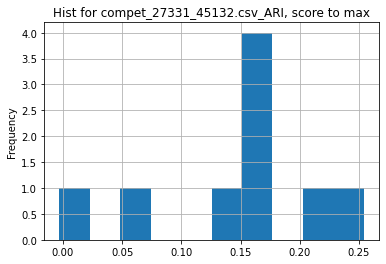

metric_column:  ARI , score_function:  max
Utility w/mean =  1.726222826086956
Utility w/median =  1.5921052631578947
___________________
27331_45133.csv
          ARI
0  0.9095 (1)
1  0.8956 (2)
2  0.8204 (3)


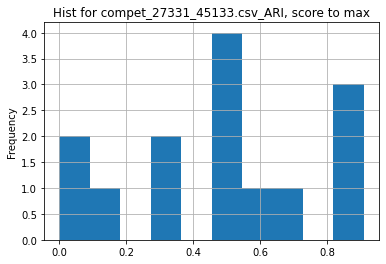

metric_column:  ARI , score_function:  max
Utility w/mean =  1.9354005167958659
Utility w/median =  1.78438297037473
___________________
27331_45134.csv
          ARI
0  0.3346 (1)
1  0.3215 (2)
2  0.3177 (3)


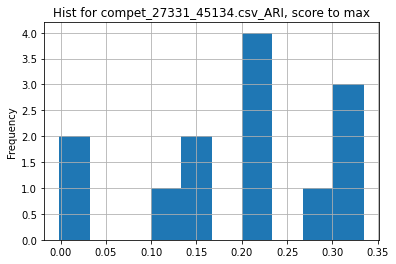

metric_column:  ARI , score_function:  max
Utility w/mean =  1.7276879691782183
Utility w/median =  1.5355667737494263
___________________
27331_45135.csv
          ARI
0  0.2565 (1)
1  0.1853 (2)
2  0.1538 (3)


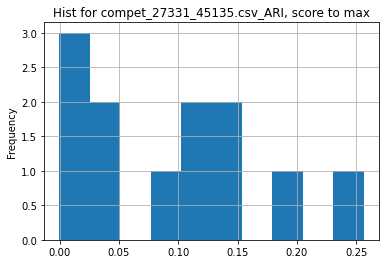

metric_column:  ARI , score_function:  max
Utility w/mean =  2.6525336091003107
Utility w/median =  2.5184094256259204
___________________
27331_45136.csv
___________________
27331_45137.csv
___________________
27331_45138.csv
___________________
27419_45256.csv
___________________
27419_45258.csv
___________________
27419_45260.csv
        Rank    Score 1    Score 5   Score 10
0  0.543 (1)  0.375 (2)  0.687 (1)  0.566 (1)
1  0.540 (2)  0.389 (1)  0.672 (4)  0.558 (3)
2  0.530 (3)  0.346 (3)  0.685 (3)  0.557 (4)


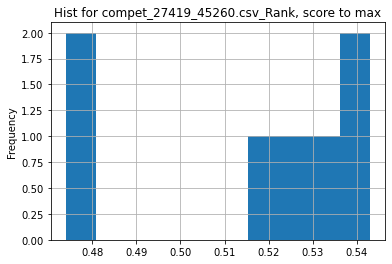

metric_column:  Rank , score_function:  max
Utility w/mean =  1.0540765391014975
Utility w/median =  1.0342857142857143
___________________
27420_45261.csv
      Pearson    Spearman          MAE          MSE           R2
0  0.9253 (1)  0.8915 (1)  0.0349 (37)  0.0028 (37)   0.8542 (1)
1  0.8511 (2)  0.7874 (2)  0.0726 (10)  0.0078 (12)  0.5867 (26)
2  0.8409 (3)  0.7775 (4)  0.0594 (35)  0.0057 (36)   0.6990 (2)


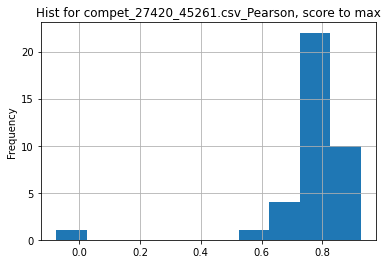

metric_column:  Pearson , score_function:  max
Utility w/mean =  1.2089644098625014
Utility w/median =  1.156408173467475
___________________
27420_45262.csv
      Pearson    Spearman          MAE          MSE          R2
0  0.9554 (1)  0.9542 (1)  0.0251 (22)  0.0021 (22)  0.9100 (1)
1  0.8146 (2)  0.8059 (3)  0.0727 (21)  0.0087 (20)  0.6268 (3)
2  0.8083 (3)  0.8120 (2)  0.0743 (20)  0.0084 (21)  0.6420 (2)


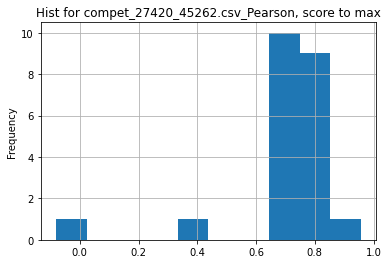

metric_column:  Pearson , score_function:  max
Utility w/mean =  1.3518391078124294
Utility w/median =  1.2856085581645698
___________________
27420_45263.csv
      Pearson    Spearman          MAE          MSE          R2
0  0.7886 (1)  0.7369 (2)  0.0609 (81)  0.0062 (80)  0.6172 (2)
1  0.7882 (2)  0.7425 (1)  0.0610 (80)  0.0061 (81)  0.6210 (1)
2  0.7845 (3)  0.7355 (6)  0.0635 (68)  0.0066 (73)  0.5928 (9)


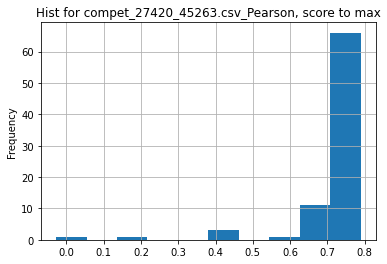

metric_column:  Pearson , score_function:  max
Utility w/mean =  1.1082031051588976
Utility w/median =  1.05020641896391
___________________
27420_45264.csv
      Pearson    Spearman          MAE          MSE          R2
0  0.8612 (1)  0.8526 (3)  0.0616 (59)  0.0063 (59)  0.7389 (1)
1  0.8575 (2)  0.8529 (2)  0.0672 (54)  0.0072 (55)  0.7035 (5)
2  0.8571 (3)  0.8548 (1)  0.0675 (53)  0.0072 (53)  0.7012 (7)


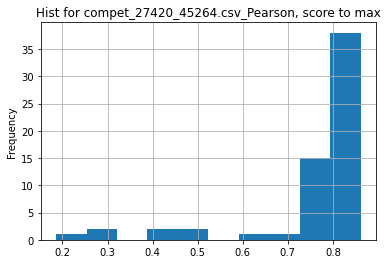

metric_column:  Pearson , score_function:  max
Utility w/mean =  1.1399584533368634
Utility w/median =  1.0604605344169435
___________________
27446_45298.csv
      F-Score    Accuracy
0  0.9603 (1)  0.9500 (1)
1  0.9570 (2)  0.9450 (2)
2  0.9539 (3)  0.9410 (3)
File cannot be opened: 27446_45298.csv
___________________
27446_45299.csv
___________________
27446_45300.csv
      F-Score    Accuracy
0  0.9676 (1)  0.9600 (1)
1  0.9675 (2)  0.9600 (1)
2  0.9655 (3)  0.9570 (2)
File cannot be opened: 27446_45300.csv
___________________
27449_45303.csv
___________________
27453_45307.csv
   MAE (mean)    MAE (sd)         Time Data Type
0  0.0278 (1)  0.0070 (3)  2193.39 (8)   3.0 (1)
1  0.0307 (2)  0.0253 (8)  1090.35 (6)   2.0 (2)
2  0.0366 (3)  0.0107 (6)  1657.53 (7)   3.0 (1)


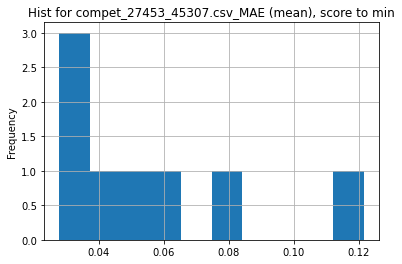

metric_column:  MAE (mean) , score_function:  min
Utility w/mean =  2.0193345323741005
Utility w/median =  1.7122302158273384
___________________
27482_45336.csv
          R2        MAE  Error_max
0  0.911 (1)  0.044 (5)  0.473 (1)
1  0.900 (2)  0.039 (1)  0.972 (5)
2  0.893 (3)  0.043 (3)  0.721 (2)


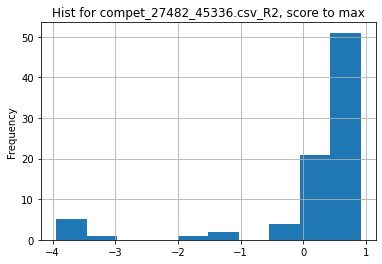

metric_column:  R2 , score_function:  max
Utility w/mean =  6.842965712265821
Utility w/median =  1.803960396039604
___________________
27549_45405.csv
     Accuracy
0  0.9147 (1)
1  0.9123 (2)
2  0.8950 (3)


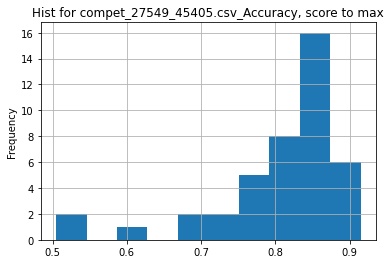

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1353397679518171
Utility w/median =  1.0958428177788426
___________________
27549_45406.csv
     Accuracy
0  0.9147 (1)
1  0.8981 (2)
2  0.8897 (3)


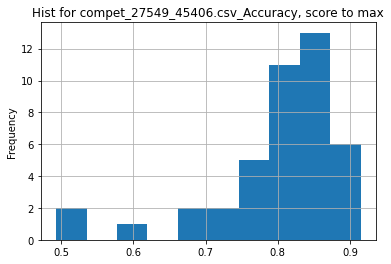

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1475828036132487
Utility w/median =  1.1043766978569274
___________________
27605_45466.csv
  Balanced accuracy
0          0.79 (1)
1          0.79 (2)
2          0.77 (3)


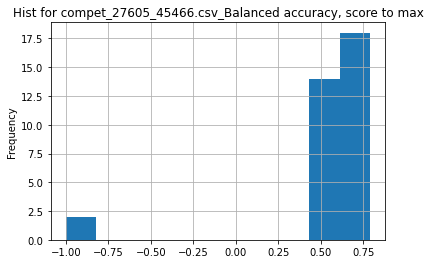

metric_column:  Balanced accuracy , score_function:  max
Utility w/mean =  1.4249336870026525
Utility w/median =  1.161764705882353
___________________
27653_45574.csv
File cannot be opened: 27653_45574.csv
___________________
27654_45530.csv
___________________
27655_45531.csv
___________________
27655_45532.csv
     F1 Average     F1 Object     F1 Aspect  F1 Predicate F1 Average partial  \
0  0.808679 (1)  0.830702 (2)  0.604255 (1)  0.904483 (1)       0.823579 (1)   
1  0.777308 (2)  0.828779 (3)  0.509554 (4)  0.860656 (5)       0.798356 (2)   
2  0.776678 (3)  0.795495 (4)  0.585153 (2)  0.869822 (4)       0.796476 (3)   

  F1 Object partial F1 Aspect partial F1 Predicate partial  
0      0.832880 (2)      0.661773 (1)         0.914555 (1)  
1      0.831567 (3)      0.584793 (4)         0.879440 (5)  
2      0.797273 (4)      0.646118 (2)         0.895628 (3)  


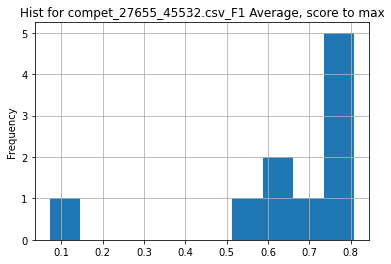

metric_column:  F1 Average , score_function:  max
Utility w/mean =  1.2426863313400969
Utility w/median =  1.0949757357799756
___________________
27655_45533.csv
     F1 Average     F1 Object     F1 Aspect  F1 Predicate F1 Average partial  \
0  0.871236 (1)  0.924509 (2)  0.687879 (1)  0.894737 (4)       0.886989 (1)   
1  0.870087 (2)  0.928831 (1)  0.666667 (2)  0.896825 (3)       0.884438 (2)   
2  0.833867 (3)  0.874800 (3)  0.602606 (4)  0.912416 (1)       0.848975 (3)   

  F1 Object partial F1 Aspect partial F1 Predicate partial  
0      0.928301 (2)      0.738611 (1)         0.909357 (4)  
1      0.932641 (1)      0.708078 (2)         0.912698 (3)  
2      0.877819 (3)      0.660505 (4)         0.921399 (1)  


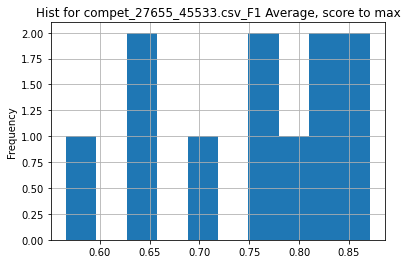

metric_column:  F1 Average , score_function:  max
Utility w/mean =  1.1596964768257247
Utility w/median =  1.1243800484991464
___________________
27667_45548.csv
  F_score Precision Recall  ATA  MOTA  MOTP
0   - (-)       NaN    NaN  NaN   NaN   NaN
1   - (-)       NaN    NaN  NaN   NaN   NaN
2   - (-)       NaN    NaN  NaN   NaN   NaN
File cannot be opened: 27667_45548.csv
___________________
27667_45549.csv
  F_score Precision Recall  ATA  MOTA  MOTP
0   - (-)       NaN    NaN  NaN   NaN   NaN
1   - (-)       NaN    NaN  NaN   NaN   NaN
2   - (-)       NaN    NaN  NaN   NaN   NaN
File cannot be opened: 27667_45549.csv
___________________
27667_45550.csv
      F_score   Precision      Recall         ATA        MOTA        MOTP
0  0.5308 (1)  0.6655 (1)  0.4414 (1)  0.4549 (1)  0.5913 (1)  0.8421 (3)
1  0.4755 (2)  0.6435 (2)  0.3770 (2)  0.4188 (2)  0.4960 (3)  0.8142 (7)
2  0.4183 (3)  0.5243 (3)  0.3479 (3)  0.3579 (3)  0.5179 (2)  0.8427 (2)
File cannot be opened: 27667_45550.csv
_

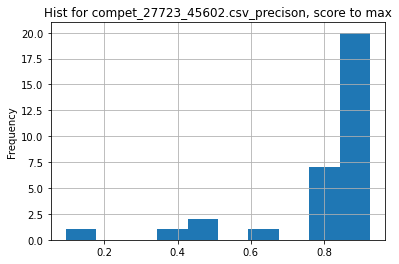

metric_column:  precison , score_function:  max
Utility w/mean =  1.147862589212068
Utility w/median =  1.0350298899379855
___________________
27748_45642.csv
___________________
27748_45643.csv
___________________
27748_45644.csv
___________________
27749_45645.csv
  Prediction score  Duration
0         0.92 (5)  0.00 (1)
1         0.90 (7)  0.00 (1)
2        0.81 (13)  0.00 (1)
File cannot be opened: 27749_45645.csv
___________________
27749_45646.csv
  Prediction score  Duration
0        0.46 (20)  0.00 (1)
1       -1.00 (25)  0.00 (1)
2        0.26 (23)  0.00 (1)
File cannot be opened: 27749_45646.csv
___________________
27768_45686.csv
___________________
27768_45688.csv
___________________
27768_45690.csv
___________________
27769_45691.csv
           F1    Accuracy   Precision      Recall
0  0.3403 (1)  0.5342 (1)  0.3785 (1)  0.3295 (1)
1  0.3085 (2)  0.5190 (2)  0.3383 (2)  0.3143 (2)
2  0.2525 (3)  0.4212 (3)  0.2671 (6)  0.2454 (3)


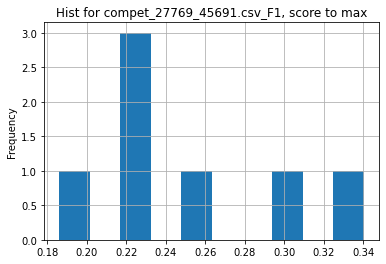

metric_column:  F1 , score_function:  max
Utility w/mean =  1.3556997325138012
Utility w/median =  1.478922207735767
___________________
27769_45692.csv
           F1    Accuracy   Precision      Recall
0  0.3104 (1)  0.5102 (1)  0.3501 (1)  0.3062 (1)
1  0.3064 (2)  0.4950 (2)  0.3291 (2)  0.3034 (2)
2  0.2610 (3)  0.4270 (4)  0.2704 (4)  0.2588 (3)


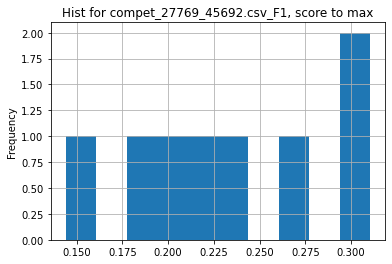

metric_column:  F1 , score_function:  max
Utility w/mean =  1.344086603518268
Utility w/median =  1.3903695408734602
___________________
27769_45693.csv
___________________
27770_45694.csv
___________________
27770_45695.csv
___________________
27770_45696.csv
___________________
27771_45697.csv
___________________
27771_45698.csv
___________________
27771_45699.csv
___________________
27798_45752.csv
___________________
27798_45753.csv
        CER
0  0.24 (1)
1  0.29 (2)
2  0.35 (3)
File cannot be opened: 27798_45753.csv
___________________
27798_45754.csv
        CER
0  0.22 (1)
1  0.23 (2)
2  0.24 (3)
File cannot be opened: 27798_45754.csv
___________________
27804_45769.csv
___________________
27804_45770.csv
___________________
27884_45892.csv
___________________
27884_45893.csv
    ROC-AUC
0  0.67 (1)
1  0.67 (2)
2  0.67 (3)


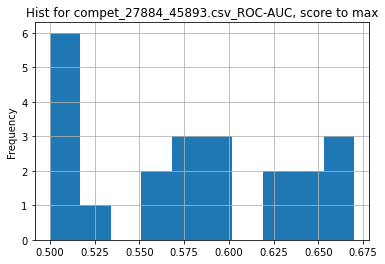

metric_column:  ROC-AUC , score_function:  max
Utility w/mean =  1.162460567823344
Utility w/median =  1.1754385964912282
___________________
27884_45894.csv
    ROC-AUC
0  0.68 (1)
1  0.68 (2)
2  0.67 (3)


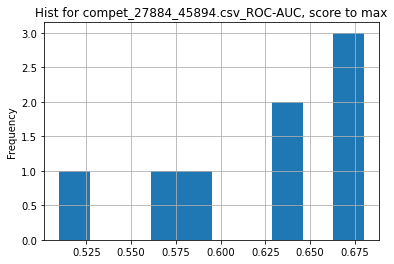

metric_column:  ROC-AUC , score_function:  max
Utility w/mean =  1.098989898989899
Utility w/median =  1.0793650793650795
___________________
27901_45918.csv
      Rec. Rate
0  0.968300 (1)
1  0.964200 (2)
2  0.959700 (3)


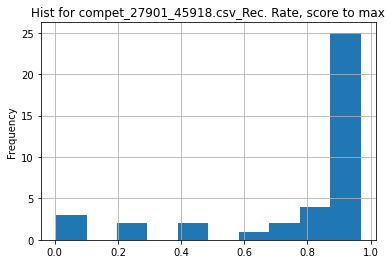

metric_column:  Rec. Rate , score_function:  max
Utility w/mean =  1.2546663299954153
Utility w/median =  1.0660574699988992
___________________
27901_45919.csv
      Rec. Rate
0  0.984200 (1)
1  0.983400 (2)
2  0.976200 (3)


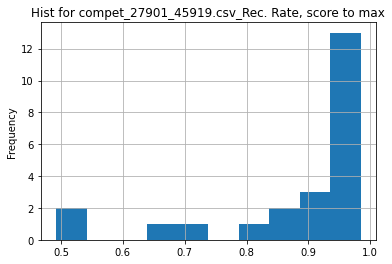

metric_column:  Rec. Rate , score_function:  max
Utility w/mean =  1.1179837709962122
Utility w/median =  1.0310077519379846
___________________
27902_45920.csv
      Rec. Rate
0  0.969200 (1)
1  0.955400 (2)
2  0.952900 (3)


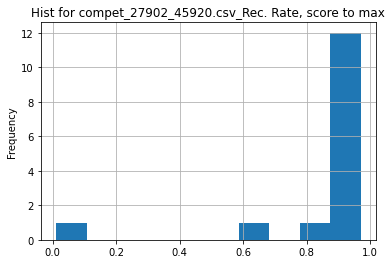

metric_column:  Rec. Rate , score_function:  max
Utility w/mean =  1.1405394379677716
Utility w/median =  1.0464262578276828
___________________
27902_45921.csv
      Rec. Rate
0  0.985300 (1)
1  0.983400 (2)
2  0.976500 (3)


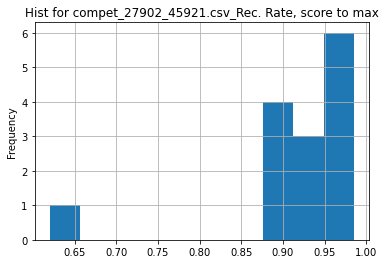

metric_column:  Rec. Rate , score_function:  max
Utility w/mean =  1.0754537516372482
Utility w/median =  1.0522212729602733
___________________
27943_45963.csv
   Prediction
0  0.8877 (1)
1  0.8837 (2)
2  0.8820 (3)
File cannot be opened: 27943_45963.csv
___________________
27943_45964.csv
   Prediction
0  0.8939 (1)
1  0.8806 (2)
2  0.8798 (3)


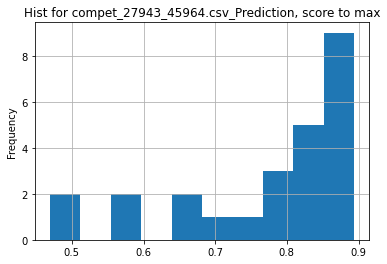

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.1591628196483224
Utility w/median =  1.0777670605256813
___________________
27943_45965.csv
   Prediction
0  0.8826 (1)
1  0.8817 (2)
2  0.8798 (3)


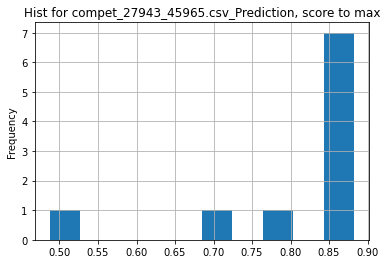

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.0922726597693186
Utility w/median =  1.0211141320067103
___________________
27956_45976.csv
   Prediction
0  0.7025 (1)
1  0.6921 (2)
2  0.6767 (3)


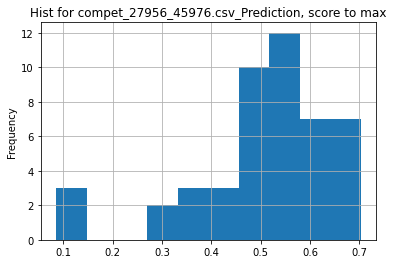

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.3881297928158212
Utility w/median =  1.2861589161479312
___________________
27956_45977.csv
   Prediction
0  0.6772 (1)
1  0.6657 (2)
2  0.6445 (3)


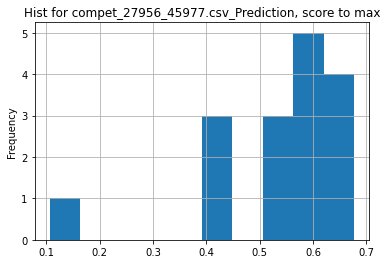

metric_column:  Prediction , score_function:  max
Utility w/mean =  1.2575527210686974
Utility w/median =  1.1568158524086096
___________________
27956_45978.csv
___________________
27961_45986.csv
         correct
0  37.850000 (1)
1  37.200000 (2)
2  32.630000 (3)


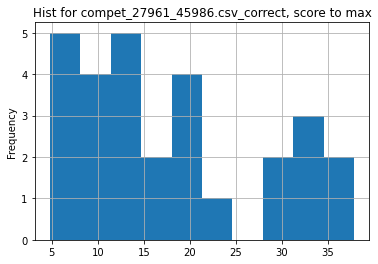

metric_column:  correct , score_function:  max
Utility w/mean =  2.14304491132995
Utility w/median =  2.463390823299707
___________________
27980_46006.csv
          avg         5-1         5-5        10-1        10-5
0  0.9775 (1)  0.9855 (1)  0.9846 (1)  0.9699 (1)  0.9701 (1)
1  0.9682 (2)  0.9703 (3)  0.9834 (2)  0.9499 (3)  0.9691 (2)
2  0.9680 (3)  0.9717 (2)  0.9815 (3)  0.9539 (2)  0.9648 (5)


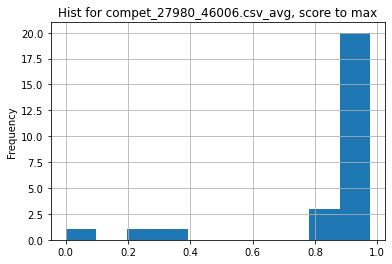

metric_column:  avg , score_function:  max
Utility w/mean =  1.1707287861548594
Utility w/median =  1.0713502849627357
___________________
27981_46007.csv
          avg         5-1         5-5        10-1        10-5
0  0.9141 (1)  0.9122 (1)  0.9636 (1)  0.8509 (1)  0.9295 (1)
1  0.8882 (2)  0.8781 (2)  0.9500 (2)  0.8184 (2)  0.9063 (2)
2  0.8624 (3)  0.8678 (3)  0.9304 (3)  0.7741 (3)  0.8771 (3)


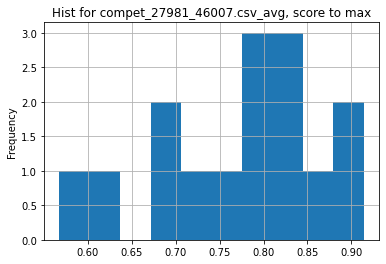

metric_column:  avg , score_function:  max
Utility w/mean =  1.1897076814951715
Utility w/median =  1.1609093218186437
___________________
27982_46008.csv
___________________
28002_46047.csv
___________________
28002_46048.csv
___________________
28003_46049.csv
___________________
28003_46050.csv
___________________
28019_46076.csv
  AP (total) AR (total)    AP (PL)   AR (PL)   AP (CR)   AR (CR)   AP (CS)  \
0   77.5 (1)   84.6 (1)   96.9 (1)  98.9 (1)  75.4 (1)  79.5 (1)  69.8 (1)   
1   73.7 (2)   83.1 (2)   96.7 (2)  98.8 (2)  72.2 (2)  79.2 (2)  62.2 (3)   
2   70.3 (3)   79.9 (3)  92.1 (10)  96.1 (7)  62.8 (3)  72.3 (3)  64.7 (2)   

    AR (CS)   AP (HW)   AR (HW)  
0  82.0 (1)  72.4 (1)  78.6 (1)  
1  78.1 (3)  69.9 (2)  77.8 (2)  
2  78.9 (2)  64.9 (3)  72.1 (3)  


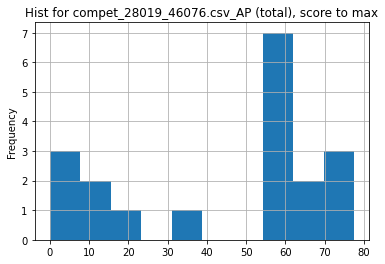

metric_column:  AP (total) , score_function:  max
Utility w/mean =  1.7471523493118175
Utility w/median =  1.3596491228070176
___________________
28019_46077.csv
  AP (total) AR (total)   AP (PL)   AR (PL)   AP (CR)   AR (CR)   AP (CS)  \
0   82.2 (1)   90.1 (1)  97.0 (3)  98.2 (3)  79.9 (1)  87.3 (1)  63.8 (1)   
1   79.7 (2)   88.9 (3)  95.6 (6)  97.3 (7)  75.1 (4)  83.7 (6)  63.6 (2)   
2   79.1 (3)   88.2 (4)  95.5 (7)  97.1 (8)  78.8 (2)  86.8 (2)  59.8 (4)   

    AR (CS)   AP (HW)   AR (HW)  
0  85.4 (2)  83.2 (1)  86.5 (1)  
1  86.3 (1)  79.0 (4)  83.9 (5)  
2  82.5 (3)  80.5 (2)  83.9 (3)  


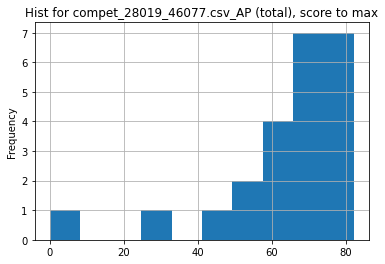

metric_column:  AP (total) , score_function:  max
Utility w/mean =  1.2751922298664509
Utility w/median =  1.170940170940171
___________________
28022_46082.csv
           mAP      bicycle          bus          car     motorbike  \
0  54.0630 (1)  57.5235 (1)  51.3009 (6)  80.0239 (5)   54.9833 (7)   
1  51.8775 (2)  47.4056 (3)  50.7039 (8)  80.3727 (4)   53.4389 (8)   
2  51.6130 (3)  47.5892 (2)  54.2579 (5)  79.1882 (6)  51.6806 (13)   

         person  
0  26.4832 (11)  
1   27.4666 (8)  
2  25.3491 (17)  


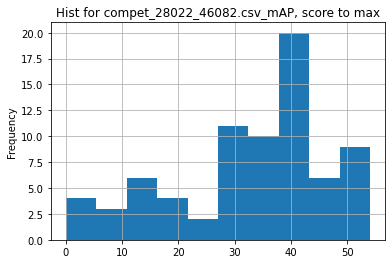

metric_column:  mAP , score_function:  max
Utility w/mean =  1.6499881766565
Utility w/median =  1.4458633646684407
___________________
28022_46083.csv
           mAP       bicycle          bus           car    motorbike  \
0  58.2972 (1)   43.3874 (1)  60.1091 (1)   82.8888 (7)  61.1606 (1)   
1  54.0578 (2)  35.6681 (15)  43.9272 (4)   82.8889 (6)  59.6764 (2)   
2  51.3780 (3)  31.6085 (33)  52.9158 (2)  80.5443 (20)  55.4671 (5)   

         person  
0   43.9399 (7)  
1   48.1281 (3)  
2  36.3544 (28)  


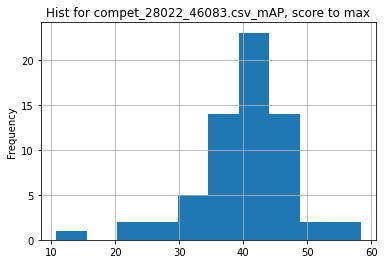

metric_column:  mAP , score_function:  max
Utility w/mean =  1.4463823094004438
Utility w/median =  1.3893451413482298
___________________
28029_46092.csv
          mAP
0  0.8395 (1)
1  0.8379 (2)
2  0.8373 (3)


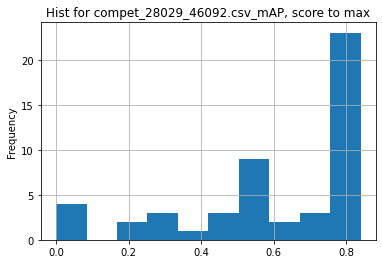

metric_column:  mAP , score_function:  max
Utility w/mean =  1.3960534674342884
Utility w/median =  1.232384028185555
___________________
28029_46093.csv
          mAP
0  0.7489 (1)
1  0.7169 (2)
2  0.7148 (3)


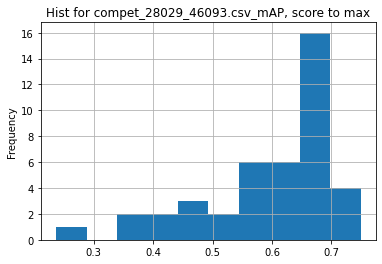

metric_column:  mAP , score_function:  max
Utility w/mean =  1.2467764120167593
Utility w/median =  1.1892964903922505
___________________
28030_46094.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  19.7032 (1)  0.7233 (1)           1.0000 (10)          0.0 (2)   
1  19.3558 (2)  0.7175 (2)            2.8867 (5)          0.0 (2)   
2  19.1026 (3)  0.7069 (4)            2.8883 (4)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


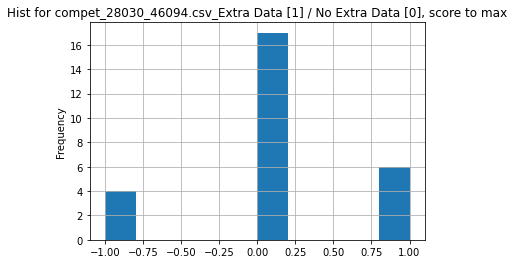

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 28030_46094.csv
___________________
28030_46095.csv
___________________
28031_46096.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  19.2462 (4)  0.7022 (3)            2.0420 (3)          1.0 (1)   
1  19.7730 (2)  0.7107 (2)            2.5000 (2)          0.0 (2)   
2  20.0637 (1)  0.7196 (1)            0.3400 (7)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            0.0 (2)  


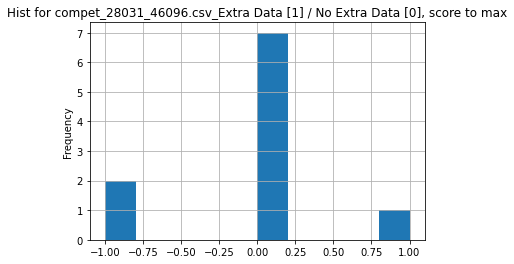

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 28031_46096.csv
___________________
28031_46097.csv
___________________
28032_46098.csv
            PSNR          SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  11.7784 (120)  0.1166 (126)           -1.0000 (1)         -1.0 (3)   
1   17.2662 (97)   0.7270 (92)           -1.0000 (1)         -1.0 (3)   
2  10.1970 (125)  0.2361 (123)           -1.0000 (1)         -1.0 (3)   

  Extra Data [1] / No Extra Data [0]  
0                           -1.0 (1)  
1                           -1.0 (1)  
2                           -1.0 (1)  


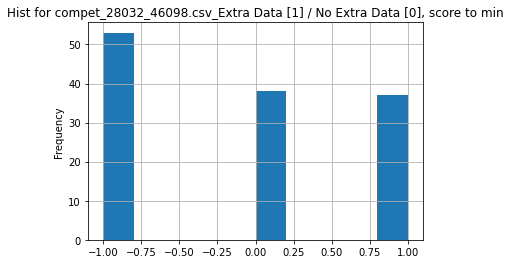

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  min
Utility w/mean =  0.125
Utility w/median =  -0.0
___________________
28032_46099.csv
___________________
28033_46100.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  31.1805 (1)  0.8728 (1)           0.5000 (13)          0.0 (2)   
1  30.9006 (2)  0.8644 (2)           -1.0000 (1)         -1.0 (3)   
2  30.7552 (3)  0.8643 (3)           0.4000 (12)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                           -1.0 (3)  
2                            0.0 (2)  


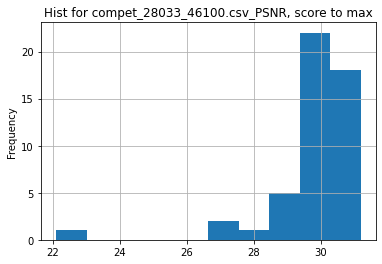

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0478666610335812
Utility w/median =  1.0378831251830745
___________________
28033_46101.csv
___________________
28034_46102.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  29.9908 (6)  0.8498 (5)            1.0000 (2)          0.0 (1)   
1  30.0995 (5)  0.8487 (7)            1.2000 (1)          0.0 (1)   
2  30.7530 (2)  0.8638 (1)            0.4000 (4)          0.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            0.0 (2)  
2                            0.0 (2)  


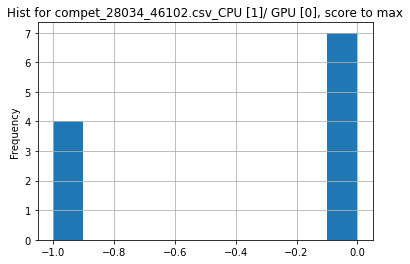

metric_column:  CPU [1]/ GPU [0] , score_function:  max
File cannot be opened: 28034_46102.csv
___________________
28034_46103.csv
___________________
28035_46104.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  30.6337 (1)  0.8595 (1)           -1.0000 (1)         -1.0 (3)   
1  30.4366 (2)  0.8581 (2)            0.0600 (4)          0.0 (2)   
2  29.9632 (3)  0.8507 (4)           1.0000 (10)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           -1.0 (3)  
1                            0.0 (2)  
2                            0.0 (2)  


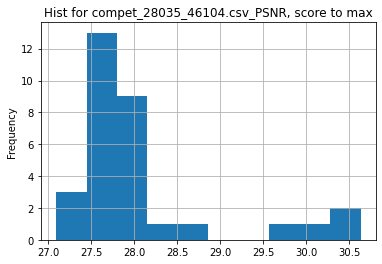

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0909411003396852
Utility w/median =  1.10306249212322
___________________
28035_46105.csv
___________________
28049_46110.csv
           PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0   27.0080 (2)   0.8502 (4)           0.2000 (12)          0.0 (2)   
1  24.3317 (36)  0.7459 (40)           10.4300 (1)          1.0 (1)   
2  24.1346 (40)  0.7484 (39)           10.4300 (1)          1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (1)  
1                            1.0 (1)  
2                            1.0 (1)  


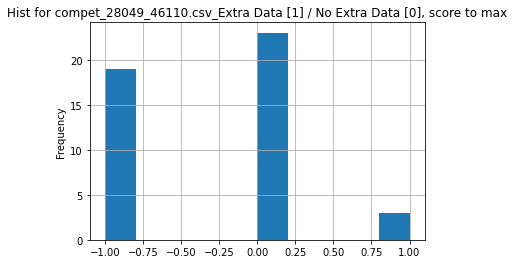

metric_column:  Extra Data [1] / No Extra Data [0] , score_function:  max
File cannot be opened: 28049_46110.csv
___________________
28049_46111.csv
___________________
28050_46112.csv
    MainScore     Pearson    Spearman Runtime per image [s] CPU [1]/ GPU [0]  \
0  1.7516 (1)  0.8774 (1)  0.8742 (1)            1.0000 (3)          1.0 (1)   
1  1.7495 (2)  0.8761 (3)  0.8734 (2)            1.0000 (3)          1.0 (1)   
2  1.7494 (3)  0.8764 (2)  0.8731 (3)            1.0000 (3)          1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            1.0 (1)  
2                            1.0 (1)  


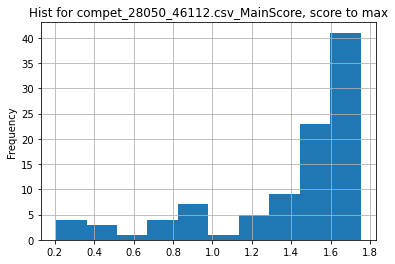

metric_column:  MainScore , score_function:  max
Utility w/mean =  1.2653923556079765
Utility w/median =  1.119268986229592
___________________
28050_46113.csv
___________________
28051_46114.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  32.3591 (1)  0.9006 (1)           0.5000 (14)          0.0 (2)   
1  32.0413 (2)  0.8945 (2)           5.9500 (28)          0.0 (2)   
2  31.7882 (3)  0.8896 (3)           2.7000 (24)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


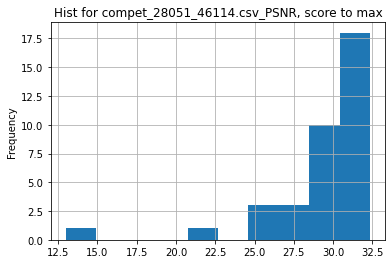

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.104074439524189
Utility w/median =  1.0604117238396098
___________________
28051_46115.csv
___________________
28054_46117.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  25.0087 (1)  0.8796 (1)           0.2015 (33)          0.0 (2)   
1  24.6618 (2)  0.8708 (2)           0.1940 (31)          0.0 (2)   
2  24.4118 (3)  0.8636 (3)           0.0892 (15)         -1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                           -1.0 (1)  


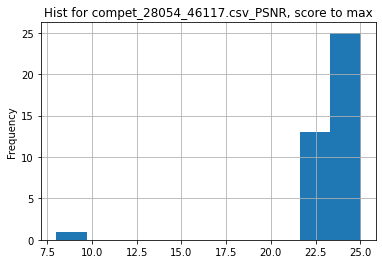

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.083275458418748
Utility w/median =  1.0587351246544432
___________________
28054_46118.csv
___________________
28072_46136.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  30.8889 (1)  0.8650 (1)           0.8400 (10)          1.0 (1)   
1  29.4297 (2)  0.8287 (2)           -1.0000 (1)         -1.0 (3)   
2  28.7878 (3)  0.8161 (3)           1.3500 (14)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (3)  
1                           -1.0 (1)  
2                            0.0 (2)  


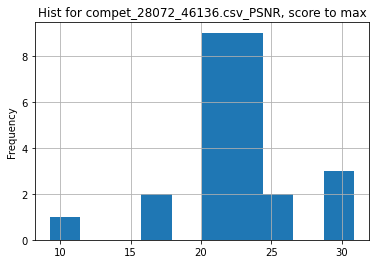

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.3744750379126216
Utility w/median =  1.3807316484439953
___________________
28072_46137.csv
___________________
28073_46138.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  27.9231 (1)  0.7814 (1)           6.5000 (32)          0.0 (2)   
1  27.8814 (2)  0.7800 (2)            0.0100 (3)          0.0 (2)   
2  27.8771 (3)  0.7789 (3)           -1.0000 (1)         -1.0 (3)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                           -1.0 (1)  


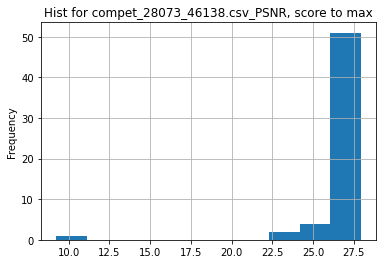

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0472228681213145
Utility w/median =  1.0297286383608777
___________________
28073_46139.csv
___________________
28074_46140.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  29.2533 (1)  0.8190 (1)           -1.0000 (1)          0.0 (2)   
1  29.1677 (2)  0.8183 (2)           4.3700 (11)          0.0 (2)   
2  29.1355 (3)  0.8170 (4)          18.8300 (14)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


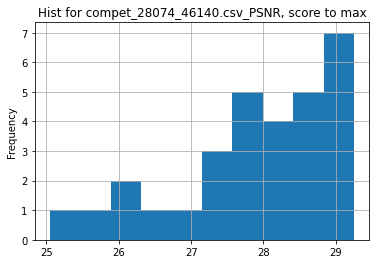

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0475284340554079
Utility w/median =  1.0368602097942996
___________________
28074_46141.csv
___________________
28078_46145.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  43.5699 (1)  0.9579 (4)           -1.0000 (1)         -1.0 (1)   
1  43.4246 (2)  0.9569 (5)           -1.0000 (1)         -1.0 (1)   
2  43.3664 (3)  0.9606 (2)           -1.0000 (1)         -1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                           -1.0 (1)  
1                           -1.0 (1)  
2                           -1.0 (1)  


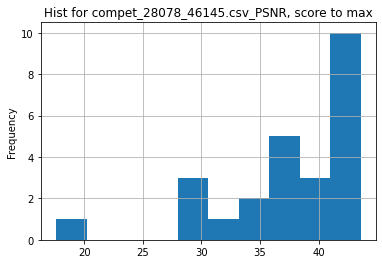

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.162435732390619
Utility w/median =  1.0776866168180839
___________________
28078_46146.csv
___________________
28091_46155.csv
     macro_f1
0  0.6904 (1)
1  0.6574 (2)
2  0.6524 (3)


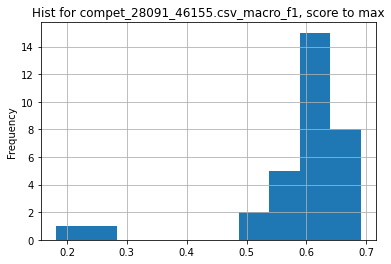

metric_column:  macro_f1 , score_function:  max
Utility w/mean =  1.16758447927787
Utility w/median =  1.0970048462699609
___________________
28091_46156.csv
     macro_f1
0  0.6810 (1)
1  0.6801 (2)
2  0.6721 (3)


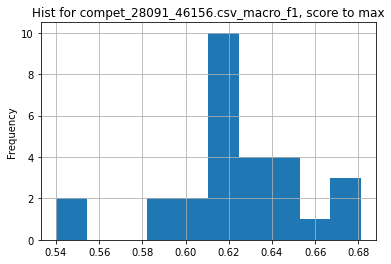

metric_column:  macro_f1 , score_function:  max
Utility w/mean =  1.0922526134899042
Utility w/median =  1.0956479768321132
___________________
28095_46162.csv
  Accuracy (top-1)[%]       Score2       Score3 Runtime per image [s]  \
0         100.000 (1)  100.000 (1)  100.000 (1)            0.0200 (8)   
1          63.117 (2)   63.117 (2)   63.117 (2)           0.0350 (12)   
2          49.870 (3)   49.870 (3)   49.870 (3)           -1.0000 (1)   

  CPU [1]/ GPU [0] Extra Data [1] / No Extra Data [0]  
0          0.0 (2)                            1.0 (1)  
1          0.0 (2)                            0.0 (2)  
2         -1.0 (3)                           -1.0 (3)  


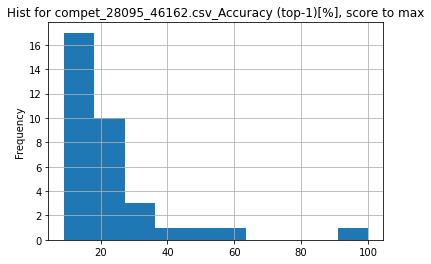

metric_column:  Accuracy (top-1)[%] , score_function:  max
Utility w/mean =  4.178423603669148
Utility w/median =  5.559570801134152
___________________
28095_46163.csv
___________________
28112_46179.csv
     PSNR [dB] Latency per frame [ms]        SSIM  \
0  28.2296 (1)            -1.0000 (1)  0.7894 (1)   
1  27.9664 (2)            -1.0000 (1)  0.7809 (2)   
2  27.6812 (3)            -1.0000 (1)  0.7719 (3)   

  Energy consumption per inference [J] GPU memory usage per inference [M]  \
0                             -1.0 (1)                         2000.0 (5)   
1                             -1.0 (1)                           -1.0 (1)   
2                             -1.0 (1)                           -1.0 (1)   

  Model size [MB] Extra Data [1] / No Extra Data [0]  
0         2.0 (3)                            0.0 (2)  
1         0.0 (1)                            0.0 (2)  
2         1.0 (2)                            0.0 (2)  


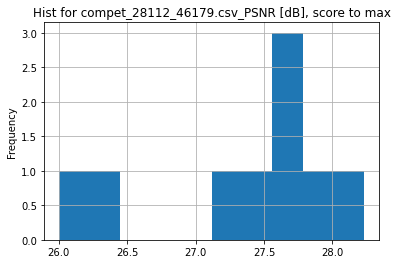

metric_column:  PSNR [dB] , score_function:  max
Utility w/mean =  1.0322439099305978
Utility w/median =  1.0238762771432612
___________________
28112_46180.csv
___________________
28113_46181.csv
  Accuracy [%] Latency per image [ms] Energy consumption per inference [J]  \
0  97.6667 (1)           13.0000 (15)                             -1.0 (1)   
1  97.5000 (2)           28.0000 (19)                             -1.0 (1)   
2  97.5000 (2)             8.0300 (9)                             -1.0 (1)   

  GPU memory usage per inference [M] Model size [MB]  \
0                           -1.0 (1)        -1.0 (1)   
1                           -1.0 (1)        -1.0 (1)   
2                           -1.0 (1)        -1.0 (1)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (2)  
1                            1.0 (2)  
2                            1.0 (2)  


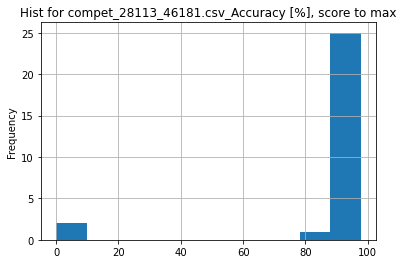

metric_column:  Accuracy [%] , score_function:  max
Utility w/mean =  1.1118041318362364
Utility w/median =  1.029877690642422
___________________
28113_46182.csv
___________________
28114_46183.csv
___________________
28117_46186.csv
        Accuracy
0  100.00000 (1)
1  100.00000 (1)
2  100.00000 (1)


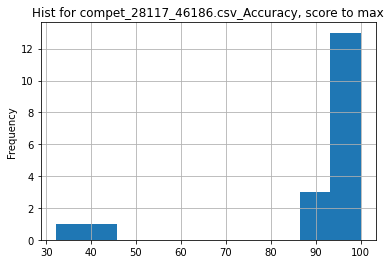

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1088295232513543
Utility w/median =  1.016948980178139
___________________
28117_46187.csv
       Accuracy
0  93.71610 (1)
1  92.31960 (2)
2  91.46630 (3)


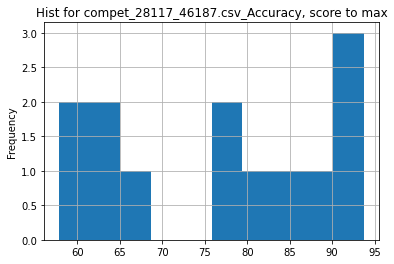

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.2202972863091262
Utility w/median =  1.1843143846098436
___________________
28118_46188.csv
       Accuracy
0  85.00000 (1)
1  82.00000 (2)
2  67.00000 (3)


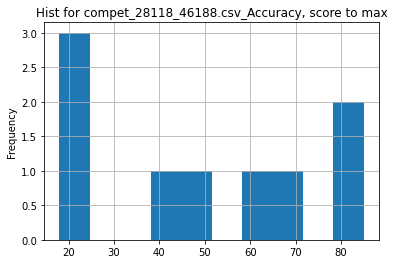

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.7386363636363638
Utility w/median =  1.7708333333333333
___________________
28118_46189.csv
___________________
28119_46190.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  31.1436 (1)  0.8776 (1)            0.1500 (8)          0.0 (2)   
1  31.1143 (2)  0.8767 (2)            0.1000 (6)          1.0 (3)   
2  30.9750 (3)  0.8736 (3)            0.0400 (4)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


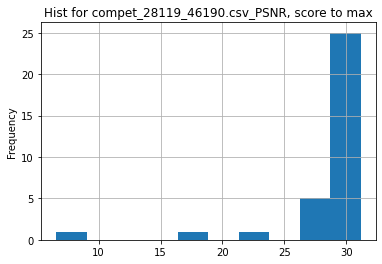

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.0921070430647124
Utility w/median =  1.0495531321192186
___________________
28119_46191.csv
___________________
28120_46192.csv
          PSNR        SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  38.1891 (1)  0.9315 (2)            1.0300 (9)          0.0 (2)   
1  38.0447 (2)  0.9321 (1)            1.0300 (9)          0.0 (2)   
2  37.9717 (3)  0.9278 (8)            1.0300 (9)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


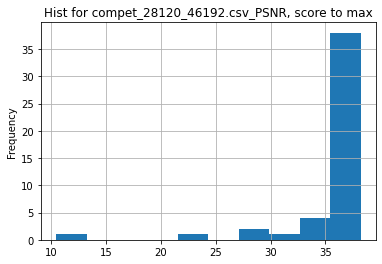

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.075148475613628
Utility w/median =  1.0338114948254067
___________________
28120_46193.csv
___________________
28122_46196.csv
       Score1      Score2 Runtime per image [s] CPU [1]/ GPU [0]  \
0  0.2079 (1)  2.7277 (2)           -1.0000 (1)          1.0 (3)   
1  0.2275 (2)  3.0319 (4)           5.5439 (13)          1.0 (3)   
2  0.2278 (3)  2.7055 (1)           -1.0000 (1)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                            1.0 (3)  
1                            0.0 (2)  
2                            0.0 (2)  


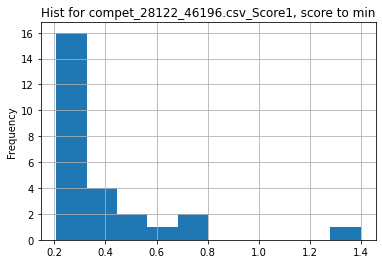

metric_column:  Score1 , score_function:  min
Utility w/mean =  1.8711473711473712
Utility w/median =  1.4624819624819627
___________________
28122_46197.csv
___________________
28123_46198.csv
  Accuracy (top-1)[%]      Score2      Score3 Runtime per image [s]  \
0          27.273 (1)  27.273 (1)  27.273 (1)           -1.0000 (1)   
1          26.883 (2)  26.883 (2)  26.883 (2)           -1.0000 (1)   
2          24.545 (3)  24.545 (3)  24.545 (3)           -1.0000 (1)   

  CPU [1]/ GPU [0] Extra Data [1] / No Extra Data [0]  
0         -1.0 (3)                           -1.0 (3)  
1         -1.0 (3)                           -1.0 (3)  
2         -1.0 (3)                           -1.0 (3)  


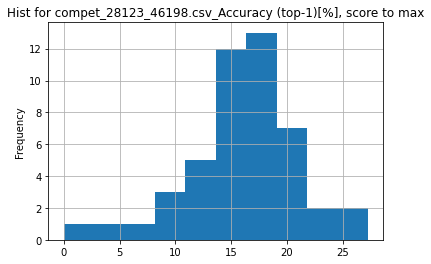

metric_column:  Accuracy (top-1)[%] , score_function:  max
Utility w/mean =  1.7112482010834893
Utility w/median =  1.666646296748961
___________________
28123_46199.csv
___________________
28158_46282.csv
  Prediction score  Duration
0       0.8910 (1)  0.00 (1)
1       0.8835 (2)  0.00 (1)
2       0.8835 (2)  0.00 (1)


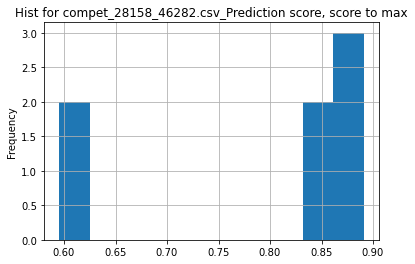

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.1284602858693684
Utility w/median =  1.056312981624185
___________________
28161_46292.csv
          PSNR         SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  37.0629 (1)  34.3045 (4)           1.2700 (10)         -1.0 (1)   
1  33.2497 (2)  34.3912 (3)           5.0000 (14)          0.0 (2)   
2  32.2156 (3)  33.7337 (6)            0.0200 (2)          0.0 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           -1.0 (1)  
1                            0.0 (2)  
2                            0.0 (2)  


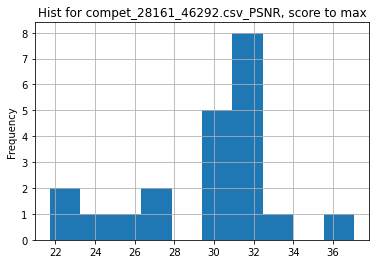

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.2461480601247488
Utility w/median =  1.2055484718770735
___________________
28161_46293.csv
___________________
28162_46294.csv
          PSNR          SSIM Runtime per image [s] CPU [1]/ GPU [0]  \
0  39.9841 (1)   37.3659 (1)           1.0000 (10)          0.0 (2)   
1  39.9388 (2)   36.9883 (4)           1.0000 (10)          1.0 (3)   
2  39.6413 (3)  36.6266 (14)          10.4300 (20)          1.0 (3)   

  Extra Data [1] / No Extra Data [0]  
0                            0.0 (2)  
1                            0.0 (2)  
2                            0.0 (2)  


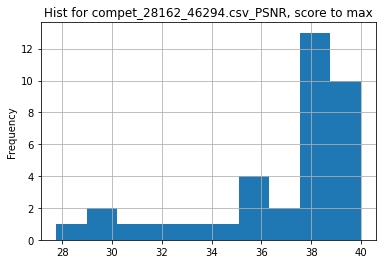

metric_column:  PSNR , score_function:  max
Utility w/mean =  1.087334704725623
Utility w/median =  1.047718994837932
___________________
28162_46295.csv
___________________
28176_46341.csv
___________________
28176_46342.csv
___________________
28176_46343.csv
___________________
28176_46344.csv
___________________
28190_46367.csv
       MinDCF       EER
0  0.0368 (1)  1.41 (2)
1  0.0406 (2)  1.36 (1)
2  0.0473 (3)  1.44 (3)


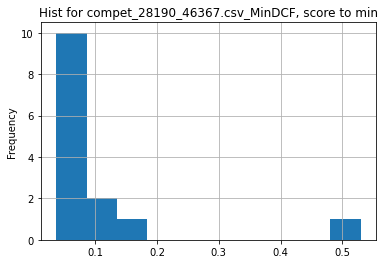

metric_column:  MinDCF , score_function:  min
Utility w/mean =  2.8674301242236027
Utility w/median =  1.9225543478260871
___________________
28190_46368.csv
       MinDCF       EER
0  0.0368 (1)  1.41 (2)
1  0.0406 (2)  1.36 (1)
2  0.0473 (3)  1.44 (3)


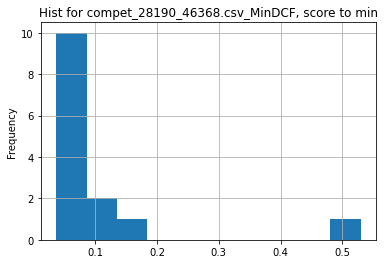

metric_column:  MinDCF , score_function:  min
Utility w/mean =  2.8511257763975157
Utility w/median =  1.8845108695652173
___________________
28269_46464.csv
       MinDCF       EER
0  0.0319 (1)  0.69 (2)
1  0.0322 (2)  0.62 (1)
2  0.0386 (3)  0.86 (4)


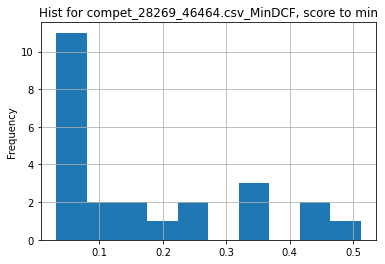

metric_column:  MinDCF , score_function:  min
Utility w/mean =  5.376436781609196
Utility w/median =  3.065830721003135
___________________
28269_46465.csv
       MinDCF       EER
0  0.0319 (1)  0.69 (2)
1  0.0322 (2)  0.62 (1)
2  0.0386 (3)  0.86 (4)


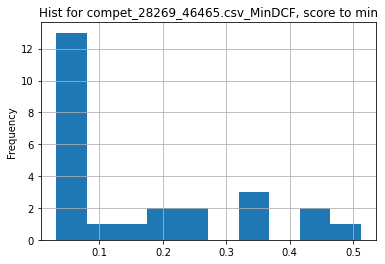

metric_column:  MinDCF , score_function:  min
Utility w/mean =  5.241880877742946
Utility w/median =  2.460815047021944
___________________
28340_46530.csv
___________________
28340_46531.csv
  RuSemShift1 (pre-Soviet:Soviet) RuSemShift2 (Soviet:post-Soviet)  \
0                       0.790 (2)                        0.804 (1)   
1                       0.806 (1)                        0.678 (2)   
2                       0.655 (5)                        0.615 (3)   

  RuSemShift3 (pre-Soviet:post-Soviet) Average score  
0                            0.881 (1)     0.825 (1)  
1                            0.776 (2)     0.753 (2)  
2                            0.729 (3)     0.666 (3)  


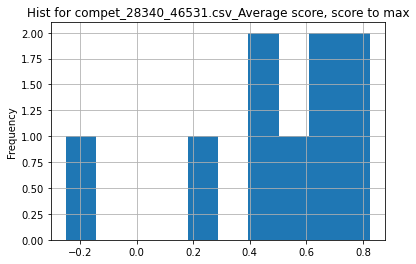

metric_column:  Average score , score_function:  max
Utility w/mean =  1.7388758782201406
Utility w/median =  1.6176470588235292
___________________
28340_46532.csv
  RuSemShift1 (pre-Soviet:Soviet) RuSemShift2 (Soviet:post-Soviet)  \
0                       0.781 (3)                        0.803 (1)   
1                       0.798 (1)                        0.773 (3)   
2                       0.794 (2)                        0.773 (3)   

  RuSemShift3 (pre-Soviet:post-Soviet) Average score  
0                            0.822 (1)     0.802 (1)  
1                            0.803 (2)     0.791 (2)  
2                            0.799 (3)     0.789 (3)  


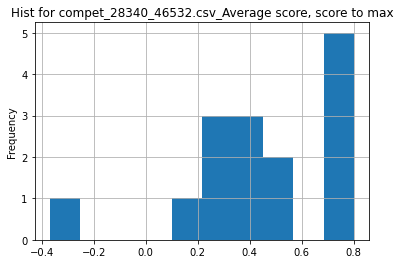

metric_column:  Average score , score_function:  max
Utility w/mean =  1.810111345170027
Utility w/median =  1.9232613908872904
___________________
28349_46545.csv
   Average F1      Max F1  Importance Mega Event Continuity Diversity Time  \
0  0.5660 (1)  0.8429 (1)  0.7500 (2)            0.8666 (1)     0.7505 (2)   
1  0.4723 (2)  0.6411 (2)  0.7745 (1)            0.6395 (2)     0.7750 (1)   
2  0.0275 (3)  0.0911 (3)  0.2543 (3)            0.1637 (3)     0.2265 (3)   

  Diversity Similarity Diversity Concept  
0           0.7496 (2)        0.7220 (2)  
1           0.7452 (3)        0.7442 (1)  
2           0.7974 (1)        0.2256 (3)  
File cannot be opened: 28349_46545.csv
___________________
28485_46732.csv
___________________
28485_46733.csv
___________________
28529_46759.csv
  Harmonic Mean       BLEU        PINC
0     0.133 (1)  0.101 (9)  0.535 (15)
1     0.114 (2)  0.105 (8)  0.409 (18)
2     0.110 (3)  0.121 (7)  0.342 (19)


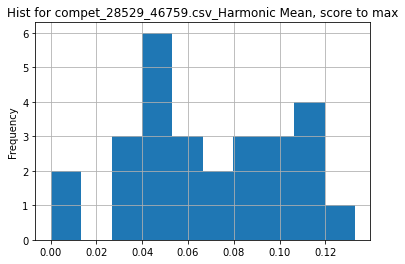

metric_column:  Harmonic Mean , score_function:  max
Utility w/mean =  1.9254691689008043
Utility w/median =  2.015151515151515
___________________
28609_46845.csv
         Score      Duration
0  98.8530 (1)  5172.04 (26)
1  98.3260 (2)  5146.09 (25)
2  97.8649 (3)    565.42 (9)


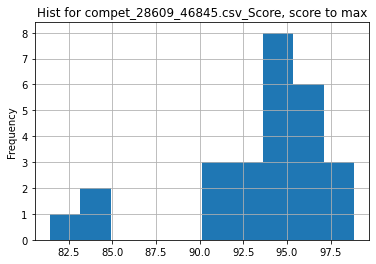

metric_column:  Score , score_function:  max
Utility w/mean =  1.0588543840703961
Utility w/median =  1.0485784158513514
___________________
28630_46859.csv
        correct
0  8.385320 (1)
1  8.330106 (2)
2  6.570827 (3)
File cannot be opened: 28630_46859.csv
___________________
28635_46867.csv
  Prediction score  Duration
0       0.3103 (1)  0.00 (1)
1       0.2560 (2)  0.00 (1)
2       0.2527 (3)  0.00 (1)


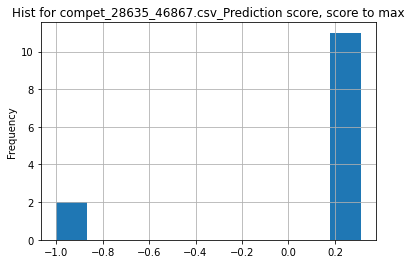

metric_column:  Prediction score , score_function:  max
Utility w/mean =  5.986791332739686
Utility w/median =  1.3473729917498916
___________________
28635_46868.csv
  Prediction score  Duration
0       0.3018 (1)  0.00 (1)
1       0.2486 (2)  0.00 (1)
2       0.2468 (3)  0.00 (1)


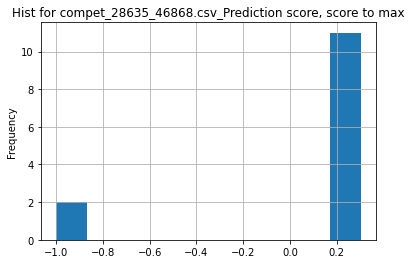

metric_column:  Prediction score , score_function:  max
Utility w/mean =  6.179555835564656
Utility w/median =  1.3236842105263158
___________________
28662_47020.csv
      muPSNR       PSNR Runtime per image [ms] CPU [1]/ GPU [0]  \
0  34.67 (1)  31.67 (1)              -1.00 (1)         0.00 (2)   
1  33.47 (2)  30.52 (4)               0.04 (2)         0.00 (2)   
2  33.41 (3)  31.08 (2)              -1.00 (1)         0.00 (2)   

  Extra Data [1] / No Extra Data [0]  
0                           0.00 (2)  
1                           0.00 (2)  
2                           0.00 (2)  


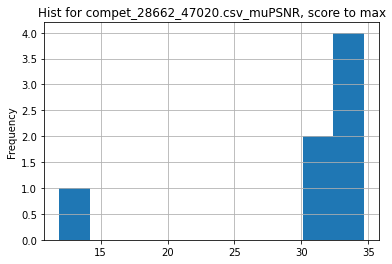

metric_column:  muPSNR , score_function:  max
Utility w/mean =  1.165266240937245
Utility w/median =  1.0608935128518973
___________________
28662_47021.csv
___________________
28673_47040.csv
  Prediction score  Duration
0       0.9988 (1)  0.00 (1)
1       0.9388 (2)  0.00 (1)
2       0.9351 (3)  0.00 (1)


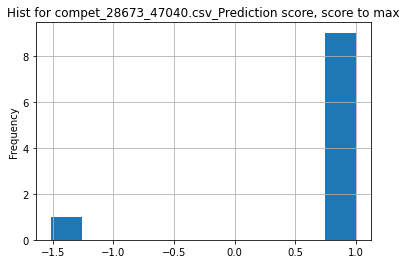

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.527544122595051
Utility w/median =  1.137585421412301
___________________
28673_47041.csv
  Prediction score  Duration
0       0.9990 (1)  0.00 (1)
1       0.9350 (2)  0.00 (1)
2       0.9292 (3)  0.00 (1)


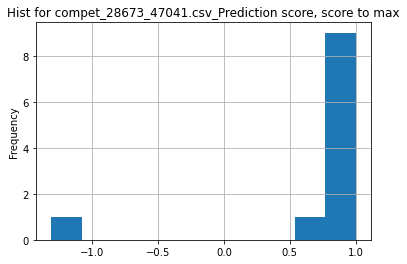

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.5423374363148956
Utility w/median =  1.1829484902309058
___________________
28679_47060.csv
___________________
28679_47061.csv
___________________
28679_47062.csv
___________________
28679_47063.csv
___________________
28679_47064.csv
  Micro precision   Micro recall Micro F1 score Macro precision  \
0   -1.000000 (1)  -1.000000 (1)  -1.000000 (1)    0.771667 (4)   
1   -1.000000 (1)  -1.000000 (1)  -1.000000 (1)    0.710000 (7)   
2   -1.000000 (1)  -1.000000 (1)  -1.000000 (1)   0.605000 (11)   

    Macro recall Macro F1 score Averaged precision Averaged recall  \
0   0.667147 (6)   0.715611 (1)      -1.000000 (1)   -1.000000 (1)   
1   0.720812 (1)   0.715365 (2)      -1.000000 (1)   -1.000000 (1)   
2  0.536189 (10)  0.568520 (10)      -1.000000 (1)   -1.000000 (1)   

  Averaged F1 score Mean Squared Error (MSE)  
0     -1.000000 (1)            -1.000000 (1)  
1     -1.000000 (1)            -1.000000 (1)

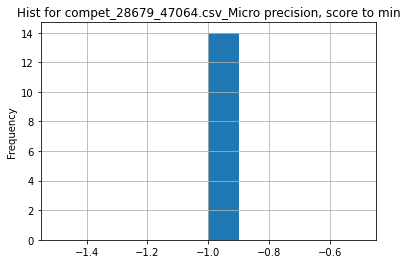

metric_column:  Micro precision , score_function:  min
Utility w/mean =  1.0
Utility w/median =  1.0
___________________
28679_47065.csv
___________________
28682_47066.csv
       Accuracy Macro averaged precision Macro averaged recall  \
0  0.783175 (1)             0.819878 (1)          0.783175 (1)   
1  0.708531 (2)             0.699947 (3)          0.708531 (2)   
2  0.703791 (3)             0.701750 (2)          0.703791 (3)   

  Macro averaged F1 score  
0            0.770175 (1)  
1            0.699542 (2)  
2            0.677825 (3)  


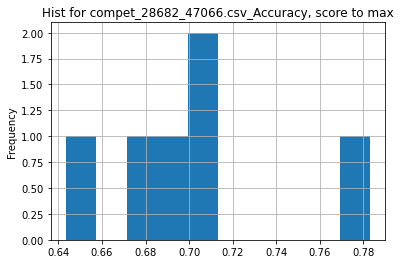

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.116239460391024
Utility w/median =  1.12414989909313
___________________
28682_47067.csv
       Accuracy Macro averaged precision Macro averaged recall  \
0  0.727657 (1)             0.709411 (1)          0.727657 (1)   
1  0.722222 (2)             0.704695 (2)          0.722222 (2)   
2  0.712560 (3)             0.704496 (3)          0.712560 (3)   

  Macro averaged F1 score  
0            0.717028 (1)  
1            0.711373 (2)  
2            0.705432 (3)  


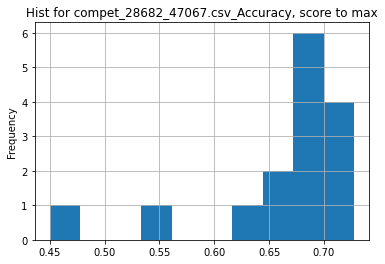

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1036819582156536
Utility w/median =  1.0663719083718879
___________________
28713_47100.csv
File cannot be opened: 28713_47100.csv
___________________
28713_47101.csv
___________________
28713_47102.csv
File cannot be opened: 28713_47102.csv
___________________
28757_47182.csv
       Score
0  0.198 (1)
1  0.160 (2)
2  0.154 (3)


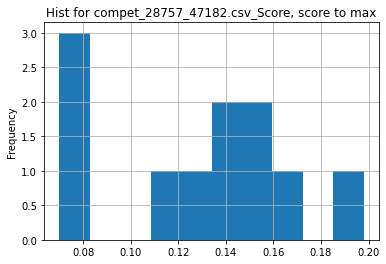

metric_column:  Score , score_function:  max
Utility w/mean =  1.5635319454414927
Utility w/median =  1.4244604316546763
___________________
28766_47369.csv
      F1    P    R
0  - (-)  NaN  NaN
1  - (-)  NaN  NaN
2  - (-)  NaN  NaN
File cannot be opened: 28766_47369.csv
___________________
28766_47370.csv
___________________
28766_47371.csv
      F1    P    R
0  - (-)  NaN  NaN
1  - (-)  NaN  NaN
2  - (-)  NaN  NaN
File cannot be opened: 28766_47371.csv
___________________
28766_47372.csv
      F1    P    R
0  - (-)  NaN  NaN
1  - (-)  NaN  NaN
2  - (-)  NaN  NaN
File cannot be opened: 28766_47372.csv
___________________
28766_47373.csv
___________________
28766_47374.csv
      F1    P    R
0  - (-)  NaN  NaN
1  - (-)  NaN  NaN
2  - (-)  NaN  NaN
File cannot be opened: 28766_47374.csv
___________________
28766_47375.csv
      F1    P    R
0  - (-)  NaN  NaN
1     F1    P    R
2  - (-)  NaN  NaN
File cannot be opened: 28766_47375.csv
___________________
28766_47376.csv
________________

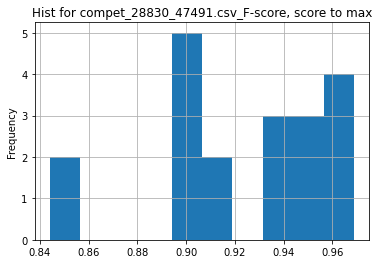

metric_column:  F-score , score_function:  max
Utility w/mean =  1.049298985523766
Utility w/median =  1.0330490405117272
___________________
28885_47546.csv
        correct
0  0.900000 (1)
1  0.900000 (1)
2  0.900000 (1)


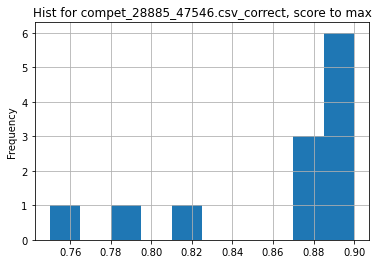

metric_column:  correct , score_function:  max
Utility w/mean =  1.0434782608695654
Utility w/median =  1.0169491525423728
___________________
28890_47556.csv
     wer (%)
0  25.69 (1)
1  29.27 (2)
2  29.74 (3)


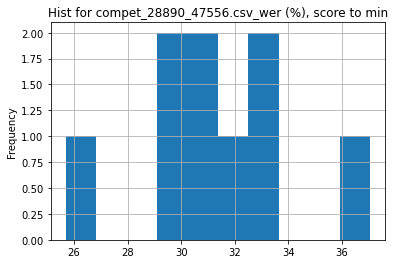

metric_column:  wer (%) , score_function:  min
Utility w/mean =  1.2236927468535097
Utility w/median =  1.2207084468664848
___________________
28890_47557.csv
     wer (%)
0  23.98 (1)
1  29.08 (2)
2  29.58 (3)


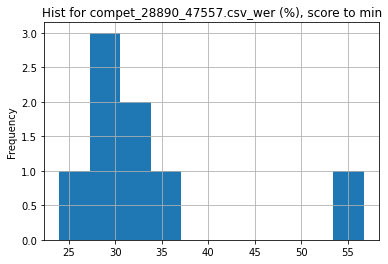

metric_column:  wer (%) , score_function:  min
Utility w/mean =  1.4066409507923268
Utility w/median =  1.2560467055879898
___________________
28890_47558.csv
     wer (%)
0  23.50 (1)
1  38.55 (2)
2  39.98 (3)


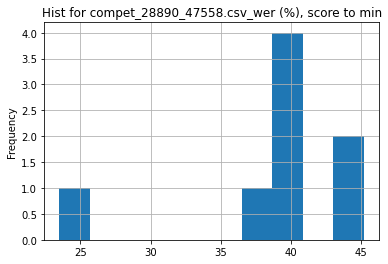

metric_column:  wer (%) , score_function:  min
Utility w/mean =  1.6571808510638295
Utility w/median =  1.7138297872340424
___________________
28890_47559.csv
     wer (%)
0  23.50 (1)
1  39.98 (2)
2  40.27 (3)


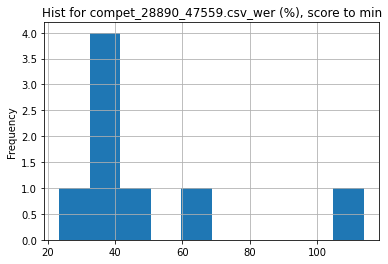

metric_column:  wer (%) , score_function:  min
Utility w/mean =  2.183031914893617
Utility w/median =  1.7353191489361703
___________________
28894_47560.csv
  IoU (moving) Recall (moving)
0    0.805 (1)           - (2)
1    0.759 (2)           - (2)
2    0.749 (3)           - (2)
File cannot be opened: 28894_47560.csv
___________________
28930_47605.csv
___________________
28930_47606.csv
___________________
28930_47607.csv
  Gaze Error Gaze Error Standard Deviation
0   2.54 (1)                      2.11 (1)
1   3.08 (2)                      2.22 (3)
2   3.21 (3)                      2.51 (7)


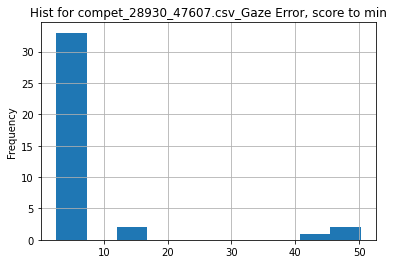

metric_column:  Gaze Error , score_function:  min
Utility w/mean =  3.2277248238707004
Utility w/median =  1.718503937007874
___________________
28930_47608.csv
  Gaze Error Gaze Error Standard Deviation
0   3.11 (1)                      2.21 (1)
1   3.19 (2)                      2.26 (2)
2   3.30 (3)                      2.30 (4)


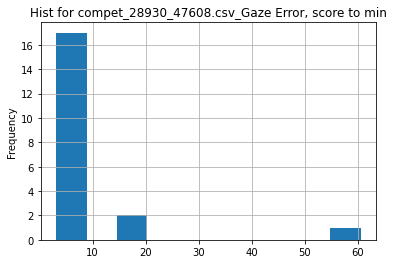

metric_column:  Gaze Error , score_function:  min
Utility w/mean =  2.564790996784566
Utility w/median =  1.2909967845659167
___________________
28954_47624.csv
  Gaze Direction Angular Error / deg Point-of-Gaze Euclidean Error / px  \
0                           1.95 (1)                           75.2 (1)   
1                           2.12 (2)                           81.2 (2)   
2                           2.37 (3)                           91.4 (3)   

  Point-of-Gaze Euclidean Error / cm Pupil Size Mean Absolute Error / mm  
0                           2.17 (1)                            2.74 (4)  
1                           2.34 (2)                            0.25 (1)  
2                           2.63 (3)                            0.29 (3)  


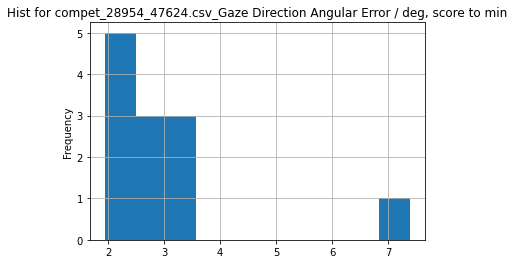

metric_column:  Gaze Direction Angular Error / deg , score_function:  min
Utility w/mean =  1.5555555555555556
Utility w/median =  1.3384615384615386
___________________
28954_47625.csv
  Gaze Direction Angular Error / deg Point-of-Gaze Euclidean Error / px  \
0                           1.95 (1)                           75.0 (1)   
1                           2.12 (2)                           81.2 (2)   
2                           2.37 (3)                           91.4 (3)   

  Point-of-Gaze Euclidean Error / cm Pupil Size Mean Absolute Error / mm  
0                           2.16 (1)                            2.74 (5)  
1                           2.34 (2)                            0.25 (1)  
2                           2.63 (3)                            0.29 (3)  


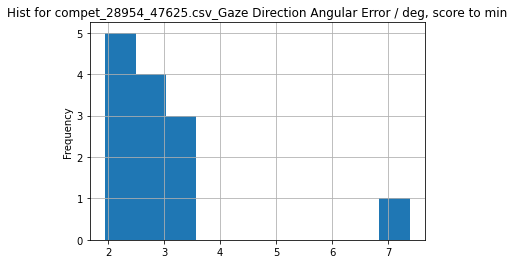

metric_column:  Gaze Direction Angular Error / deg , score_function:  min
Utility w/mean =  1.5443786982248522
Utility w/median =  1.3743589743589744
___________________
28987_47653.csv
___________________
28987_47654.csv
     Overall     J_seen   J_unseen     F_seen   F_unseen
0  0.856 (1)  0.836 (1)  0.811 (2)  0.888 (1)  0.889 (2)
1  0.854 (2)  0.828 (2)  0.814 (1)  0.883 (2)  0.893 (1)
2  0.842 (3)  0.816 (4)  0.799 (3)  0.870 (4)  0.881 (3)


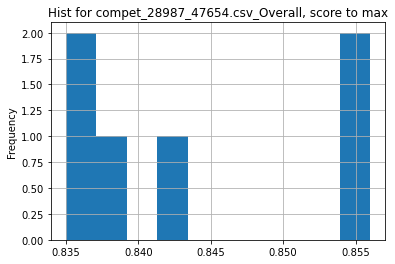

metric_column:  Overall , score_function:  max
Utility w/mean =  1.0146187277755827
Utility w/median =  1.0184414039262344
___________________
28988_47655.csv
         mAP       AP50       AP75        AR1       AR10
0  0.583 (1)  0.811 (1)  0.642 (3)  0.482 (1)  0.627 (3)
1  0.582 (2)  0.807 (3)  0.645 (2)  0.465 (6)  0.628 (2)
2  0.577 (3)  0.808 (2)  0.625 (5)  0.480 (2)  0.632 (1)


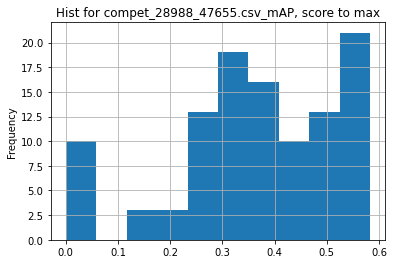

metric_column:  mAP , score_function:  max
Utility w/mean =  1.5998983610722914
Utility w/median =  1.5423280423280423
___________________
28988_47656.csv
         mAP       AP50       AP75        AR1       AR10
0  0.541 (1)  0.742 (2)  0.616 (1)  0.433 (2)  0.589 (2)
1  0.523 (2)  0.767 (1)  0.577 (2)  0.439 (1)  0.570 (3)
2  0.491 (3)  0.681 (5)  0.545 (3)  0.410 (5)  0.550 (4)


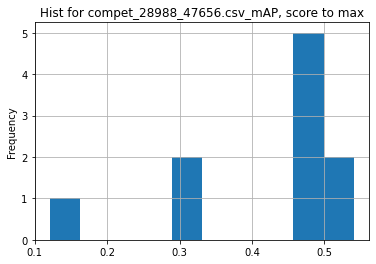

metric_column:  mAP , score_function:  max
Utility w/mean =  1.286257727056586
Utility w/median =  1.1401475237091676
___________________
28996_47667.csv
  Prediction score  Duration
0       0.8510 (1)  0.00 (1)
1       0.8450 (2)  0.00 (1)
2       0.8430 (3)  0.00 (1)


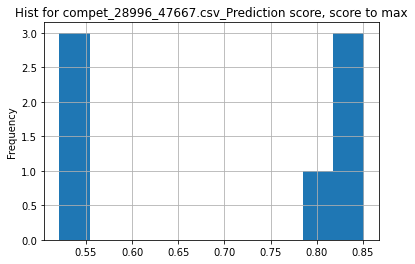

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.206285563858008
Utility w/median =  1.0610972568578552
___________________
28996_47668.csv
  Prediction score  Duration
0       0.8346 (1)  0.00 (1)
1       0.7940 (2)  0.00 (1)
2       0.7914 (3)  0.00 (1)
File cannot be opened: 28996_47668.csv
___________________
29037_47726.csv
            SARI
0  40.233195 (1)
1  38.870274 (2)
2  38.843893 (3)


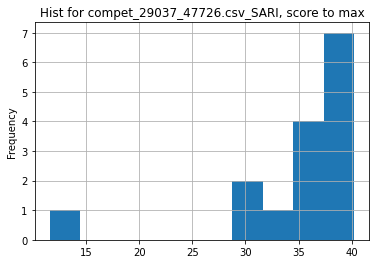

metric_column:  SARI , score_function:  max
Utility w/mean =  1.1550703839630037
Utility w/median =  1.0850168456860723
___________________
29037_47727.csv
            SARI
0  39.745632 (1)
1  39.689777 (2)
2  39.374682 (3)


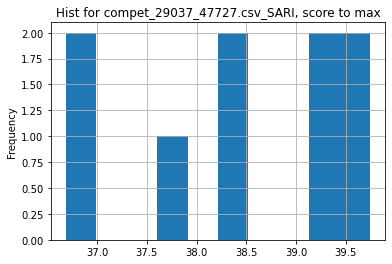

metric_column:  SARI , score_function:  max
Utility w/mean =  1.0330742215889084
Utility w/median =  1.0325944712791189
___________________
29097_47828.csv
    ROC AUC Precision    Recall Average Precision    Duration
0  0.09 (3)  0.09 (3)  0.11 (3)          0.41 (2)  392.44 (1)
1  0.02 (4)  0.03 (5)  0.03 (5)          0.32 (4)  169.20 (2)
2  0.46 (1)  0.45 (1)  1.00 (1)          0.44 (1)  150.16 (3)


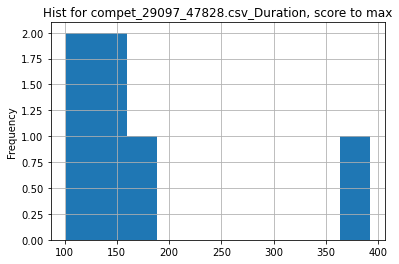

metric_column:  Duration , score_function:  max
Utility w/mean =  2.1735405974227375
Utility w/median =  2.6570074475287746
___________________
29097_47829.csv
___________________
29097_47830.csv
___________________
29119_47871.csv
  Prediction score  Duration
0     155.2190 (1)  0.00 (1)
1     129.8270 (2)  0.00 (1)
2     125.8572 (3)  0.00 (1)


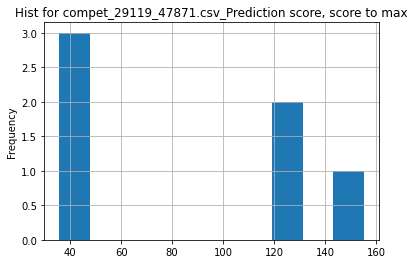

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.7969564302983179
Utility w/median =  1.9190689698445087
___________________
29119_47872.csv
___________________
29139_47907.csv
     Overall          J          F
0  0.655 (1)  0.636 (1)  0.674 (1)
1  0.649 (2)  0.628 (2)  0.670 (2)
2  0.624 (3)  0.608 (3)  0.640 (3)


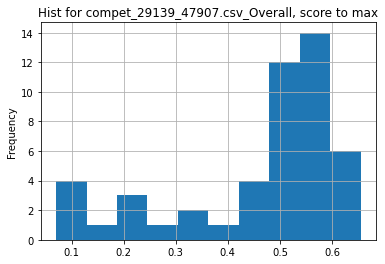

metric_column:  Overall , score_function:  max
Utility w/mean =  1.427015250544662
Utility w/median =  1.2693798449612403
___________________
29139_47908.csv
___________________
29216_48020.csv
  Generic spans Named entities
0   0.98013 (1)    0.98115 (2)
1   0.97907 (2)    0.98150 (1)
2   0.97575 (3)    0.97923 (3)


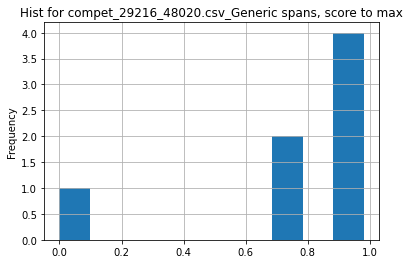

metric_column:  Generic spans , score_function:  max
Utility w/mean =  1.2598881676200269
Utility w/median =  1.0161842159830796
___________________
29220_48030.csv
___________________
29220_48031.csv
     Accuracy
0  0.8567 (1)
1  0.8563 (2)
2  0.8431 (3)


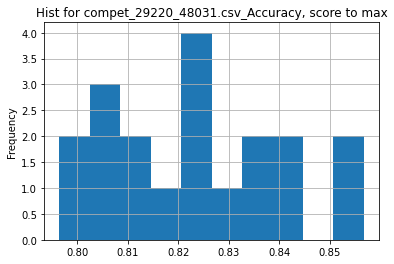

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0414272735415682
Utility w/median =  1.0419605935295548
___________________
29220_48032.csv
     Accuracy
0  0.8563 (1)
1  0.8468 (2)
2  0.8290 (3)


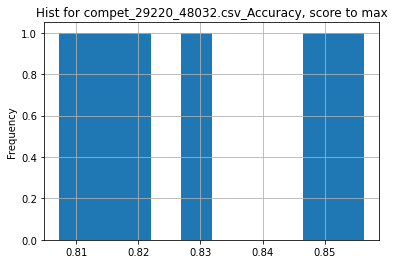

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0327028602440151
Utility w/median =  1.0383799187534104
___________________
29228_48047.csv
___________________
29228_48048.csv
___________________
29228_48049.csv
___________________
29410_48249.csv
           mIoU
0  0.115289 (1)
1  0.109217 (2)
2  0.106833 (3)


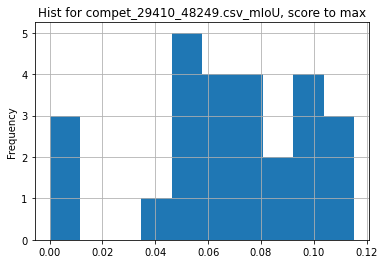

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.7211344562905664
Utility w/median =  1.6979109137635215
___________________
29410_48250.csv
           mIoU
0  0.111559 (1)
1  0.110053 (2)
2  0.107559 (3)


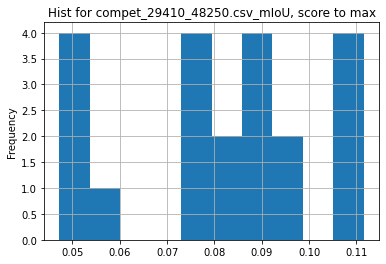

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.3726645842964444
Utility w/median =  1.3060209086971284
___________________
29425_48268.csv
___________________
29425_48269.csv
___________________
29479_48329.csv
    Accuracy
0  0.860 (1)
1  0.832 (2)
2  0.818 (3)


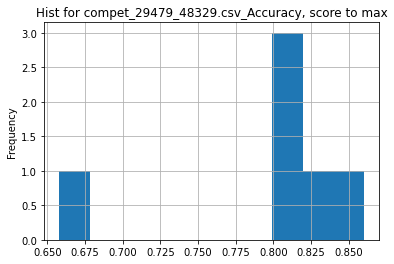

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0774692002505744
Utility w/median =  1.0545677498467199
___________________
29503_48366.csv
   Similarity   Precision      Recall    F1-Score
0  0.5906 (1)  0.6015 (3)  0.2651 (1)  0.3680 (1)
1  0.5400 (2)  0.5127 (4)  0.1740 (5)  0.2598 (5)
2  0.5159 (3)  0.5102 (5)  0.1714 (6)  0.2567 (6)


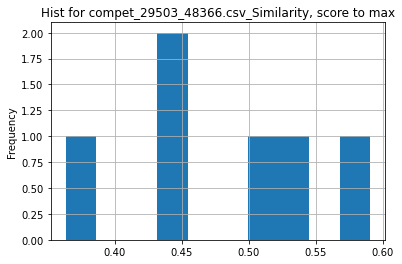

metric_column:  Similarity , score_function:  max
Utility w/mean =  1.2276034088547079
Utility w/median =  1.2373769117955165
___________________
29503_48367.csv
___________________
29545_48420.csv
           F1
0  0.8498 (1)
1  0.8497 (2)
2  0.8198 (3)
File cannot be opened: 29545_48420.csv
___________________
29545_48421.csv
           F1
0  0.7666 (1)
1  0.7548 (2)
2  0.7514 (3)


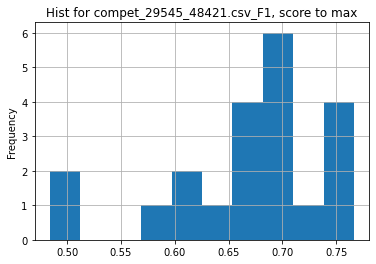

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1495715509854323
Utility w/median =  1.1183078045222465
___________________
29552_48433.csv
    correct
0  81.4 (1)
1  68.2 (2)
2  66.8 (3)


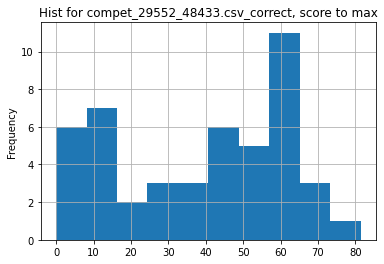

metric_column:  correct , score_function:  max
Utility w/mean =  2.0922016843486824
Utility w/median =  1.789010989010989
___________________
29552_48434.csv
    correct
0  83.9 (1)
1  79.9 (2)
2  71.3 (3)


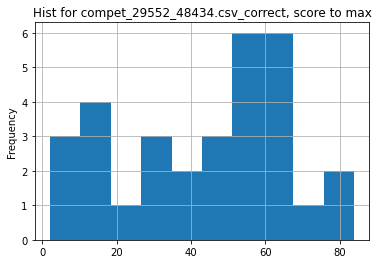

metric_column:  correct , score_function:  max
Utility w/mean =  1.9399567390169308
Utility w/median =  1.6483300589390963
___________________
29560_48437.csv
  Prediction score  Duration
0       0.9205 (1)  0.00 (1)
1       0.9160 (2)  0.00 (1)
2       0.9115 (3)  0.00 (1)


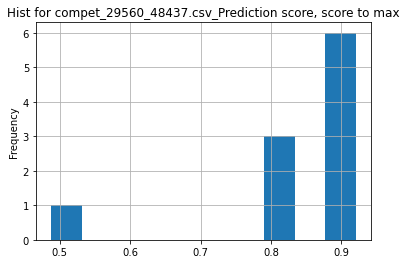

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.1050420168067228
Utility w/median =  1.0322399775721895
___________________
29560_48438.csv
  Prediction score  Duration
0       0.9345 (1)  0.00 (1)
1       0.9285 (2)  0.00 (1)
2       0.9170 (3)  0.00 (1)


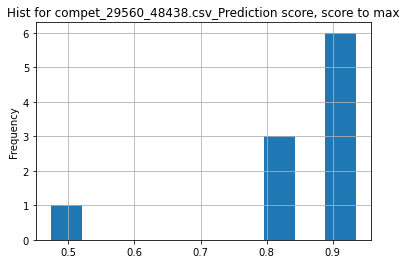

metric_column:  Prediction score , score_function:  max
Utility w/mean =  1.1096597993231607
Utility w/median =  1.0380449875034712
___________________
29583_48493.csv
___________________
29583_48495.csv
  Score (C/D) ExecutionTime
0  0.9823 (1)     29.00 (2)
1  0.9759 (2)     40.00 (4)
2  0.9484 (3)     47.00 (5)


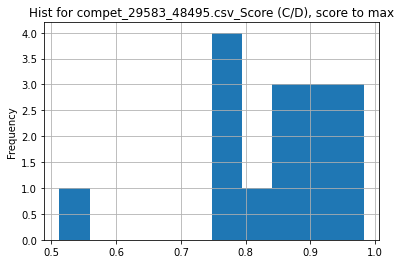

metric_column:  Score (C/D) , score_function:  max
Utility w/mean =  1.166793367225733
Utility w/median =  1.1517176691288544
___________________
29583_48497.csv
  Score (C/D) ExecutionTime
0  2.5790 (1)    205.00 (2)
1  2.5497 (2)    220.00 (7)
2  2.5188 (3)    219.00 (6)


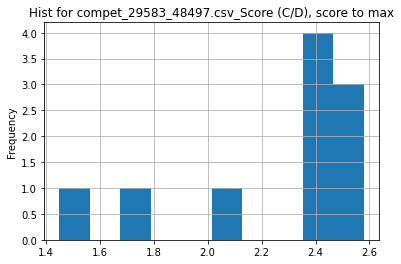

metric_column:  Score (C/D) , score_function:  max
Utility w/mean =  1.1441271981970793
Utility w/median =  1.079440817009878
___________________
29583_48499.csv
  Score (C/D) ExecutionTime
0  0.8492 (1)   216.00 (23)
1  0.8402 (2)   204.00 (22)
2  0.8280 (3)     77.00 (8)


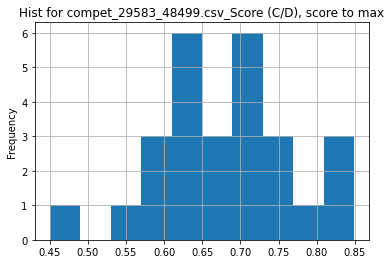

metric_column:  Score (C/D) , score_function:  max
Utility w/mean =  1.2435877270533104
Utility w/median =  1.2466236054022313
___________________
29583_48502.csv
  Score (C/D) ExecutionTime
0  2.8341 (1)    371.00 (3)
1  2.7938 (2)    373.00 (5)
2  2.7311 (3)   394.00 (10)


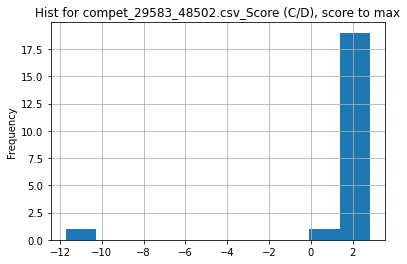

metric_column:  Score (C/D) , score_function:  max
Utility w/mean =  1.8304648430531885
Utility w/median =  1.2332898172323759
___________________
29583_48503.csv
  Score (C/D) ExecutionTime
0  0.9425 (1)   438.00 (25)
1  0.9401 (2)    144.00 (6)
2  0.9152 (3)   286.00 (18)


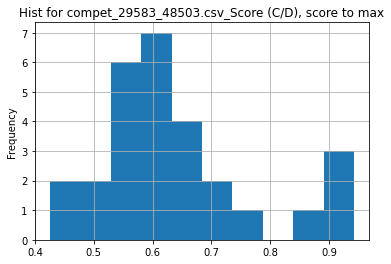

metric_column:  Score (C/D) , score_function:  max
Utility w/mean =  1.476330599594974
Utility w/median =  1.582305044908923
___________________
29640_48609.csv
    Test AUC Avg. Val. AUC Test Spec. Test Sens.
0  87.07 (1)     99.97 (2)  83.33 (1)  80.49 (3)
1  85.43 (2)    76.29 (11)  82.29 (2)  80.49 (3)
2  85.35 (3)    76.45 (10)  71.88 (6)  80.49 (3)


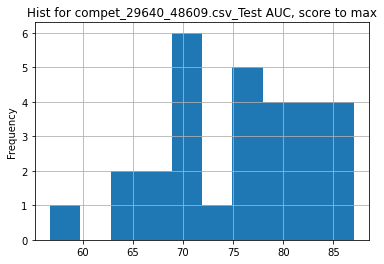

metric_column:  Test AUC , score_function:  max
Utility w/mean =  1.15145172396496
Utility w/median =  1.1410038002882976
___________________
29703_48684.csv
  Total Score          F1       BLEU1       BLEU4
0   39.62 (1)  54.57 (23)  43.35 (17)  20.95 (11)
1   32.43 (2)  23.67 (21)  47.90 (22)  25.73 (22)
2   32.09 (3)  18.07 (13)  49.66 (23)  28.53 (23)


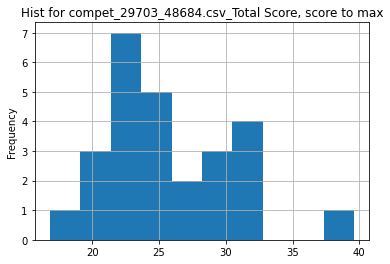

metric_column:  Total Score , score_function:  max
Utility w/mean =  1.5397447012047472
Utility w/median =  1.6439834024896263
___________________
29706_48688.csv
  Total Score Diagnosis Acc Symptom Acc Symptom Rec  Symptom F1
0   77.32 (1)    89.54 (56)  17.23 (33)  81.29 (57)  28.44 (38)
1   77.21 (2)    86.19 (54)  30.19 (53)  65.23 (44)  41.28 (60)
2   77.05 (3)    86.19 (54)  28.15 (51)  72.19 (52)  40.50 (58)


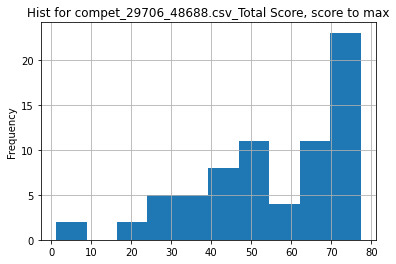

metric_column:  Total Score , score_function:  max
Utility w/mean =  1.3960369854235113
Utility w/median =  1.261337683523654
___________________
29815_48835.csv
___________________
29815_48836.csv
___________________
29849_48869.csv
___________________
29853_48874.csv
  Overall Score Dataset 0 Score Dataset 1 Score Dataset 2 Score
0      6.29 (1)        3.07 (1)        2.20 (1)        1.02 (2)
1      3.25 (2)        0.47 (6)        0.70 (4)        2.08 (1)
2      2.34 (3)        2.45 (2)        1.12 (3)      -1.23 (11)


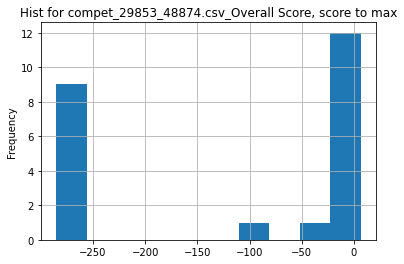

metric_column:  Overall Score , score_function:  max
Utility w/mean =  -0.053661178268465386
Utility w/median =  -0.2780725022104332
___________________
29853_48875.csv
  Overall Score Dataset 0 Score Dataset 1 Score Dataset 2 Score
0      8.90 (1)        4.12 (2)        4.42 (1)        0.36 (6)
1      6.18 (2)        2.36 (5)        3.47 (2)        0.36 (6)
2      5.95 (3)        4.33 (1)        0.06 (9)        1.56 (1)


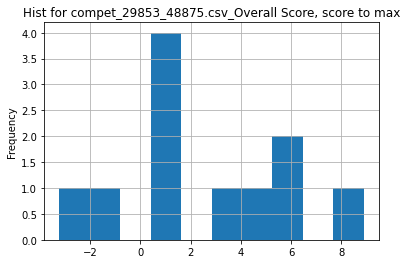

metric_column:  Overall Score , score_function:  max
Utility w/mean =  3.4569209039548023
Utility w/median =  7.672413793103449
___________________
29905_48941.csv
___________________
29992_49107.csv
___________________
30003_49131.csv
   Sum of Losses Performance loss   Privacy loss
0  -0.244740 (1)     0.383511 (4)  -0.628251 (5)
1  -0.238636 (2)     0.373696 (3)  -0.612332 (8)
2  -0.234198 (3)     0.369248 (2)  -0.603446 (9)


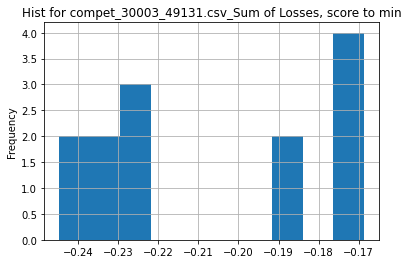

metric_column:  Sum of Losses , score_function:  min
Utility w/mean =  0.8402115903219114
Utility w/median =  0.9128381139168096
___________________
30003_49132.csv
   Sum of Losses Performance loss   Privacy loss
0  -0.239244 (1)     0.390008 (4)  -0.629252 (5)
1  -0.230669 (2)     0.370521 (1)  -0.601191 (9)
2  -0.229245 (3)     0.373691 (3)  -0.602935 (8)


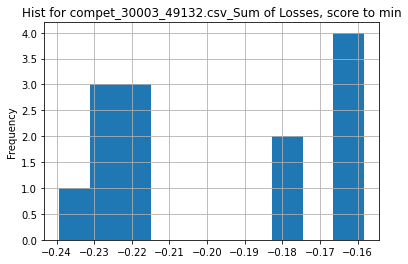

metric_column:  Sum of Losses , score_function:  min
Utility w/mean =  0.8239451065728841
Utility w/median =  0.9077636220762068
___________________
30008_49143.csv
___________________
30090_49281.csv
  Task 1 Score Task 2 Score Task 3 Score Task 4 Score
0   0.8278 (1)   0.6262 (1)   0.2760 (1)   0.3389 (1)
1   0.8024 (2)   0.7506 (8)   0.2071 (3)   0.3310 (2)
2   0.8020 (3)   0.6615 (3)   0.1916 (4)   0.0731 (5)
File cannot be opened: 30090_49281.csv
___________________
30090_49282.csv
___________________
30090_49283.csv
  Task 1 Score Task 2 Score Task 3 Score Task 4 Score
0   0.8850 (1)   0.6296 (2)   0.2916 (1)   0.3578 (1)
1   0.8775 (2)        - (5)        - (5)        - (5)
2   0.8705 (3)        - (5)        - (5)        - (5)
File cannot be opened: 30090_49283.csv
___________________
30111_49301.csv
___________________
30123_49309.csv
     mAR@10    mAP@10   Prec@10  mAR@10.1  mAP@10.1 Prec@10.1  mAR@10.2  \
0  0.33 (1)  0.86 (1)  0.80 (1)  0.32 (1)  0.87 (1)  0.84 (1)  0.36 (1

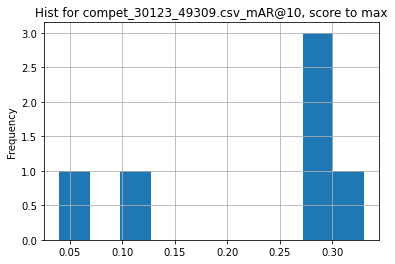

metric_column:  mAR@10 , score_function:  max
Utility w/mean =  1.4347826086956523
Utility w/median =  1.1186440677966103
___________________
30290_49507.csv
      Overall        MIoU    Accuracy          F1
0  0.8124 (1)  0.7380 (1)  0.9820 (1)  0.9900 (1)
1  0.7988 (2)  0.7261 (2)  0.9600 (5)  0.9770 (5)
2  0.7887 (3)  0.7156 (4)  0.9490 (9)  0.9700 (9)


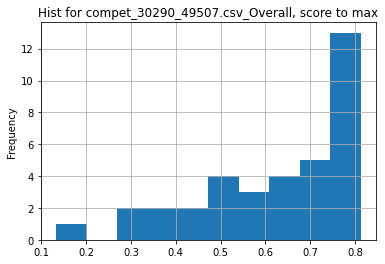

metric_column:  Overall , score_function:  max
Utility w/mean =  1.3127811043980215
Utility w/median =  1.2162587019986526
___________________
30290_49508.csv
      Overall        MIoU    Accuracy          F1
0  0.8240 (1)  0.7570 (1)  0.9750 (2)  0.9860 (2)
1  0.8084 (2)  0.7308 (2)  0.9870 (1)  0.9920 (1)
2  0.8010 (3)  0.7249 (3)  0.9730 (3)  0.9840 (3)


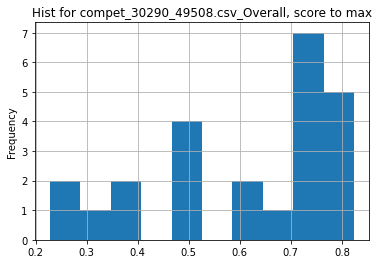

metric_column:  Overall , score_function:  max
Utility w/mean =  1.3460020146470282
Utility w/median =  1.2053832650672909
___________________
30309_49543.csv
___________________
30309_49544.csv
     F1 Score   Precision      Recall
0  0.8363 (1)  0.8191 (3)  0.8542 (5)
1  0.8309 (2)  0.8477 (2)  0.8148 (7)
2  0.8114 (3)  0.7466 (5)  0.8885 (1)


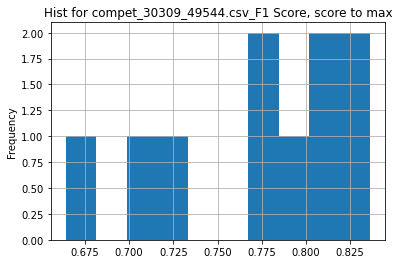

metric_column:  F1 Score , score_function:  max
Utility w/mean =  1.080100222141861
Utility w/median =  1.058205744653929
___________________
30312_49548.csv
File cannot be opened: 30312_49548.csv
___________________
30312_49549.csv
File cannot be opened: 30312_49549.csv
___________________
30312_49550.csv
File cannot be opened: 30312_49550.csv
___________________
30312_49551.csv
File cannot be opened: 30312_49551.csv
___________________
30312_49552.csv
File cannot be opened: 30312_49552.csv
___________________
30312_49553.csv
File cannot be opened: 30312_49553.csv
___________________
30312_49554.csv
File cannot be opened: 30312_49554.csv
___________________
30312_49555.csv
File cannot be opened: 30312_49555.csv
___________________
30320_49565.csv
       Accuracy
0  0.834629 (1)
1  0.821201 (2)
2  0.821201 (2)


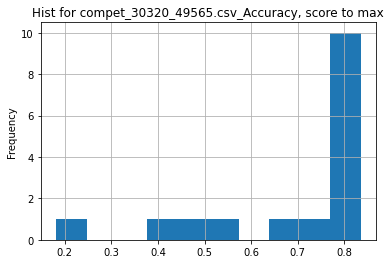

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1942865191776688
Utility w/median =  1.0423650598783325
___________________
30320_49566.csv
       Accuracy
0  0.836249 (1)
1  0.835549 (2)
2  0.812456 (3)


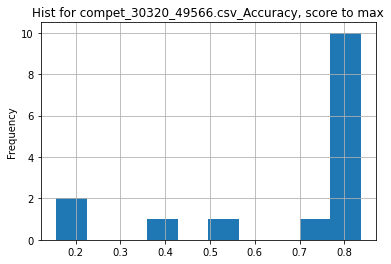

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.2422897476248531
Utility w/median =  1.0482450257658622
___________________
30333_49589.csv
          F1  Precision     Recall
0  0.986 (1)  0.995 (1)  0.977 (1)
1  0.855 (2)  0.965 (2)  0.768 (3)
2  0.697 (3)  0.579 (4)  0.876 (2)
File cannot be opened: 30333_49589.csv
___________________
30375_49641.csv
          EIoU         mIoU
0  49.0900 (1)  79.3800 (2)
1  47.1000 (2)  78.7600 (3)
2  45.3300 (3)  78.6800 (4)


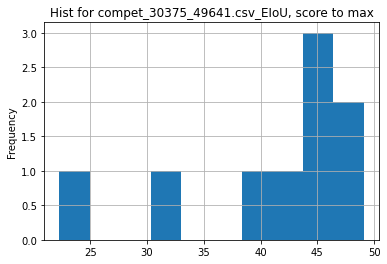

metric_column:  EIoU , score_function:  max
Utility w/mean =  1.2029241995208018
Utility w/median =  1.1031460674157305
___________________
30375_49642.csv
          EIoU         mIoU
0  48.2900 (1)  79.3200 (1)
1  46.2400 (2)  77.4900 (2)
2  43.8700 (3)  76.7200 (3)


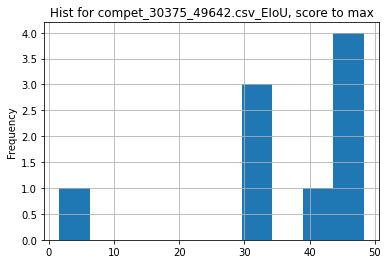

metric_column:  EIoU , score_function:  max
Utility w/mean =  1.3823912974331245
Utility w/median =  1.1952970297029704
___________________
30429_49719.csv
      Avg. IOU Avg. IOU of aguadas Avg. IOU of platforms Avg. IOU of buildings
0  0.82970 (1)         0.99266 (4)           0.75167 (1)           0.74478 (2)
1  0.82732 (2)         0.99419 (1)           0.74944 (2)           0.73834 (3)
2  0.82580 (3)         0.99406 (2)           0.74674 (3)           0.73659 (5)


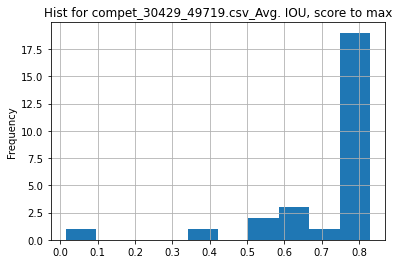

metric_column:  Avg. IOU , score_function:  max
Utility w/mean =  1.1642370476621087
Utility w/median =  1.066850111223978
___________________
30440_49729.csv
    IOU Score
0  0.7010 (1)
1  0.4811 (2)
2  0.4766 (3)


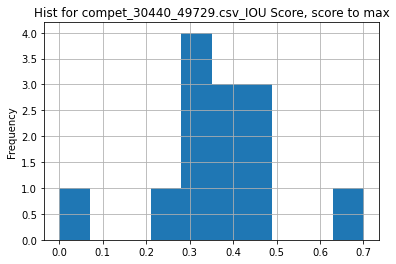

metric_column:  IOU Score , score_function:  max
Utility w/mean =  1.8927451346916735
Utility w/median =  1.8653539116551354
___________________
30440_49730.csv
    IOU Score
0  0.7681 (1)
1  0.7654 (2)
2  0.7506 (3)


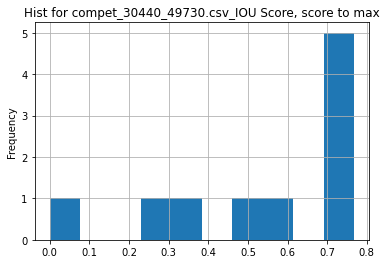

metric_column:  IOU Score , score_function:  max
Utility w/mean =  1.3999307416115332
Utility w/median =  1.1838779284833538
___________________
30441_49731.csv
           mIoU
0  0.268386 (1)
1  0.257462 (2)
2  0.248503 (3)


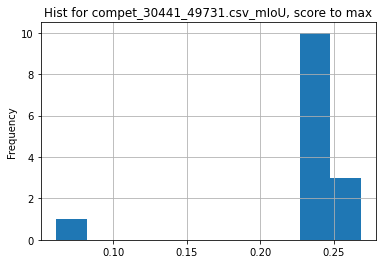

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.181402318720462
Utility w/median =  1.135736955693792
___________________
30441_49732.csv
           mIoU
0  0.242315 (1)
1  0.238789 (2)
2  0.229976 (3)


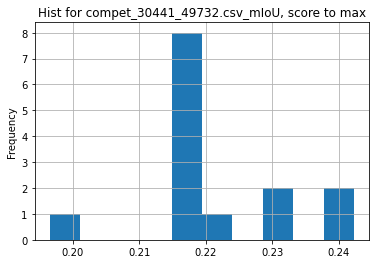

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.0974826622255047
Utility w/median =  1.1159236079449948
___________________
30446_49735.csv
___________________
30446_49736.csv
       BLEU
0  29.0 (1)
1  26.7 (2)
2  21.8 (3)


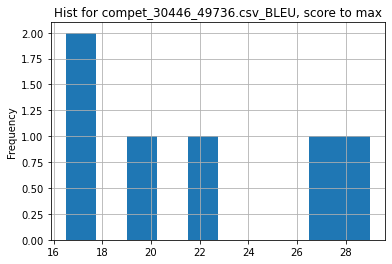

metric_column:  BLEU , score_function:  max
Utility w/mean =  1.3343558282208587
Utility w/median =  1.4146341463414633
___________________
30446_49737.csv
___________________
30452_49748.csv
     F1 Score    Precision      Recall
0  0.8172 (1)   0.8403 (1)  0.7954 (1)
1  0.7455 (2)   0.7898 (2)  0.7060 (3)
2  0.6718 (3)  0.6110 (10)  0.7462 (2)


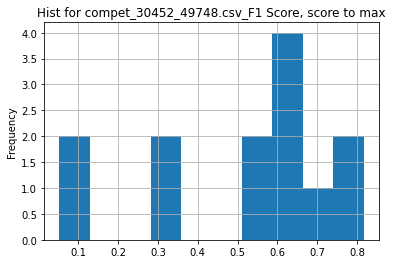

metric_column:  F1 Score , score_function:  max
Utility w/mean =  1.6312629558541267
Utility w/median =  1.3438579181055748
___________________
30452_49749.csv
     F1 Score   Precision      Recall
0  0.8368 (1)  0.8368 (4)  0.8369 (5)
1  0.8354 (2)  0.8130 (7)  0.8592 (3)
2  0.8330 (3)  0.8379 (3)  0.8283 (7)


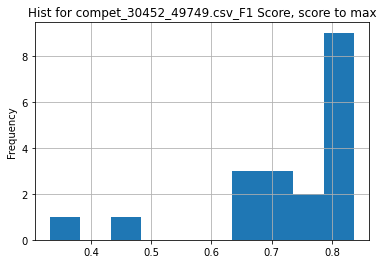

metric_column:  F1 Score , score_function:  max
Utility w/mean =  1.1473850572638902
Utility w/median =  1.070898387509598
___________________
30454_49755.csv
___________________
30454_49756.csv
___________________
30517_49868.csv
      Accuracy
0  73.4504 (1)
1  73.3457 (2)
2  73.2643 (3)


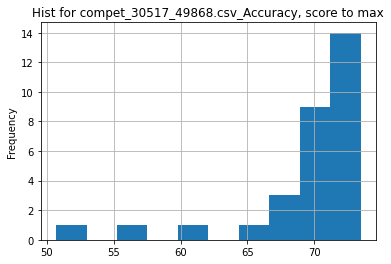

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0566055541042396
Utility w/median =  1.0354949378036773
___________________
30517_49869.csv
      Accuracy
0  73.6248 (1)
1  73.3690 (2)
2  73.3690 (2)


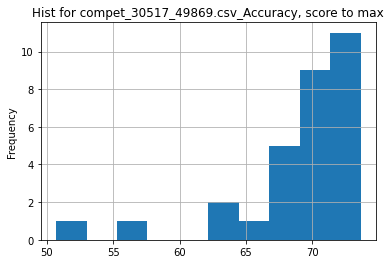

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0664047902526352
Utility w/median =  1.044373771217335
___________________
30517_49870.csv
      Accuracy
0  78.5091 (1)
1  76.5554 (2)
2  75.3111 (3)


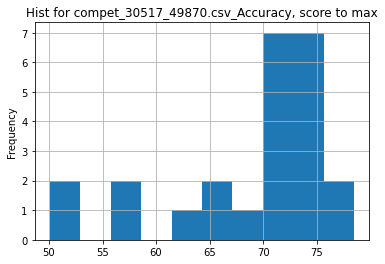

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.137872410734473
Utility w/median =  1.0954959405068139
___________________
30517_49871.csv
      Accuracy
0  89.4406 (1)
1  86.7194 (2)
2  86.1961 (3)


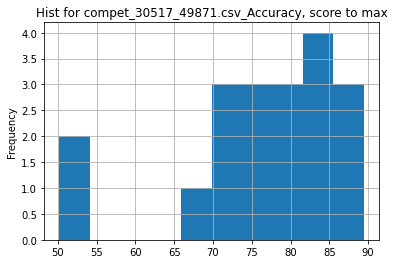

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1743301509883397
Utility w/median =  1.145857568194979
___________________
30517_49872.csv
      Accuracy
0  88.7240 (1)
1  87.8280 (2)
2  87.8160 (3)


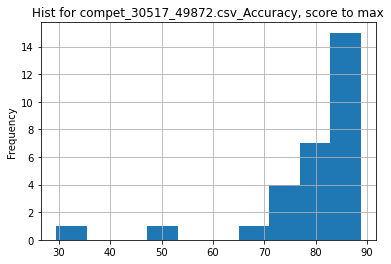

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1191493581735872
Utility w/median =  1.0713388717156105
___________________
30517_49873.csv
      Accuracy
0  87.6600 (1)
1  87.6080 (2)
2  87.5840 (3)


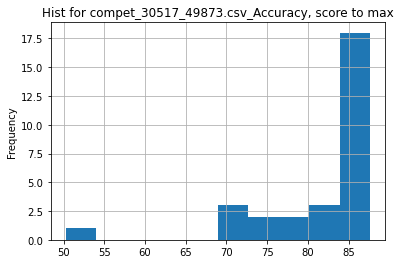

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0724446679401418
Utility w/median =  1.031731086107057
___________________
30517_49874.csv
      Accuracy
0  88.8600 (1)
1  88.5000 (2)
2  88.4560 (3)


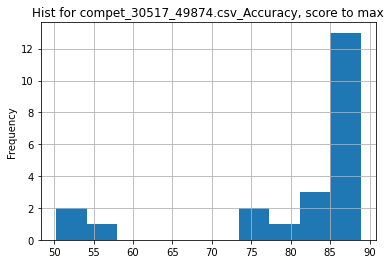

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.108764303928419
Utility w/median =  1.0417594785340805
___________________
30517_49875.csv
      Accuracy
0  94.7080 (1)
1  94.4960 (2)
2  93.0600 (3)


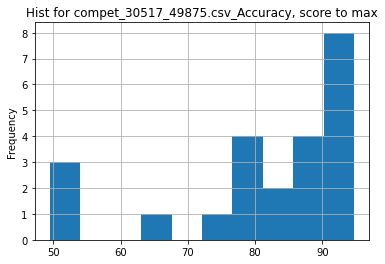

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.1690864710643205
Utility w/median =  1.1050592737795202
___________________
30523_49885.csv
          MSE           SAD         Grad          Conn
0  0.0024 (1)   11.6019 (4)  12.1567 (5)    8.5524 (9)
1  0.0024 (2)   10.9061 (1)  11.7247 (3)    7.7374 (3)
2  0.0025 (3)  14.2596 (16)  11.0522 (1)  10.5241 (22)


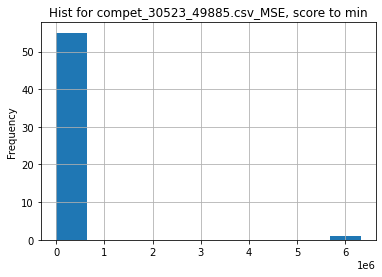

metric_column:  MSE , score_function:  min
Utility w/mean =  47014622.66294644
Utility w/median =  1.7083333333333337
___________________
30523_49886.csv
          MSE           SAD         Grad         Conn
0  0.0019 (1)  13.0033 (19)  10.0736 (1)  8.8748 (23)
1  0.0023 (2)   10.7519 (2)  11.1057 (7)  7.0989 (12)
2  0.0023 (3)   11.2264 (8)  10.6036 (2)  7.2195 (15)


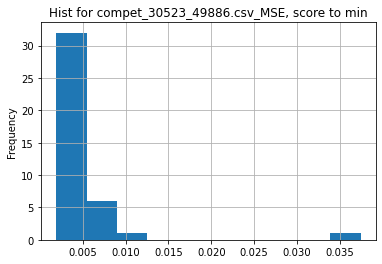

metric_column:  MSE , score_function:  min
Utility w/mean =  2.5157894736842104
Utility w/median =  1.5789473684210527
___________________
30543_49899.csv
     Accuracy
0  0.9878 (1)
1  0.9878 (1)
2  0.9878 (1)


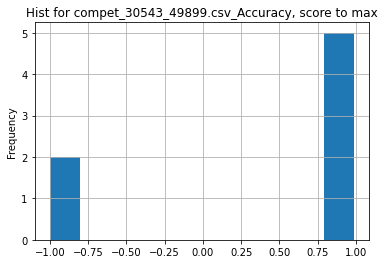

metric_column:  Accuracy , score_function:  max
Utility w/mean =  2.357919863597613
Utility w/median =  1.0
___________________
30543_49900.csv
     Accuracy
0  0.5997 (1)
1  0.3746 (2)
2  0.3295 (3)


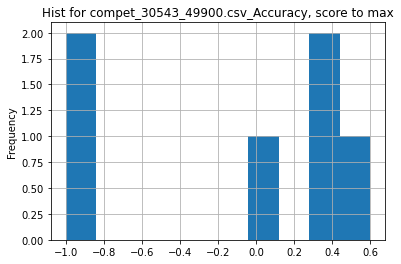

metric_column:  Accuracy , score_function:  max
Utility w/mean =  -5.45181818181818
Utility w/median =  3.2797374897456932
___________________
30594_49957.csv
___________________
30594_49958.csv
  Task 1 - Handwritten (Accuracy %) Execution time(ms)
0                         99.69 (1)          31.00 (4)
1                         99.14 (2)          18.00 (7)
2                         97.80 (3)          39.00 (2)
File cannot be opened: 30594_49958.csv
___________________
30594_49958_t1.csv
  Task 1 - Handwritten (Accuracy %) Execution time(ms)
0                         99.69 (1)          31.00 (4)
1                         99.14 (2)          18.00 (7)
2                         97.80 (3)          39.00 (2)


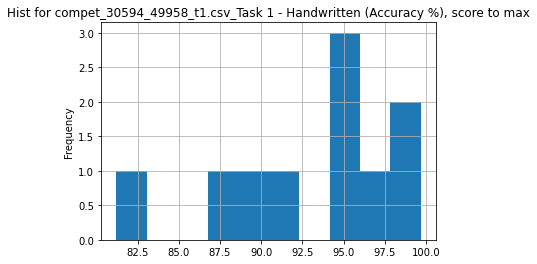

metric_column:  Task 1 - Handwritten (Accuracy %) , score_function:  max
Utility w/mean =  1.0691419195006595
Utility w/median =  1.0462297318570604
___________________
30594_49958_t2.csv
  Task 2 - Printed (Accuracy %) Execution time(ms)
0                     99.99 (1)          31.00 (3)
1                     99.80 (2)          38.00 (2)
2                     99.24 (3)          29.00 (5)


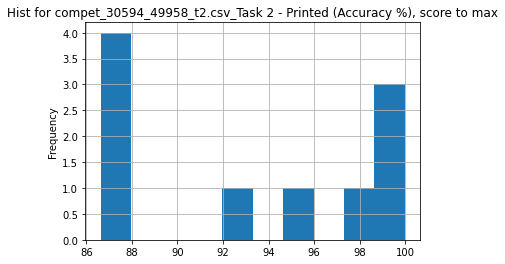

metric_column:  Task 2 - Printed (Accuracy %) , score_function:  max
Utility w/mean =  1.0704765167492798
Utility w/median =  1.0646861523718256
___________________
30594_49958_t3.csv
  Task 3 - Mixed (Accuracy %) Execution time(ms)
0                   99.84 (1)          17.00 (3)
1                   98.77 (2)          20.00 (1)
2                   97.16 (3)           8.00 (6)


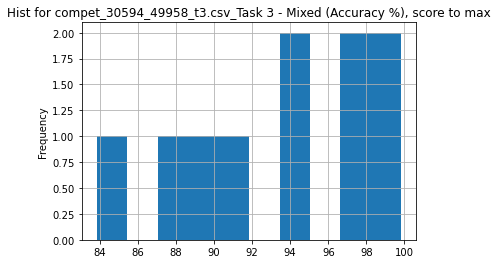

metric_column:  Task 3 - Mixed (Accuracy %) , score_function:  max
Utility w/mean =  1.0698327314809855
Utility w/median =  1.0574590901869405
___________________
30620_50006.csv
       mMOTA      mMOTP         MOTA        MOTP        Misses  \
0  36.45 (1)  70.99 (1)    63.92 (1)   84.46 (1)  110774.0 (1)   
1       MOTA       MOTP       Misses          FP        Switch   
2  49.56 (1)  78.81 (1)  20027.0 (1)  8676.0 (1)    1362.0 (1)   

               FP       Switch     Mostly Tracked Mostly Lost  \
0     42844.0 (1)   6172.0 (1)         9312.0 (1)  3109.0 (1)   
1  Mostly Tracked  Mostly Lost  Partially Tracked         NaN   
2      1504.0 (1)    772.0 (1)         1364.0 (1)         NaN   

  Partially Tracked  
0        5624.0 (1)  
1               NaN  
2               NaN  
File cannot be opened: 30620_50006.csv
___________________
30620_50007.csv
  mMOTA mMOTP    MOTA MOTP  Misses              FP       Switch  \
0   NaN   NaN     NaN  NaN     NaN             NaN          NaN  

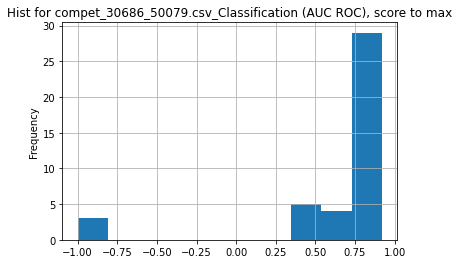

metric_column:  Classification (AUC ROC) , score_function:  max
Utility w/mean =  1.4244712990936557
Utility w/median =  1.0952380952380953
___________________
30703_50111.csv
___________________
30712_50119.csv
         mIoU  weight IoU         VC8        VC16
0  0.5984 (1)  0.7307 (1)  0.9451 (1)  0.9222 (1)
1  0.5925 (2)  0.7275 (2)  0.9434 (2)  0.9219 (2)
2  0.5858 (3)  0.7249 (3)  0.9411 (3)  0.9168 (3)


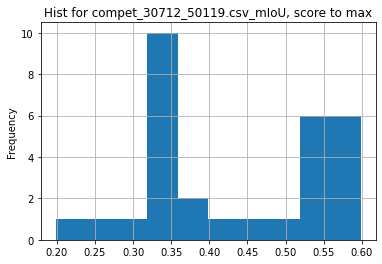

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.3942651216253994
Utility w/median =  1.5609756097560978
___________________
30712_50121.csv
         mIoU  weight IoU         VC8        VC16
0  0.5885 (1)  0.7178 (1)  0.9477 (1)  0.9259 (1)
1  0.5744 (2)  0.7086 (2)  0.9129 (4)  0.8770 (5)
2  0.5735 (3)  0.7032 (4)  0.9328 (2)  0.9056 (2)


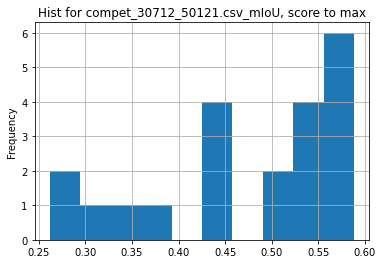

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.2363074337504878
Utility w/median =  1.1280429365535747
___________________
30715_50126.csv
  Balanced accuracy
0          0.76 (1)
1          0.76 (2)
2          0.76 (3)
File cannot be opened: 30715_50126.csv
___________________
30755_50185.csv
  Total Score          F1       BLEU1       BLEU4
0   48.23 (1)  44.63 (56)  58.96 (56)  41.11 (56)
1   46.66 (2)  42.79 (55)  57.19 (55)  39.99 (55)
2   36.30 (3)  30.26 (42)  50.58 (54)  28.07 (52)


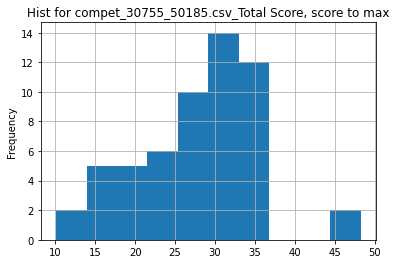

metric_column:  Total Score , score_function:  max
Utility w/mean =  1.7193858063201852
Utility w/median =  1.6545454545454545
___________________
30830_50237.csv
    F1  Precision  Recall
0  NaN        NaN     NaN
1   F1  Precision  Recall
2  NaN        NaN     NaN
File cannot be opened: 30830_50237.csv
___________________
30853_50284.csv
___________________
30853_50285.csv
___________________
30853_50286.csv
  Mean-Average-Precision Average-Precision R-Precision Reciprical-Rank  \
0              0.875 (1)         0.875 (1)   0.767 (1)       1.000 (1)   
1              0.841 (2)         0.841 (2)   0.750 (2)       1.000 (1)   
2              0.825 (3)         0.825 (3)   0.700 (3)       1.000 (1)   

  Precision@3 Precision@5 Precision@10  
0   1.000 (1)   1.000 (1)    1.000 (1)  
1   1.000 (1)   1.000 (1)    1.000 (1)  
2   1.000 (1)   1.000 (1)    1.000 (1)  


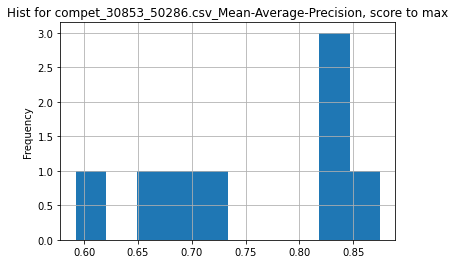

metric_column:  Mean-Average-Precision , score_function:  max
Utility w/mean =  1.1645316918981867
Utility w/median =  1.14603798297315
___________________
30853_50287.csv
___________________
30853_50288.csv
___________________
30853_50289.csv
  Mean-Average-Precision Average-Precision R-Precision Reciprical-Rank  \
0              0.658 (1)         0.658 (1)   0.599 (3)       1.000 (1)   
1              0.615 (2)         0.615 (2)   0.579 (4)       0.500 (2)   
2              0.612 (3)         0.612 (3)   0.599 (3)       1.000 (1)   

  Precision@3 Precision@5 Precision@10  
0   1.000 (1)   1.000 (1)    1.000 (1)  
1   0.667 (2)   0.600 (2)    0.600 (4)  
2   1.000 (1)   1.000 (1)    1.000 (1)  


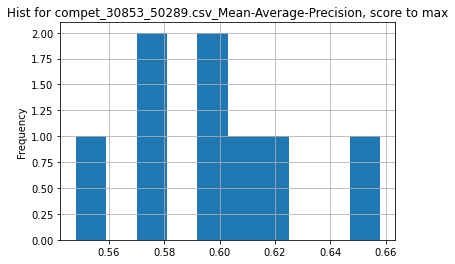

metric_column:  Mean-Average-Precision , score_function:  max
Utility w/mean =  1.102870312172638
Utility w/median =  1.102177554438861
___________________
30853_50290.csv
___________________
30853_50291.csv
  Mean-Average-Precision Average-Precision R-Precision Reciprical-Rank  \
0              0.581 (1)         0.581 (1)   0.585 (1)       1.000 (1)   
1              0.574 (2)         0.574 (2)   0.585 (1)       1.000 (1)   
2              0.525 (3)         0.525 (3)   0.503 (3)       1.000 (1)   

  Precision@3 Precision@5 Precision@10  
0   1.000 (1)   0.800 (2)    0.700 (3)  
1   1.000 (1)   1.000 (1)    0.800 (2)  
2   1.000 (1)   1.000 (1)    0.800 (2)  


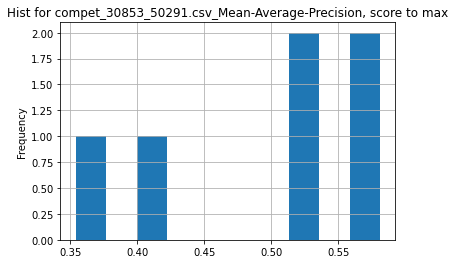

metric_column:  Mean-Average-Precision , score_function:  max
Utility w/mean =  1.1804944124619032
Utility w/median =  1.1151631477927062
___________________
30853_50292.csv
  Mean-Average-Precision Average-Precision R-Precision Reciprical-Rank  \
0              0.525 (1)         0.525 (1)   0.486 (2)       1.000 (1)   
1              0.493 (2)         0.493 (2)   0.541 (1)       1.000 (1)   
2              0.490 (3)         0.490 (3)   0.440 (4)       1.000 (1)   

  Precision@3 Precision@5 Precision@10  
0   0.667 (2)   0.800 (1)    0.900 (1)  
1   0.667 (2)   0.600 (2)    0.700 (2)  
2   1.000 (1)   0.800 (1)    0.900 (1)  


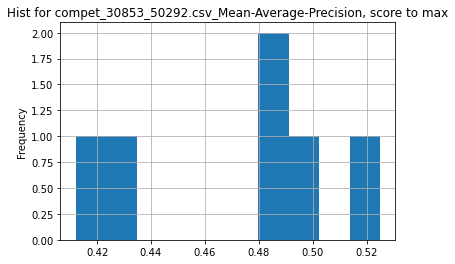

metric_column:  Mean-Average-Precision , score_function:  max
Utility w/mean =  1.1146496815286624
Utility w/median =  1.080246913580247
___________________
30853_50293.csv
___________________
30853_50294.csv
___________________
30855_50297.csv
___________________
30910_50333.csv
   RANK<ACER>       APCER       BPCER           AUC
0  0.2326 (1)  0.0000 (1)  0.4651 (1)  1.000000 (1)
1  0.2326 (1)  0.0000 (1)  0.4651 (1)  1.000000 (1)
2  0.2326 (1)  0.0000 (1)  0.4651 (1)  1.000000 (1)


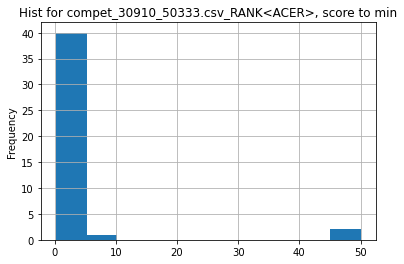

metric_column:  RANK<ACER> , score_function:  min
Utility w/mean =  14.855526005319042
Utility w/median =  2.6620808254514188
___________________
30910_50334.csv
   RANK<ACER>        APCER        BPCER            AUC
0  1.6217 (1)   0.8444 (3)   2.3991 (5)  0.983665 (16)
1  2.3601 (2)   0.6141 (2)  4.1061 (13)  0.982792 (17)
2  2.6421 (3)  3.6232 (12)   1.6609 (2)   0.994834 (4)


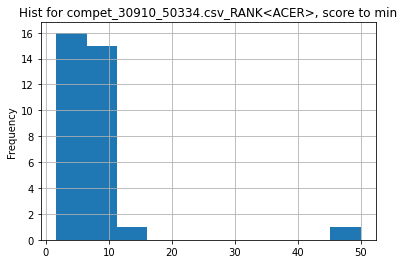

metric_column:  RANK<ACER> , score_function:  min
Utility w/mean =  4.47824299603297
Utility w/median =  4.033483381636555
___________________
30930_50359.csv
File cannot be opened: 30930_50359.csv
___________________
30932_50363.csv
    Accuracy@1
0  68.5000 (1)
1  68.5000 (1)
2  68.2500 (2)


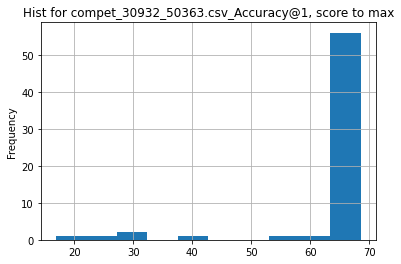

metric_column:  Accuracy@1 , score_function:  max
Utility w/mean =  1.0714019712505276
Utility w/median =  1.0170749814402376
___________________
30932_50364.csv
___________________
30937_50375.csv
        Score
0  0.3935 (1)
1  0.3490 (2)
2  0.3395 (3)


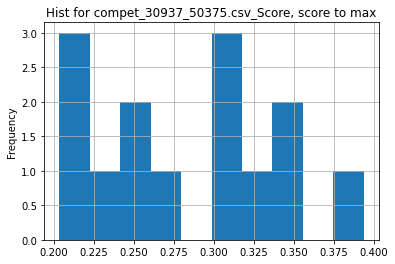

metric_column:  Score , score_function:  max
Utility w/mean =  1.3929555740979545
Utility w/median =  1.3968761093361732
___________________
30949_50402.csv
___________________
30949_50403.csv
___________________
30949_50404.csv
___________________
30949_50405.csv
___________________
30949_50406.csv
___________________
30949_50407.csv
___________________
30954_50414.csv
___________________
30954_50415.csv
___________________
30954_50416.csv
      ROC-AUC
0  0.6735 (1)
1  0.6733 (2)
2  0.6727 (3)


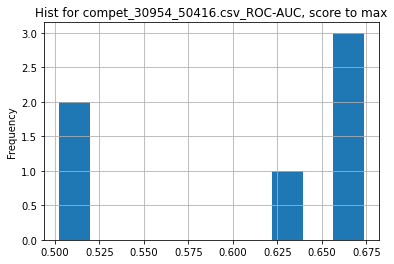

metric_column:  ROC-AUC , score_function:  max
Utility w/mean =  1.1033447098976108
Utility w/median =  1.0328962502875545
___________________
30990_50452.csv
  Overall Score Score Symbol Rate Score Modulation Type Score Modulation Order
0    120.00 (1)         30.00 (1)             30.00 (1)              30.00 (1)
1    120.00 (1)         30.00 (1)             30.00 (1)              30.00 (1)
2    120.00 (1)         30.00 (1)             30.00 (1)              30.00 (1)


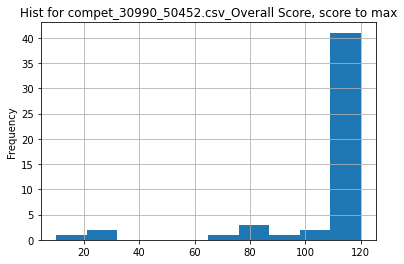

metric_column:  Overall Score , score_function:  max
Utility w/mean =  1.0948121645796065
Utility w/median =  1.0
___________________
30993_50455.csv
      score      mIoU      mAcc
0  0.84 (1)  0.86 (1)  0.91 (1)
1  0.83 (2)  0.85 (2)  0.90 (3)
2  0.83 (3)  0.75 (7)  0.89 (4)


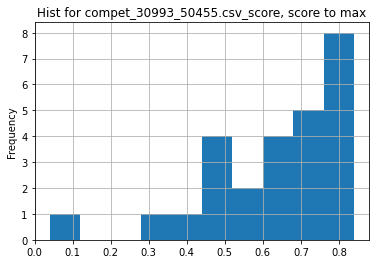

metric_column:  score , score_function:  max
Utility w/mean =  1.356521739130435
Utility w/median =  1.2537313432835822
___________________
31086_50621.csv
   mIoU Score   mBJ Score
0  67.501 (1)  33.860 (8)
1  66.328 (2)  39.488 (4)
2  65.870 (3)  43.585 (3)


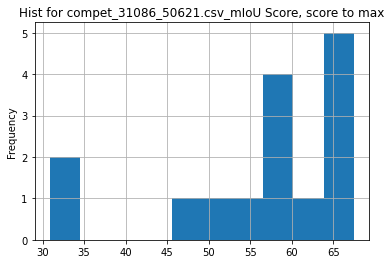

metric_column:  mIoU Score , score_function:  max
Utility w/mean =  1.2010269963145326
Utility w/median =  1.130878386302334
___________________
31146_50763.csv
File cannot be opened: 31146_50763.csv
___________________
31166_50800.csv
___________________
31166_50801.csv
  mAP Strict  mAP Relaxed
0      - (-)          NaN
1      - (-)          NaN
2      - (-)          NaN
File cannot be opened: 31166_50801.csv
___________________
31166_50802.csv
___________________
31166_50803.csv
___________________
31166_50804.csv
___________________
31238_50930.csv
___________________
31238_50931.csv
___________________
31247_50971.csv
        score
0  0.8455 (1)
1  0.8393 (2)
2  0.8175 (3)


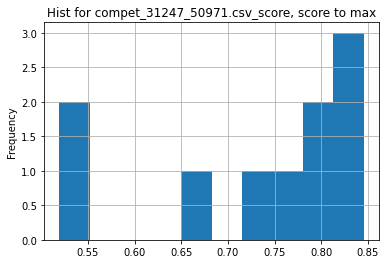

metric_column:  score , score_function:  max
Utility w/mean =  1.148761565739596
Utility w/median =  1.0684273709483794
___________________
31247_50972.csv
        score
0  0.8400 (1)
1  0.8243 (2)
2  0.8121 (3)


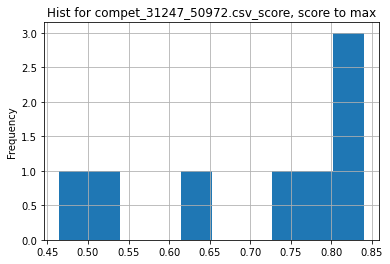

metric_column:  score , score_function:  max
Utility w/mean =  1.2022972465246098
Utility w/median =  1.118508655126498
___________________
31247_50973.csv
        score
0  0.7727 (1)
1  0.7301 (2)
2  0.6984 (3)


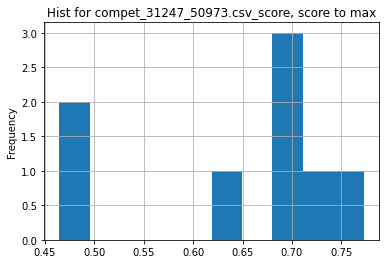

metric_column:  score , score_function:  max
Utility w/mean =  1.2058835004486756
Utility w/median =  1.1238455385062904
___________________
31247_50974.csv
        score
0  0.7877 (1)
1  0.7853 (2)
2  0.7707 (3)


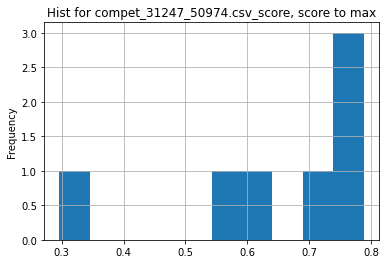

metric_column:  score , score_function:  max
Utility w/mean =  1.229930182239968
Utility w/median =  1.117463469995744
___________________
31247_50975.csv
        score
0  0.8532 (1)
1  0.8456 (2)
2  0.8305 (3)


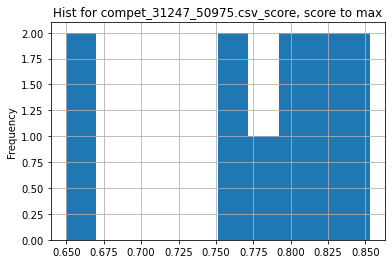

metric_column:  score , score_function:  max
Utility w/mean =  1.0951352991283445
Utility w/median =  1.0761856710393543
___________________
31247_50976.csv
        score
0  0.8847 (1)
1  0.8700 (2)
2  0.8662 (3)


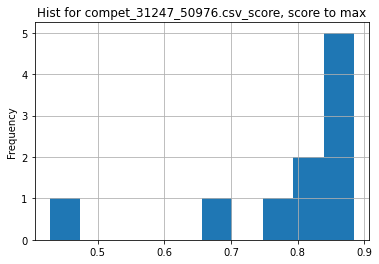

metric_column:  score , score_function:  max
Utility w/mean =  1.133417033924362
Utility w/median =  1.0641087322588405
___________________
31247_50977.csv
        score
0  0.8861 (1)
1  0.8517 (2)
2  0.8325 (3)


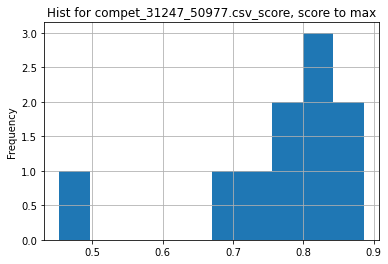

metric_column:  score , score_function:  max
Utility w/mean =  1.1644654707930875
Utility w/median =  1.1334100793041697
___________________
31247_50978.csv
        score
0  0.8444 (1)
1  0.8120 (2)
2  0.8040 (3)


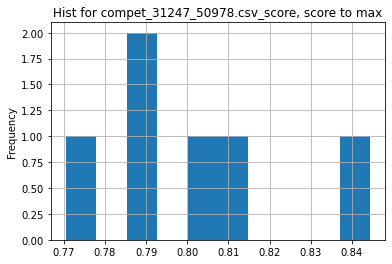

metric_column:  score , score_function:  max
Utility w/mean =  1.0538095139047778
Utility w/median =  1.059406561696255
___________________
31247_50979.csv
___________________
31247_50980.csv
___________________
31247_50981.csv
___________________
31247_50982.csv
___________________
31247_50983.csv
___________________
31262_51001.csv
  Mean-Average-Precision Average-Precision R-Precision Reciprical-Rank  \
0              0.537 (1)         0.537 (1)   0.525 (2)       1.000 (1)   
1              0.529 (2)         0.529 (2)   0.533 (1)       0.500 (2)   
2              0.496 (3)         0.496 (3)   0.483 (4)       1.000 (1)   

  Precision@3 Precision@5 Precision@10  
0   1.000 (1)   0.800 (2)    0.900 (1)  
1   0.667 (2)   0.600 (3)    0.800 (2)  
2   1.000 (1)   0.800 (2)    0.800 (2)  


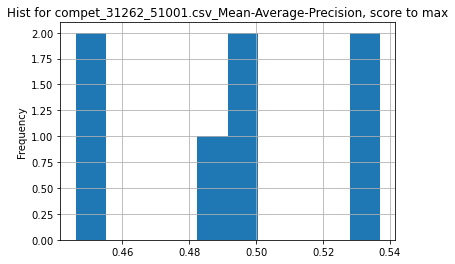

metric_column:  Mean-Average-Precision , score_function:  max
Utility w/mean =  1.092414995640802
Utility w/median =  1.0914634146341464
___________________
31280_51040.csv
___________________
31307_51068.csv
  Mean Average Precision
0             0.4429 (1)
1             0.3991 (2)
2             0.3987 (3)


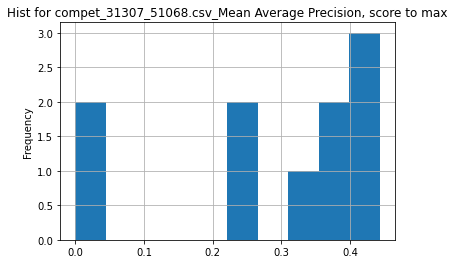

metric_column:  Mean Average Precision , score_function:  max
Utility w/mean =  1.599321128082909
Utility w/median =  1.27544996400288
___________________
31308_51069.csv
___________________
31326_51087.csv
            MSE             O             C             E             A  \
0  1.063243 (1)  0.658912 (2)  1.354136 (2)  1.189309 (3)  0.965135 (4)   
1  1.063374 (2)  0.627761 (1)  1.431821 (5)  1.115273 (2)  0.940743 (1)   
2  1.070318 (3)  0.689593 (4)  1.192769 (1)  1.072845 (1)  0.950076 (3)   

              N  
0  1.148724 (1)  
1  1.201271 (4)  
2  1.446306 (6)  


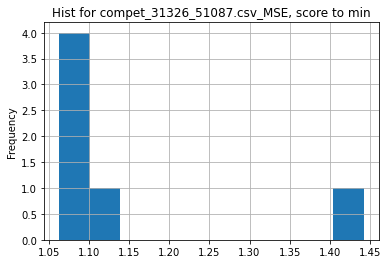

metric_column:  MSE , score_function:  min
Utility w/mean =  1.0744230936233141
Utility w/median =  1.0199921372630718
___________________
31326_51088.csv
            MSE             O             C             E             A  \
0  0.769153 (1)  0.711249 (1)  0.723010 (3)  0.866556 (1)  0.548260 (1)   
1  0.817918 (2)  0.744329 (2)  0.793535 (4)  0.886429 (2)  0.653172 (2)   
2  0.825128 (3)  0.752272 (3)  0.687415 (2)  0.917409 (3)  0.670707 (3)   

              N  
0  0.996690 (1)  
1  1.012128 (2)  
2  1.097835 (3)  


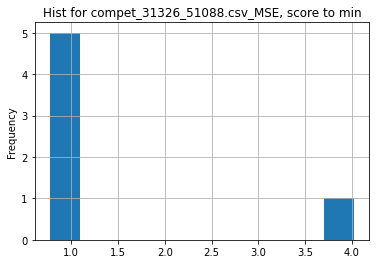

metric_column:  MSE , score_function:  min
Utility w/mean =  1.8074143462570733
Utility w/median =  1.0860491995740769
___________________
31385_51163.csv
___________________
31432_51234.csv
___________________
31432_51235.csv
___________________
31438_51246.csv
          mAP  x-scene AP   x-view AP
0  0.9583 (1)  0.9716 (1)  0.9449 (1)
1  0.9288 (2)  0.9468 (2)  0.9108 (2)
2  0.7406 (3)  0.8064 (3)  0.6748 (3)


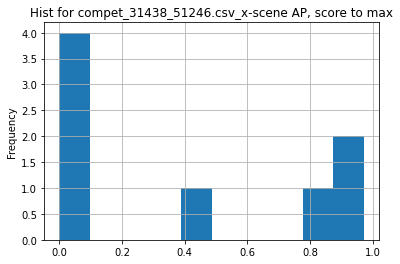

metric_column:  x-scene AP , score_function:  max
Utility w/mean =  2.470300333704116
Utility w/median =  4.608015176665876
___________________
31485_51291.csv
  Click Log Loss Improvement vs Naive (%) Degradation vs Oracle (%)
0   0.227106 (1)                30.01 (1)                 -1.76 (1)
1   0.227106 (1)                30.01 (1)                 -1.76 (1)
2   0.227106 (1)                30.01 (1)                 -1.76 (1)
File cannot be opened: 31485_51291.csv
___________________
31485_51292.csv
  Click Log Loss Improvement vs Naive (%) Degradation vs Oracle (%)
0   0.228707 (1)                29.51 (1)                 -2.47 (1)
1   0.228707 (1)                29.51 (1)                 -2.47 (1)
2   0.228707 (1)                29.51 (1)                 -2.47 (1)
File cannot be opened: 31485_51292.csv
___________________
31489_51299.csv
___________________
31489_51300.csv
       pckAUC    pckh@0.2    pckh@0.5 pckAUC_hosp pckAUC_home
0  58.692 (1)  52.476 (2)  87.905 (1)  61.623 (1

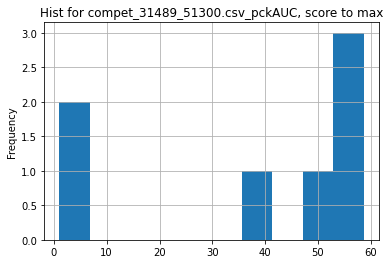

metric_column:  pckAUC , score_function:  max
Utility w/mean =  1.556763884520801
Utility w/median =  1.1786015502630627
___________________
31489_51301.csv
___________________
31519_51320.csv
         mIoU    accuracy      Ground High Vegetation   Buildings       Walls  \
0  0.6870 (1)  0.9440 (2)  0.8780 (2)      0.9890 (1)  0.9640 (5)  0.6930 (7)   
1  0.6810 (2)  0.9400 (5)  0.8600 (9)      0.9890 (1)  0.9640 (5)  0.7780 (3)   
2  0.6760 (3)  0.9460 (1)  0.8820 (1)      0.9880 (2)  0.9660 (3)  0.6910 (8)   

        Bridge      Parking        Rail traffic Roads Street Furniture  \
0  0.5960 (19)   0.6360 (2)  0.4970 (6)    0.6620 (1)       0.5770 (4)   
1  0.5980 (18)  0.5500 (24)  0.5300 (3)    0.6480 (3)       0.5820 (3)   
2   0.6600 (7)   0.6150 (4)  0.5020 (5)    0.6480 (3)       0.5720 (7)   

         Cars     Footpath        Bikes        Water  
0  0.8560 (7)   0.4900 (4)   0.2300 (5)   0.8620 (1)  
1  0.8660 (5)  0.4140 (21)   0.2980 (3)  0.7790 (10)  
2  0.8660 (5)   0.53

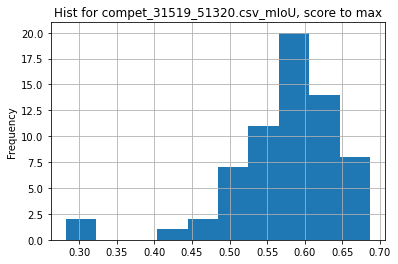

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.1964792883553934
Utility w/median =  1.1743589743589746
___________________
31559_51388.csv
          DC    DC (SA)    DC (LA)    HD (SA)    HD (LA)         HD
0  0.924 (2)  0.925 (2)  0.922 (3)  8.902 (2)  5.353 (2)  8.015 (1)
1  0.923 (3)  0.924 (3)  0.922 (1)  8.853 (1)  5.591 (4)  8.037 (2)
2  0.921 (5)  0.922 (4)  0.920 (4)  9.472 (4)  5.343 (1)  8.440 (3)


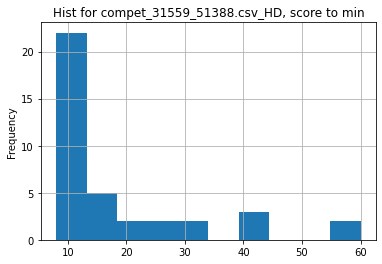

metric_column:  HD , score_function:  min
Utility w/mean =  2.2745477230193383
Utility w/median =  1.5733000623830316
___________________
31559_51389.csv
___________________
31584_51416.csv
___________________
31584_51417.csv
___________________
31639_51526.csv
        score
0  0.8442 (1)
1  0.8339 (2)
2  0.8317 (3)


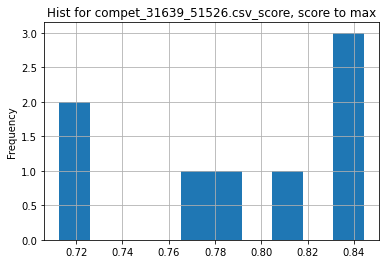

metric_column:  score , score_function:  max
Utility w/mean =  1.0702502258212763
Utility w/median =  1.0562402252111354
___________________
31639_51527.csv
___________________
31639_51530.csv
___________________
31639_51532.csv
___________________
31639_51534.csv
        score
0  0.8559 (1)
1  0.8481 (2)
2  0.8462 (3)


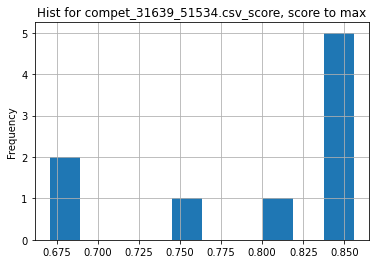

metric_column:  score , score_function:  max
Utility w/mean =  1.0769047951908293
Utility w/median =  1.0154229445960374
___________________
31639_51536.csv
___________________
31639_51537.csv
___________________
31639_51539.csv
___________________
31639_51541.csv
___________________
31639_51543.csv
___________________
31639_51545.csv
___________________
31639_51547.csv
___________________
31639_51549.csv
___________________
31670_51587.csv
      bleu_avg    bleu_test     bleu_dev
0  50.3680 (1)  47.6701 (1)  53.0659 (1)
1  42.2786 (2)  40.9180 (2)  43.6393 (3)
2  41.7174 (3)  39.6477 (5)  43.7870 (2)


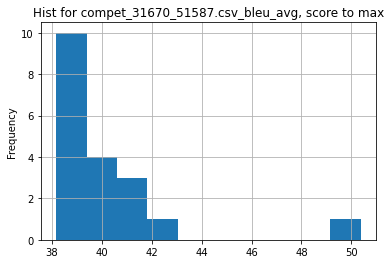

metric_column:  bleu_avg , score_function:  max
Utility w/mean =  1.2537522813700417
Utility w/median =  1.2839382808258113
___________________
31715_51635.csv
___________________
31715_51636.csv
       F1-all   F1-unseen
0  0.7619 (1)  0.7381 (1)
1  0.6065 (2)  0.2500 (4)
2  0.5878 (3)  0.4198 (2)


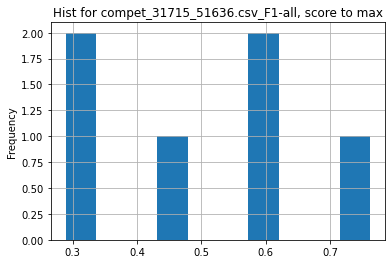

metric_column:  F1-all , score_function:  max
Utility w/mean =  1.521315185197511
Utility w/median =  1.4671673406508763
___________________
31727_51653.csv
  Moderate mAP    Easy mAP   Hard mAP
0    82.83 (1)   86.92 (3)  76.28 (1)
1    81.95 (2)   87.68 (1)  76.18 (2)
2    80.18 (3)  82.25 (17)  73.97 (6)


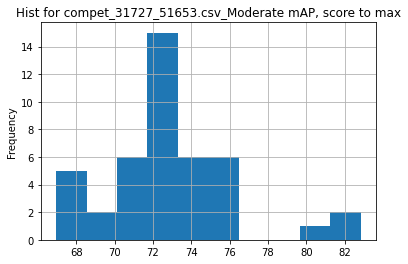

metric_column:  Moderate mAP , score_function:  max
Utility w/mean =  1.1372806345313822
Utility w/median =  1.1420102026747552
___________________
31727_51654.csv
  Moderate mAP   Easy mAP   Hard mAP
0    95.38 (1)  94.84 (3)  89.23 (2)
1    94.93 (2)  95.52 (2)  89.15 (3)
2    94.41 (3)  93.02 (8)  88.50 (5)


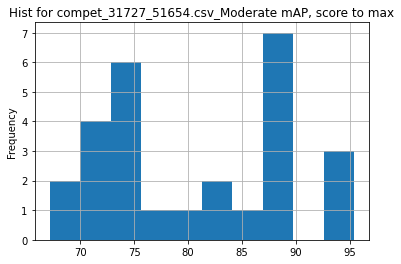

metric_column:  Moderate mAP , score_function:  max
Utility w/mean =  1.1821850081941252
Utility w/median =  1.2082594375475044
___________________
31819_51782.csv
         mae
0  2.969 (1)
1  3.056 (2)
2  3.056 (2)


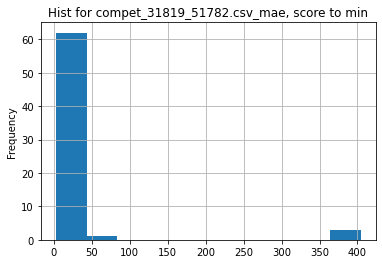

metric_column:  mae , score_function:  min
Utility w/mean =  8.276192371679068
Utility w/median =  1.7283597170764569
___________________
31819_51783.csv
         mae
0  2.213 (1)
1  2.247 (2)
2  2.251 (3)


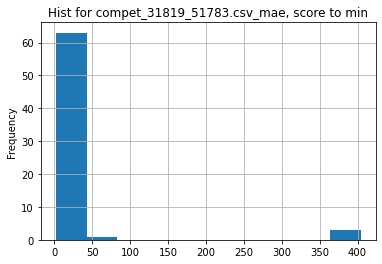

metric_column:  mae , score_function:  min
Utility w/mean =  10.42337341759346
Utility w/median =  1.7306823316764572
___________________
31843_51801.csv
             F1     Precision        Recall
0  0.478215 (1)  0.511511 (2)  0.498211 (1)
1  0.442072 (2)  0.508496 (3)  0.427585 (3)
2  0.412444 (3)  0.448765 (4)  0.412185 (6)


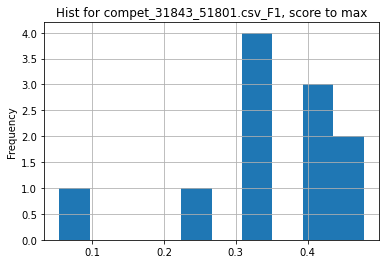

metric_column:  F1 , score_function:  max
Utility w/mean =  1.4029435767778276
Utility w/median =  1.4477544162390446
___________________
31873_51860.csv
  Overall Score Score Symbol Rate Score Modulation Type Score Modulation Order
0     20.00 (1)         20.00 (1)             20.00 (1)              20.00 (1)
1     19.00 (2)         20.00 (1)             20.00 (1)              19.00 (2)
2     19.00 (2)         20.00 (1)             20.00 (1)              19.00 (2)


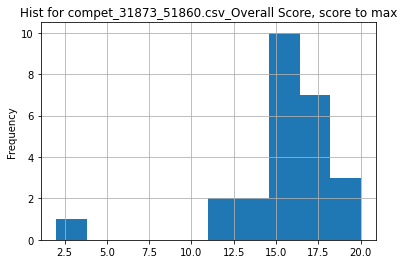

metric_column:  Overall Score , score_function:  max
Utility w/mean =  1.278772378516624
Utility w/median =  1.25
___________________
31884_51884.csv
  Overall Score Score Image Score Name
0     24.26 (1)       - (-)      - (-)
1     17.27 (2)       - (-)      - (-)
2     14.39 (3)       - (-)      - (-)
File cannot be opened: 31884_51884.csv
___________________
31978_52037.csv
           MAE         RMSE           R
0   7.8670 (1)  11.5541 (1)  0.5355 (1)
1  11.3536 (2)  14.6735 (2)  0.0098 (4)
2  12.1293 (3)  19.3364 (3)  0.2996 (2)
File cannot be opened: 31978_52037.csv
___________________
31978_52038.csv
           MAE         RMSE           R
0   9.2215 (1)  14.1761 (1)  0.4681 (1)
1   9.3695 (2)  14.5861 (2)  0.4395 (3)
2  10.1521 (3)  15.3845 (4)  0.4448 (2)
File cannot be opened: 31978_52038.csv
___________________
31978_52039.csv
___________________
31979_52040.csv
___________________
31979_52041.csv
___________________
31979_52042.csv
___________________
32106_52102.csv
     

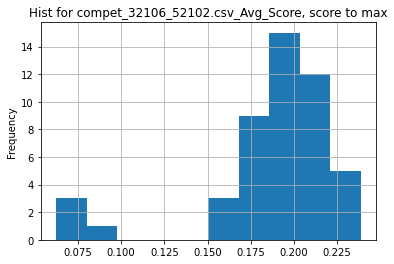

metric_column:  Avg_Score , score_function:  max
Utility w/mean =  1.2864979983555516
Utility w/median =  1.237796337604399
___________________
32132_52140.csv
___________________
32132_52141.csv
___________________
32132_52142.csv
            IoU
0  0.858016 (1)
1  0.851598 (2)
2  0.842381 (3)


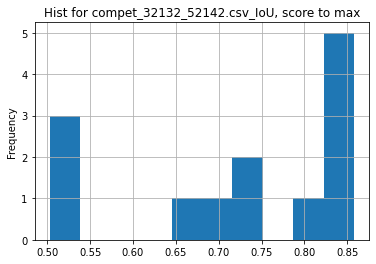

metric_column:  IoU , score_function:  max
Utility w/mean =  1.190537908383231
Utility w/median =  1.156563103629087
___________________
3221_7391.csv
File cannot be opened: 3221_7391.csv
___________________
32343_52348.csv
    min t-DCF       EER
0  0.1815 (1)  0.89 (1)
1  0.2086 (2)  2.03 (2)
2  0.2115 (3)  2.61 (4)


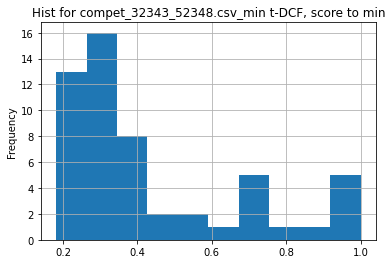

metric_column:  min t-DCF , score_function:  min
Utility w/mean =  2.436577900214264
Utility w/median =  1.8603305785123967
___________________
32343_52349.csv
    min t-DCF       EER
0  0.2177 (1)  1.32 (1)
1  0.2480 (2)  2.77 (2)
2  0.2495 (3)  3.13 (5)


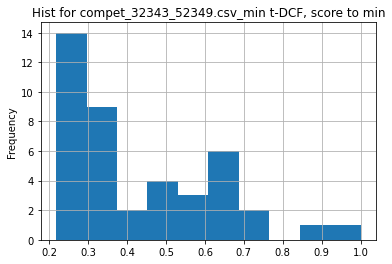

metric_column:  min t-DCF , score_function:  min
Utility w/mean =  2.0241485661788827
Utility w/median =  1.5840606338998622
___________________
32343_52350.csv
___________________
32343_52351.csv
    min t-DCF       EER
0  0.2684 (1)  3.64 (1)
1  0.2720 (2)  3.68 (2)
2  0.3000 (3)  4.91 (3)


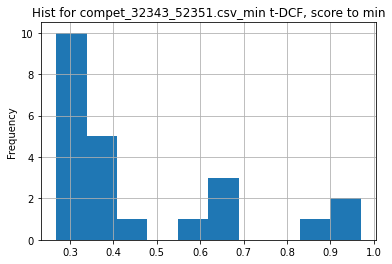

metric_column:  min t-DCF , score_function:  min
Utility w/mean =  1.7467115920430243
Utility w/median =  1.3353204172876303
___________________
32345_52355.csv
        EER
0  0.12 (1)
1  0.24 (2)
2  0.78 (3)


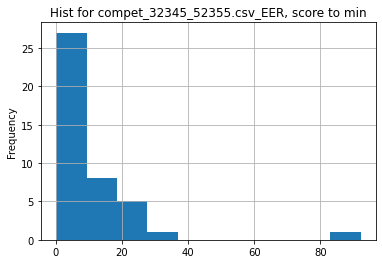

metric_column:  EER , score_function:  min
Utility w/mean =  92.93055555555553
Utility w/median =  50.833333333333336
___________________
32345_52357.csv
         EER
0  15.64 (1)
1  16.05 (2)
2  18.30 (3)


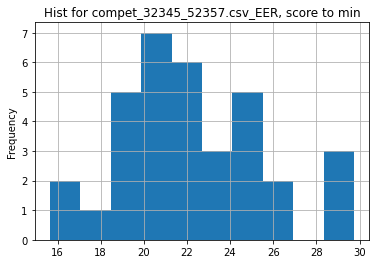

metric_column:  EER , score_function:  min
Utility w/mean =  1.4264329772829845
Utility w/median =  1.397058823529412
___________________
32345_52359.csv
___________________
32345_52361.csv
         EER
0  14.30 (1)
1  16.36 (2)
2  17.05 (3)


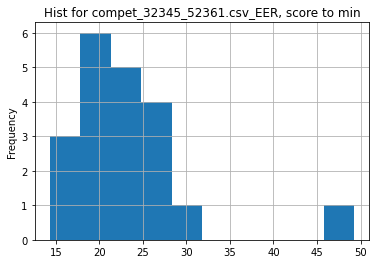

metric_column:  EER , score_function:  min
Utility w/mean =  1.6189160839160839
Utility w/median =  1.5045454545454544
___________________
32347_52362.csv
    min t-DCF        EER
0  0.6658 (1)  24.44 (3)
1  0.6725 (2)  23.60 (1)
2  0.6793 (3)  25.37 (4)


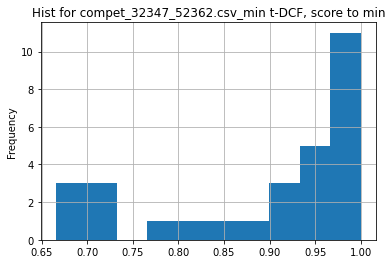

metric_column:  min t-DCF , score_function:  min
Utility w/mean =  1.3400006214976017
Utility w/median =  1.4378191649143888
___________________
32347_52363.csv
    min t-DCF        EER
0  0.6824 (1)  24.25 (1)
1  0.7122 (2)  27.59 (3)
2  0.7296 (3)  26.42 (2)


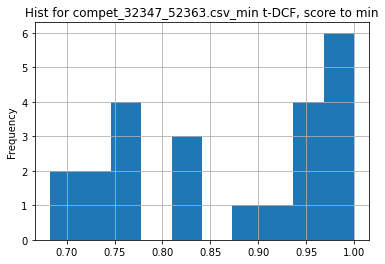

metric_column:  min t-DCF , score_function:  min
Utility w/mean =  1.2717455018094705
Utility w/median =  1.301143024618992
___________________
32347_52364.csv
___________________
32347_52365.csv
    min t-DCF        EER
0  0.7061 (1)  25.55 (1)
1  0.7566 (2)  29.16 (3)
2  0.7648 (3)  28.48 (2)


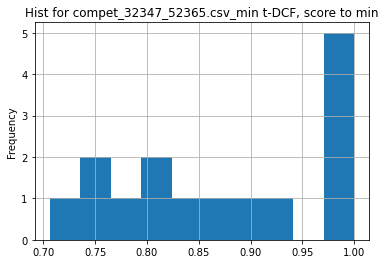

metric_column:  min t-DCF , score_function:  min
Utility w/mean =  1.2383609498182506
Utility w/median =  1.236793655289619
___________________
32360_52376.csv
          Score
0  0.576921 (1)
1  0.436615 (2)
2  0.369630 (3)


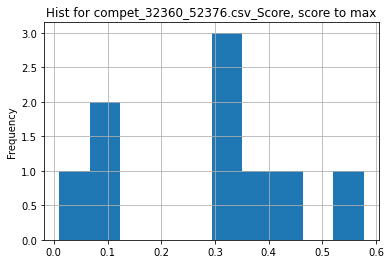

metric_column:  Score , score_function:  max
Utility w/mean =  2.0772413114376334
Utility w/median =  1.845721945663719
___________________
32360_52377.csv
          Score
0  0.630532 (1)
1  0.613722 (2)
2  0.605059 (3)


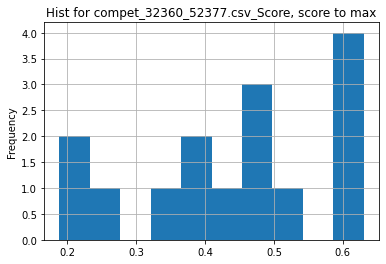

metric_column:  Score , score_function:  max
Utility w/mean =  1.426463595012585
Utility w/median =  1.2961028442926064
___________________
32363_52380.csv
     mAP@0.50    mAP@0.55    mAP@0.60    mAP@0.65    mAP@0.70    mAP@0.75  \
0  22.232 (1)  20.682 (1)  19.321 (1)  17.563 (1)  16.040 (1)  13.795 (1)   
1  21.134 (2)  19.828 (2)  18.676 (2)  17.168 (2)  15.289 (3)  13.499 (3)   
2  20.798 (3)  19.295 (3)  17.964 (3)  16.513 (3)  15.320 (2)  13.733 (2)   

     mAP@0.80   mAP@0.85   mAP@0.90   mAP@0.95     Avg.mAP  
0  11.756 (2)  8.953 (3)  5.745 (3)  2.639 (7)  13.872 (1)  
1  11.544 (3)  9.499 (2)  7.163 (1)  3.920 (1)  13.772 (2)  
2  11.911 (1)  9.670 (1)  6.928 (2)  3.505 (3)  13.564 (3)  


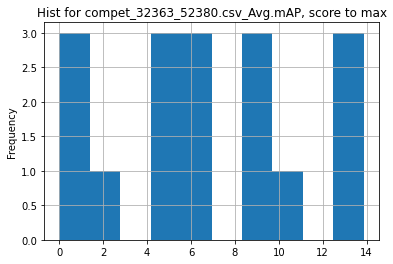

metric_column:  Avg.mAP , score_function:  max
Utility w/mean =  2.040052942550412
Utility w/median =  2.090415913200723
___________________
32363_52381.csv
     mAP@0.50    mAP@0.55    mAP@0.60    mAP@0.65    mAP@0.70    mAP@0.75  \
0  35.044 (1)  32.999 (1)  30.599 (1)  28.390 (1)  26.055 (1)  23.348 (1)   
1  20.244 (2)  18.854 (2)  17.581 (2)  16.055 (2)  14.305 (2)  12.697 (2)   
2  19.446 (3)  18.050 (3)  16.659 (3)  15.254 (3)  13.845 (3)  12.048 (3)   

     mAP@0.80    mAP@0.85    mAP@0.90   mAP@0.95     Avg.mAP  
0  20.494 (1)  17.277 (1)  12.707 (1)  6.607 (1)  23.352 (1)  
1  11.043 (2)   9.059 (2)   6.774 (2)  3.615 (3)  13.023 (2)  
2  10.470 (3)   8.775 (3)   6.628 (3)  4.002 (2)  12.518 (3)  


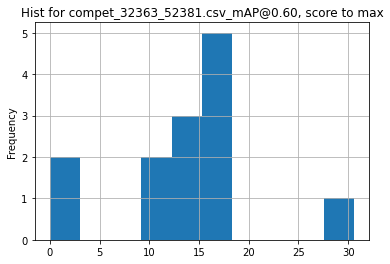

metric_column:  mAP@0.60 , score_function:  max
Utility w/mean =  2.223789398360894
Utility w/median =  2.1412876137158854
___________________
32377_52395.csv
___________________
32377_52396.csv
___________________
32478_52494.csv
  All-Masked (MFR) Wild-Masked (MFR) Controlled-Masked (MFR)    All (SFR)  \
0       0.0980 (1)        0.1283 (5)              0.0500 (1)  0.0393 (12)   
1       0.1017 (2)        0.1222 (1)              0.0694 (3)   0.0162 (1)   
2       0.1036 (3)        0.1246 (2)              0.0699 (5)   0.0168 (2)   

    Wild (SFR) Controlled (SFR) Detection Time Recognition Time   Total Time  
0  0.0627 (13)       0.0032 (6)     156.00 (5)      760.00 (47)  916.00 (48)  
1   0.0270 (1)       0.0018 (1)     157.00 (6)      496.00 (33)  653.00 (34)  
2   0.0276 (2)       0.0020 (2)    162.00 (10)      498.00 (34)  660.00 (35)  


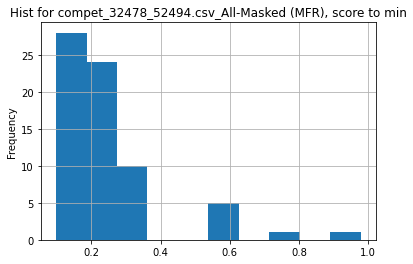

metric_column:  All-Masked (MFR) , score_function:  min
Utility w/mean =  2.486305826678497
Utility w/median =  2.010204081632653
___________________
32478_52495.csv
  All-Masked (MFR) Wild-Masked (MFR) Controlled-Masked (MFR)    All (SFR)  \
0       0.0757 (1)        0.0959 (1)              0.0449 (2)   0.0148 (2)   
1       0.0769 (2)        0.0990 (2)              0.0419 (1)  0.0241 (11)   
2       0.0846 (3)        0.1036 (3)              0.0539 (6)   0.0145 (1)   

    Wild (SFR) Controlled (SFR) Detection Time Recognition Time   Total Time  
0   0.0247 (3)       0.0017 (2)    149.00 (12)      823.00 (61)  972.00 (60)  
1  0.0387 (13)       0.0021 (4)     146.00 (9)      674.00 (53)  820.00 (51)  
2   0.0240 (1)       0.0016 (1)    147.00 (10)      587.00 (46)  734.00 (46)  


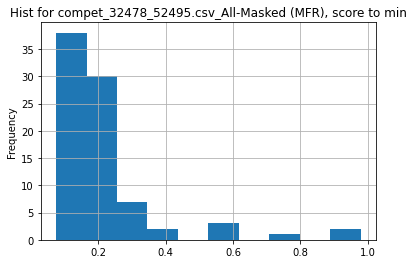

metric_column:  All-Masked (MFR) , score_function:  min
Utility w/mean =  2.8245292928649866
Utility w/median =  2.332892998678996
___________________
32499_52513.csv
___________________
32499_52514.csv
        mAP
0  0.66 (1)
1  0.65 (2)
2  0.63 (3)


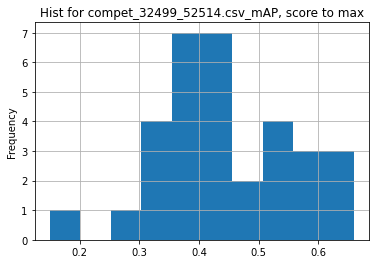

metric_column:  mAP , score_function:  max
Utility w/mean =  1.486277269528501
Utility w/median =  1.5
___________________
32605_52614.csv
___________________
32605_52615.csv
___________________
32702_52707.csv
  Prediction score  Duration
0      49.0909 (1)  0.00 (1)
1      38.3246 (2)  0.00 (1)
2      19.7222 (3)  0.00 (1)


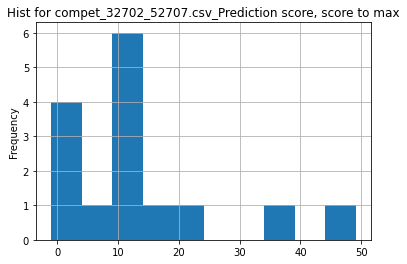

metric_column:  Prediction score , score_function:  max
Utility w/mean =  3.767160640735544
Utility w/median =  4.86000396000396
___________________
32702_52709.csv
  Prediction score  Duration
0      51.2723 (1)  0.00 (1)
1      50.4400 (2)  0.00 (1)
2      49.5492 (3)  0.00 (1)


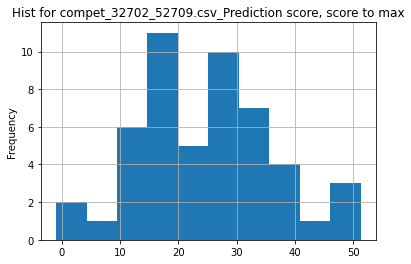

metric_column:  Prediction score , score_function:  max
Utility w/mean =  2.040402210619118
Utility w/median =  1.957197062236609
___________________
32702_52711.csv
  Prediction score  Duration
0      -1.0000 (1)  0.00 (1)
1      -1.0000 (1)  0.00 (1)
2      -1.0000 (1)  0.00 (1)


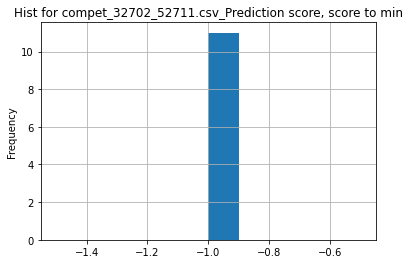

metric_column:  Prediction score , score_function:  min
Utility w/mean =  1.0
Utility w/median =  1.0
___________________
32774_52770.csv
___________________
32774_52771.csv
___________________
32854_52902.csv
___________________
33038_53172.csv
  Rank Target Target AUC  Target AP Target Recall at top-K Rank Source  \
0   1.000 (1)  0.904 (1)  0.843 (1)              0.749 (1)   1.000 (1)   
1   2.000 (2)  0.892 (2)  0.829 (2)              0.729 (2)   2.000 (2)   
2   3.000 (3)  0.742 (3)  0.620 (3)              0.512 (3)   3.000 (3)   

  Source AUC  Source AP Source Recall at top-K Sentence-level Pearson's  
0  0.876 (1)  0.781 (1)              0.667 (1)                0.807 (1)  
1  0.832 (2)  0.728 (2)              0.612 (2)                0.776 (2)  
2  0.746 (3)  0.631 (3)              0.507 (3)                0.505 (5)  


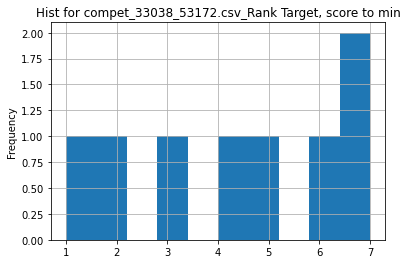

metric_column:  Rank Target , score_function:  min
Utility w/mean =  4.375
Utility w/median =  4.5
___________________
33038_53173.csv
  Rank Target Target AUC  Target AP Target Recall at top-K Rank Source  \
0   1.000 (1)  0.950 (1)  0.891 (1)              0.813 (1)   1.000 (1)   
1   2.000 (2)  0.939 (2)  0.871 (2)              0.782 (2)   2.000 (2)   
2   3.000 (3)  0.838 (3)  0.726 (3)              0.627 (3)   3.000 (3)   

  Source AUC  Source AP Source Recall at top-K Sentence-level Pearson's  
0  0.928 (1)  0.860 (1)              0.766 (1)                0.910 (1)  
1  0.924 (2)  0.841 (2)              0.737 (2)                0.880 (3)  
2  0.823 (3)  0.722 (3)              0.618 (3)                0.746 (4)  


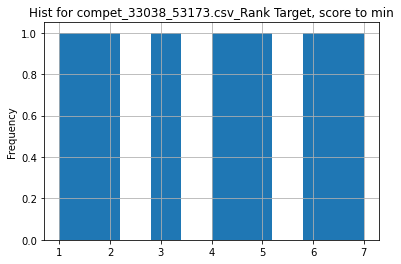

metric_column:  Rank Target , score_function:  min
Utility w/mean =  4.0
Utility w/median =  4.0
___________________
33038_53174.csv
  Rank Target Target AUC  Target AP Target Recall at top-K Rank Source  \
0   1.000 (1)  0.922 (1)  0.851 (1)              0.762 (1)   1.333 (1)   
1   2.000 (2)  0.917 (2)  0.842 (2)              0.751 (2)   3.000 (3)   
2   3.000 (3)  0.897 (3)  0.824 (3)              0.734 (3)   1.667 (2)   

  Source AUC  Source AP Source Recall at top-K Sentence-level Pearson's  
0  0.935 (1)  0.854 (1)              0.768 (2)                0.857 (1)  
1  0.928 (3)  0.851 (3)              0.762 (3)                0.801 (4)  
2  0.931 (2)  0.852 (2)              0.770 (1)                0.845 (2)  


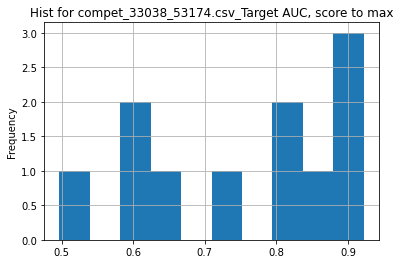

metric_column:  Target AUC , score_function:  max
Utility w/mean =  1.2138839018551764
Utility w/median =  1.1243902439024391
___________________
33038_53175.csv
  Rank Target Target AUC  Target AP Target Recall at top-K Rank Source  \
0   1.000 (1)  0.946 (1)  0.867 (1)              0.776 (1)   1.000 (1)   
1   2.000 (2)  0.940 (2)  0.844 (2)              0.745 (2)   2.000 (2)   
2   3.000 (3)  0.935 (3)  0.830 (3)              0.728 (3)   3.000 (3)   

  Source AUC  Source AP Source Recall at top-K Sentence-level Pearson's  
0  0.946 (1)  0.850 (1)              0.753 (1)                0.918 (1)  
1  0.934 (2)  0.813 (2)              0.708 (2)                0.868 (7)  
2  0.933 (3)  0.808 (3)              0.695 (3)                0.888 (6)  


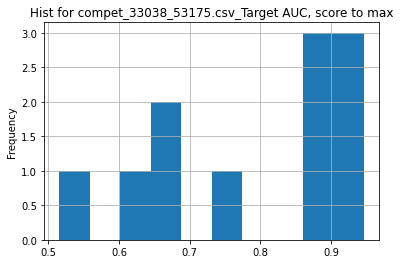

metric_column:  Target AUC , score_function:  max
Utility w/mean =  1.200784675744288
Utility w/median =  1.092378752886836
___________________
33038_53176.csv
  Rank Target Target AUC  Target AP Target Recall at top-K Rank Source  \
0   1.000 (1)  0.850 (1)  0.680 (1)              0.572 (1)   1.000 (1)   
1   2.667 (3)  0.707 (2)  0.475 (3)              0.336 (3)   2.000 (2)   
2   2.333 (2)  0.673 (3)  0.500 (2)              0.369 (2)   3.000 (3)   

  Source AUC  Source AP Source Recall at top-K Sentence-level Pearson's  
0  0.847 (1)  0.643 (1)              0.512 (1)                0.286 (5)  
1  0.731 (2)  0.495 (2)              0.356 (2)                0.268 (6)  
2  0.668 (3)  0.468 (3)              0.322 (3)                0.334 (4)  


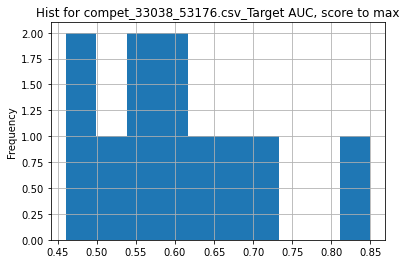

metric_column:  Target AUC , score_function:  max
Utility w/mean =  1.4130270515339278
Utility w/median =  1.4406779661016949
___________________
33038_53177.csv
  Rank Target Target AUC  Target AP Target Recall at top-K Rank Source  \
0   1.000 (1)  0.927 (1)  0.828 (1)              0.736 (1)   1.000 (1)   
1   2.000 (2)  0.806 (2)  0.633 (2)              0.515 (2)   2.000 (2)   
2   4.333 (4)  0.794 (3)  0.569 (5)              0.458 (5)   3.667 (4)   

  Source AUC  Source AP Source Recall at top-K Sentence-level Pearson's  
0  0.922 (1)  0.804 (1)              0.707 (1)                0.679 (1)  
1  0.848 (2)  0.709 (2)              0.593 (2)                0.666 (2)  
2  0.836 (3)  0.667 (4)              0.557 (4)                0.601 (6)  


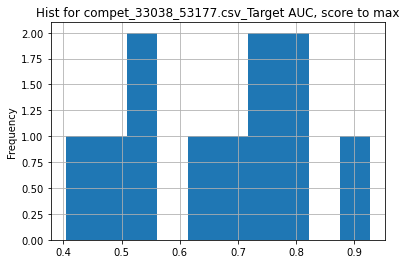

metric_column:  Target AUC , score_function:  max
Utility w/mean =  1.3856502242152466
Utility w/median =  1.3130311614730878
___________________
33102_53279.csv
___________________
33121_53309.csv
        score operational cost attention cost Computation time
0   -5.94 (1)        10.51 (3)     -44.33 (1)         3.15 (3)
1  -45.14 (2)        10.52 (1)    -175.00 (2)         1.07 (2)
2  -45.14 (2)        10.52 (1)    -175.00 (2)         0.93 (1)


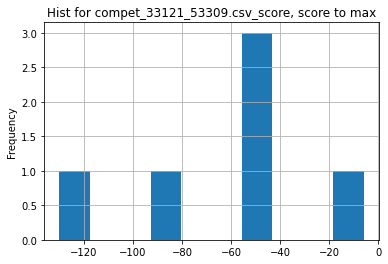

metric_column:  score , score_function:  max
Utility w/mean =  0.09817370465250806
Utility w/median =  0.13159060700044306
___________________
33121_53310.csv
       score operational cost attention cost Computation time
0  54.94 (1)        52.37 (2)      60.94 (2)      993.37 (14)
1  49.54 (2)        54.06 (1)      39.00 (3)     1304.53 (16)
2  48.93 (3)        39.83 (5)      70.17 (1)      646.18 (11)


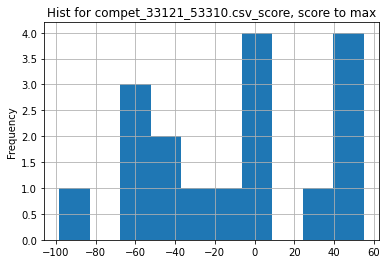

metric_column:  score , score_function:  max
Utility w/mean =  -5.389071605793086
Utility w/median =  -9.35945485519591
___________________
33121_53311.csv
       score operational cost attention cost Computation time
0  57.45 (1)        59.80 (1)      51.94 (1)      548.72 (10)
1  47.63 (2)        54.69 (2)      31.17 (2)     1465.96 (17)
2  46.81 (3)        54.18 (3)      29.61 (3)      787.32 (15)


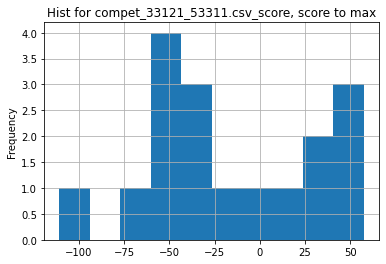

metric_column:  score , score_function:  max
Utility w/mean =  -3.3150605885747257
Utility w/median =  -1.9899549705576725
___________________
33121_53312.csv
___________________
33122_53313.csv
        score operational cost attention cost Computation time
0  -45.14 (1)        10.52 (1)    -175.00 (1)         0.94 (3)
1  -45.14 (1)        10.52 (1)    -175.00 (1)         0.97 (4)
2  -45.18 (2)        10.46 (2)    -175.00 (1)         0.81 (2)


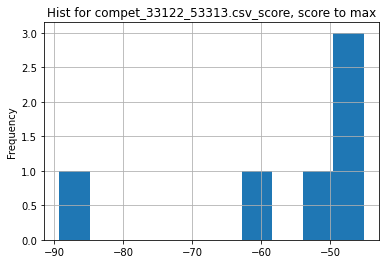

metric_column:  score , score_function:  max
Utility w/mean =  0.801301775147929
Utility w/median =  0.9164551822150037
___________________
33122_53314.csv
        score operational cost attention cost Computation time
0  -24.75 (1)        23.57 (1)    -137.50 (1)         1.28 (6)
1  -36.91 (2)        16.91 (2)    -162.50 (2)         0.98 (5)
2  -60.00 (3)         0.00 (3)    -200.00 (4)         0.50 (4)


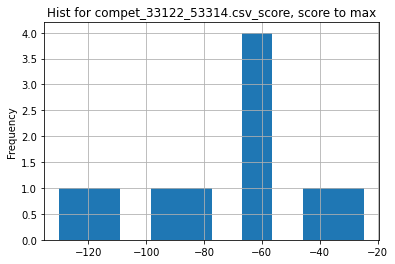

metric_column:  score , score_function:  max
Utility w/mean =  0.34231418218029935
Utility w/median =  0.4125
___________________
33122_53315.csv
        score operational cost attention cost Computation time
0  -19.18 (1)         2.60 (1)     -70.00 (1)         9.40 (5)
1  -27.85 (2)         0.00 (2)     -92.83 (2)         0.96 (4)
2  -27.85 (2)         0.00 (2)     -92.83 (2)         0.90 (3)


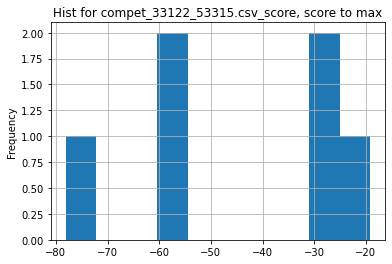

metric_column:  score , score_function:  max
Utility w/mean =  0.4216002344665885
Utility w/median =  0.4366533864541833
___________________
33122_53316.csv
___________________
33156_53353.csv
          AUC    Macro F1 Positive F1    Accuracy
0  0.7538 (1)  0.6444 (1)  0.8498 (5)  0.7631 (3)
1  0.7455 (2)  0.5967 (5)  0.8495 (6)  0.7551 (6)
2  0.7441 (3)  0.6139 (3)  0.8480 (7)  0.7558 (5)


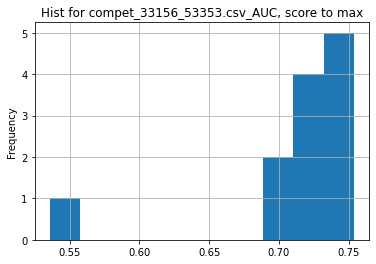

metric_column:  AUC , score_function:  max
Utility w/mean =  1.0583981746913942
Utility w/median =  1.0299221205082663
___________________
33156_53354.csv
          AUC    Macro F1 Positive F1    Accuracy
0  0.7919 (1)  0.6562 (5)  0.8551 (1)  0.7712 (1)
1  0.7856 (2)  0.6583 (4)  0.8473 (5)  0.7628 (4)
2  0.7853 (3)  0.6496 (6)  0.8487 (4)  0.7628 (4)


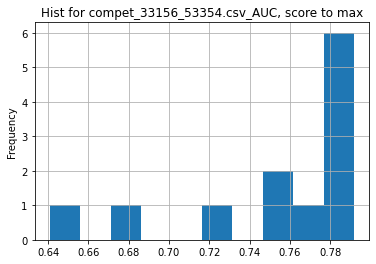

metric_column:  AUC , score_function:  max
Utility w/mean =  1.0523121899362153
Utility w/median =  1.019832582099163
___________________
33156_53355.csv
          AUC    Macro F1  Positive F1     Accuracy
0  0.8011 (1)  0.6799 (7)   0.8628 (1)   0.7844 (1)
1  0.7972 (2)  0.6829 (4)  0.8535 (13)   0.7746 (5)
2  0.7944 (3)  0.6819 (5)  0.7832 (29)  0.7142 (26)


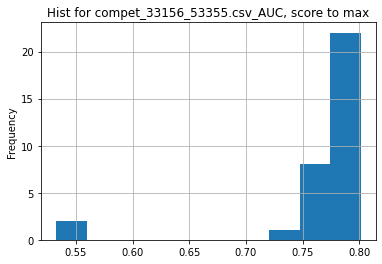

metric_column:  AUC , score_function:  max
Utility w/mean =  1.0457521252230053
Utility w/median =  1.0232469025418316
___________________
33164_53371.csv
___________________
33164_53372.csv
            MSE
0  234.0834 (1)
1  243.1471 (2)
2  263.6567 (3)


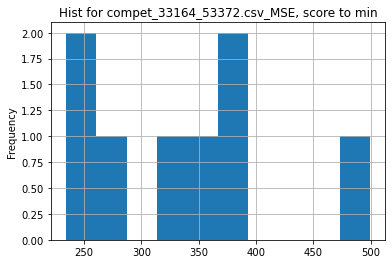

metric_column:  MSE , score_function:  min
Utility w/mean =  1.430977645146986
Utility w/median =  1.4362062837433154
___________________
33164_53373.csv
            MSE
0  161.9243 (1)
1  164.7274 (2)
2  174.9354 (3)


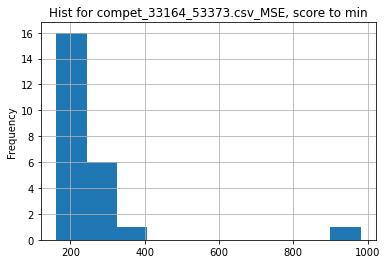

metric_column:  MSE , score_function:  min
Utility w/mean =  1.6071413205635803
Utility w/median =  1.4212610460567068
___________________
33214_53421.csv
___________________
33214_53422.csv
  Top1 accuracy
0      0.75 (1)
1      0.75 (2)
2      0.74 (3)


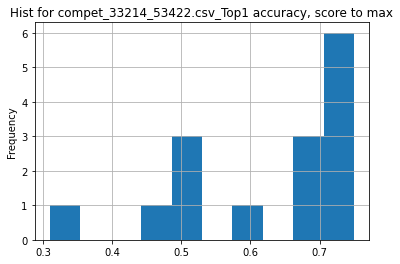

metric_column:  Top1 accuracy , score_function:  max
Utility w/mean =  1.200640341515475
Utility w/median =  1.0869565217391306
___________________
33216_53425.csv
___________________
33216_53426.csv
    Mean AP
0  0.97 (1)
1  0.96 (2)
2  0.94 (3)


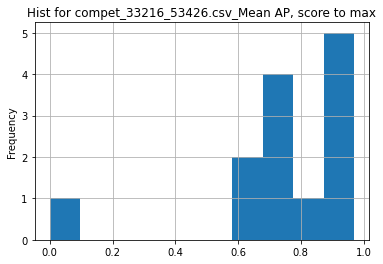

metric_column:  Mean AP , score_function:  max
Utility w/mean =  1.3013415892672862
Utility w/median =  1.2597402597402596
___________________
33222_53438.csv
  AP @ 0.50:0.95   AP @ 0.50  AP @ 0.75 AP @ 0.50:0.95 (small)  \
0      0.439 (1)  0.439 (33)  0.439 (1)              0.335 (1)   
1      0.305 (2)   0.655 (1)  0.241 (3)              0.153 (2)   
2      0.304 (3)  0.644 (11)  0.243 (2)             0.115 (15)   

  AP @ 0.50:0.95 (medium) AP @ 0.50:0.95 (large) Execution time  
0               0.417 (1)              0.324 (1)      26.9 (31)  
1               0.275 (3)             0.228 (19)      149.3 (7)  
2               0.273 (5)              0.237 (6)      213.4 (3)  


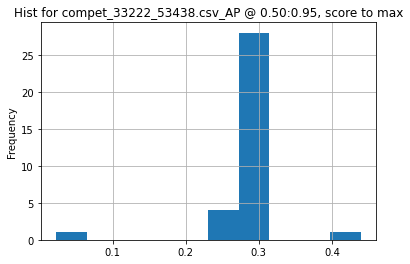

metric_column:  AP @ 0.50:0.95 , score_function:  max
Utility w/mean =  1.5210435137063079
Utility w/median =  1.4706867671691792
___________________
33222_53556.csv
File cannot be opened: 33222_53556.csv
___________________
33236_53453.csv
        Mean    Vehicle Pedestrian    Cyclist
0  77.81 (1)  86.33 (1)  71.56 (1)  75.53 (1)
1  69.03 (2)  81.74 (2)  56.63 (2)  68.74 (4)
2  67.95 (3)  79.27 (4)  55.57 (3)  69.02 (3)


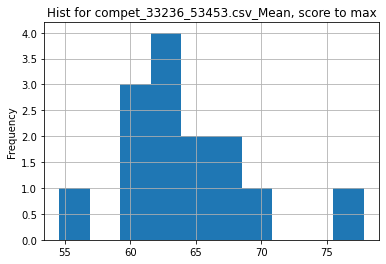

metric_column:  Mean , score_function:  max
Utility w/mean =  1.2136546453201422
Utility w/median =  1.2360603653693407
___________________
33236_53454.csv
        Mean    Vehicle Pedestrian    Cyclist
0  85.12 (1)  88.38 (1)  84.45 (1)  82.52 (1)
1  82.89 (2)  85.45 (3)  83.54 (2)  79.69 (2)
2  79.73 (3)  86.64 (2)  74.71 (6)  77.84 (5)


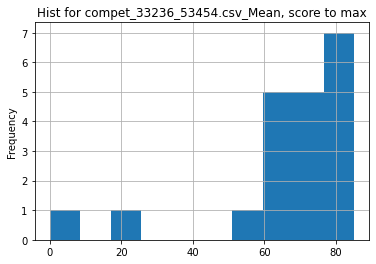

metric_column:  Mean , score_function:  max
Utility w/mean =  1.288320808832989
Utility w/median =  1.2293471981513575
___________________
33267_53506.csv
  Mean joint error (procrustes alignment)  \
0                                0.87 (1)   
1                                0.91 (2)   
2                                1.08 (3)   

  Mean joint error (scale and trans alignment)  \
0                                    15.34 (8)   
1                                    15.36 (9)   
2                                     2.41 (2)   

  Mean joint AUC (procrustes alignment)  \
0                             0.826 (9)   
1                             0.819 (8)   
2                             0.786 (7)   

  Mean joint AUC (scale and trans alignment)  \
0                                  0.069 (9)   
1                                  0.070 (7)   
2                                  0.558 (3)   

  Mesh error (procrustes alignment) Mesh error AUC (procrustes alignment)  \
0                   

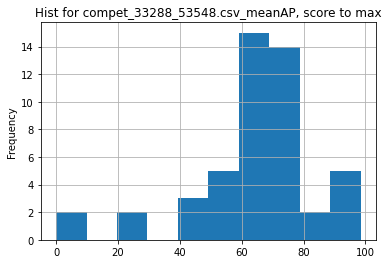

metric_column:  meanAP , score_function:  max
Utility w/mean =  1.5350428794727728
Utility w/median =  1.4722118333457999
___________________
33288_53549.csv
      meanAP APpedestrian  APcyclist      APcar    APtruck     APtram  \
0  85.24 (1)    83.16 (1)  89.44 (1)  93.94 (1)  90.24 (1)  87.94 (1)   
1  81.79 (2)    82.51 (2)  87.25 (2)  92.89 (2)  87.49 (2)  84.55 (2)   
2  81.27 (3)    81.07 (4)  86.58 (3)  92.65 (3)  87.36 (3)  83.80 (3)   

  APtricycle  
0  66.72 (1)  
1  56.08 (3)  
2  56.19 (2)  


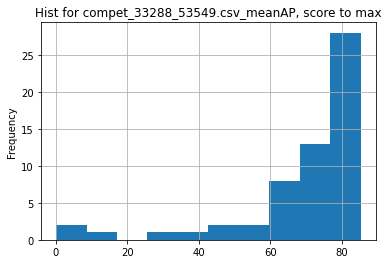

metric_column:  meanAP , score_function:  max
Utility w/mean =  1.247834427057042
Utility w/median =  1.1151959181003466
___________________
33340_53649.csv
___________________
33340_53650.csv
  AP @ 0.50:0.95  AP @ 0.50  AP @ 0.75 AP @ 0.50:0.95 (small)  \
0      0.477 (1)  0.747 (1)  0.522 (1)              0.185 (1)   
1      0.409 (2)  0.659 (2)  0.481 (2)              0.084 (5)   
2      0.409 (2)  0.659 (2)  0.481 (2)              0.084 (5)   

  AP @ 0.50:0.95 (medium) AP @ 0.50:0.95 (large)  
0               0.654 (1)              0.716 (1)  
1               0.591 (3)              0.677 (3)  
2               0.591 (3)              0.677 (3)  


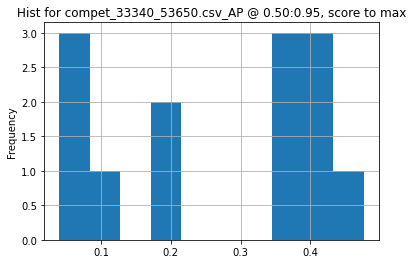

metric_column:  AP @ 0.50:0.95 , score_function:  max
Utility w/mean =  1.8389679715302487
Utility w/median =  1.3667621776504297
___________________
33355_53668.csv
  V@0.10:0.90       F@0.5       V@0.2       V@0.5 V@0.05:0.45 V@0.50:0.95
0  16.411 (1)  33.807 (1)  34.329 (1)  14.942 (1)  30.283 (1)   4.196 (2)
1  15.419 (2)  27.319 (3)  30.211 (2)  14.932 (2)  27.401 (2)   4.950 (1)
2  13.204 (3)  28.211 (2)  26.060 (3)  11.986 (3)  23.851 (3)   3.939 (3)


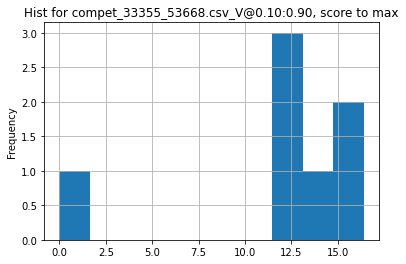

metric_column:  V@0.10:0.90 , score_function:  max
Utility w/mean =  1.4059283555055135
Utility w/median =  1.3424130879345604
___________________
33355_53669.csv
  V@0.10:0.90       F@0.5       V@0.2       V@0.5 V@0.05:0.45 V@0.50:0.95
0  24.235 (1)  48.675 (1)  48.596 (1)  22.823 (1)  43.564 (1)   7.166 (1)
1  19.132 (2)  29.872 (2)  35.045 (2)  20.826 (2)  32.477 (2)   7.112 (2)
2  11.923 (3)  28.485 (3)  25.780 (3)   9.888 (3)  22.506 (3)   2.651 (3)


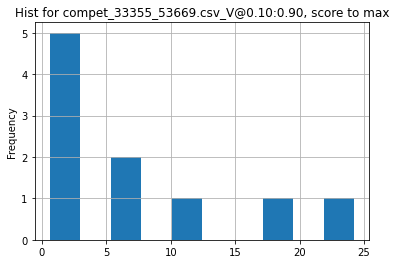

metric_column:  V@0.10:0.90 , score_function:  max
Utility w/mean =  3.1801957851087836
Utility w/median =  5.027486775230785
___________________
33378_53700.csv
         Loss
0  0.2304 (1)
1  0.3000 (2)
2  0.6280 (3)


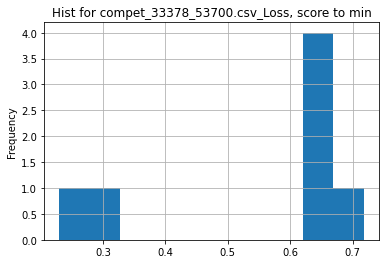

metric_column:  Loss , score_function:  min
Utility w/mean =  2.3819444444444446
Utility w/median =  2.7256944444444446
___________________
33378_53701.csv
         Loss
0  0.0841 (1)
1  0.3457 (2)
2  0.3652 (3)


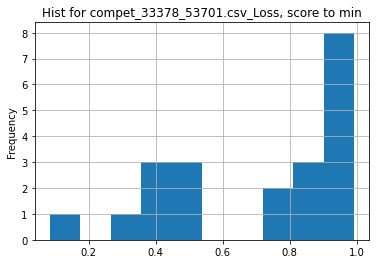

metric_column:  Loss , score_function:  min
Utility w/mean =  8.25972481739426
Utility w/median =  9.686087990487515
___________________
33378_53702.csv
___________________
33378_53703.csv
___________________
33386_53726.csv
           AUC   AP@tIoU0.5         AR@2
0  0.99769 (1)  0.00000 (1)  0.00000 (1)
1  0.99722 (2)  0.00000 (1)  0.00000 (1)
2  0.99676 (3)  0.00000 (1)  0.00000 (1)


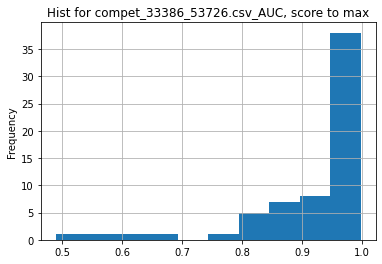

metric_column:  AUC , score_function:  max
Utility w/mean =  1.0858751254671002
Utility w/median =  1.0265567765567765
___________________
33386_53727.csv
           AUC   AP@tIoU0.5         AR@2
0  0.98007 (1)  0.00000 (1)  0.00000 (1)
1  0.97836 (2)  0.00000 (1)  0.00000 (1)
2  0.97517 (3)  0.00000 (1)  0.00000 (1)


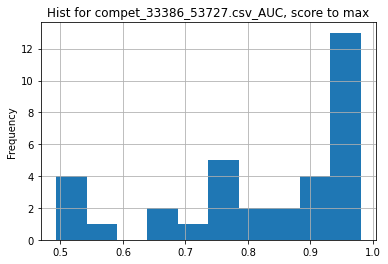

metric_column:  AUC , score_function:  max
Utility w/mean =  1.1960700490920815
Utility w/median =  1.1050139244359758
___________________
33386_53728.csv
           AUC    AP@tIoU0.5         AR@2
0  0.00000 (1)   0.31026 (9)  0.48569 (3)
1  0.00000 (1)   0.31215 (8)  0.49678 (2)
2  0.00000 (1)  0.09874 (12)  0.23585 (8)


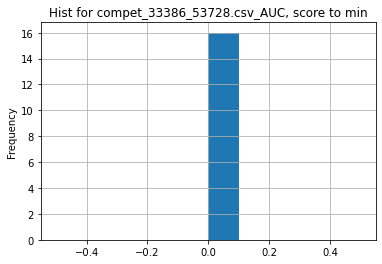

metric_column:  AUC , score_function:  min
File cannot be opened: 33386_53728.csv
___________________
33386_53729.csv
___________________
33396_53749.csv
File cannot be opened: 33396_53749.csv
___________________
33396_53750.csv
File cannot be opened: 33396_53750.csv
___________________
33411_53770.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  3.00 (2)  0.6749 (1)  0.6272 (2)  0.4859 (2)       2244030744.0 (5)   
1  2.40 (1)  0.6653 (2)  0.6266 (1)  0.4824 (1)       2243941083.0 (4)   
2  5.00 (4)  0.6649 (3)  0.6422 (3)  0.4953 (3)       4872322439.0 (8)   

       Model Params  
0   560981507.0 (5)  
1   560941057.0 (4)  
2  1214683792.0 (8)  


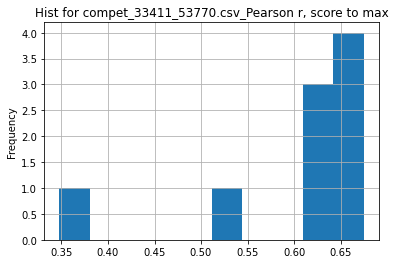

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1207860503736506
Utility w/median =  1.0692332065906212
___________________
33411_53771.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  2.60 (1)  0.5835 (1)  0.5442 (1)  0.3896 (1)       2243941083.0 (5)   
1  4.40 (2)  0.5786 (2)  0.5673 (2)  0.3929 (2)       2409244995.0 (8)   
2  5.80 (5)  0.5677 (3)  0.5796 (4)  0.4295 (4)       2445115000.0 (9)   

      Model Params  
0  560941057.0 (5)  
1  598943476.0 (8)  
2  611278859.0 (9)  


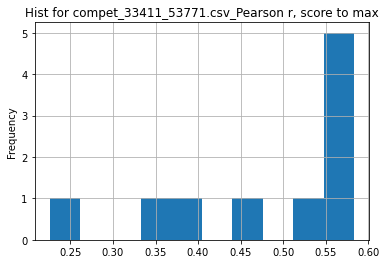

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2042846528523075
Utility w/median =  1.0813565604151223
___________________
33411_53772.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  3.00 (1)  0.6025 (1)  0.5804 (1)  0.4499 (1)       2244030744.0 (6)   
1  6.00 (6)  0.5862 (2)  0.6312 (5)  0.4988 (5)       4872322439.0 (9)   
2  4.00 (2)  0.5828 (3)  0.6265 (4)  0.4868 (3)       2243941083.0 (5)   

       Model Params  
0   560981507.0 (6)  
1  1214683792.0 (9)  
2   560941057.0 (5)  


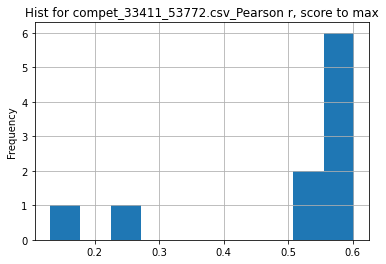

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2221095334685599
Utility w/median =  1.0747413485551196
___________________
33411_53773.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  4.20 (2)  0.9082 (1)  0.3925 (2)  0.3160 (6)       2244030744.0 (6)   
1  4.60 (3)  0.9008 (2)  0.3926 (3)  0.2878 (2)       2503797760.0 (8)   
2  3.00 (1)  0.9008 (3)  0.3844 (1)  0.2859 (1)       2243941083.0 (5)   

      Model Params  
0  560981507.0 (6)  
1  611278859.0 (8)  
2  560941057.0 (5)  


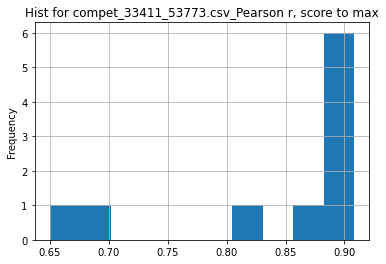

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.078110161443495
Utility w/median =  1.0195902329497615
___________________
33411_53774.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  3.40 (1)  0.8117 (1)  0.4882 (1)  0.3931 (1)       2244030744.0 (7)   
1  4.80 (2)  0.8081 (2)  0.5198 (5)  0.4093 (5)       2243941083.0 (6)   
2  6.20 (6)  0.7956 (3)  0.5190 (4)  0.4038 (4)      4872322439.0 (10)   

        Model Params  
0    560981507.0 (7)  
1    560941057.0 (6)  
2  1214683792.0 (10)  


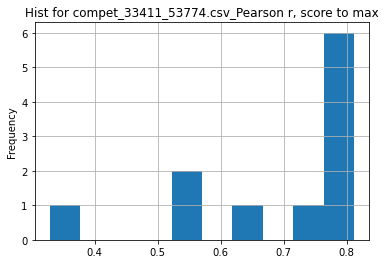

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.170163689501068
Utility w/median =  1.026299152863826
___________________
33411_53775.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  5.20 (4)  0.8667 (1)  0.5698 (7)  0.4260 (6)       2244030744.0 (6)   
1  2.80 (1)  0.8580 (2)  0.5043 (1)  0.3840 (1)       2243941083.0 (5)   
2  5.40 (5)  0.8559 (3)  0.5152 (2)  0.4009 (4)       4872322439.0 (9)   

       Model Params  
0   560981507.0 (6)  
1   560941057.0 (5)  
2  1214683792.0 (9)  


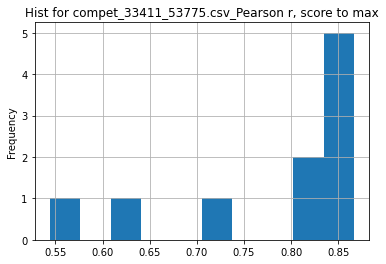

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.105512895737136
Utility w/median =  1.034865671641791
___________________
33411_53776.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  4.20 (2)  0.6052 (1)  0.7417 (1)  0.5828 (1)       4872322439.0 (9)   
1  5.00 (5)  0.5956 (2)  0.7825 (6)  0.6086 (5)       2244030744.0 (6)   
2  4.60 (3)  0.5947 (3)  0.7446 (2)  0.5852 (2)       2503797760.0 (8)   

       Model Params  
0  1214683792.0 (9)  
1   560981507.0 (6)  
2   611278859.0 (8)  


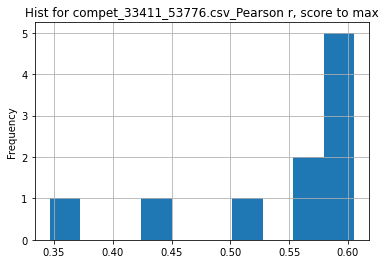

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1229242044716579
Utility w/median =  1.045611610228058
___________________
33411_53777.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  2.60 (1)  0.8060 (1)  0.5338 (1)  0.3881 (1)       2244030744.0 (5)   
1  4.60 (4)  0.7927 (2)  0.5715 (4)  0.3923 (3)       2503797760.0 (7)   
2  5.80 (7)  0.7921 (3)  0.5825 (5)  0.4115 (5)       4872322439.0 (8)   

       Model Params  
0   560981507.0 (5)  
1   611278859.0 (7)  
2  1214683792.0 (8)  


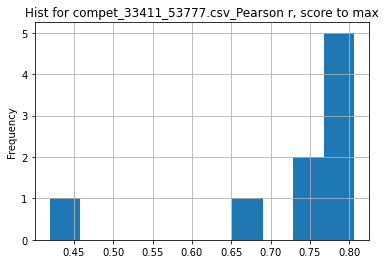

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1039751628416634
Utility w/median =  1.02466310704297
___________________
33411_53779.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  3.60 (1)  0.5816 (1)  0.7462 (1)  0.5986 (4)       2244030744.0 (6)   
1  5.20 (4)  0.5766 (2)  0.7505 (5)  0.5830 (1)       4872322439.0 (9)   
2  4.20 (2)  0.5729 (3)  0.7472 (3)  0.6020 (5)       2243941083.0 (5)   

       Model Params  
0   560981507.0 (6)  
1  1214683792.0 (9)  
2   560941057.0 (5)  


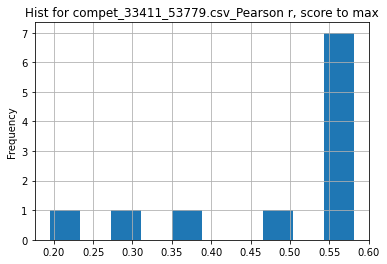

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2107723461836901
Utility w/median =  1.0659824046920823
___________________
33411_53780.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  2.20 (1)  0.3643 (1)  0.7548 (1)  0.5556 (1)       2243941083.0 (4)   
1  3.20 (2)  0.3589 (2)  0.7574 (2)  0.5595 (2)       2244030744.0 (5)   
2  4.60 (4)  0.3551 (3)  0.7635 (3)  0.5663 (3)       2277509716.0 (7)   

      Model Params  
0  560941057.0 (4)  
1  560981507.0 (5)  
2  569330715.0 (7)  


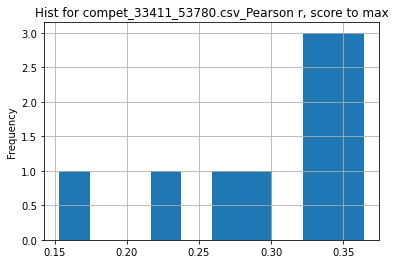

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.2021118627289225
Utility w/median =  1.102269288956127
___________________
33411_53782.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  2.80 (1)  0.6474 (1)  0.7364 (1)  0.6048 (2)       2244030744.0 (5)   
1  4.00 (3)  0.6368 (2)  0.7382 (3)  0.6045 (1)       2503797760.0 (7)   
2  6.20 (7)  0.6283 (3)  0.7797 (6)  0.6584 (6)       4872322439.0 (8)   

       Model Params  
0   560981507.0 (5)  
1   611278859.0 (7)  
2  1214683792.0 (8)  


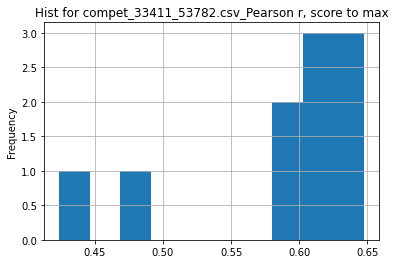

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1099490801858485
Utility w/median =  1.0568070519098922
___________________
33411_53784.csv
   < Rank >   Pearson r        RMSE         MAE Disk Footprint (Bytes)  \
0  2.80 (1)  0.6787 (1)  0.7293 (2)  0.5635 (1)       2244030744.0 (5)   
1  6.40 (7)  0.6616 (2)  0.8147 (8)  0.6407 (8)       2503797760.0 (7)   
2  4.00 (2)  0.6590 (3)  0.7441 (5)  0.5782 (4)       2243941083.0 (4)   

      Model Params  
0  560981507.0 (5)  
1  611278859.0 (7)  
2  560941057.0 (4)  


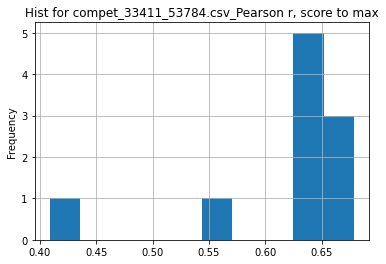

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1007492944954425
Utility w/median =  1.0529010238907848
___________________
33412_53794.csv
___________________
33412_53795.csv
   < Rank >   Pearson r        RMSE         MAE    Disk Footprint  \
0  3.00 (1)  0.6531 (1)  0.1513 (1)  0.1079 (1)  2243954093.0 (6)   
1  4.60 (6)  0.6173 (2)  0.1715 (4)  0.1163 (3)  2294887576.0 (7)   
2  4.20 (4)  0.5773 (3)  0.1743 (6)  0.1154 (2)  2243439613.0 (5)   

      Model Params  
0  560944640.0 (6)  
1  569368609.0 (7)  
2  560814661.0 (5)  


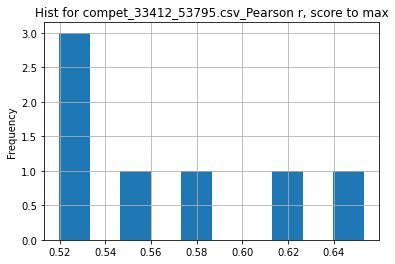

metric_column:  Pearson r , score_function:  max
Utility w/mean =  1.1496793662768767
Utility w/median =  1.188102601418956
___________________
33412_53796.csv
___________________
33412_53797.csv
___________________
33412_53798.csv
___________________
33412_53799.csv
___________________
33412_53800.csv
___________________
33412_53801.csv
___________________
33412_53802.csv
___________________
33412_53803.csv
___________________
33412_53804.csv
___________________
33412_53805.csv
___________________
33413_53806.csv
   < Rank >         MCC      F1 BAD       F1 OK Disk Footprint (Bytes)  \
0  3.00 (1)  0.5231 (1)  0.5993 (1)  0.9066 (4)       6863178235.0 (6)   
1  3.60 (3)  0.5095 (2)  0.5870 (2)  0.8997 (5)       2243954093.0 (4)   
2  3.80 (4)  0.4661 (3)  0.5513 (3)  0.9141 (2)       2294887576.0 (5)   

      Model Params  
0  484431872.0 (3)  
1  560944640.0 (5)  
2  569368609.0 (6)  
File cannot be opened: 33413_53806.csv
___________________
33413_53807.csv
   < Rank >         MCC 

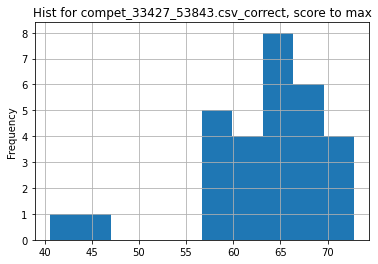

metric_column:  correct , score_function:  max
Utility w/mean =  1.146752971713738
Utility w/median =  1.1346213773761293
___________________
33427_53845.csv
     correct
0  68.13 (1)
1  62.80 (2)
2  59.80 (3)


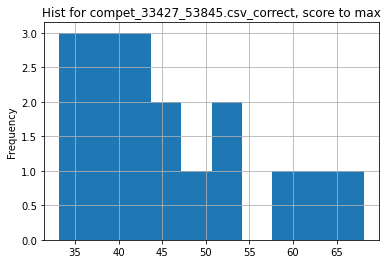

metric_column:  correct , score_function:  max
Utility w/mean =  1.4883000732450105
Utility w/median =  1.5698156682027649
___________________
33427_53848.csv
     correct
0  69.23 (1)
1  68.66 (2)
2  66.78 (3)


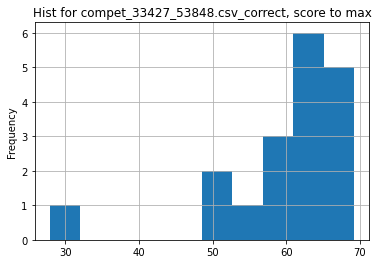

metric_column:  correct , score_function:  max
Utility w/mean =  1.1592970574280637
Utility w/median =  1.1110576151500562
___________________
33427_53849.csv
     correct
0  76.33 (1)
1  71.33 (2)
2  59.87 (3)


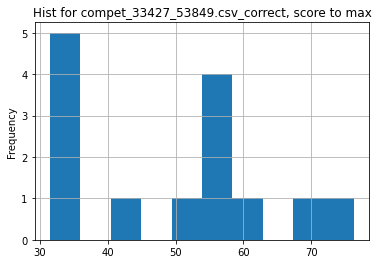

metric_column:  correct , score_function:  max
Utility w/mean =  1.531544701464729
Utility w/median =  1.4214152700186218
___________________
33430_53853.csv
   CD_Loss@Com Rot_Error@Reg Trans_Error@Reg      MSE@Reg
0  5.01191 (1)   1.00000 (1)     1.00000 (1)  1.00000 (1)
1  5.01245 (2)   1.00000 (1)     1.00000 (1)  1.00000 (1)
2  5.14602 (3)   1.00000 (1)     1.00000 (1)  1.00000 (1)


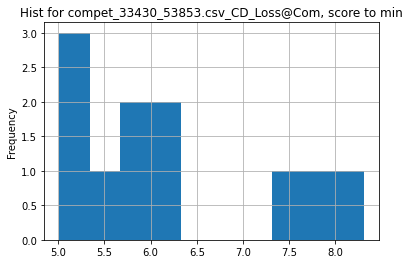

metric_column:  CD_Loss@Com , score_function:  min
Utility w/mean =  1.2404405433530057
Utility w/median =  1.192862601283742
___________________
33430_53854.csv
   CD_Loss@Com  Rot_Error@Reg Trans_Error@Reg       MSE@Reg
0  1.00000 (1)    3.00053 (3)     0.02103 (1)   0.07340 (1)
1  1.00000 (1)   13.70021 (8)     0.04878 (7)   0.28789 (8)
2  1.00000 (1)  20.66070 (13)    0.14816 (10)  0.50875 (10)


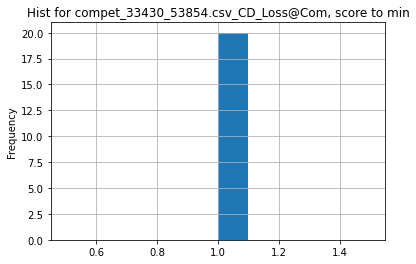

metric_column:  CD_Loss@Com , score_function:  min
Utility w/mean =  1.0
Utility w/median =  1.0
___________________
33504_53925.csv
File cannot be opened: 33504_53925.csv
___________________
33556_54027.csv
       norec multibooked_ca multibooked_eu  opener_en  opener_es       mpqa  \
0  0.532 (1)      0.722 (2)      0.674 (2)  0.729 (1)  0.671 (4)  0.454 (1)   
1  0.482 (4)      0.723 (1)      0.708 (1)  0.710 (2)  0.705 (1)  0.318 (3)   
2  0.517 (2)      0.711 (3)      0.657 (3)  0.693 (3)  0.677 (3)  0.321 (2)   

  darmstadt_unis Average score  
0      0.470 (1)     0.607 (1)  
1      0.403 (2)     0.578 (2)  
2      0.398 (3)     0.568 (3)  
File cannot be opened: 33556_54027.csv
___________________
33556_54028.csv
       norec multibooked_ca multibooked_eu  opener_en  opener_es       mpqa  \
0  0.529 (2)      0.728 (1)      0.739 (1)  0.760 (2)  0.722 (4)  0.447 (1)   
1  0.524 (3)      0.728 (1)      0.739 (1)  0.763 (1)  0.742 (1)  0.416 (2)   
2  0.533 (1)      0.709 (3)    

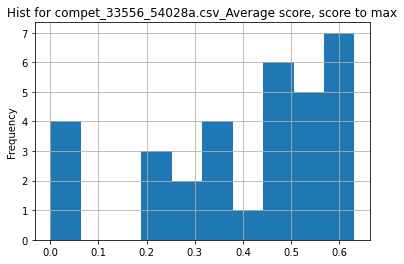

metric_column:  Average score , score_function:  max
Utility w/mean =  1.569529731830548
Utility w/median =  1.3914002205071665
___________________
33556_54028b.csv
       EN-ES      EN-CA      EN-EU Average score
0  0.644 (1)  0.643 (1)  0.632 (1)     0.640 (1)
1  0.618 (3)  0.562 (7)  0.584 (2)     0.588 (2)
2  0.628 (2)  0.607 (3)  0.527 (4)     0.587 (3)


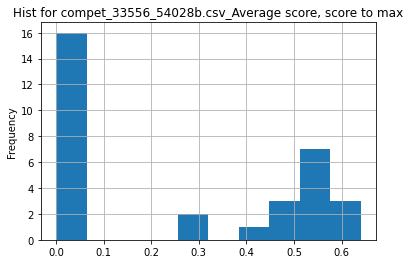

metric_column:  Average score , score_function:  max
Utility w/mean =  2.531520395550062
Utility w/median =  4.555160142348754
___________________
33556_54029.csv
       norec multibooked_ca multibooked_eu  opener_en  opener_es       mpqa  \
0  0.529 (2)      0.728 (1)      0.739 (1)  0.760 (2)  0.722 (4)  0.447 (1)   
1  0.524 (3)      0.728 (1)      0.739 (1)  0.763 (1)  0.742 (1)  0.416 (2)   
2  0.533 (1)      0.709 (3)      0.715 (3)  0.756 (3)  0.732 (3)  0.402 (3)   

  darmstadt_unis Average score  
0      0.494 (1)     0.631 (1)  
1      0.485 (2)     0.628 (2)  
2      0.463 (4)     0.616 (3)  
File cannot be opened: 33556_54029.csv
___________________
33573_54061.csv
            mAP
0  73.47320 (1)
1  72.63201 (2)
2  71.80931 (3)


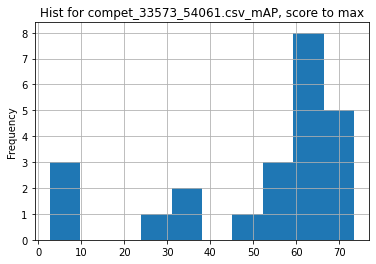

metric_column:  mAP , score_function:  max
Utility w/mean =  1.4290037108286064
Utility w/median =  1.2183559626698859
___________________
33573_54062.csv
            mAP
0  62.54125 (1)
1  58.46535 (2)
2  58.23432 (3)


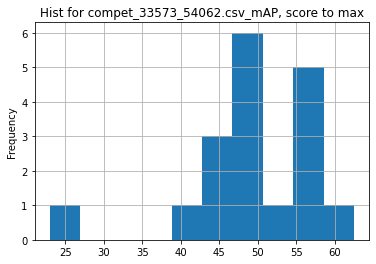

metric_column:  mAP , score_function:  max
Utility w/mean =  1.2605434115399496
Utility w/median =  1.260497045932852
___________________
33622_54151.csv
          Loss
0  111.000 (1)
1  111.000 (1)
2  111.000 (1)


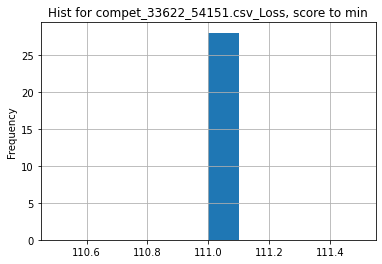

metric_column:  Loss , score_function:  min
Utility w/mean =  1.0
Utility w/median =  1.0
___________________
33622_54152.csv
        Loss
0  4.823 (1)
1  7.868 (2)
2  9.047 (3)


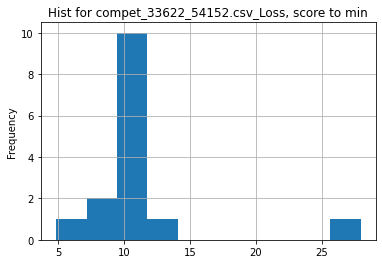

metric_column:  Loss , score_function:  min
Utility w/mean =  2.235565692169466
Utility w/median =  2.066763425253991
___________________
33622_54153.csv
         Loss
0  13.527 (1)
1  15.104 (2)
2  20.356 (3)


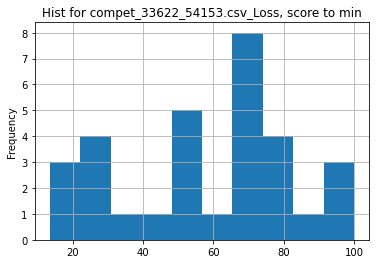

metric_column:  Loss , score_function:  min
Utility w/mean =  4.276143054393005
Utility w/median =  4.928661196126266
___________________
33622_54154.csv
         Loss
0   0.866 (1)
1  13.664 (2)
2  24.762 (3)


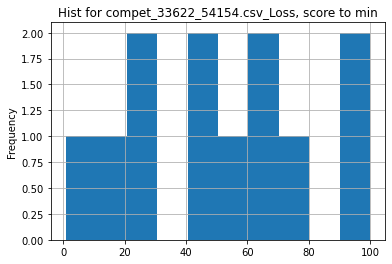

metric_column:  Loss , score_function:  min
Utility w/mean =  60.84661277906081
Utility w/median =  61.797344110854496
___________________
33622_54155.csv
         Loss
0   0.918 (1)
1  16.121 (2)
2  29.539 (3)


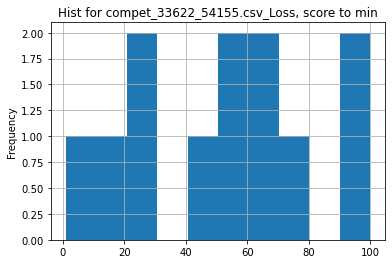

metric_column:  Loss , score_function:  min
Utility w/mean =  58.74146695715323
Utility w/median =  61.912309368191714
___________________
33634_54165.csv
___________________
33634_54166.csv
___________________
33647_54185.csv
       Rank CIFAR-10 Agreement CIFAR-10 TVD IMDB Agreement    IMDB TVD
0  3.00 (2)         1.0000 (1)   0.0000 (1)          - (5)       - (5)
1  1.50 (1)         0.9390 (2)   0.0859 (2)     0.9366 (1)  0.0676 (1)
2  4.00 (3)         0.9347 (3)   0.1063 (3)          - (5)       - (5)
File cannot be opened: 33647_54185.csv
___________________
33647_54186.csv
___________________
33729_54322.csv
       MOTA        IDF1
0  0.87 (1)  0.8636 (2)
1  0.82 (2)  0.6280 (4)
2  0.80 (3)  0.6155 (5)


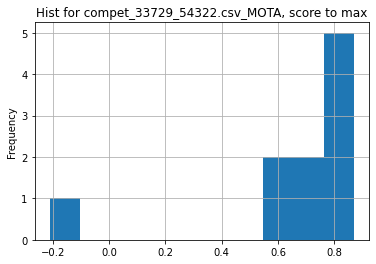

metric_column:  MOTA , score_function:  max
Utility w/mean =  1.35303265940902
Utility w/median =  1.12987012987013
___________________
33729_54323.csv
       MOTA        IDF1
0  0.96 (1)  0.9757 (1)
1  0.96 (2)  0.9112 (3)
2  0.95 (3)  0.8430 (4)


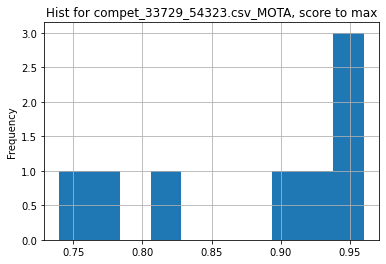

metric_column:  MOTA , score_function:  max
Utility w/mean =  1.0909090909090908
Utility w/median =  1.0491803278688523
___________________
33739_54334.csv
___________________
33739_54335.csv
     Accuracy
0  0.5355 (1)
1  0.5027 (2)
2  0.4918 (3)


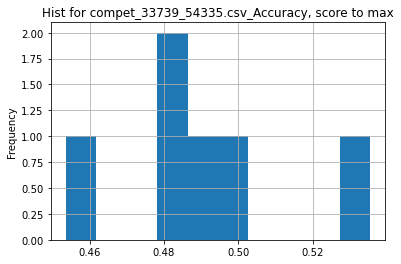

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0868682768418916
Utility w/median =  1.0949800633882016
___________________
33828_54453.csv
___________________
33830_54456.csv
        AMCA AMCA_Pedestrian AMCA_Cyclist   AMCA_Car AMCA_Truck  AMCA_Tram  \
0  81.77 (1)       90.93 (1)    76.81 (1)  97.44 (1)  97.04 (1)  92.53 (1)   
1  72.00 (2)       89.01 (2)    51.77 (4)  91.20 (6)  88.39 (3)  77.65 (2)   
2  68.78 (3)       72.62 (4)    63.72 (2)  95.42 (3)  94.56 (2)  66.54 (3)   

  AMCA_Tricycle  
0     35.84 (1)  
1     33.98 (2)  
2     19.82 (3)  


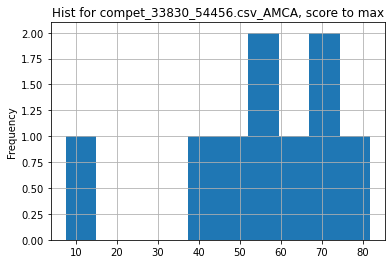

metric_column:  AMCA , score_function:  max
Utility w/mean =  1.4883208283616802
Utility w/median =  1.438852718634524
___________________
33830_54457.csv
        AMCA AMCA_Pedestrian AMCA_Cyclist   AMCA_Car AMCA_Truck  AMCA_Tram  \
0  72.52 (1)       68.98 (5)    82.79 (1)  96.03 (2)  89.32 (1)  80.04 (1)   
1  68.65 (2)       80.98 (1)    61.57 (4)  93.90 (4)  83.81 (4)  65.83 (2)   
2  65.54 (3)       70.00 (4)    67.61 (3)  90.16 (6)  86.24 (2)  64.25 (3)   

  AMCA_Tricycle  
0     17.97 (2)  
1     25.78 (1)  
2     14.97 (3)  


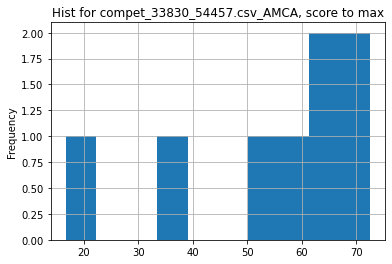

metric_column:  AMCA , score_function:  max
Utility w/mean =  1.3314056224899598
Utility w/median =  1.2018561484918793
___________________
33835_54470.csv
___________________
33835_54471.csv
___________________
33835_54472.csv
  correlation
0   0.818 (1)
1   0.802 (2)
2   0.792 (3)
File cannot be opened: 33835_54472.csv
___________________
33993_54577.csv
         MAP Task_1_MAP Task_2_MAP Task_3_MAP Task_4_MAP AP_pedestrian  \
0  62.27 (1)  59.34 (1)  47.02 (2)  69.07 (1)  73.64 (1)     41.84 (1)   
1  59.56 (2)  53.85 (2)  48.70 (1)  68.87 (2)  66.82 (2)     41.34 (2)   
2  55.53 (3)  53.47 (3)  43.40 (3)  63.79 (3)  61.46 (3)     38.36 (3)   

  AP_cyclist     AP_car   AP_truck    AP_tram AP_tricycle  
0  65.25 (2)  80.40 (1)  67.81 (1)  70.34 (1)   37.88 (1)  
1  68.44 (1)  77.24 (2)  65.33 (2)  65.67 (3)   19.88 (2)  
2  61.90 (3)  75.07 (3)  62.38 (3)  66.44 (2)    4.46 (3)  


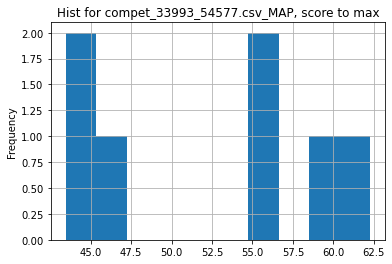

metric_column:  MAP , score_function:  max
Utility w/mean =  1.1883263815054113
Utility w/median =  1.1213758328831263
___________________
33993_54578.csv
___________________
33998_54595.csv
___________________
34011_54612.csv
___________________
34011_54613.csv
___________________
34011_54614.csv
___________________
34022_54640.csv
___________________
34022_54641.csv
File cannot be opened: 34022_54641.csv
___________________
34056_54709.csv
___________________
34056_54710.csv
___________________
34056_54711.csv
___________________
34056_54712.csv
___________________
34058_54715.csv
          DCF         EER
0  0.1034 (1)  1.8460 (1)
1  0.1175 (2)  2.8400 (3)
2  0.1291 (3)  2.2710 (2)


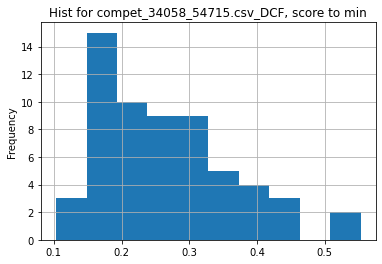

metric_column:  DCF , score_function:  min
Utility w/mean =  2.550064474532559
Utility w/median =  2.429400386847195
___________________
34058_54716.csv
          DCF         EER
0  0.1028 (1)  1.9810 (2)
1  0.1041 (2)  2.0210 (3)
2  0.1061 (3)  1.8940 (1)


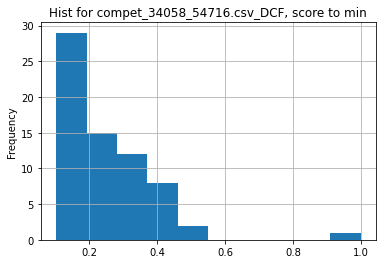

metric_column:  DCF , score_function:  min
Utility w/mean =  2.5161304373076248
Utility w/median =  2.183852140077821
___________________
34066_54719.csv
          DCF         EER
0  0.1034 (1)  1.8460 (1)
1  0.1175 (2)  2.8400 (5)
2  0.1313 (3)  2.0490 (2)


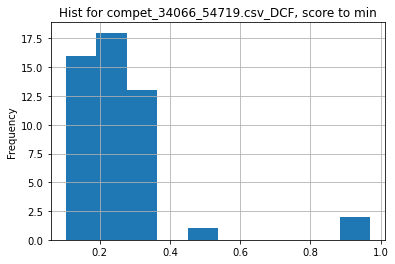

metric_column:  DCF , score_function:  min
Utility w/mean =  2.5009090909090905
Utility w/median =  2.1402321083172144
___________________
34066_54720.csv
          DCF         EER
0  0.0908 (1)  1.6210 (1)
1  0.1005 (2)  1.9220 (3)
2  0.1006 (3)  1.9320 (4)


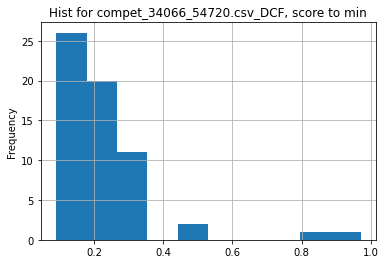

metric_column:  DCF , score_function:  min
Utility w/mean =  2.495558604751932
Utility w/median =  2.0903083700440526
___________________
34069_54723.csv
          DCF         EER
0  0.3413 (2)  5.5940 (1)
1  0.3237 (1)  6.4860 (2)
2  0.3686 (3)  6.8910 (3)


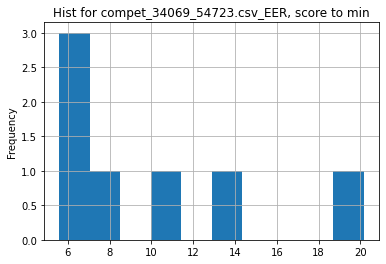

metric_column:  EER , score_function:  min
Utility w/mean =  1.8459829409060724
Utility w/median =  1.376296031462281
___________________
34069_54724.csv
          DCF         EER
0  0.2844 (1)  5.2350 (1)
1  0.3413 (3)  5.5940 (2)
2  0.3237 (2)  6.4860 (3)


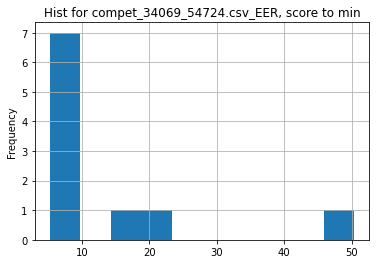

metric_column:  EER , score_function:  min
Utility w/mean =  2.5033046800382044
Utility w/median =  1.3191977077363897
___________________
34113_54775.csv
          DER           JER
0  5.0726 (1)  29.1640 (20)
1  5.1455 (2)   26.0231 (6)
2  5.3162 (3)   24.5044 (3)


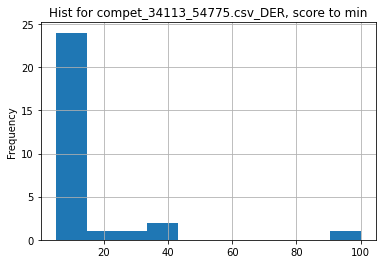

metric_column:  DER , score_function:  min
Utility w/mean =  2.6277668936694365
Utility w/median =  1.2158064897685603
___________________
34113_54776.csv
          DER           JER
0  4.7708 (1)   22.6105 (2)
1  4.9221 (2)   23.5583 (3)
2  5.0014 (3)  26.7653 (10)


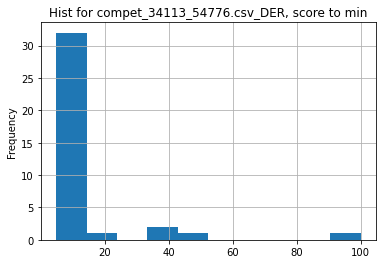

metric_column:  DER , score_function:  min
Utility w/mean =  2.516227659704645
Utility w/median =  1.2734761465582292
___________________
34124_54789.csv
___________________
34124_54792.csv
  GEOMETRIC_MEAN         R1         R5        R10
0      26.40 (1)  13.56 (1)  32.47 (1)  41.79 (2)
1      24.96 (2)  11.81 (3)  31.46 (2)  41.88 (1)
2      23.15 (3)  12.08 (2)  27.40 (3)  37.45 (3)


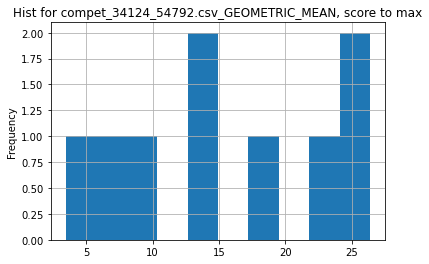

metric_column:  GEOMETRIC_MEAN , score_function:  max
Utility w/mean =  1.72186390318139
Utility w/median =  1.9312362838332113
___________________
34175_54850.csv
___________________
34175_54851.csv
      Task B
0  0.731 (1)
1  0.731 (2)
2  0.731 (3)
File cannot be opened: 34175_54851.csv
___________________
34175_59599.csv
File cannot be opened: 34175_59599.csv
___________________
34190_54873.csv
___________________
34190_54874.csv
___________________
34235_54968.csv
___________________
34235_54969.csv
     SIZE(M)        RMSE
0   2.41 (8)  4.6208 (1)
1  42.33 (1)  4.6598 (2)
2   5.00 (5)  5.3084 (3)


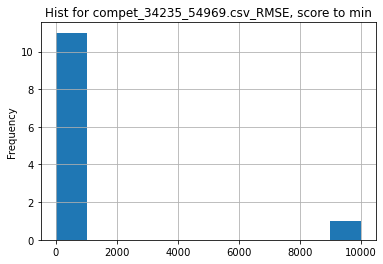

metric_column:  RMSE , score_function:  min
Utility w/mean =  184.76758353531855
Utility w/median =  1.3243918801939059
___________________
34235_54970.csv
     SIZE(M)        RMSE
0  10.28 (2)  4.3331 (1)
1  18.20 (1)  4.3744 (2)
2   5.00 (4)  5.0866 (3)


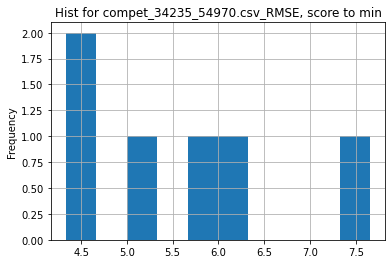

metric_column:  RMSE , score_function:  min
Utility w/mean =  1.290011769864531
Utility w/median =  1.2605524912879924
___________________
34338_55087.csv
___________________
34338_55088.csv
         mAP
0  68.48 (1)
1  60.17 (2)
2  56.85 (3)


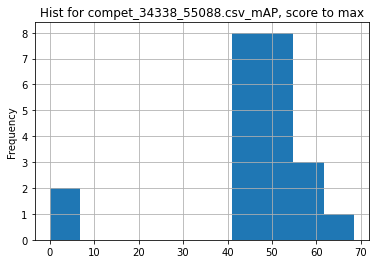

metric_column:  mAP , score_function:  max
Utility w/mean =  1.514891905480141
Utility w/median =  1.4272613588995415
___________________
34342_55092.csv
    <Rank>      MPJPE     PCK@0.2     PCK@0.5         mAP
0  9.7 (2)  1.286 (1)  0.000 (15)  0.025 (15)  0.000 (13)
1  9.7 (2)  1.001 (2)  0.010 (14)  0.157 (14)  0.000 (13)
2  9.7 (2)  0.725 (3)  0.014 (13)  0.199 (13)  0.000 (13)


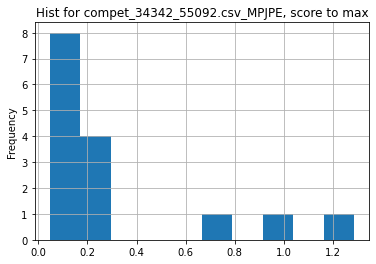

metric_column:  MPJPE , score_function:  max
Utility w/mean =  4.300044583147572
Utility w/median =  12.247619047619049
___________________
34344_55093.csv
File cannot be opened: 34344_55093.csv
___________________
34344_55094.csv
File cannot be opened: 34344_55094.csv
___________________
34344_55095.csv
File cannot be opened: 34344_55095.csv
___________________
34355_55103.csv
___________________
34379_55141.csv
     Score
0  0.0 (1)
1  0.0 (1)
2  0.0 (1)


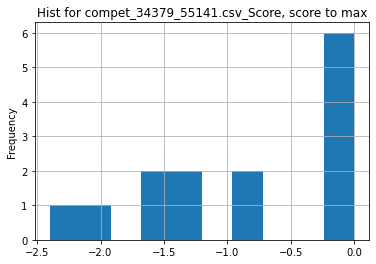

metric_column:  Score , score_function:  max
Utility w/mean =  -0.0
Utility w/median =  -0.0
___________________
34379_55142.csv
___________________
34399_55156.csv
          err
0  0.0001 (1)
1  0.0001 (1)
2  0.1717 (2)


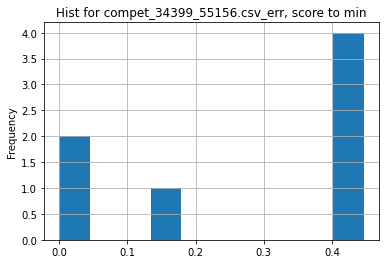

metric_column:  err , score_function:  min
Utility w/mean =  2693.714285714286
Utility w/median =  4094.9999999999995
___________________
34470_55243.csv
File cannot be opened: 34470_55243.csv
___________________
34473_55245.csv
File cannot be opened: 34473_55245.csv
___________________
34540_55354.csv
   Log of MAE score
0  2.7327737723 (1)
1  2.7500283484 (2)
2  2.7504653810 (3)


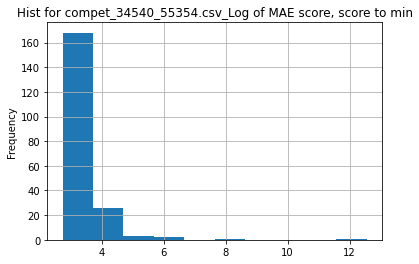

metric_column:  Log of MAE score , score_function:  min
Utility w/mean =  1.243697912202713
Utility w/median =  1.1720973378283621
___________________
34540_55355.csv
   Log of MAE score
0  1.1561520720 (1)
1  1.1576488588 (2)
2  1.1744132223 (3)


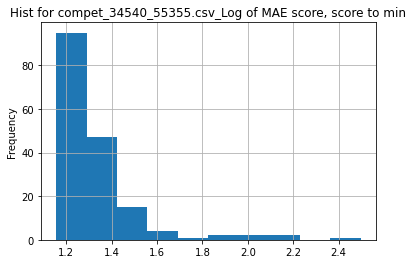

metric_column:  Log of MAE score , score_function:  min
Utility w/mean =  1.1545073632389156
Utility w/median =  1.100841866068982
___________________
34540_55356.csv
   Log of MAE score
0  1.1547688545 (1)
1  1.1734990202 (2)
2  1.1778090471 (3)


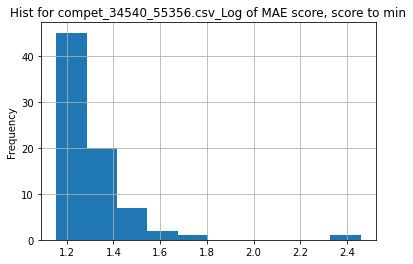

metric_column:  Log of MAE score , score_function:  min
Utility w/mean =  1.1406058236142462
Utility w/median =  1.099432212561462
___________________
34710_55618.csv
File cannot be opened: 34710_55618.csv
___________________
34710_55619.csv
___________________
34710_55620.csv
File cannot be opened: 34710_55620.csv
___________________
34733_55659.csv
  Overall Accuracy
0      0.86233 (1)
1      0.86050 (2)
2      0.85700 (3)


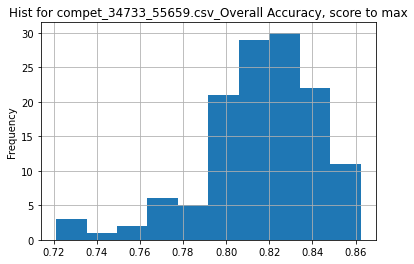

metric_column:  Overall Accuracy , score_function:  max
Utility w/mean =  1.056682429145432
Utility w/median =  1.0535491753207087
___________________
34801_55941.csv
    TEST AUC TEST SENS. TEST SPEC. AVG. VAL AUC
0  87.18 (1)  48.33 (1)  95.13 (1)    77.30 (8)
1  86.72 (2)  40.00 (5)  95.13 (1)    80.05 (3)
2  86.41 (3)  45.00 (2)  95.13 (1)    78.39 (6)


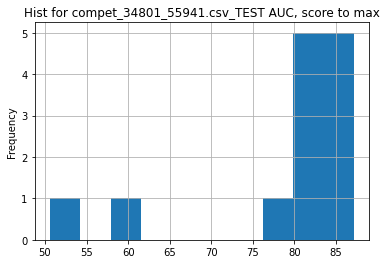

metric_column:  TEST AUC , score_function:  max
Utility w/mean =  1.1039635304546032
Utility w/median =  1.0625228519195613
___________________
34801_55942.csv
    TEST AUC TEST SENS. TEST SPEC. AVG. VAL AUC
0  81.97 (1)  36.67 (4)  95.13 (1)    75.57 (9)
1  81.21 (2)  48.33 (1)  95.13 (1)    77.18 (7)
2  80.12 (3)  35.00 (5)  95.13 (1)    89.04 (3)


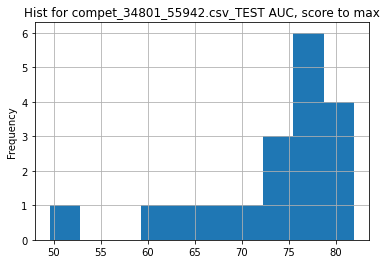

metric_column:  TEST AUC , score_function:  max
Utility w/mean =  1.1187813255889778
Utility w/median =  1.080970592113939
___________________
34801_55943.csv
    TEST AUC TEST SENS. TEST SPEC. AVG. VAL AUC
0  85.21 (1)  45.00 (3)  95.13 (1)    81.30 (3)
1  84.73 (2)  38.33 (5)  95.13 (1)    81.51 (2)
2  84.55 (3)  51.67 (1)  95.13 (1)    78.39 (8)


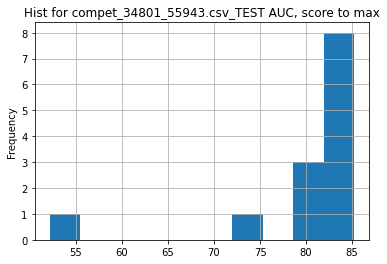

metric_column:  TEST AUC , score_function:  max
Utility w/mean =  1.0648280767862808
Utility w/median =  1.0287335506459012
___________________
34801_55944.csv
    TEST AUC TEST SENS. TEST SPEC. AVG. VAL AUC
0  88.44 (1)  58.33 (3)  95.13 (1)    82.71 (3)
1  87.26 (2)  63.33 (1)  95.13 (1)    85.79 (1)
2  86.87 (3)  58.33 (3)  95.13 (1)    83.42 (2)


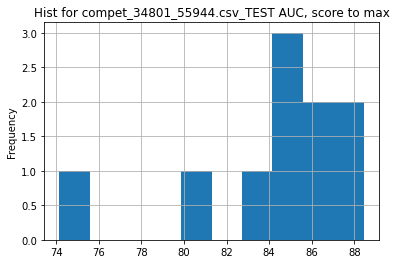

metric_column:  TEST AUC , score_function:  max
Utility w/mean =  1.0514427020793455
Utility w/median =  1.0400423355089081
___________________
34843_56005.csv
         f1        em
0  0.87 (1)  0.67 (2)
1  0.87 (1)  0.67 (2)
2  0.87 (1)  0.67 (2)


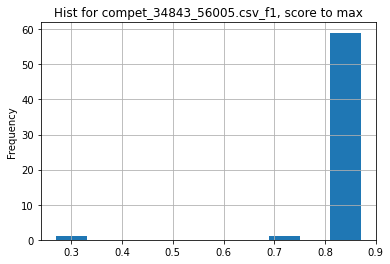

metric_column:  f1 , score_function:  max
Utility w/mean =  1.020184544405998
Utility w/median =  1.0116279069767442
___________________
34899_56102.csv
         F1 Precision    Recall
0  0.84 (1)  0.89 (1)  0.79 (1)
1  0.78 (2)  0.85 (2)  0.73 (2)
2  0.76 (3)  0.81 (3)  0.72 (3)


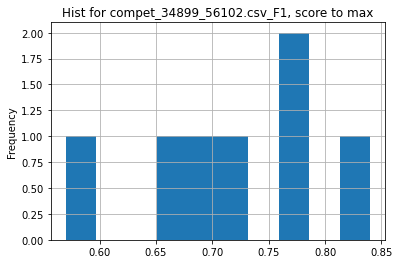

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1689860834990058
Utility w/median =  1.1506849315068493
___________________
34899_56103.csv
___________________
34899_56104.csv
___________________
34899_56105.csv
___________________
34899_56106.csv
         F1 Precision    Recall
0  0.90 (1)  0.94 (2)  0.87 (1)
1  0.81 (2)  0.86 (3)  0.77 (3)
2  0.81 (3)  0.82 (4)  0.80 (2)


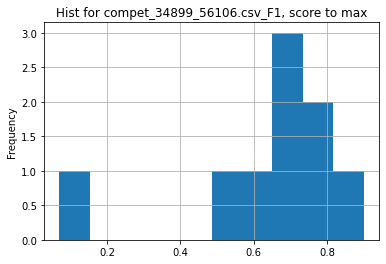

metric_column:  F1 , score_function:  max
Utility w/mean =  1.40625
Utility w/median =  1.3432835820895521
___________________
34899_56107.csv
         F1 Precision    Recall
0  0.96 (1)  0.97 (1)  0.94 (1)
1  0.93 (2)  0.95 (2)  0.90 (2)
2  0.85 (3)  0.88 (3)  0.82 (3)


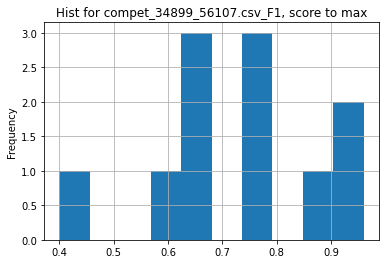

metric_column:  F1 , score_function:  max
Utility w/mean =  1.3283018867924528
Utility w/median =  1.2972972972972974
___________________
34899_56108.csv
___________________
34899_56109.csv
         F1 Precision    Recall
0  0.88 (1)  0.91 (1)  0.85 (1)
1  0.83 (2)  0.88 (2)  0.79 (4)
2  0.83 (3)  0.86 (4)  0.80 (2)


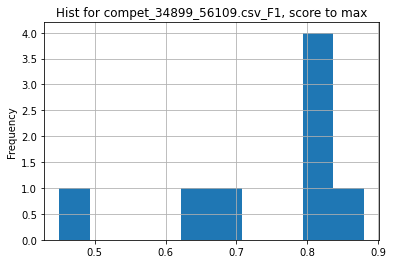

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1831932773109244
Utility w/median =  1.0864197530864197
___________________
34925_56164.csv
___________________
34925_56165.csv
___________________
34925_56166.csv
___________________
34925_56167.csv
___________________
34925_56168.csv
___________________
34925_56169.csv
___________________
34925_56170.csv
___________________
34925_56171.csv
         F1 Precision    Recall
0  0.91 (1)  0.90 (1)  0.92 (1)
1  0.90 (2)  0.88 (3)  0.91 (3)
2  0.89 (3)  0.87 (4)  0.91 (2)


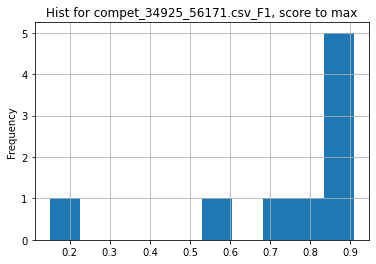

metric_column:  F1 , score_function:  max
Utility w/mean =  1.2242152466367713
Utility w/median =  1.0459770114942528
___________________
34925_56172.csv
         F1 Precision    Recall
0  0.90 (1)  0.89 (3)  0.92 (1)
1  0.89 (2)  0.89 (2)  0.89 (2)
2  0.86 (3)  0.85 (4)  0.87 (4)


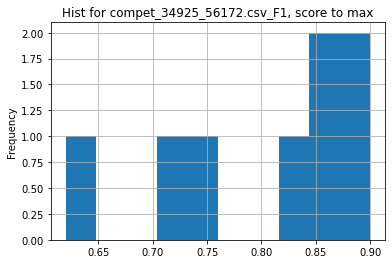

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1197511664074649
Utility w/median =  1.0650887573964498
___________________
34925_56173.csv
         F1 Precision    Recall
0  0.94 (1)  0.94 (1)  0.95 (1)
1  0.93 (2)  0.92 (3)  0.93 (2)
2  0.92 (3)  0.93 (2)  0.92 (3)


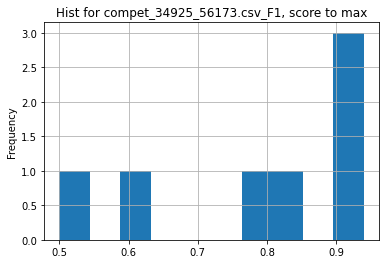

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1963636363636363
Utility w/median =  1.1604938271604937
___________________
34925_56174.csv
         F1 Precision    Recall
0  0.91 (1)  0.90 (5)  0.91 (1)
1  0.90 (2)  0.90 (4)  0.91 (2)
2  0.90 (3)  0.90 (2)  0.90 (3)


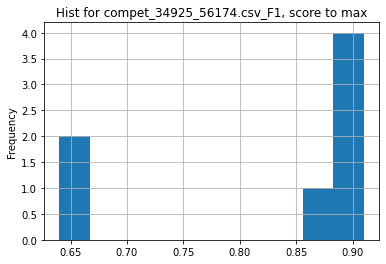

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1020761245674742
Utility w/median =  1.011111111111111
___________________
34925_56175.csv
         F1 Precision    Recall
0  0.96 (1)  0.95 (2)  0.98 (1)
1  0.96 (2)  0.95 (3)  0.97 (2)
2  0.95 (3)  0.95 (1)  0.95 (3)


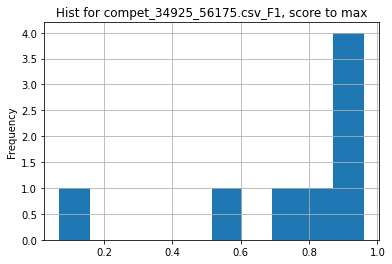

metric_column:  F1 , score_function:  max
Utility w/mean =  1.2842809364548493
Utility w/median =  1.1294117647058821
___________________
34925_56176.csv
         F1 Precision    Recall
0  0.79 (1)  0.76 (3)  0.82 (1)
1  0.60 (2)  0.69 (4)  0.53 (3)
2  0.59 (3)  0.92 (2)  0.43 (5)


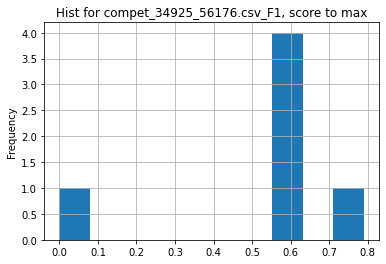

metric_column:  F1 , score_function:  max
Utility w/mean =  1.5241157556270097
Utility w/median =  1.3620689655172415
___________________
34925_56177.csv
         F1 Precision    Recall
0  0.84 (1)  0.85 (2)  0.82 (2)
1  0.83 (2)  0.83 (3)  0.84 (1)
2  0.76 (3)  0.96 (1)  0.62 (5)


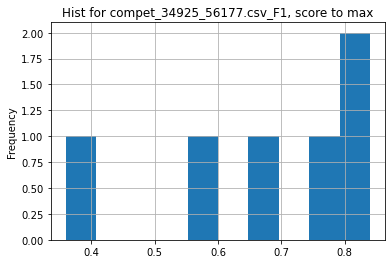

metric_column:  F1 , score_function:  max
Utility w/mean =  1.26
Utility w/median =  1.1914893617021276
___________________
35153_56717.csv
___________________
35153_56719.csv
___________________
35159_56729.csv
        EER
0  4.90 (1)
1  4.98 (2)
2  8.16 (3)


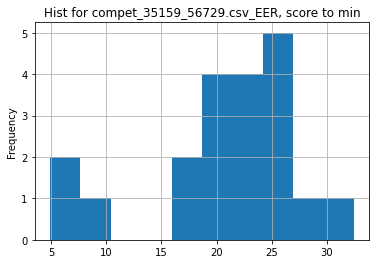

metric_column:  EER , score_function:  min
Utility w/mean =  4.200510204081632
Utility w/median =  4.535714285714286
___________________
35160_56730.csv
    min t-DCF        EER
0  0.6848 (1)  25.31 (1)
1  0.7033 (2)  25.38 (2)
2  0.7162 (3)  27.06 (3)


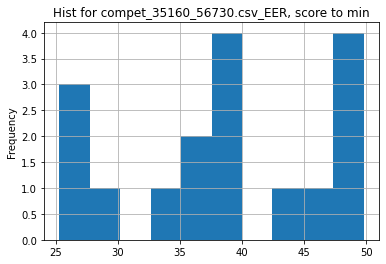

metric_column:  EER , score_function:  min
Utility w/mean =  1.5164896460362098
Utility w/median =  1.5057289608850257
___________________
35161_56731.csv
    min t-DCF       EER
0  0.2780 (1)  3.54 (1)
1  0.2987 (2)  4.83 (2)
2  0.3641 (8)  6.60 (3)


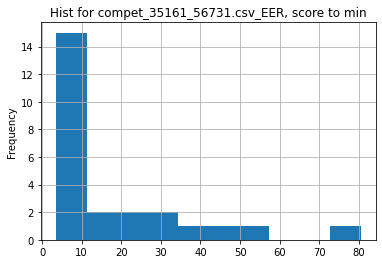

metric_column:  EER , score_function:  min
Utility w/mean =  5.315480225988701
Utility w/median =  2.8163841807909606
___________________
35210_56822.csv
___________________
35210_56823.csv
___________________
35210_56824.csv
  Accuracy Score Ranking Score
0    0.68900 (1)   0.80700 (1)
1    0.65400 (4)   0.78500 (2)
2    0.63100 (6)   0.77400 (3)


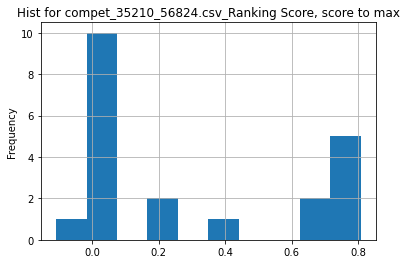

metric_column:  Ranking Score , score_function:  max
Utility w/mean =  2.817924842035251
Utility w/median =  134.5
___________________
35349_57100.csv
          Mssim         Mrmse          ssim          rmse
0  0.829868 (1)  0.908059 (1)  0.829868 (1)  0.908059 (1)
1  0.812742 (3)  0.903305 (2)  0.812742 (3)  0.903305 (2)
2  0.813914 (2)  0.894696 (3)  0.813914 (2)  0.894696 (3)


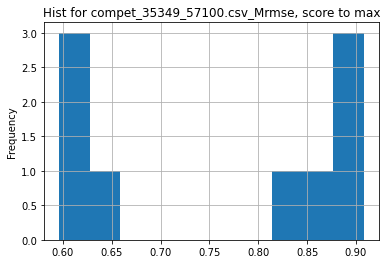

metric_column:  Mrmse , score_function:  max
Utility w/mean =  1.1921406973044812
Utility w/median =  1.0995300661975804
___________________
35463_57510.csv
___________________
35463_57511.csv
___________________
35463_57512.csv
       Rank-1      Rank-5     Rank-10     Rank-20 Rank-1 Distractor
0  0.5627 (1)  0.7272 (1)  0.7812 (1)  0.8251 (1)        0.0000 (1)
1  0.5412 (2)  0.7147 (2)  0.7757 (2)  0.8171 (2)        0.0000 (1)
2  0.5074 (3)  0.6698 (3)  0.7324 (3)  0.7866 (3)        0.0000 (1)


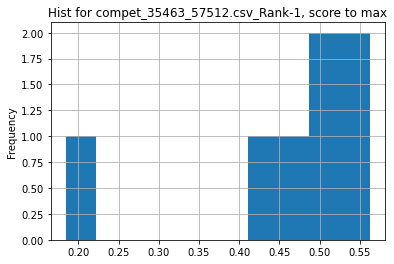

metric_column:  Rank-1 , score_function:  max
Utility w/mean =  1.2336433962855085
Utility w/median =  1.1238266427002195
___________________
35482_57539.csv
       <Rank> Instance F1 Overall micro-F1 Aggression micro-F1  \
0  1.5000 (2)   0.250 (1)        0.619 (1)           0.336 (2)   
1  1.5000 (2)   0.197 (2)        0.598 (2)           0.360 (1)   
2  3.0000 (1)       - (3)            - (3)               - (3)   

  Gender Bias micro-F1 Communal Bias micro-F1  
0            0.647 (2)              0.875 (1)  
1            0.665 (1)              0.768 (2)  
2                - (3)                  - (3)  
File cannot be opened: 35482_57539.csv
___________________
35482_57540.csv
       <Rank> Instance F1 Overall micro-F1 Aggression micro-F1  \
0  1.0000 (7)   0.368 (1)        0.713 (1)           0.532 (1)   
1  3.0000 (6)   0.319 (2)        0.684 (3)           0.510 (3)   
2  3.5000 (5)   0.296 (3)        0.666 (4)           0.479 (4)   

  Gender Bias micro-F1 Communal Bias micro-F1

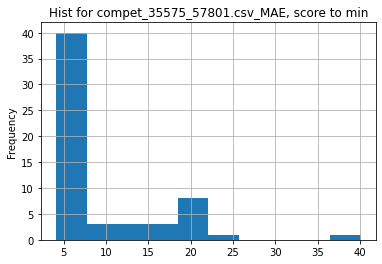

metric_column:  MAE , score_function:  min
Utility w/mean =  2.265200865254319
Utility w/median =  1.4133508057951354
___________________
35688_57949.csv
___________________
35688_57950.csv
___________________
35694_57956.csv
File cannot be opened: 35694_57956.csv
___________________
35744_58065.csv
  T1 F1 Score T1 Precision   T1 Recall T1 Task Score
0  88.635 (1)   88.549 (1)  89.039 (2)    89.039 (2)
1  86.708 (2)   84.238 (2)  89.326 (1)    89.326 (1)
2  44.334 (3)   44.848 (3)  44.801 (3)    44.801 (3)
File cannot be opened: 35744_58065.csv
___________________
35744_58066.csv
  T1 F1 Score T1 Precision   T1 Recall T1 Task Score
0  97.478 (1)   97.580 (1)  97.439 (1)    97.439 (1)
1  96.189 (2)   96.439 (2)  96.061 (2)    96.061 (2)
2  95.436 (3)   95.793 (3)  95.237 (3)    95.237 (3)
File cannot be opened: 35744_58066.csv
___________________
35786_58366.csv
            HOTA           DetA           AssA           MOTA           IDF1
0  57.356334 (1)  81.094309 (2)  40.691036 (1)  

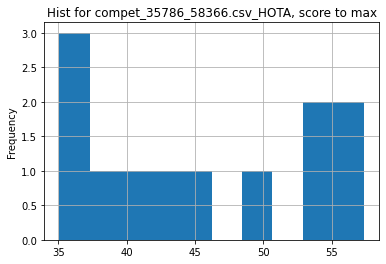

metric_column:  HOTA , score_function:  max
Utility w/mean =  1.2645007921327323
Utility w/median =  1.3122490214814893
___________________
35838_58465.csv
___________________
35838_58466.csv
  Avg Score CIFAR-10 Agreement CIFAR-10 TVD Diabetic Retinopathy Agreement  \
0  2.00 (1)         0.9164 (1)   0.1072 (1)                          - (3)   
1  3.57 (4)         0.9070 (2)   0.1133 (2)                          - (3)   
2  2.43 (2)         0.9070 (2)   0.1133 (2)                     0.9006 (1)   

  Diabetic Retinopathy TVD MedMNIST Agreement MedMNIST TVD UCI-Gap W-distance  
0                    - (6)         0.8910 (1)   0.0929 (1)        -0.1002 (1)  
1                    - (6)         0.8840 (5)   0.0990 (5)        -0.1635 (2)  
2               0.1442 (1)         0.8860 (4)   0.0969 (4)        -0.1728 (3)  
File cannot be opened: 35838_58466.csv
___________________
35838_58467.csv
___________________
35865_58494.csv
           mIoU ExecutionTime
0  0.537882 (1)  187.359 (16)
1  0

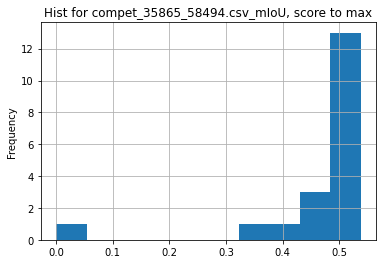

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.1581068606651135
Utility w/median =  1.0674083276114574
___________________
35874_58539.csv
           mIoU ExecutionTime
0  0.483245 (1)   109.274 (3)
1  0.473921 (2)    96.669 (5)
2  0.438521 (3)    88.821 (6)


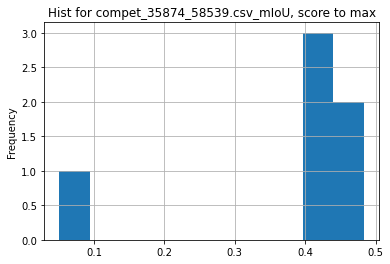

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.2842935847111006
Utility w/median =  1.1347028961345738
___________________
35874_58540.csv
           mIoU ExecutionTime
0  0.455695 (1)   139.471 (1)
1  0.448793 (2)   115.460 (5)
2  0.396411 (3)   138.701 (2)


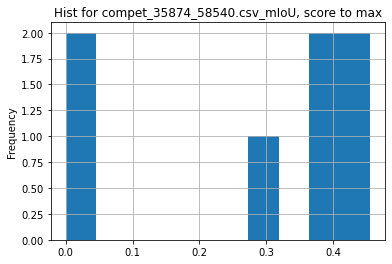

metric_column:  mIoU , score_function:  max
Utility w/mean =  1.6398007275060198
Utility w/median =  1.2464066607039799
___________________
35945_58611.csv
___________________
36014_58753.csv
___________________
36014_58754.csv
   Log of MAE score
0  1.1454595696 (1)
1  1.1811453164 (2)
2  1.2033092394 (3)
File cannot be opened: 36014_58754.csv
___________________
36014_58755.csv
   Log of MAE score
0  1.1415272321 (1)
1  1.1778090471 (2)
2  1.1972469497 (3)
File cannot be opened: 36014_58755.csv
___________________
36019_58762.csv
          ARI
0  1.0000 (1)
1  1.0000 (1)
2  1.0000 (1)


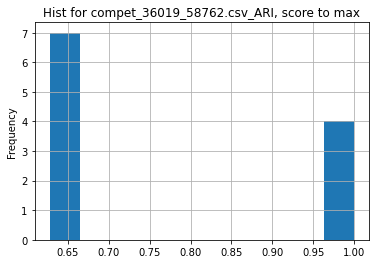

metric_column:  ARI , score_function:  max
Utility w/mean =  1.2934480974554348
Utility w/median =  1.5337423312883436
___________________
36019_58763.csv
          ARI
0  0.2819 (1)
1  0.2742 (2)
2  0.2624 (3)


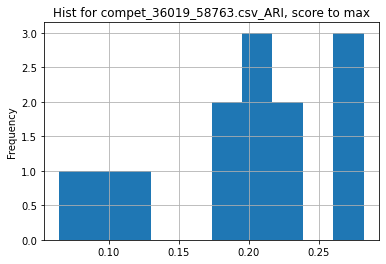

metric_column:  ARI , score_function:  max
Utility w/mean =  1.4347179266335195
Utility w/median =  1.3704423918327662
___________________
36019_58764.csv
          ARI
0  0.2150 (1)
1  0.1960 (2)
2  0.1824 (3)


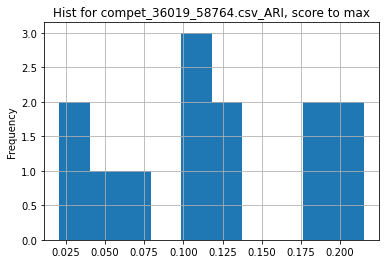

metric_column:  ARI , score_function:  max
Utility w/mean =  1.8608521970705727
Utility w/median =  1.8976169461606356
___________________
36019_58765.csv
___________________
36019_58766.csv
___________________
36019_58767.csv
___________________
36019_58768.csv
___________________
36019_58769.csv
___________________
36019_58770.csv
___________________
36044_58953.csv
          F1  Precision     Recall
0  0.961 (1)  0.961 (1)  0.961 (2)
1  0.947 (2)  0.925 (2)  0.971 (1)
2  0.895 (3)  0.890 (3)  0.900 (3)


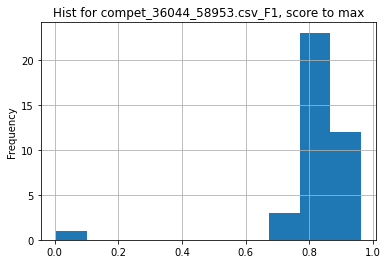

metric_column:  F1 , score_function:  max
Utility w/mean =  1.16990260956424
Utility w/median =  1.1386255924170616
___________________
36044_58954.csv
          F1  Precision     Recall
0  0.921 (1)  0.921 (1)  0.921 (1)
1  0.878 (2)  0.886 (2)  0.871 (2)
2  0.850 (3)  0.851 (4)  0.850 (4)


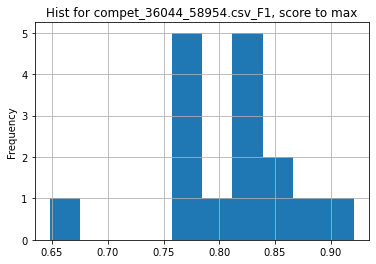

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1405572755417956
Utility w/median =  1.125916870415648
___________________
36044_58955.csv
          F1  Precision     Recall
0  0.932 (1)  0.936 (1)  0.929 (1)
1  0.910 (2)  0.911 (2)  0.910 (2)
2  0.904 (3)  0.909 (3)  0.899 (4)


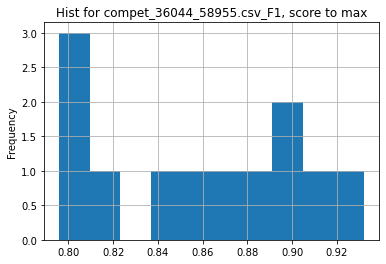

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0848772916868756
Utility w/median =  1.0787037037037037
___________________
36044_58956.csv
          F1  Precision     Recall
0  0.944 (1)  0.948 (1)  0.940 (1)
1  0.842 (2)  0.847 (3)  0.838 (2)
2  0.839 (3)  0.849 (2)  0.830 (3)


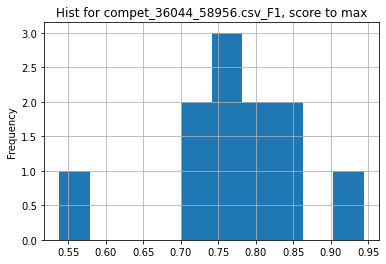

metric_column:  F1 , score_function:  max
Utility w/mean =  1.2209288653733095
Utility w/median =  1.2180645161290322
___________________
36044_58957.csv
          F1  Precision     Recall
0  0.941 (1)  0.945 (1)  0.936 (1)
1  0.873 (2)  0.872 (2)  0.873 (3)
2  0.871 (3)  0.867 (3)  0.874 (2)


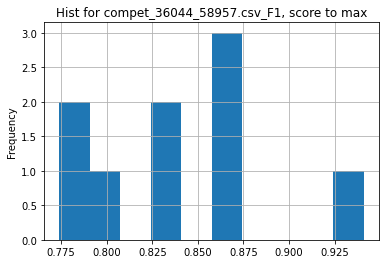

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1203862944833973
Utility w/median =  1.1229116945107398
___________________
36044_58958.csv
          F1  Precision     Recall
0  0.874 (1)  0.862 (4)  0.887 (1)
1  0.873 (2)  0.866 (2)  0.880 (2)
2  0.870 (3)  0.868 (1)  0.874 (4)


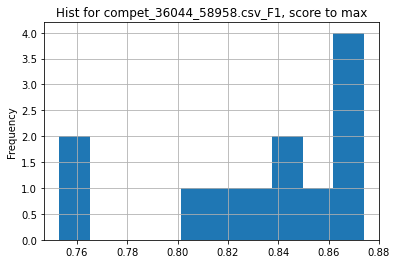

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0495346742719907
Utility w/median =  1.0392390011890607
___________________
36044_58959.csv
          F1  Precision     Recall
0  0.822 (1)  0.815 (1)  0.828 (1)
1  0.820 (2)  0.813 (2)  0.828 (2)
2  0.812 (3)  0.804 (3)  0.822 (3)


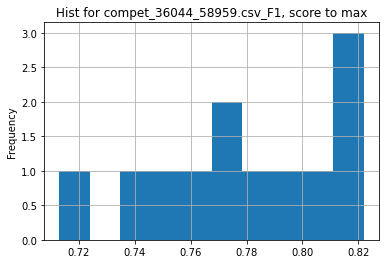

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0567816584529677
Utility w/median =  1.0579150579150578
___________________
36044_58960.csv
          F1  Precision     Recall
0  0.932 (1)  0.932 (1)  0.932 (1)
1  0.920 (2)  0.920 (2)  0.921 (2)
2  0.917 (3)  0.917 (3)  0.917 (3)


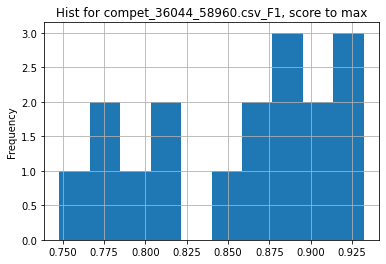

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0910342927971355
Utility w/median =  1.0651428571428572
___________________
36044_58961.csv
          F1  Precision     Recall
0  0.912 (1)  0.953 (1)  0.879 (3)
1  0.897 (2)  0.938 (2)  0.869 (7)
2  0.894 (3)  0.916 (3)  0.877 (4)


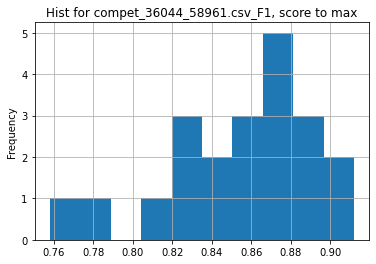

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0660729195658225
Utility w/median =  1.0654205607476637
___________________
36044_58962.csv
          F1  Precision     Recall
0  0.847 (1)  0.848 (1)  0.847 (1)
1  0.845 (2)  0.845 (2)  0.845 (2)
2  0.818 (3)  0.809 (3)  0.830 (3)


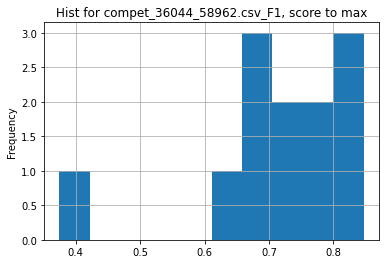

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1861360718870346
Utility w/median =  1.1813110181311017
___________________
36044_58963.csv
          F1  Precision     Recall
0  0.854 (1)  0.858 (1)  0.851 (3)
1  0.850 (2)  0.849 (3)  0.852 (1)
2  0.850 (3)  0.851 (2)  0.851 (2)


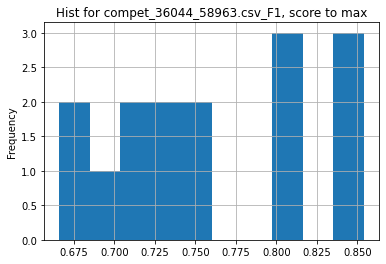

metric_column:  F1 , score_function:  max
Utility w/mean =  1.1230931088900578
Utility w/median =  1.1478494623655915
___________________
36044_58964.csv
          F1  Precision     Recall
0  0.896 (1)  0.898 (1)  0.894 (1)
1  0.873 (2)  0.878 (2)  0.870 (4)
2  0.873 (3)  0.872 (5)  0.875 (3)


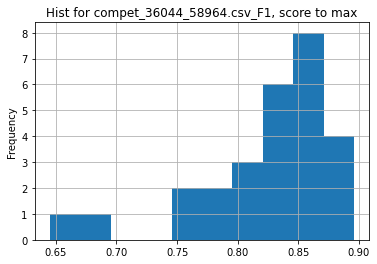

metric_column:  F1 , score_function:  max
Utility w/mean =  1.0862068965517246
Utility w/median =  1.0628706998813762
___________________
36044_58965.csv
          F1  Precision     Recall
0  0.822 (1)  0.822 (3)  0.824 (1)
1  0.822 (2)  0.830 (2)  0.814 (2)
2  0.813 (3)  0.820 (4)  0.806 (3)


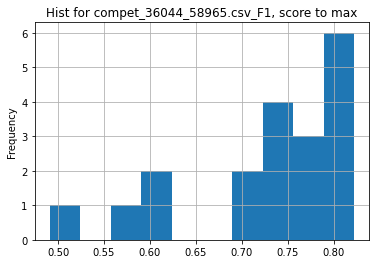

metric_column:  F1 , score_function:  max
Utility w/mean =  1.130592152888374
Utility w/median =  1.1063257065948855
___________________
36050_58972.csv
  T1+T2 nDCG@10 (test) T1+T2 HR@10 (test) T1+T2 nDCG@10 (validation)  \
0           0.6773 (1)         0.7869 (1)                0.6611 (20)   
1           0.6765 (2)         0.7860 (2)                0.6627 (13)   
2           0.6763 (3)         0.7859 (3)                0.6627 (13)   

  T1+T2 HR@10 (validation) T1 nDCG@10 (test) T2 nDCG@10 (test)  
0              0.7777 (16)        0.7384 (4)        0.6472 (1)  
1              0.7726 (21)        0.7393 (2)        0.6457 (2)  
2              0.7726 (21)        0.7393 (2)        0.6453 (3)  


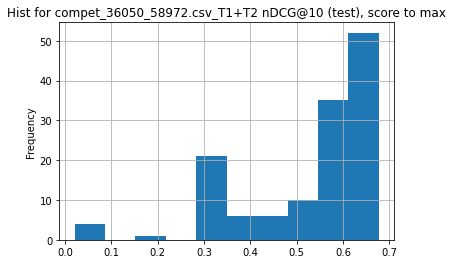

metric_column:  T1+T2 nDCG@10 (test) , score_function:  max
Utility w/mean =  1.2752955123958292
Utility w/median =  1.16334592923394
___________________
36183_59180.csv
        EER
0  21.7 (1)
1  23.0 (2)
2  23.8 (3)


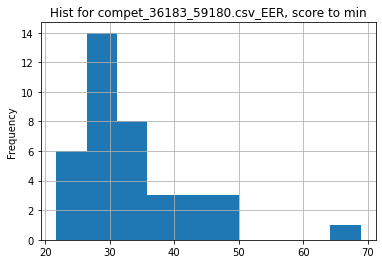

metric_column:  EER , score_function:  min
Utility w/mean =  1.5328644191122975
Utility w/median =  1.423963133640553
___________________
36189_59187.csv
        EER
0   4.8 (1)
1   7.9 (2)
2  10.7 (3)


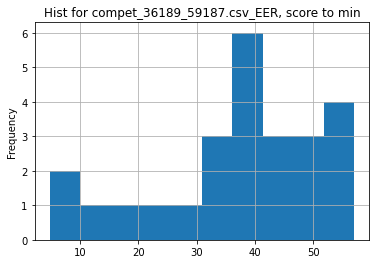

metric_column:  EER , score_function:  min
Utility w/mean =  7.795833333333334
Utility w/median =  8.4375
___________________
36190_59188.csv
       EER
0  8.3 (1)
1  8.6 (2)
2  9.1 (3)


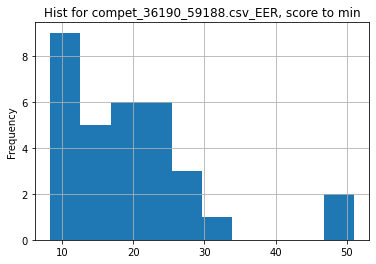

metric_column:  EER , score_function:  min
Utility w/mean =  2.408509036144578
Utility w/median =  2.3975903614457827
___________________
36190_59189.csv
        EER
0  11.1 (1)
1  11.1 (2)
2  12.0 (3)


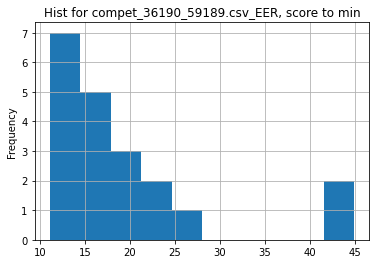

metric_column:  EER , score_function:  min
Utility w/mean =  1.7671171171171174
Utility w/median =  1.436936936936937
___________________
36200_59196.csv
___________________
36200_59197.csv
___________________
36200_59198.csv
___________________
36203_59203.csv
         mAP       AP50       AP75        AR1       AR10       APso  \
0  42.57 (1)  65.67 (1)  45.18 (1)  17.89 (2)  49.63 (1)  58.77 (2)   
1  38.83 (2)  61.02 (2)  40.58 (2)  18.36 (1)  42.47 (3)  63.83 (1)   
2  38.22 (3)  60.67 (3)  39.45 (3)  17.67 (3)  44.07 (2)  57.52 (3)   

        APmo       APho  
0  49.61 (1)  19.26 (1)  
1  45.80 (2)  17.70 (3)  
2  43.19 (3)  18.66 (2)  


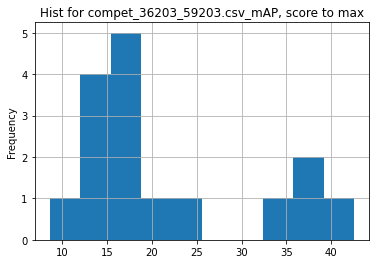

metric_column:  mAP , score_function:  max
Utility w/mean =  1.9790794979079496
Utility w/median =  2.6523364485981307
___________________
36211_59211.csv
           SUM      Bleu(4)        METEOR      ROUGE_L        CIDEr
0  1.00571 (1)  0.14290 (4)   0.15873 (3)  0.36557 (1)  0.33851 (3)
1  1.00361 (2)  0.16053 (1)  0.15230 (13)  0.35101 (9)  0.33977 (2)
2  0.99977 (3)  0.15707 (2)  0.15257 (12)  0.35357 (6)  0.33656 (5)


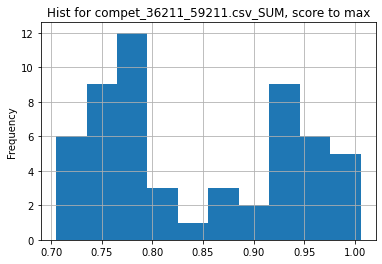

metric_column:  SUM , score_function:  max
Utility w/mean =  1.1935976100818737
Utility w/median =  1.261030933005655
___________________
36393_59479.csv
File cannot be opened: 36393_59479.csv
___________________
36396_59482.csv
___________________
36397_59485.csv
File cannot be opened: 36397_59485.csv
___________________
36410_59503.csv
___________________
36415_59514.csv
___________________
36415_59515.csv
___________________
36415_59516.csv
___________________
36415_59517.csv
___________________
36425_59530.csv
          F1  Precision     Recall
0  0.914 (1)  0.914 (2)  0.914 (1)
1  0.912 (2)  0.915 (1)  0.910 (2)
2  0.801 (3)  0.830 (3)  0.777 (3)
File cannot be opened: 36425_59530.csv
___________________
36425_59531.csv
          F1  Precision     Recall
0  0.754 (1)  0.759 (1)  0.752 (1)
1  0.583 (2)  0.608 (2)  0.566 (2)
2  0.568 (3)  0.584 (3)  0.562 (3)
File cannot be opened: 36425_59531.csv
___________________
36425_59532.csv
          F1  Precision     Recall
0  0.777 (1)  0

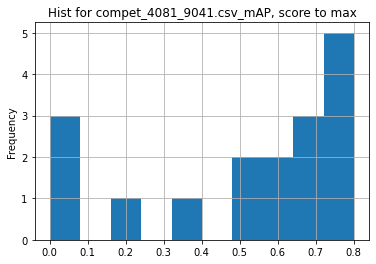

metric_column:  mAP , score_function:  max
Utility w/mean =  1.571131879543095
Utility w/median =  1.2515625000000001
___________________
4081_9051.csv
___________________
4711_9731.csv
          Error
0  0.323886 (1)
1  0.340366 (2)
2  0.359943 (3)


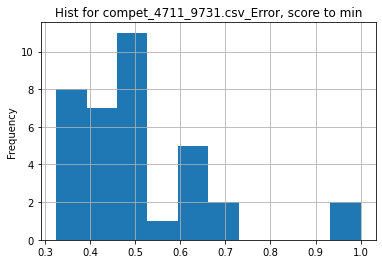

metric_column:  Error , score_function:  min
Utility w/mean =  1.5675335354620659
Utility w/median =  1.4813236756142591
___________________
4711_9741.csv
___________________
4971_10351.csv
File cannot be opened: 4971_10351.csv
___________________
4971_10361.csv
File cannot be opened: 4971_10361.csv
___________________
5181_10971.csv
          AP AP IoU=.50 AP IoU=.75   AP small  AP medium   AP large  \
0  0.525 (1)  0.717 (1)  0.578 (1)  0.352 (1)  0.550 (1)  0.642 (2)   
1  0.519 (2)  0.704 (3)  0.570 (2)  0.342 (2)  0.548 (2)  0.647 (1)   
2  0.514 (3)  0.694 (4)  0.563 (4)  0.336 (4)  0.540 (3)  0.639 (3)   

    AR max=1  AR max=10 AR max=100   AR small  AR medium   AR large  
0  0.392 (1)  0.647 (1)  0.689 (1)  0.528 (1)  0.720 (1)  0.821 (2)  
1  0.391 (2)  0.640 (2)  0.680 (3)  0.498 (4)  0.713 (3)  0.824 (1)  
2  0.388 (3)  0.638 (4)  0.679 (4)  0.499 (3)  0.711 (4)  0.818 (5)  


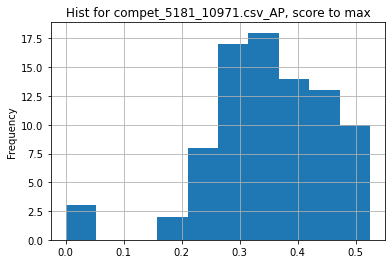

metric_column:  AP , score_function:  max
Utility w/mean =  1.501514131897712
Utility w/median =  1.5350877192982455
___________________
5181_14301.csv
File cannot be opened: 5181_14301.csv
___________________
5181_14341.csv
File cannot be opened: 5181_14341.csv
___________________
5181_14351.csv
File cannot be opened: 5181_14351.csv
___________________
5181_30178.csv
File cannot be opened: 5181_30178.csv
___________________
5181_30179.csv
File cannot be opened: 5181_30179.csv
___________________
5941_11921.csv
File cannot be opened: 5941_11921.csv
___________________
6121_12221.csv
      BLEU-1     BLEU-2     BLEU-3     BLEU-4     METEOR    ROUGE-L    CIDEr-D
0  0.134 (7)  0.040 (5)  0.015 (4)  0.007 (3)  0.055 (9)  0.139 (8)  0.110 (1)
1  0.168 (1)  0.054 (1)  0.023 (1)  0.011 (1)  0.070 (5)  0.160 (2)  0.107 (2)
2  0.163 (2)  0.053 (2)  0.020 (2)  0.009 (2)  0.070 (4)  0.161 (1)  0.106 (3)


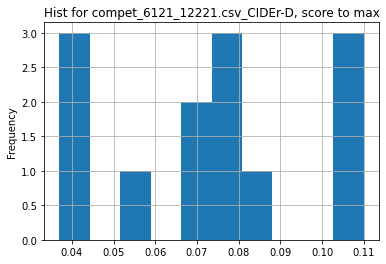

metric_column:  CIDEr-D , score_function:  max
Utility w/mean =  1.4911366006256515
Utility w/median =  1.4473684210526316
___________________
6121_12231.csv
      BLEU-1     BLEU-2     BLEU-3     BLEU-4     METEOR    ROUGE-L    CIDEr-D
0  0.137 (6)  0.039 (6)  0.014 (4)  0.006 (5)  0.057 (8)  0.143 (7)  0.113 (1)
1  0.161 (3)  0.052 (3)  0.021 (2)  0.009 (2)  0.071 (4)  0.164 (1)  0.112 (2)
2  0.171 (2)  0.054 (1)  0.022 (1)  0.010 (1)  0.072 (3)  0.163 (2)  0.106 (3)


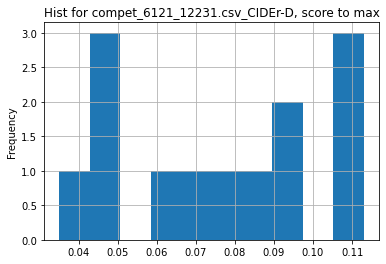

metric_column:  CIDEr-D , score_function:  max
Utility w/mean =  1.4928861788617886
Utility w/median =  1.486842105263158
___________________
6351_12761.csv
___________________
6961_13941.csv
File cannot be opened: 6961_13941.csv
___________________
6961_13951.csv
File cannot be opened: 6961_13951.csv
___________________
6961_13961.csv
File cannot be opened: 6961_13961.csv
___________________
6971_13971.csv
File cannot be opened: 6971_13971.csv
___________________
6971_13981.csv
File cannot be opened: 6971_13981.csv
___________________
6971_13991.csv
File cannot be opened: 6971_13991.csv
___________________
6981_14001.csv
File cannot be opened: 6981_14001.csv
___________________
6981_14011.csv
File cannot be opened: 6981_14011.csv
___________________
6991_14021.csv
File cannot be opened: 6991_14021.csv
___________________
6991_14031.csv
File cannot be opened: 6991_14031.csv
___________________
7451_14621.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0

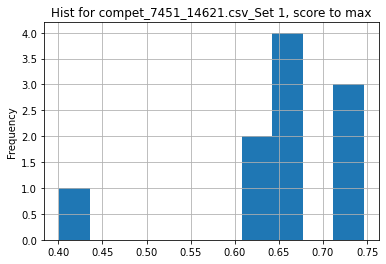

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.1421661666564624
Utility w/median =  1.1333535844471443
___________________
7451_14631.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.8000 (7)  0.7476 (1)  0.9033 (2)  0.7490 (7)  0.5128 (2)  0.7166 (2)   
1  2.8000 (7)  0.7448 (2)  0.9033 (2)  0.7502 (6)  0.5134 (1)  0.7163 (3)   
2  2.6000 (8)  0.7440 (3)  0.9265 (1)  0.8695 (2)  0.4199 (3)  0.7104 (4)   

      Duration  
0  5942.89 (3)  
1  5943.12 (2)  
2     2.03 (8)  


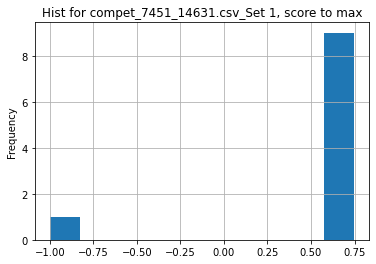

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.4495957186900126
Utility w/median =  1.129817137675684
___________________
7461_14641.csv
        <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.0000 (11)  0.3793 (1)  0.9379 (1)  0.3552 (1)  0.4647 (1)  0.3346 (1)   
1   3.6000 (9)  0.3627 (2)  0.7545 (6)  0.3292 (3)  0.3268 (5)  0.2795 (2)   
2  3.4000 (10)  0.3627 (2)  0.7545 (6)  0.3292 (2)  0.3268 (5)  0.2795 (2)   

      Duration  
0  5942.52 (2)  
1  5842.15 (4)  
2  5842.77 (3)  


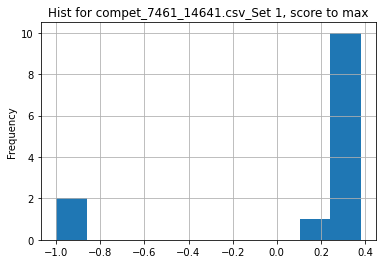

metric_column:  Set 1 , score_function:  max
Utility w/mean =  3.3856770118099417
Utility w/median =  1.1830941983780412
___________________
7461_14651.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.0000 (9)  0.3707 (1)  0.9504 (1)  0.3516 (1)  0.4364 (1)  0.3423 (1)   
1  3.0000 (8)  0.3619 (2)  0.7537 (4)  0.3259 (2)  0.3087 (5)  0.2816 (2)   
2  3.2000 (7)  0.3619 (2)  0.7537 (4)  0.3259 (3)  0.3087 (5)  0.2816 (2)   

      Duration  
0  5942.26 (2)  
1  5842.25 (4)  
2  5842.74 (3)  


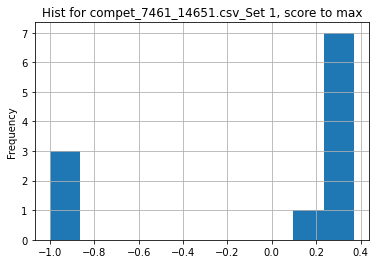

metric_column:  Set 1 , score_function:  max
Utility w/mean =  -9.352522935779817
Utility w/median =  1.1584374999999998
___________________
7462_14652.csv
        <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.8000 (10)  0.5564 (1)  0.6464 (3)  0.7862 (2)  0.5952 (2)  0.9083 (1)   
1   2.4000 (9)  0.5108 (2)  0.6160 (6)  0.8110 (1)  0.6569 (1)  0.8989 (2)   
2   5.4000 (6)  0.5060 (3)  0.6426 (4)  0.6030 (7)  0.5249 (5)  0.8669 (8)   

      Duration  
0  5975.35 (2)  
1  5945.72 (3)  
2  3480.35 (6)  


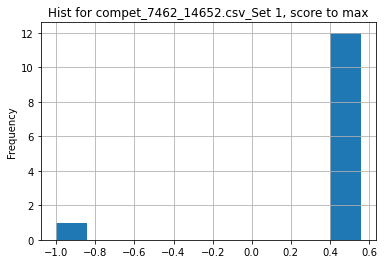

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.5483346176898705
Utility w/median =  1.1838297872340426
___________________
7462_14662.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.2000 (7)  0.4914 (1)  0.6253 (2)  0.8173 (1)  0.6346 (1)  0.9069 (1)   
1  3.6000 (5)  0.4808 (2)  0.6048 (4)  0.6472 (3)  0.5086 (6)  0.8873 (3)   
2  3.6000 (5)  0.4808 (2)  0.6048 (4)  0.6472 (3)  0.5086 (6)  0.8873 (3)   

      Duration  
0  5945.28 (2)  
1  5842.44 (4)  
2  5842.75 (3)  


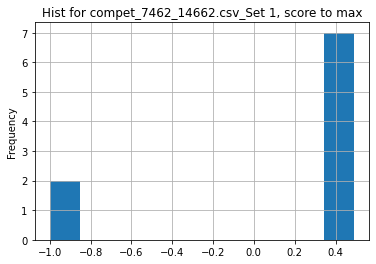

metric_column:  Set 1 , score_function:  max
Utility w/mean =  3.391044318356082
Utility w/median =  1.0622568093385214
___________________
7471_14671.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4         Set 5  \
0  2.8000 (9)  0.8187 (1)  0.8016 (1)  0.9543 (1)  0.7910 (5)    0.4806 (6)   
1  6.6000 (4)  0.8181 (2)  0.7581 (8)  0.9038 (4)  0.5692 (8)  -0.0531 (11)   
2  5.2000 (8)  0.8180 (3)  0.7763 (3)  0.8464 (7)  0.8161 (4)    0.2321 (9)   

      Duration  
0  1141.63 (2)  
1   650.19 (9)  
2   812.93 (6)  


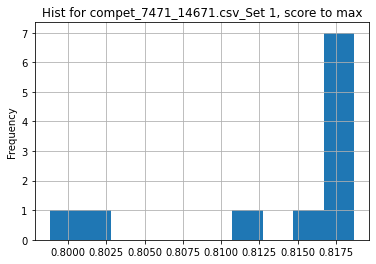

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.0060323737390662
Utility w/median =  1.0020807833537333
___________________
7471_14681.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  2.2000 (9)  0.8215 (1)  0.7880 (1)  0.9529 (1)  0.8125 (4)  0.4585 (4)   
1  4.4000 (6)  0.8137 (2)  0.7546 (4)  0.8425 (6)  0.6182 (7)  0.5346 (3)   
2  5.6000 (3)  0.8135 (3)  0.0948 (8)  0.7280 (8)  0.8217 (3)  0.3301 (6)   

      Duration  
0  1142.05 (2)  
1   911.06 (5)  
2   771.42 (6)  


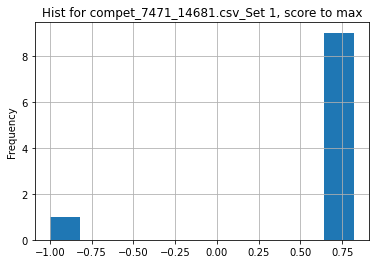

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.3061451625725413
Utility w/median =  1.0124476213951195
___________________
7511_14851.csv
          Error
0  0.215327 (1)
1  0.236426 (2)
2  0.240429 (3)


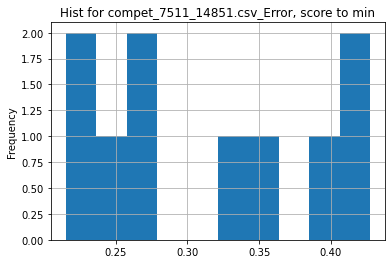

metric_column:  Error , score_function:  min
Utility w/mean =  1.460471283211116
Utility w/median =  1.4206323405796766
___________________
7511_14861.csv
___________________
8991_18021.csv
___________________
8991_18031.csv
___________________
8991_18041.csv
___________________
8991_18051.csv
___________________
8991_18061.csv
___________________
8991_18071.csv
___________________
8991_18081.csv
___________________
8991_18091.csv
___________________
8991_18101.csv
___________________
8991_18111.csv
___________________
8991_18121.csv
___________________
8991_18131.csv
___________________
8991_18141.csv
___________________
8991_18151.csv
___________________
9021_18441.csv
___________________
9021_18451.csv
___________________
9021_18461.csv
___________________
9021_18471.csv
___________________
9021_18481.csv
___________________
9021_18491.csv
___________________
9021_18501.csv
___________________
9021_18511.csv
___________________
9021_18521.csv
___________________
9021_18531.csv
_____

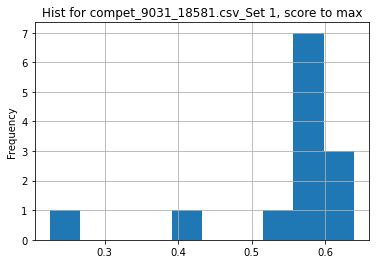

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.180107297964745
Utility w/median =  1.116035595882045
___________________
9031_18591.csv
       <Rank>       Set 1       Set 2       Set 3       Set 4       Set 5  \
0  1.2000 (9)  0.6530 (1)  0.5175 (1)  0.2843 (1)  0.7821 (1)  0.3823 (2)   
1  5.6000 (5)  0.6123 (2)  0.2521 (8)  0.2583 (3)  0.4120 (7)  0.1985 (8)   
2  3.4000 (8)  0.5947 (3)  0.4537 (6)  0.2680 (2)  0.7575 (3)  0.3778 (3)   

      Duration  
0     8.04 (7)  
1  3477.54 (4)  
2     5.02 (8)  


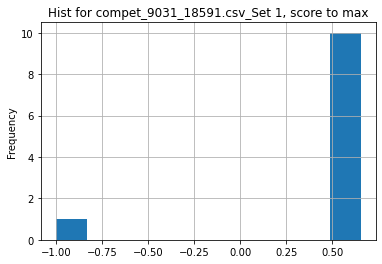

metric_column:  Set 1 , score_function:  max
Utility w/mean =  1.456023351509132
Utility w/median =  1.1071549677856902
___________________
9181_18691.csv
       Accuracy  Extraversion Agreeableness Conscientiousness   Neuroticism  \
0  0.912902 (1)  0.915924 (1)  0.916297 (1)      0.909889 (3)  0.910027 (1)   
1  0.912020 (2)  0.912856 (3)  0.914520 (2)      0.913203 (1)  0.907846 (4)   
2  0.911270 (3)  0.914486 (2)  0.912704 (5)      0.912890 (2)  0.906242 (6)   

       Openness  
0  0.912374 (1)  
1  0.911675 (2)  
2  0.910026 (4)  


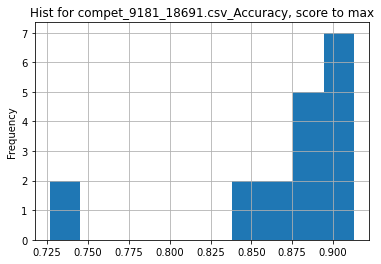

metric_column:  Accuracy , score_function:  max
Utility w/mean =  1.0462216133216125
Utility w/median =  1.0286526865309218
___________________
9181_18701.csv
___________________
9621_18951.csv
___________________
971_1541.csv
___________________
971_1551.csv
___________________
981_1561.csv
___________________
981_1571.csv
___________________
991_1581.csv
        Overlap
0  0.791650 (1)
1  0.789675 (2)
2  0.786318 (3)


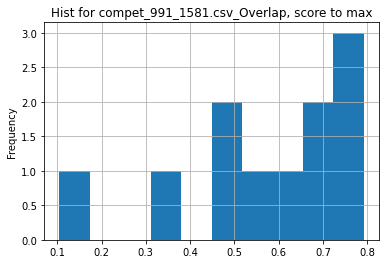

metric_column:  Overlap , score_function:  max
Utility w/mean =  1.3605561747843973
Utility w/median =  1.217059900593579
___________________
991_1591.csv


,utility_mean,utility_median
count,455.000000,455.000000
mean,7.647221,10.981223
std,126.239249,192.012403
min,-9.352523,-1.989955
25%,1.117576,1.066953
50%,1.253752,1.163346
75%,1.610523,1.449181
max,2693.714286,4095.000000


In [17]:
db , db_MaxF = score_db("data/leaderboard_data")

In [23]:
db.describe()

,utility_mean,utility_median
count,455.000000,455.000000
mean,7.647221,10.981223
std,126.239249,192.012403
min,-9.352523,-1.989955
25%,1.117576,1.066953
50%,1.253752,1.163346
75%,1.610523,1.449181
max,2693.714286,4095.000000


<AxesSubplot:>

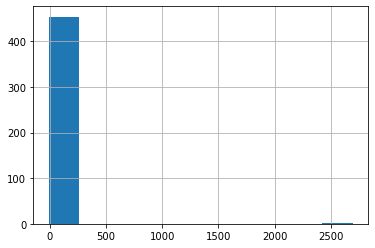

In [18]:
db.utility_mean.hist()

<AxesSubplot:>

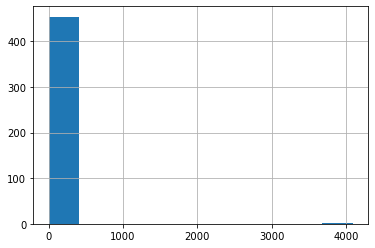

In [19]:
db.utility_median.hist()

In [20]:
db_MaxF.describe()

,utility_mean,utility_median
count,373.000000,373.000000
mean,1.341438,1.798597
std,1.004256,7.064549
min,-9.352523,-1.989955
25%,1.103345,1.060461
50%,1.210682,1.137931
75%,1.427015,1.322034
max,6.842966,134.500000


<AxesSubplot:>

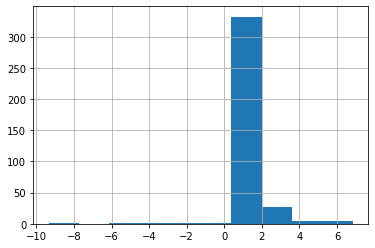

In [21]:
db_MaxF.utility_mean.hist()

<AxesSubplot:>

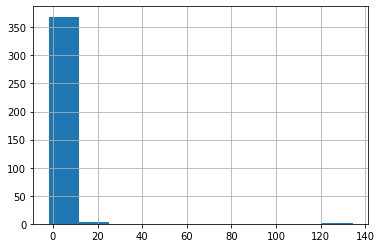

In [22]:
db_MaxF.utility_median.hist()